Fonte dos dados da SP 500
https://www.suredividend.com/sp-500-stocks/

Fonte dos dados dos valores das acoes do SP 500
https://github.com/CNuge/kaggle-code/blob/master/stock_data/all_stocks_5yr.csv

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
from scipy.stats import norm

In [3]:
dados = pd.read_csv('all_stocks_5yr.csv')
dados.head()

,date,open,high,low,close,volume,Name
0,2013-02-08,15.07,15.12,14.63,14.75,8407500,AAL
1,2013-02-11,14.89,15.01,14.26,14.46,8882000,AAL
2,2013-02-12,14.45,14.51,14.10,14.27,8126000,AAL
3,2013-02-13,14.30,14.94,14.25,14.66,10259500,AAL
4,2013-02-14,14.94,14.96,13.16,13.99,31879900,AAL


In [4]:
label = pd.read_excel('sp_500_stocks.xlsx')
label

,Ticker,Name,Price,Dividend Yield,Market Cap ($M),P/E Ratio,Payout Ratio
0,A,Agilent Technologies Inc.,66.600,0.008835,2.150419e+04,25.132075,0.222038
1,AAL,American Airlines Group Inc.,33.820,0.012019,1.532575e+04,7.120000,0.085577
2,AAP,Advance Auto Parts Inc W/I,156.390,0.001425,1.247306e+04,24.942584,0.035554
3,AAPL,Apple Inc.,219.690,0.013144,1.072968e+06,19.917498,0.261801
4,ABBV,AbbVie Inc.,90.960,0.041780,1.391768e+05,13.455621,0.562176
5,ABC,AmerisourceBergen Corporation,93.080,0.016420,2.002813e+04,14.635220,0.240310
6,ABMD,ABIOMED Inc.,387.150,0.000000,1.736208e+04,201.640625,0.000000
7,ABT,Abbott Laboratories,69.290,0.015786,1.244690e+05,25.474265,0.402131
8,ACN,Accenture plc Class A (Ireland),158.015,0.018114,1.031519e+05,23.797440,0.431070
9,ADBE,Adobe Inc.,256.450,0.000000,1.272418e+05,49.990253,0.000000


In [5]:
# retirando as ultimas linhas que sao desnecessarias
label = label.drop(axis=1,index=[505,506,507])

In [6]:
label.tail()

,Ticker,Name,Price,Dividend Yield,Market Cap ($M),P/E Ratio,Payout Ratio
500,XYL,Xylem Inc. New,70.80,0.011707,12887.570047,26.716981,0.312784
501,YUM,Yum! Brands Inc.,90.32,0.015924,28698.474504,26.880952,0.428050
502,ZBH,Zimmer Biomet Holdings Inc.,127.24,0.007519,25981.056602,16.632680,0.125058
503,ZION,Zions Bancorporation N.A.,47.50,0.024912,9364.383406,13.571429,0.338088
504,ZTS,Zoetis Inc. Class A,91.59,0.005490,44236.243353,32.024476,0.175801


In [7]:
dados['Name'].unique().size

505

In [8]:
dados[dados['Name'] == 'ALL'].head()

,date,open,high,low,close,volume,Name
35056,2013-02-08,45.05,45.29,44.89,45.14,3510945,ALL
35057,2013-02-11,45.03,45.45,44.91,45.25,2357686,ALL
35058,2013-02-12,45.19,45.67,45.15,45.61,2702968,ALL
35059,2013-02-13,45.59,45.91,45.48,45.88,2424640,ALL
35060,2013-02-14,45.68,46.08,45.46,45.88,3968755,ALL


In [9]:
dados[dados['Name'] == 'ALL'].tail()

,date,open,high,low,close,volume,Name
36310,2018-02-01,98.57,99.350,98.0100,98.72,2422471,ALL
36311,2018-02-02,98.62,100.060,97.8400,97.94,2300754,ALL
36312,2018-02-05,97.27,98.690,95.0200,95.02,4883538,ALL
36313,2018-02-06,93.65,96.970,92.7200,96.60,4312430,ALL
36314,2018-02-07,96.14,98.295,95.9151,96.87,3174347,ALL


In [10]:
max_retornos = pd.DataFrame(columns = ["Name", "Retorno", "Risco"])
max_retornos

,Name,Retorno,Risco


In [11]:
dados[dados['Name'] == 'ALL']['close'].values.std()

14.191485197354707

In [12]:
dados['Name'].unique()[1]

'AAPL'

In [13]:
df = pd.DataFrame(columns = ["Name", "Retorno", "Risco"])
for i in range(dados['Name'].unique().size):
    name = dados['Name'].unique()[i]
    teste = (name , np.log(dados[dados['Name'] == name]['close']/dados[dados['Name'] == name]['close'].shift(1)).sum(), dados[dados['Name'] == name]['close'].values.std())
    resultado = pd.DataFrame([[teste[0],teste[1], teste[2]]], columns=["Name", "Retorno", "Risco"])
    df = df.append(resultado)
df

,Name,Retorno,Risco
0,AAL,1.248395,10.953283
0,AAPL,0.854933,30.544674
0,AAP,0.331663,31.262040
0,ABBV,1.142420,13.724926
0,ABC,0.697828,16.309209
0,ABT,0.533581,5.857841
0,ACN,0.749695,22.120240
0,ADBE,1.592631,36.983077
0,ADI,0.624662,13.378315
0,ADM,0.333679,5.195005


In [14]:
max_retorno = df.sort_values('Retorno', ascending=False).iloc[:6]
max_retorno

,Name,Retorno,Risco
0,NVDA,2.917574,59.600958
0,NFLX,2.325649,50.695874
0,ALGN,1.968438,53.691891
0,EA,1.957846,30.636844
0,STZ,1.905639,50.068931
0,AVGO,1.905213,71.387854


In [15]:
max_risco = df.sort_values('Risco', ascending=False).iloc[:8]
max_risco

,Name,Retorno,Risco
0,PCLN,0.988186,320.406151
0,AMZN,1.687988,282.388180
0,GOOGL,0.987677,187.499384
0,GOOG,0.630009,166.335163
0,MTD,1.065685,131.345026
0,AZO,0.635202,130.697660
0,CMG,-0.163995,130.228874
0,EQIX,0.662319,95.174985


In [16]:
max_retorno['Name'].values[0] in label['Ticker'].values

True

In [17]:
for i in range(6):
    print(label[label['Ticker'] == max_retorno['Name'].values[i]]['Name'].values)

['NVIDIA Corporation']
['Netflix Inc.']
['Align Technology Inc.']
['Electronic Arts Inc.']
['Constellation Brands Inc.']
['Broadcom Inc.']


In [18]:
for i in range(8):
    print(label[label['Ticker'] == max_risco['Name'].values[i]]['Name'].values)

[]
['Amazon.com Inc.']
['Alphabet Inc.']
['Alphabet Inc.']
['Mettler-Toledo International Inc.']
['AutoZone Inc.']
['Chipotle Mexican Grill Inc.']
['Equinix Inc.']


In [19]:
np.delete(max_risco['Name'].values[1:], 2)

array(['AMZN', 'GOOGL', 'MTD', 'AZO', 'CMG', 'EQIX'], dtype=object)

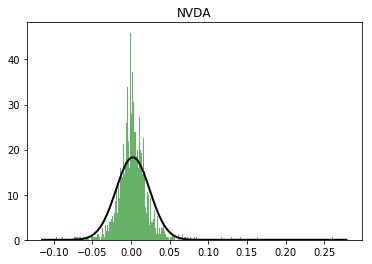

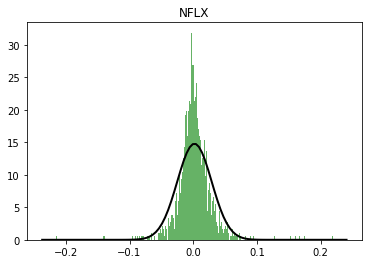

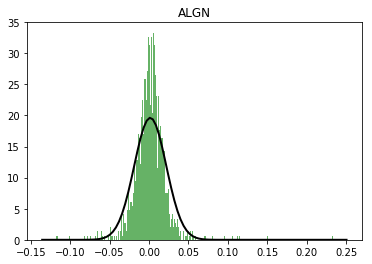

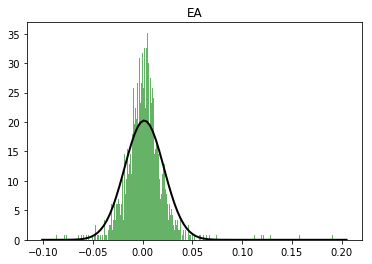

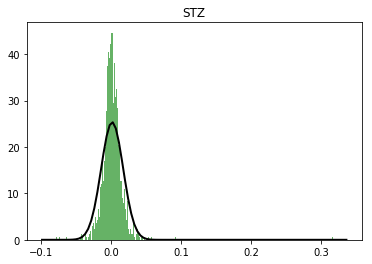

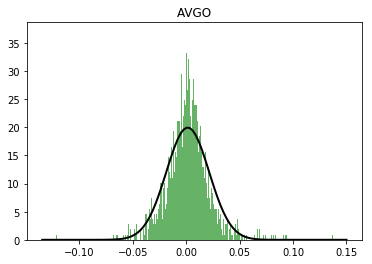

In [20]:
for name in max_retorno['Name']:
    data = np.log(dados[dados['Name'] == name]['close']/dados[dados['Name'] == name]['close'].shift(1)).values[1:]

    mu, std = norm.fit(data)
    mu, std = (data.mean(), data.std())
    # Plot the histogram.
    plt.hist(data, bins=300, density=True, alpha=0.6, color='g')


    # Plot the PDF.
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)
    plt.plot(x, p, 'k', linewidth=2)
    title = str(name)
    plt.title(title)

    plt.show()

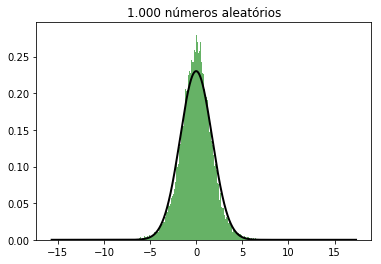

In [21]:
# importando as bibliotecas
import numpy as np
from scipy.stats import norm
from scipy.ndimage.interpolation import shift

# criando os valores aleatórios
np.random.seed(10)
aleatorios = np.random.rand(1000000)
aleatorios2 = shift(aleatorios, 1, cval=np.NaN)

# normalizando médias, desvios e dados
data = norm.rvs(np.log(aleatorios/aleatorios2)[1:])
mu, std = norm.fit(data)
mu, std = (data.mean(), data.std())

# plotando histograma
plt.hist(data, bins=10000, density=True, alpha=0.6, color='g')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 10000)
p = norm.pdf(x, mu, std)

# plotando curva normal
plt.plot(x, 1*p, 'k', linewidth=2)
title = "1.000 números aleatórios"
plt.title(title)
plt.show()

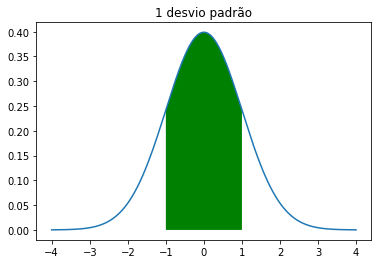

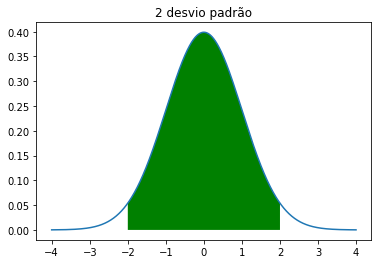

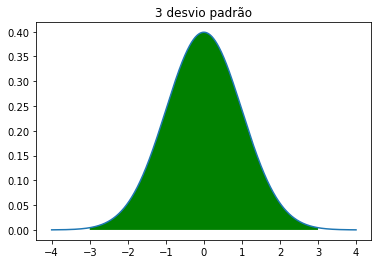

In [22]:
def desenhar_desvio(x, cond, mu, sigma, title):
    y = norm.pdf(x, mu, sigma)
    z = x[cond]
    plt.plot(x, y)
    plt.fill_between(z, 0, norm.pdf(z, mu, sigma),facecolor='green')
    plt.title(title)
    plt.show()
x = np.arange(-4,4,0.001)
for i in range(1,4):
    std = i
    desenhar_desvio(x, (-std < x) & (x < std), 0, 1, str(i) + ' desvio padrão')


In [25]:
max_retorno['Name'].values

array(['NVDA', 'NFLX', 'ALGN', 'EA', 'STZ', 'AVGO'], dtype=object)

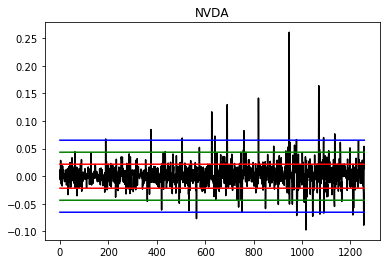

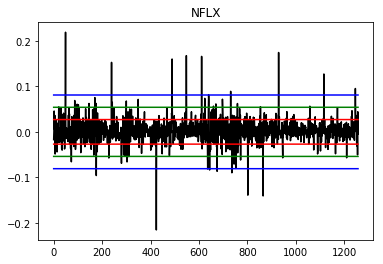

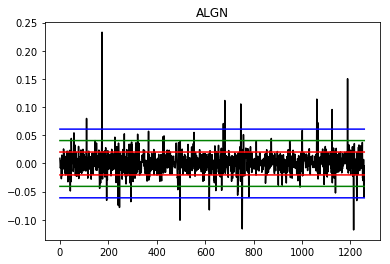

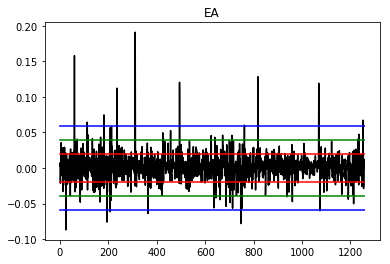

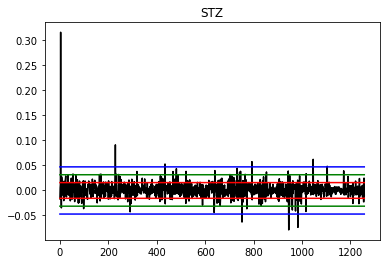

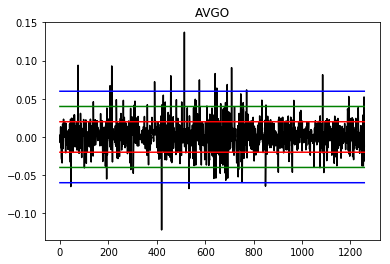

In [26]:
for names in max_retorno['Name'].values:
    name = names
    x = np.log(dados[dados['Name'] == name]['close']/
               dados[dados['Name'] == name]['close'].shift(1)).values[1:].std()
    y = np.array([x for i in range(np.log(dados[dados['Name'] == name]
                                 ['close']/dados[dados['Name'] == name]
                                 ['close'].shift(1)).values[1:].size)])
    

    
    plt.title(names)
    plt.plot(np.log(dados[dados['Name'] == name]
                    ['close']/dados[dados['Name'] == name]
                    ['close'].shift(1)).values[1:], color='black')

        # 1 desvio
    plt.plot(y, color='r')
    plt.plot(-1*y, color='r')
    
    # 2 desvios
    plt.plot(2*y, color='green')
    plt.plot(-2*y, color='green')
    
    # 3 desvios
    plt.plot(3*y, color='blue')
    plt.plot(-3*y, color='blue')
    
    plt.show()

In [27]:
max_risco['Name'].values

array(['PCLN', 'AMZN', 'GOOGL', 'GOOG', 'MTD', 'AZO', 'CMG', 'EQIX'], dtype=object)

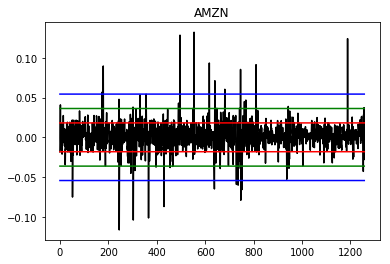

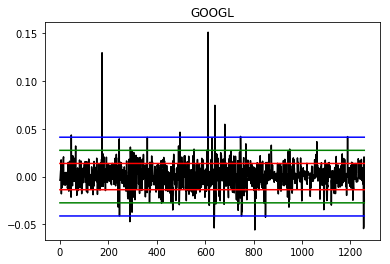

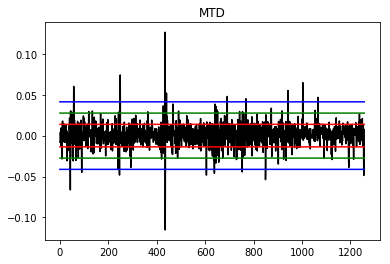

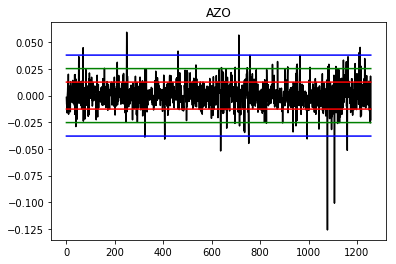

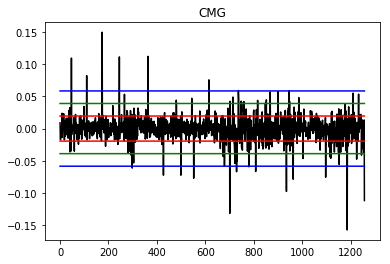

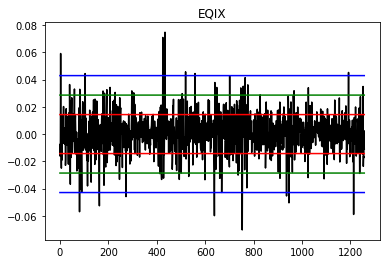

In [28]:
for names in ['AMZN', 'GOOGL', 'MTD', 'AZO', 'CMG', 'EQIX']:
    name = names
    x = np.log(dados[dados['Name'] == name]['close']/
               dados[dados['Name'] == name]['close'].shift(1)).values[1:].std()
    y = np.array([x for i in range(np.log(dados[dados['Name'] == name]
                                 ['close']/dados[dados['Name'] == name]
                                 ['close'].shift(1)).values[1:].size)])
    

    
    plt.title(names)
    plt.plot(np.log(dados[dados['Name'] == name]
                    ['close']/dados[dados['Name'] == name]
                    ['close'].shift(1)).values[1:], color='black')

        # 1 desvio
    plt.plot(y, color='r')
    plt.plot(-1*y, color='r')
    
    # 2 desvios
    plt.plot(2*y, color='green')
    plt.plot(-2*y, color='green')
    
    # 3 desvios
    plt.plot(3*y, color='blue')
    plt.plot(-3*y, color='blue')
    
    plt.show()

## Calculando o numero de desvios

In [29]:
desvio1 = 0
desvio2 = 0
desvio3 = 0
for name in ['AMZN', 'GOOGL', 'MTD', 'AZO', 'CMG', 'EQIX']:

    data = np.log(dados[dados['Name'] == name]['close']/
               dados[dados['Name'] == name]['close'].shift(1)).values[1:]
    media = data.mean()
    desvio = data.std()
    print('A ação {} teve:'.format(name))
    for i in range(data.size):
        if abs(data[i]) > desvio:
            desvio1 += 1
        if abs(data[i]) > 2*desvio:
            desvio2 += 1
        if abs(data[i]) > 3*desvio:
            desvio3 += 1
    dif1 = (1-.68)*data.size
    dif2 = (1-.95)*data.size
    dif3 = (1-.98)*data.size
    print('{} valores acima de 1 desvio padrão onde o permitido seria {}. {} '
          .format(desvio1, round(dif1), 'Ok.' if desvio1 < round(dif1) 
                  else 'Dados fora da normalidade. {}% acima.'
                  .format(round(100*(desvio1-dif1)/dif1,2))))
    print('{} valores acima de 2 desvio padrão onde o permitido seria {}. {}'
          .format(desvio2, round(dif2),  'Ok.' if desvio2 < round(dif2) 
                  else 'Dados fora da normalidade. {}% acima.'
                  .format(round(100*(desvio2-dif2)/dif2,2))))
    print('{} valores acima de 3 desvio padrão onde o permitido seria {}. {}'
          .format(desvio3, round(dif3),  'Ok.' if desvio3 < round(dif3) 
                  else 'Dados fora da normalidade. {}% acima.'
                  .format(round(100*(desvio3-dif3)/dif3,2))))
    print('')
    desvio1 = 0
    desvio2 = 0
    desvio3 = 0


A ação AMZN teve:
251 valores acima de 1 desvio padrão onde o permitido seria 403. Ok. 
47 valores acima de 2 desvio padrão onde o permitido seria 63. Ok.
20 valores acima de 3 desvio padrão onde o permitido seria 25. Ok.

A ação GOOGL teve:
288 valores acima de 1 desvio padrão onde o permitido seria 403. Ok. 
47 valores acima de 2 desvio padrão onde o permitido seria 63. Ok.
15 valores acima de 3 desvio padrão onde o permitido seria 25. Ok.

A ação MTD teve:
283 valores acima de 1 desvio padrão onde o permitido seria 403. Ok. 
60 valores acima de 2 desvio padrão onde o permitido seria 63. Ok.
18 valores acima de 3 desvio padrão onde o permitido seria 25. Ok.

A ação AZO teve:
286 valores acima de 1 desvio padrão onde o permitido seria 403. Ok. 
57 valores acima de 2 desvio padrão onde o permitido seria 63. Ok.
14 valores acima de 3 desvio padrão onde o permitido seria 25. Ok.

A ação CMG teve:
230 valores acima de 1 desvio padrão onde o permitido seria 403. Ok. 
53 valores acima de 2 

In [322]:
desvio1 = 0
desvio2 = 0
desvio3 = 0
for name in ['AMZN', 'GOOGL', 'MTD', 'AZO', 'CMG', 'EQIX']:

    data = np.log(dados[dados['Name'] == name]['close']/
               dados[dados['Name'] == name]['close'].shift(1)).values[1:]
    media = data.mean()
    desvio = data.std()
    print('A ação {} teve:'.format(name))
    for i in range(data.size):
        if abs(data[i]) > desvio:
            desvio1 += 1
        if abs(data[i]) > 2*desvio:
            desvio2 += 1
        if abs(data[i]) > 3*desvio:
            desvio3 += 1
    dif1 = (1-.68)*data.size
    dif2 = (1-.9544)*data.size
    dif3 = (1-.9974)*data.size
    print('{} valores acima de 1 desvio padrão onde o permitido seria {}. {} '
          .format(desvio1, round(dif1), 'Ok.' if desvio1 < round(dif1) 
                  else 'Dados fora da normalidade. {}% acima.'
                  .format(round(100*(desvio1-dif1)/dif1,2))))
    print('{} valores acima de 2 desvio padrão onde o permitido seria {}. {}'
          .format(desvio2, round(dif2),  'Ok.' if round(desvio2) <= round(dif2) 
                  else 'Dados fora da normalidade. {}% acima.'
                  .format(round(100*(desvio2-dif2)/dif2,2))))
    print('{} valores acima de 3 desvio padrão onde o permitido seria {}. {}'
          .format(desvio3, round(dif3),  'Ok.' if desvio3 < round(dif3) 
                  else 'Dados fora da normalidade. {}% acima.'
                  .format(round(100*(desvio3-dif3)/dif3,2))))
    print('')
    desvio1 = 0
    desvio2 = 0
    desvio3 = 0


A ação AMZN teve:
251 valores acima de 1 desvio padrão onde o permitido seria 403. Ok. 
47 valores acima de 2 desvio padrão onde o permitido seria 57. Ok.
20 valores acima de 3 desvio padrão onde o permitido seria 3. Dados fora da normalidade. 511.47% acima.

A ação GOOGL teve:
288 valores acima de 1 desvio padrão onde o permitido seria 403. Ok. 
47 valores acima de 2 desvio padrão onde o permitido seria 57. Ok.
15 valores acima de 3 desvio padrão onde o permitido seria 3. Dados fora da normalidade. 358.6% acima.

A ação MTD teve:
283 valores acima de 1 desvio padrão onde o permitido seria 403. Ok. 
60 valores acima de 2 desvio padrão onde o permitido seria 57. Dados fora da normalidade. 4.59% acima.
18 valores acima de 3 desvio padrão onde o permitido seria 3. Dados fora da normalidade. 450.32% acima.

A ação AZO teve:
286 valores acima de 1 desvio padrão onde o permitido seria 403. Ok. 
57 valores acima de 2 desvio padrão onde o permitido seria 57. Ok.
14 valores acima de 3 desvio pa

In [30]:
desvio1 = 0
desvio2 = 0
desvio3 = 0
for name in ['NVDA', 'NFLX', 'ALGN', 'EA', 'STZ', 'AVGO']:

    data = np.log(dados[dados['Name'] == name]['close']/
               dados[dados['Name'] == name]['close'].shift(1)).values[1:]
    media = data.mean()
    desvio = data.std()
    print('A ação {} teve:'.format(name))
    for i in range(data.size):
        if abs(data[i]) > desvio:
            desvio1 += 1
        if abs(data[i]) > 2*desvio:
            desvio2 += 1
        if abs(data[i]) > 3*desvio:
            desvio3 += 1
    dif1 = (1-.68)*data.size
    dif2 = (1-.95)*data.size
    dif3 = (1-.98)*data.size
    print('{} valores acima de 1 desvio padrão onde o permitido seria {}. {} '
          .format(desvio1, round(dif1), 'Ok.' if desvio1 < round(dif1) 
                  else 'Dados fora da normalidade. {}% acima.'
                  .format(round(100*(desvio1-dif1)/dif1,2))))
    print('{} valores acima de 2 desvio padrão onde o permitido seria {}. {}'
          .format(desvio2, round(dif2),  'Ok.' if desvio2 < round(dif2) 
                  else 'Dados fora da normalidade. {}% acima.'
                  .format(round(100*(desvio2-dif2)/dif2,2))))
    print('{} valores acima de 3 desvio padrão onde o permitido seria {}. {}'
          .format(desvio3, round(dif3),  'Ok.' if desvio3 < round(dif3) 
                  else 'Dados fora da normalidade. {}% acima.'
                  .format(round(100*(desvio3-dif3)/dif3,2))))
    print('')
    desvio1 = 0
    desvio2 = 0
    desvio3 = 0
    

A ação NVDA teve:
233 valores acima de 1 desvio padrão onde o permitido seria 403. Ok. 
53 valores acima de 2 desvio padrão onde o permitido seria 63. Ok.
21 valores acima de 3 desvio padrão onde o permitido seria 25. Ok.

A ação NFLX teve:
240 valores acima de 1 desvio padrão onde o permitido seria 403. Ok. 
49 valores acima de 2 desvio padrão onde o permitido seria 63. Ok.
18 valores acima de 3 desvio padrão onde o permitido seria 25. Ok.

A ação ALGN teve:
232 valores acima de 1 desvio padrão onde o permitido seria 403. Ok. 
43 valores acima de 2 desvio padrão onde o permitido seria 63. Ok.
18 valores acima de 3 desvio padrão onde o permitido seria 25. Ok.

A ação EA teve:
275 valores acima de 1 desvio padrão onde o permitido seria 403. Ok. 
45 valores acima de 2 desvio padrão onde o permitido seria 63. Ok.
16 valores acima de 3 desvio padrão onde o permitido seria 25. Ok.

A ação STZ teve:
207 valores acima de 1 desvio padrão onde o permitido seria 403. Ok. 
37 valores acima de 2 d

In [320]:
desvio1 = 0
desvio2 = 0
desvio3 = 0
for name in ['NVDA', 'NFLX', 'ALGN', 'EA', 'STZ', 'AVGO']:

    data = np.log(dados[dados['Name'] == name]['close']/
               dados[dados['Name'] == name]['close'].shift(1)).values[1:]
    media = data.mean()
    desvio = data.std()
    print('A ação {} teve:'.format(name))
    for i in range(data.size):
        if abs(data[i]) > desvio:
            desvio1 += 1
        if abs(data[i]) > 2*desvio:
            desvio2 += 1
        if abs(data[i]) > 3*desvio:
            desvio3 += 1
    dif1 = (1-.68)*data.size
    dif2 = (1-.9544)*data.size
    dif3 = (1-.9974)*data.size
    print('{} valores acima de 1 desvio padrão onde o permitido seria {}. {} '
          .format(desvio1, round(dif1), 'Ok.' if desvio1 < round(dif1) 
                  else 'Dados fora da normalidade. {}% acima.'
                  .format(round(100*(desvio1-dif1)/dif1,2))))
    print('{} valores acima de 2 desvio padrão onde o permitido seria {}. {}'
          .format(desvio2, round(dif2),  'Ok.' if desvio2 < round(dif2) 
                  else 'Dados fora da normalidade. {}% acima.'
                  .format(round(100*(desvio2-dif2)/dif2,2))))
    print('{} valores acima de 3 desvio padrão onde o permitido seria {}. {}'
          .format(desvio3, round(dif3),  'Ok.' if desvio3 < round(dif3) 
                  else 'Dados fora da normalidade. {}% acima.'
                  .format(round(100*(desvio3-dif3)/dif3,2))))
    print('')
    desvio1 = 0
    desvio2 = 0
    desvio3 = 0
    

A ação NVDA teve:
233 valores acima de 1 desvio padrão onde o permitido seria 403. Ok. 
53 valores acima de 2 desvio padrão onde o permitido seria 57. Ok.
21 valores acima de 3 desvio padrão onde o permitido seria 3. Dados fora da normalidade. 542.04% acima.

A ação NFLX teve:
240 valores acima de 1 desvio padrão onde o permitido seria 403. Ok. 
49 valores acima de 2 desvio padrão onde o permitido seria 57. Ok.
18 valores acima de 3 desvio padrão onde o permitido seria 3. Dados fora da normalidade. 450.32% acima.

A ação ALGN teve:
232 valores acima de 1 desvio padrão onde o permitido seria 403. Ok. 
43 valores acima de 2 desvio padrão onde o permitido seria 57. Ok.
18 valores acima de 3 desvio padrão onde o permitido seria 3. Dados fora da normalidade. 450.32% acima.

A ação EA teve:
275 valores acima de 1 desvio padrão onde o permitido seria 403. Ok. 
45 valores acima de 2 desvio padrão onde o permitido seria 57. Ok.
16 valores acima de 3 desvio padrão onde o permitido seria 3. Dados

## Plotando Histogramas

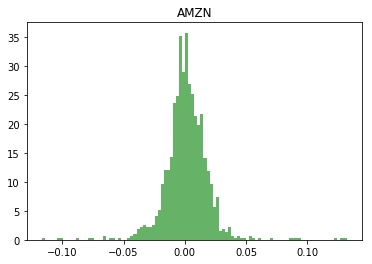

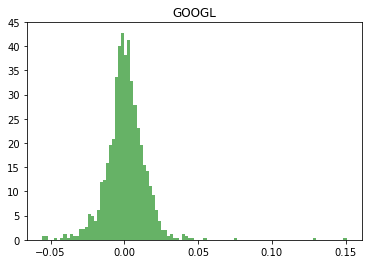

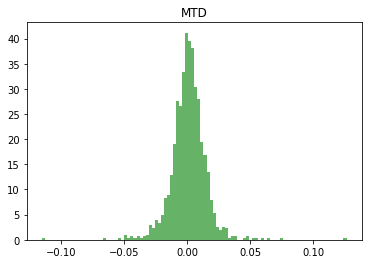

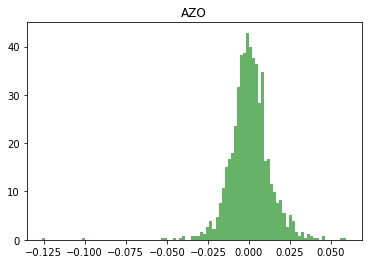

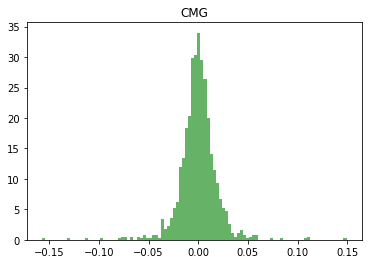

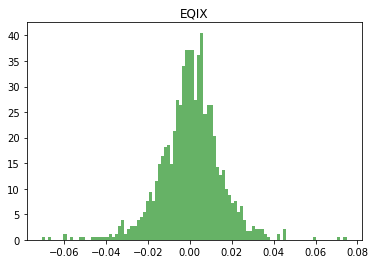

In [33]:
for name in ['AMZN', 'GOOGL', 'MTD', 'AZO', 'CMG', 'EQIX']:
    data = np.log(dados[dados['Name'] == name]['close']/
                  dados[dados['Name'] == name]['close'].shift(1)).values[1:]
    plt.hist(data, bins=100, density=True, alpha=0.6, color='g')
    plt.title(str(name))
    plt.show()

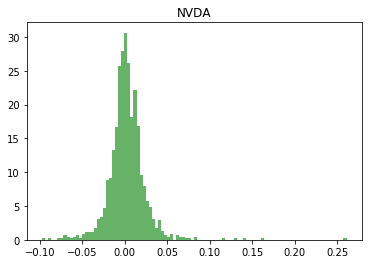

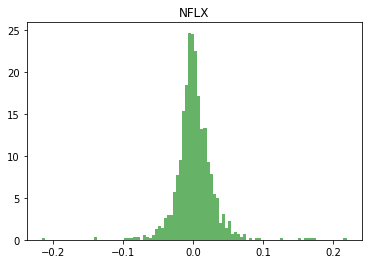

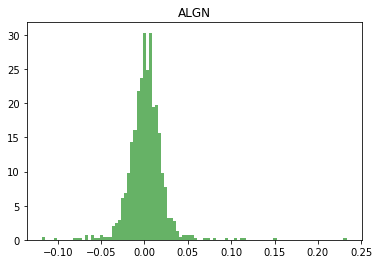

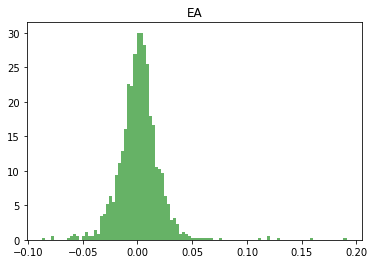

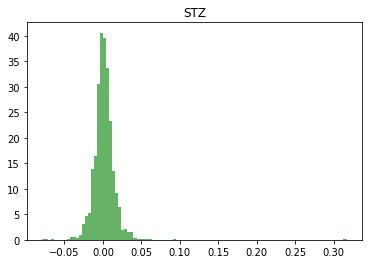

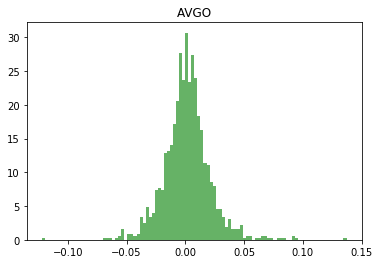

In [34]:
for name in ['NVDA', 'NFLX', 'ALGN', 'EA', 'STZ', 'AVGO']:
    data = np.log(dados[dados['Name'] == name]['close']/
                  dados[dados['Name'] == name]['close'].shift(1)).values[1:]
    plt.hist(data, bins=100, density=True, alpha=0.6, color='g')
    plt.title(str(name))
    plt.show()

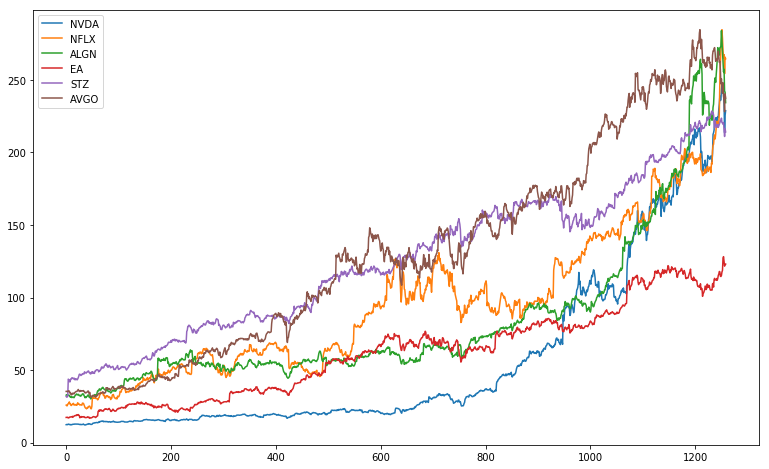

In [35]:
for name in ['NVDA', 'NFLX', 'ALGN', 'EA', 'STZ', 'AVGO']:
    dados[dados['Name'] == name]['close'].reset_index(drop=True).plot(figsize=(13, 8))
    plt.legend(['NVDA', 'NFLX', 'ALGN', 'EA', 'STZ', 'AVGO'])

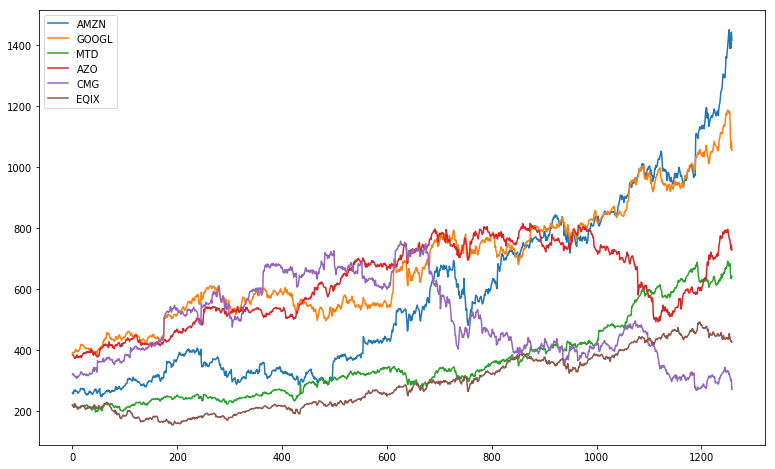

In [36]:
for name in ['AMZN', 'GOOGL', 'MTD', 'AZO', 'CMG', 'EQIX']:
    dados[dados['Name'] == name]['close'].reset_index(drop=True).plot(figsize=(13, 8))
    plt.legend(['AMZN', 'GOOGL', 'MTD', 'AZO', 'CMG', 'EQIX'])

In [37]:
zeros = np.zeros([1259,6])

name = ['AMZN', 'GOOGL', 'MTD', 'AZO', 'CMG', 'EQIX']

for j in range(1259):
    for i in range(6):
        zeros[j,i] = dados[dados['Name'] == name[i]]['close'].reset_index(drop=True).values[j]
        
zeros

array([[  261.95  ,   393.0777,   221.15  ,   385.89  ,   320.72  ,
          219.71  ],
       [  257.21  ,   391.6012,   219.37  ,   385.23  ,   323.56  ,
          218.03  ],
       [  258.7   ,   390.7403,   217.99  ,   382.09  ,   322.51  ,
          214.53  ],
       ..., 
       [ 1390.    ,  1062.39  ,   635.5   ,   731.59  ,   300.3   ,
          429.81  ],
       [ 1442.84  ,  1084.43  ,   637.28  ,   745.07  ,   304.33  ,
          430.85  ],
       [ 1416.78  ,  1055.41  ,   641.96  ,   728.33  ,   272.21  ,
          426.08  ]])

In [38]:
ris_usa = pd.DataFrame(zeros, index = dados['date'].unique(), columns=['AMZN', 'GOOGL', 'MTD', 'AZO', 'CMG', 'EQIX'])
ris_usa

,AMZN,GOOGL,MTD,AZO,CMG,EQIX
2013-02-08,261.950,393.0777,221.15,385.89,320.72,219.710
2013-02-11,257.210,391.6012,219.37,385.23,323.56,218.030
2013-02-12,258.700,390.7403,217.99,382.09,322.51,214.530
2013-02-13,269.470,391.8214,218.94,379.73,317.01,213.020
2013-02-14,269.240,394.3039,217.75,373.61,317.72,226.000
2013-02-15,265.090,396.8414,215.14,373.70,314.19,224.530
2013-02-19,269.750,403.8284,217.15,375.21,313.05,221.082
2013-02-20,266.410,396.6262,214.67,379.96,309.49,215.620
2013-02-21,265.940,398.1628,212.80,377.56,308.13,214.010
2013-02-22,265.420,400.2549,212.59,385.20,315.51,214.210


In [39]:
zerosl = np.zeros([1259,6])

name = ['NVDA', 'NFLX', 'ALGN', 'EA', 'STZ', 'AVGO']

for j in range(1259):
    for i in range(6):
        zerosl[j,i] = dados[dados['Name'] == name[i]]['close'].reset_index(drop=True).values[j]
        
zerosl

array([[  12.37  ,   25.8528,   32.73  ,   17.37  ,   31.85  ,   35.32  ],
       [  12.51  ,   25.4128,   33.03  ,   17.41  ,   31.32  ,   35.4   ],
       [  12.43  ,   25.4214,   33.02  ,   17.54  ,   31.49  ,   35.14  ],
       ..., 
       [ 213.7   ,  254.26  ,  242.4   ,  121.64  ,  211.    ,  228.1   ],
       [ 225.58  ,  265.72  ,  241.45  ,  123.13  ,  216.29  ,  240.38  ],
       [ 228.8   ,  264.56  ,  234.33  ,  123.05  ,  214.15  ,  237.38  ]])

In [40]:
ret_usa = pd.DataFrame(zerosl, index = dados['date'].unique(), columns=['NVDA', 'NFLX', 'ALGN', 'EA', 'STZ', 'AVGO'])
ret_usa

,NVDA,NFLX,ALGN,EA,STZ,AVGO
2013-02-08,12.370,25.8528,32.73,17.370,31.85,35.320
2013-02-11,12.510,25.4128,33.03,17.410,31.32,35.400
2013-02-12,12.430,25.4214,33.02,17.540,31.49,35.140
2013-02-13,12.370,26.6098,32.75,17.170,31.88,35.170
2013-02-14,12.730,26.7714,32.56,17.150,43.75,35.640
2013-02-15,12.731,27.0731,32.73,16.970,43.39,35.140
2013-02-19,12.555,28.0643,32.60,17.585,43.28,35.545
2013-02-20,12.380,26.7314,31.73,17.480,41.80,34.670
2013-02-21,12.290,26.7357,31.41,17.640,42.96,33.670
2013-02-22,12.520,25.6943,31.88,17.810,43.96,34.090


# Inicio do Calculo de Monte Carlo

In [41]:
log_retorno_ris_usa = np.log(ris_usa/ris_usa.shift(1))
log_retorno_ris_usa.cov()

,AMZN,GOOGL,MTD,AZO,CMG,EQIX
AMZN,0.000329,0.000137,0.000085,0.000047,0.000059,0.000083
GOOGL,0.000137,0.000188,0.000073,0.000040,0.000065,0.000070
MTD,0.000085,0.000073,0.000189,0.000047,0.000048,0.000076
AZO,0.000047,0.000040,0.000047,0.000160,0.000047,0.000042
CMG,0.000059,0.000065,0.000048,0.000047,0.000378,0.000031
EQIX,0.000083,0.000070,0.000076,0.000042,0.000031,0.000205


In [42]:
log_retorno_ret_usa = np.log(ret_usa/ret_usa.shift(1))
log_retorno_ret_usa.cov()

,NVDA,NFLX,ALGN,EA,STZ,AVGO
NVDA,0.000474,0.000146,0.000122,0.000127,0.000068,0.000185
NFLX,0.000146,0.000728,0.000100,0.000103,0.000079,0.000151
ALGN,0.000122,0.000100,0.000414,0.000079,0.000060,0.000144
EA,0.000127,0.000103,0.000079,0.000388,0.000056,0.000115
STZ,0.000068,0.000079,0.000060,0.000056,0.000248,0.000069
AVGO,0.000185,0.000151,0.000144,0.000115,0.000069,0.000399


## Simulação:

In [227]:
log_retorno_ret_usa.columns

Index(['NVDA', 'NFLX', 'ALGN', 'EA', 'STZ', 'AVGO'], dtype='object')

In [228]:
df_retornos1 = pd.DataFrame()
df_variancias1 = pd.DataFrame()
df_pesos = pd.DataFrame()
dat1 = pd.DataFrame()

In [229]:
# formula nova
np.random.seed(10)
for i in range(3):
    # definindo os pesos
    pesos = np.random.random(len(log_retorno_ret_usa.columns))
    print('Aleatórios {}: '.format(i+1)+str(pesos))
    pesos /= np.sum(pesos)
    print('% de cada aleatório: '+str(pesos))
    print()
    df_pesos = df_pesos.append([pesos], ignore_index=True)
    # definindo os retornos 
    df_retornos1 = df_retornos1.append([np.sum(log_retorno_ret_usa.mean()*pesos)*252], ignore_index=True)
    # definindo as variancias
    df_variancias1 = df_variancias1.append([np.sqrt(np.dot(pesos.T,np.dot(log_retorno_ret_usa.cov()*252,pesos)))], ignore_index=True)

df_pesos.columns = ['NVDA', 'NFLX', 'ALGN', 'EA', 'STZ', 'AVGO']

dat1 = pd.concat([df_variancias1, df_retornos1, df_pesos], axis=1, ignore_index=True)
dat1.columns = ['Risco','Retorno','NVDA', 'NFLX', 'ALGN', 'EA', 'STZ', 'AVGO']

Aleatórios 1: [ 0.77132064  0.02075195  0.63364823  0.74880388  0.49850701  0.22479665]
% de cada aleatório: [ 0.26617196  0.00716121  0.21866313  0.25840174  0.17202779  0.07757418]

Aleatórios 2: [ 0.19806286  0.76053071  0.16911084  0.08833981  0.68535982  0.95339335]
% de cada aleatório: [ 0.06937896  0.26640444  0.05923742  0.03094434  0.24007302  0.33396182]

Aleatórios 3: [ 0.00394827  0.51219226  0.81262096  0.61252607  0.72175532  0.29187607]
% de cada aleatório: [ 0.00133617  0.17333547  0.27500618  0.20729031  0.24425554  0.09877634]



In [230]:
dat1

,Risco,Retorno,NVDA,NFLX,ALGN,EA,STZ,AVGO
0,0.20,0.44,0.27,0.01,0.22,0.26,0.17,0.08
1,0.22,0.42,0.07,0.27,0.06,0.03,0.24,0.33
2,0.20,0.40,0.00,0.17,0.28,0.21,0.24,0.10


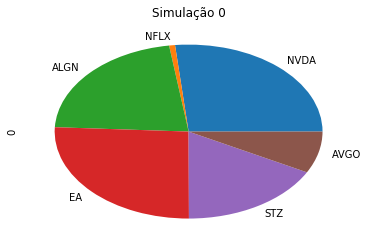

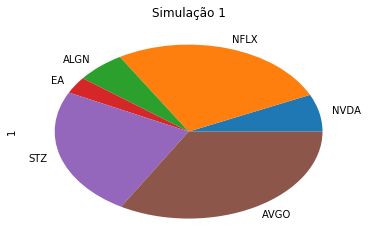

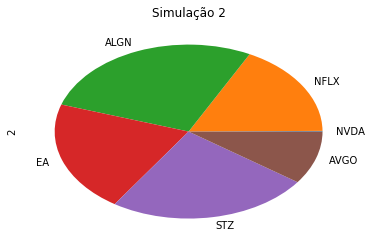

In [231]:
for i in range(3):
    df_pesos.iloc[i].plot(kind='pie')
    plt.title('Simulação {}'.format(i))
    plt.show()

In [232]:
log_retorno_ris_usa.columns

Index(['AMZN', 'GOOGL', 'MTD', 'AZO', 'CMG', 'EQIX'], dtype='object')

In [309]:
df_retornos1 = pd.DataFrame()
df_variancias1 = pd.DataFrame()
df_pesos = pd.DataFrame()
dat1 = pd.DataFrame()

In [310]:
# formula nova
np.random.seed(10)
for i in range(3):
    pesos = np.random.random(len(log_retorno_ris_usa.columns))
    print('Aleatórios {}: '.format(i+1)+str(pesos))
    pesos /= np.sum(pesos)
    print('% de cada aleatório: '+str(pesos))
    print()
    df_pesos = df_pesos.append([pesos], ignore_index=True)
    df_retornos1 = df_retornos1.append([np.sum(log_retorno_ris_usa.mean()*pesos)*252], ignore_index=True)
    df_variancias1 = df_variancias1.append([np.sqrt(np.dot(pesos.T,np.dot(log_retorno_ris_usa.cov()*252,pesos)))], ignore_index=True)

df_pesos.columns = ['AMZN', 'GOOGL', 'MTD', 'AZO', 'CMG', 'EQIX']

dat1 = pd.concat([df_variancias1, df_retornos1, df_pesos], axis=1, ignore_index=True)
dat1.columns = ['Risco','Retorno','AMZN', 'GOOGL', 'MTD', 'AZO', 'CMG', 'EQIX']

Aleatórios 1: [ 0.77132064  0.02075195  0.63364823  0.74880388  0.49850701  0.22479665]
% de cada aleatório: [ 0.26617196  0.00716121  0.21866313  0.25840174  0.17202779  0.07757418]

Aleatórios 2: [ 0.19806286  0.76053071  0.16911084  0.08833981  0.68535982  0.95339335]
% de cada aleatório: [ 0.06937896  0.26640444  0.05923742  0.03094434  0.24007302  0.33396182]

Aleatórios 3: [ 0.00394827  0.51219226  0.81262096  0.61252607  0.72175532  0.29187607]
% de cada aleatório: [ 0.00133617  0.17333547  0.27500618  0.20729031  0.24425554  0.09877634]



In [311]:
pd.set_option('display.float_format', lambda x: '%.4f' % x)
dat1

,Risco,Retorno,AMZN,GOOGL,MTD,AZO,CMG,EQIX
0,0.1588,0.1756,0.2662,0.0072,0.2187,0.2584,0.1720,0.0776
1,0.1642,0.1292,0.0694,0.2664,0.0592,0.0309,0.2401,0.3340
2,0.1533,0.1249,0.0013,0.1733,0.2750,0.2073,0.2443,0.0988


Text(0.5,0,'Risco')

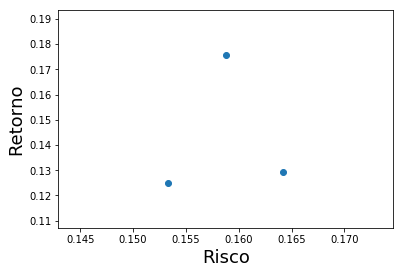

In [312]:
plt.scatter(dat1.iloc[:,0],dat1.iloc[:,1])
plt.ylabel('Retorno', fontsize=18)
plt.xlabel('Risco', fontsize=18)

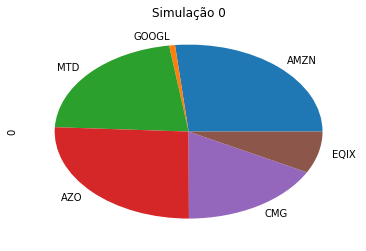

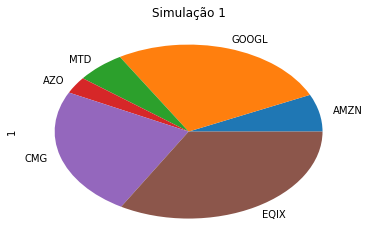

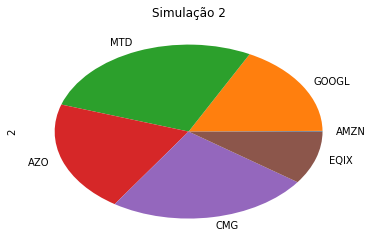

In [307]:
for i in range(3):
    df_pesos.iloc[i].plot(kind='pie')
    plt.title('Simulação {}'.format(i))
    plt.show()

In [237]:
pesos

array([ 0.00133617,  0.17333547,  0.27500618,  0.20729031,  0.24425554,
        0.09877634])

In [313]:
df_retornos1 = pd.DataFrame()
df_variancias1 = pd.DataFrame()
df_pesos = pd.DataFrame()
dat1 = pd.DataFrame()
# formula nova
np.random.seed(10)
for i in range(10000):
    pesos = np.random.random(len(log_retorno_ris_usa.columns))
    # print('Aleatórios {}: '.format(i+1)+str(pesos))
    pesos /= np.sum(pesos)
    # print('% de cada aleatório: '+str(pesos))
    # print()
    df_pesos = df_pesos.append([pesos], ignore_index=True)
    df_retornos1 = df_retornos1.append([np.sum(log_retorno_ris_usa.mean()*pesos)*252], ignore_index=True)
    df_variancias1 = df_variancias1.append([np.sqrt(np.dot(pesos.T,np.dot(log_retorno_ris_usa.cov()*252,pesos)))], ignore_index=True)

df_pesos.columns = ['AMZN', 'GOOGL', 'MTD', 'AZO', 'CMG', 'EQIX']

dat1 = pd.concat([df_variancias1, df_retornos1, df_pesos], axis=1, ignore_index=True)
dat1.columns = ['Risco','Retorno','AMZN', 'GOOGL', 'MTD', 'AZO', 'CMG', 'EQIX']

In [314]:
df_retornos1 = pd.DataFrame()
df_variancias1 = pd.DataFrame()
df_pesos = pd.DataFrame()
dat2 = pd.DataFrame()
# formula nova
np.random.seed(10)
for i in range(10000):
    pesos = np.random.random(len(log_retorno_ret_usa.columns))
    # print('Aleatórios {}: '.format(i+1)+str(pesos))
    pesos /= np.sum(pesos)
    # print('% de cada aleatório: '+str(pesos))
    # print()
    df_pesos = df_pesos.append([pesos], ignore_index=True)
    df_retornos1 = df_retornos1.append([np.sum(log_retorno_ret_usa.mean()*pesos)*252], ignore_index=True)
    df_variancias1 = df_variancias1.append([np.sqrt(np.dot(pesos.T,np.dot(log_retorno_ret_usa.cov()*252,pesos)))], ignore_index=True)

df_pesos.columns = ['NVDA', 'NFLX', 'ALGN', 'EA', 'STZ', 'AVGO']

dat2 = pd.concat([df_variancias1, df_retornos1, df_pesos], axis=1, ignore_index=True)
dat2.columns = ['Risco','Retorno', 'NVDA', 'NFLX', 'ALGN', 'EA', 'STZ', 'AVGO']

In [315]:
dat1.head()

,Risco,Retorno,AMZN,GOOGL,MTD,AZO,CMG,EQIX
0,0.1588,0.1756,0.2662,0.0072,0.2187,0.2584,0.1720,0.0776
1,0.1642,0.1292,0.0694,0.2664,0.0592,0.0309,0.2401,0.3340
2,0.1533,0.1249,0.0013,0.1733,0.2750,0.2073,0.2443,0.0988
3,0.1686,0.1970,0.2728,0.2124,0.1613,0.0423,0.1110,0.2004
4,0.1528,0.1506,0.1356,0.1332,0.1896,0.1575,0.1996,0.1845


In [316]:
dat2.head()

,Risco,Retorno,NVDA,NFLX,ALGN,EA,STZ,AVGO
0,0.2045,0.4417,0.2662,0.0072,0.2187,0.2584,0.1720,0.0776
1,0.2223,0.4193,0.0694,0.2664,0.0592,0.0309,0.2401,0.3340
2,0.1984,0.4022,0.0013,0.1733,0.2750,0.2073,0.2443,0.0988
3,0.2227,0.4574,0.2728,0.2124,0.1613,0.0423,0.1110,0.2004
4,0.1977,0.4244,0.1356,0.1332,0.1896,0.1575,0.1996,0.1845


Text(0,0.5,'Retorno')

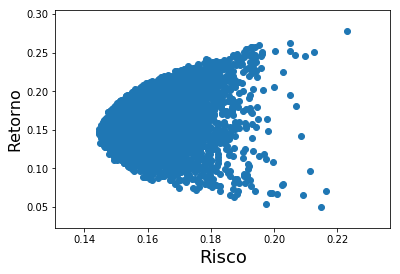

In [317]:
plt.scatter(dat1.iloc[:,0],dat1.iloc[:,1])
plt.xlabel('Risco', fontsize=18)
plt.ylabel('Retorno', fontsize=16)

Text(0,0.5,'Retorno')

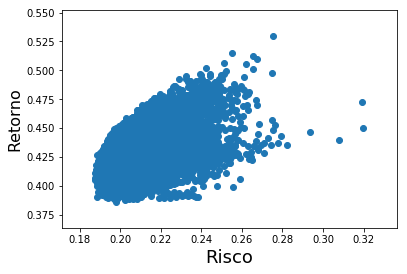

In [318]:
plt.scatter(dat2.iloc[:,0],dat2.iloc[:,1])
plt.xlabel('Risco', fontsize=18)
plt.ylabel('Retorno', fontsize=16)

## Amostra Risco

In [248]:
dat1.sort_values('Retorno', ascending=False).iloc[:5]

,Risco,Retorno,AMZN,GOOGL,MTD,AZO,CMG,EQIX
9983,0.22,0.28,0.69,0.07,0.04,0.16,0.02,0.01
9725,0.20,0.26,0.55,0.12,0.22,0.03,0.05,0.03
7846,0.20,0.26,0.49,0.02,0.36,0.08,0.02,0.04
2733,0.19,0.26,0.44,0.08,0.36,0.03,0.00,0.08
7080,0.19,0.26,0.41,0.12,0.42,0.01,0.00,0.05


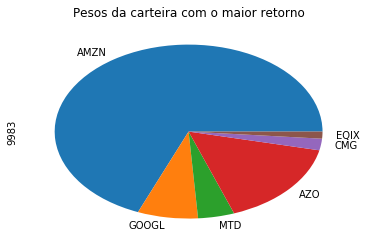

In [249]:
dat1.sort_values('Retorno', ascending=False).iloc[:1,2:].iloc[0].plot(kind='pie')
plt.title('Pesos da carteira com o maior retorno')
plt.show()

In [250]:
dat1.sort_values('Risco', ascending=True).iloc[:5]

,Risco,Retorno,AMZN,GOOGL,MTD,AZO,CMG,EQIX
6218,0.14,0.15,0.02,0.22,0.15,0.32,0.10,0.18
2987,0.14,0.14,0.02,0.16,0.21,0.30,0.11,0.19
704,0.14,0.15,0.04,0.20,0.17,0.33,0.08,0.18
9380,0.14,0.15,0.03,0.21,0.17,0.29,0.11,0.18
3005,0.15,0.13,0.01,0.20,0.12,0.33,0.14,0.20


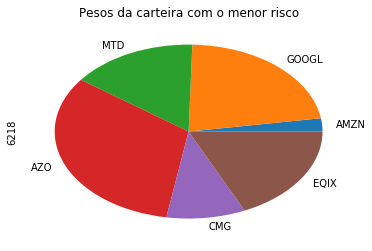

In [251]:
dat1.sort_values('Risco', ascending=True).iloc[:1,2:].iloc[0].plot(kind='pie')
plt.title('Pesos da carteira com o menor risco')
plt.show()

## Amostra Retorno

In [252]:
dat2.sort_values('Retorno', ascending=False).iloc[:5]

,Risco,Retorno,NVDA,NFLX,ALGN,EA,STZ,AVGO
9983,0.28,0.53,0.69,0.07,0.04,0.16,0.02,0.01
8155,0.26,0.52,0.58,0.17,0.02,0.09,0.12,0.02
366,0.27,0.51,0.52,0.30,0.01,0.11,0.03,0.03
1183,0.27,0.51,0.60,0.06,0.00,0.03,0.06,0.24
9725,0.25,0.51,0.55,0.12,0.22,0.03,0.05,0.03


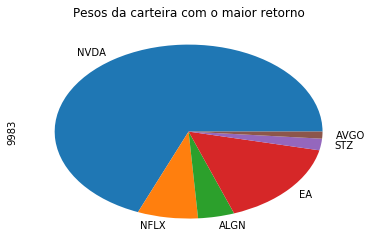

In [253]:
dat2.sort_values('Retorno', ascending=False).iloc[:1,2:].iloc[0].plot(kind='pie')
plt.title('Pesos da carteira com o maior retorno')
plt.show()

In [254]:
dat2.sort_values('Risco', ascending=True).iloc[:5]

,Risco,Retorno,NVDA,NFLX,ALGN,EA,STZ,AVGO
5049,0.19,0.40,0.07,0.06,0.20,0.20,0.33,0.15
2053,0.19,0.41,0.09,0.09,0.17,0.12,0.44,0.09
6412,0.19,0.41,0.06,0.10,0.17,0.24,0.36,0.07
3667,0.19,0.41,0.07,0.07,0.17,0.22,0.32,0.14
5044,0.19,0.41,0.08,0.07,0.20,0.25,0.37,0.03


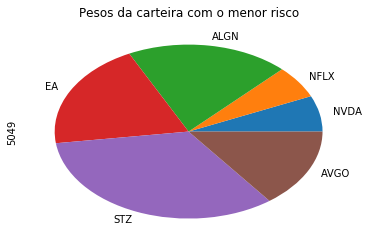

In [255]:
dat2.sort_values('Risco', ascending=True).iloc[:1,2:].iloc[0].plot(kind='pie')
plt.title('Pesos da carteira com o menor risco')
plt.show()

## Hurst

In [71]:
serie = dat1['AMZN'].values
serie

array([ 0.26617196,  0.06937896,  0.00133617, ...,  0.03920565,
        0.19546529,  0.19904498])

In [72]:
# variavel com o tamanho do vetor dados
tamanhoDados = serie.shape[0]
tamanhoDados

10000

In [73]:
# variavel logTamanho
logTamanho = tamanhoDados - 1
logTamanho

9999

In [74]:
# vetor de maxima
max_ = np.zeros(logTamanho)
# vetor de minima
min_ = np.zeros(logTamanho)

In [75]:
# vetor de media
media_ = np.zeros(logTamanho)
# vetor de amplitude
range_ = np.zeros(logTamanho)
# vetor de desvio padrao
sdesvio_ = np.zeros(logTamanho)
# vetor do eixo x
eixo_x = np.zeros(logTamanho)
# vetor do eixo y
eixo_y = np.zeros(logTamanho)
# matrix para calcular o Y
Y_calculo = np.zeros((tamanhoDados-1,tamanhoDados))


In [76]:
# preenchendo médias
for i in np.arange(np.size(media_)):
    ch1 = 2+i
    media_[i] = serie[:ch1].sum() / ch1
media_

array([ 0.16777546,  0.11229569,  0.15241642, ...,  0.16762048,
        0.16762327,  0.16762641])

In [77]:
# preenchendo desvios
for i in np.arange(np.size(sdesvio_)):
    ch1 = i + 2
    sdesvio_[i] = serie[:ch1].std()
sdesvio_

array([ 0.0983965 ,  0.11229688,  0.11952807, ...,  0.09579548,
        0.09579109,  0.09578682])

In [78]:
# preenchendo o range
yAcumulado = 0
for i in np.arange(np.size(max_)):
    ch1 = i + 2
    for j in range(ch1):
        Y_calculo[i][j] = serie[j] - serie[:ch1].mean() + yAcumulado
        yAcumulado = Y_calculo[i][j]
    max_[i] = Y_calculo[i].max()
    min_[i] = Y_calculo[i].min()
    range_[i] = max_[i] - min_[i]

KeyboardInterrupt: 

In [ ]:
# calculando o eixo x
for i in np.arange(np.size(max_)):
    eixo_x[i] = np.log2(i+2.0)
eixo_x[:10]

In [ ]:
# calculando o eixo y
for i in np.arange(np.size(range_)):
    eixo_y[i] = np.log2((range_[i] / sdesvio_[i]))

In [ ]:
from matplotlib.pyplot import figure
figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')


# acrecentar MMQ
mx = eixo_x.mean()
my = eixo_y.mean()
temp = eixo_x - mx
c1 = np.sum(temp * (eixo_y-my)) / np.sum(temp ** 2)
c0 = my - c1 * mx

# plotando
x2 = [1,14]
y2 = [c0 + c1*1, c0 + c1*14]
plt.plot(x2,y2, color='r', linewidth=1)
plt.scatter(eixo_x,eixo_y)
plt.xlabel('log2()')
plt.ylabel('log(R/S)')
plt.title('AMZN')
plt.legend(['Hurst = {}'.format(round(c1,2))],loc=2, prop={'size': 33})

In [ ]:
c1

# Função Hurst

In [43]:
from matplotlib.pyplot import figure
   
def Hurst(nome, titulo):    
    serie = nome.values
    # variavel com o tamanho do vetor dados
    tamanhoDados = serie.shape[0]
    # variavel logTamanho
    logTamanho = tamanhoDados - 1
    # vetor de maxima
    max_ = np.zeros(logTamanho)
    # vetor de minima
    min_ = np.zeros(logTamanho)
    # vetor de media
    media_ = np.zeros(logTamanho)
    # vetor de amplitude
    range_ = np.zeros(logTamanho)
    # vetor de desvio padrao
    sdesvio_ = np.zeros(logTamanho)
    # vetor do eixo x
    eixo_x = np.zeros(logTamanho)
    # vetor do eixo y
    eixo_y = np.zeros(logTamanho)
    # matrix para calcular o Y
    Y_calculo = np.zeros((tamanhoDados-1,tamanhoDados))
    # preenchendo médias
    for i in np.arange(np.size(media_)):
        ch1 = 2+i
        media_[i] = serie[:ch1].sum() / ch1
    # preenchendo desvios
    for i in np.arange(np.size(sdesvio_)):
        ch1 = i + 2
        sdesvio_[i] = serie[:ch1].std()
    # preenchendo o range
    yAcumulado = 0
    for i in np.arange(np.size(max_)):
        ch1 = i + 2
        for j in range(ch1):
            Y_calculo[i][j] = serie[j] - serie[:ch1].mean() + yAcumulado
            yAcumulado = Y_calculo[i][j]
        max_[i] = Y_calculo[i].max()
        min_[i] = Y_calculo[i].min()
        range_[i] = max_[i] - min_[i]
    # calculando o eixo x
    for i in np.arange(np.size(max_)):
        eixo_x[i] = np.log2(i+2.0)
    # calculando o eixo y
    for i in np.arange(np.size(range_)):
        eixo_y[i] = np.log2((range_[i] / sdesvio_[i]))
    
    # criar figura
    figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')
    # acrecentar MMQ
    mx = eixo_x.mean()
    my = eixo_y.mean()
    temp = eixo_x - mx
    c1 = np.sum(temp * (eixo_y-my)) / np.sum(temp ** 2)
    c0 = my - c1 * mx
    
    # plotando
    x2 = [1,14]
    y2 = [c0 + c1*1, c0 + c1*14]
    plt.plot(x2,y2, color='r', linewidth=1)
    plt.scatter(eixo_x,eixo_y)
    plt.xlabel('log2()')
    plt.ylabel('log(R/S)')
    plt.title(titulo)
    plt.legend(['Hurst = {}'.format(round(c1,2))],loc=2, prop={'size': 33})
    plt.show()
    
    return c1

In [113]:
for i in ['AMZN','GOOGL', 'MTD', 'AZO', 'CMG', 'EQIX']:
    Hurst(ris_usa[i], i)

NameError: name 'Hurst' is not defined

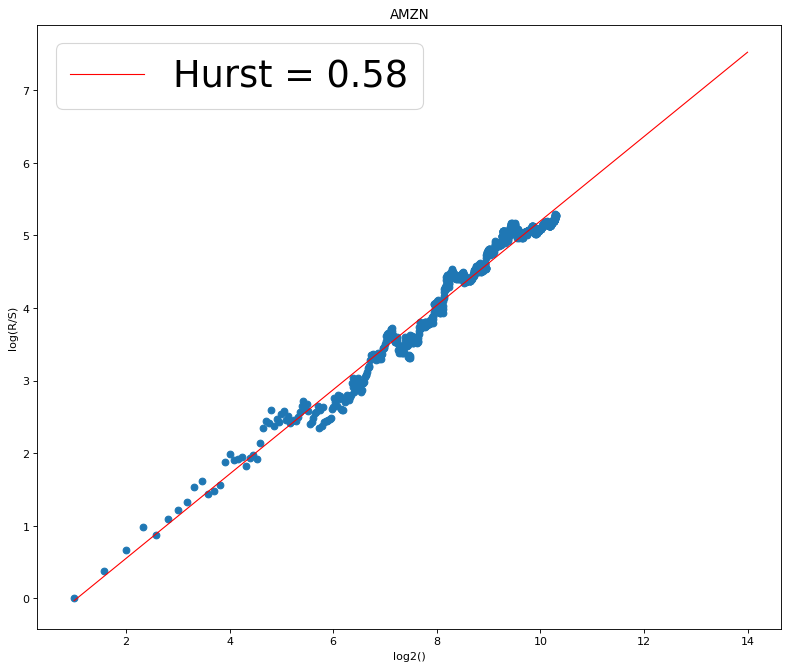

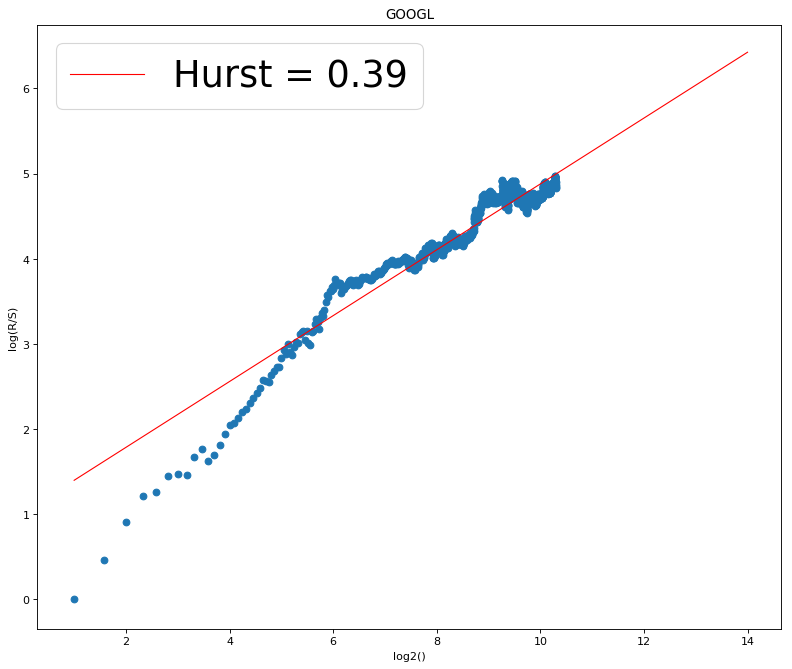

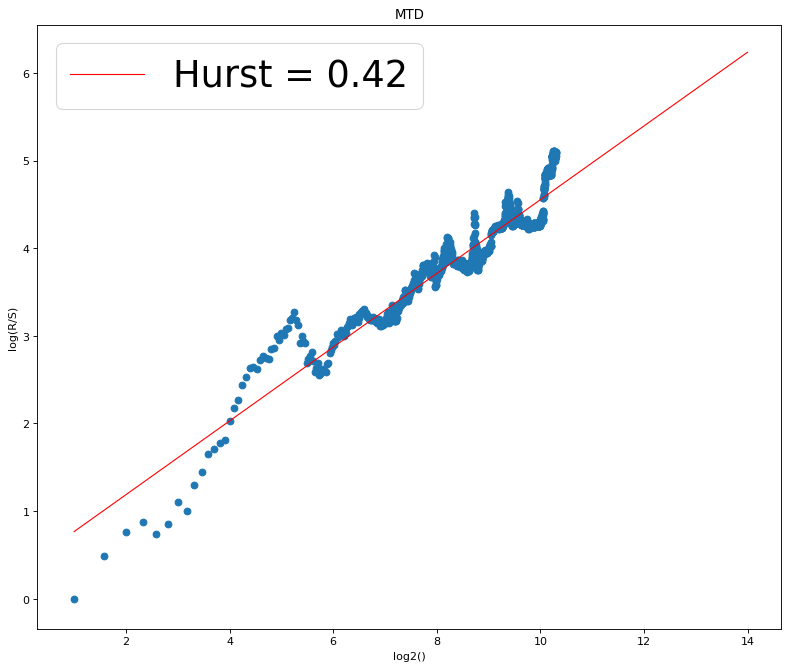

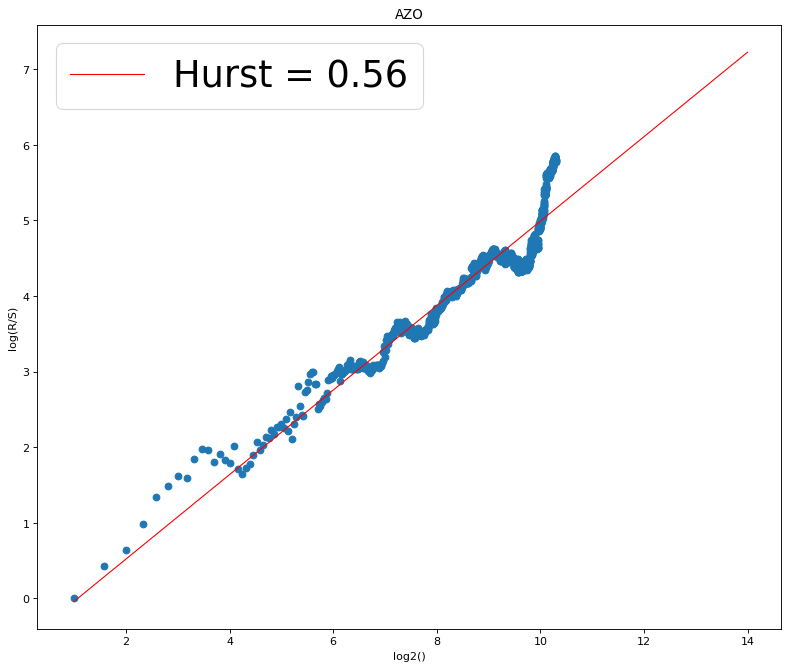

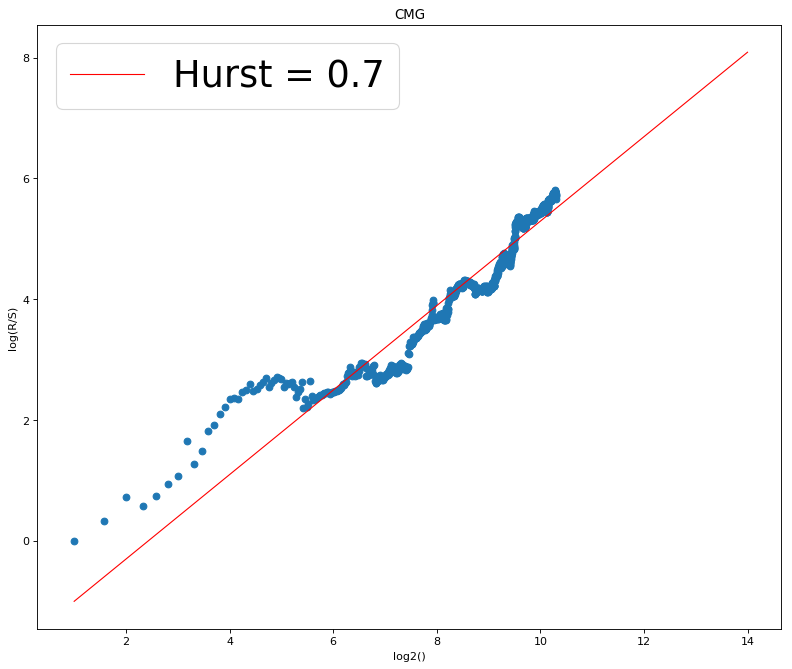

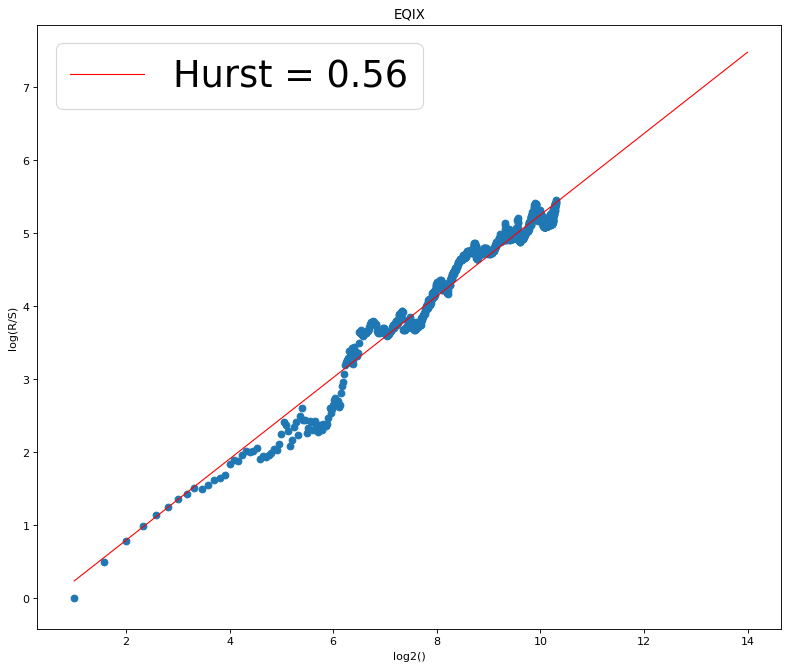

In [115]:
for i in ['AMZN','GOOGL', 'MTD', 'AZO', 'CMG', 'EQIX']:
    Hurst(log_retorno_ris_usa[i].iloc[1:], i)

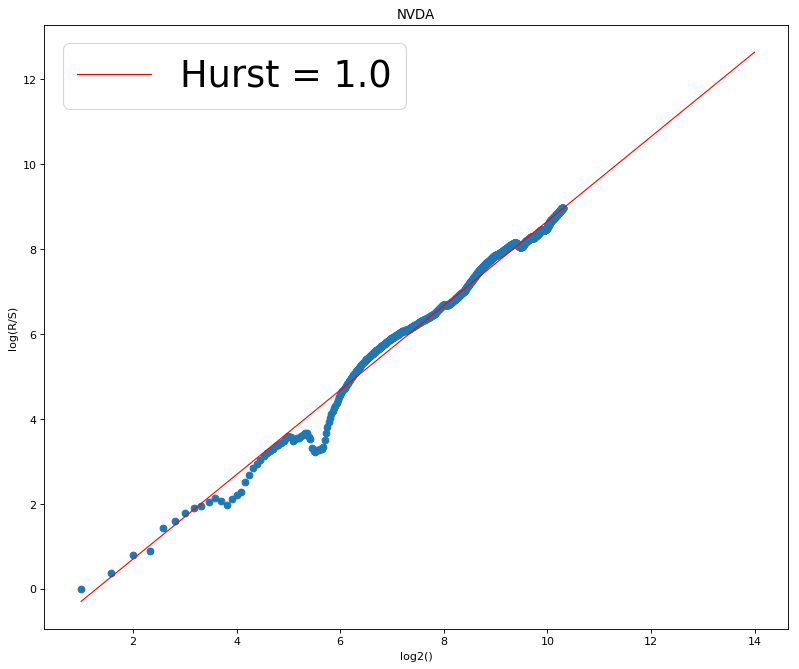

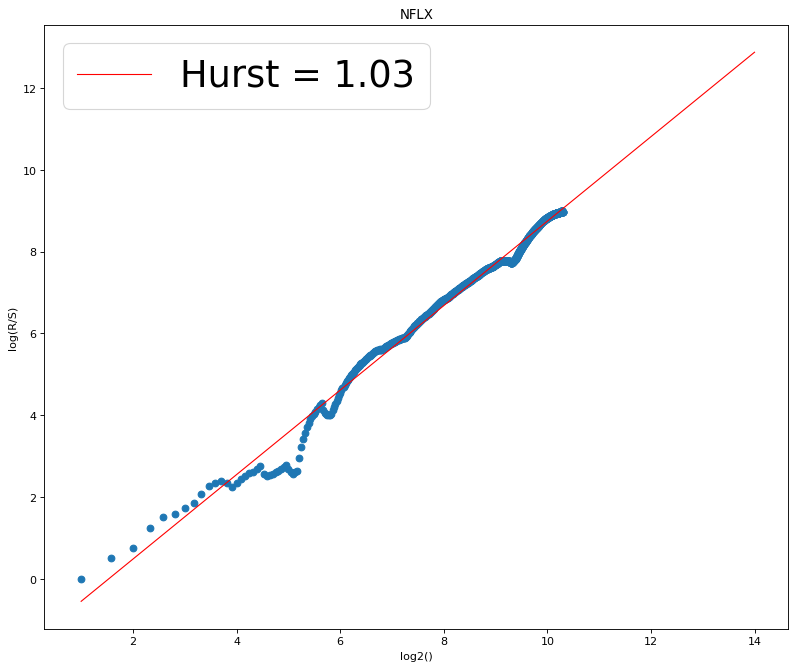

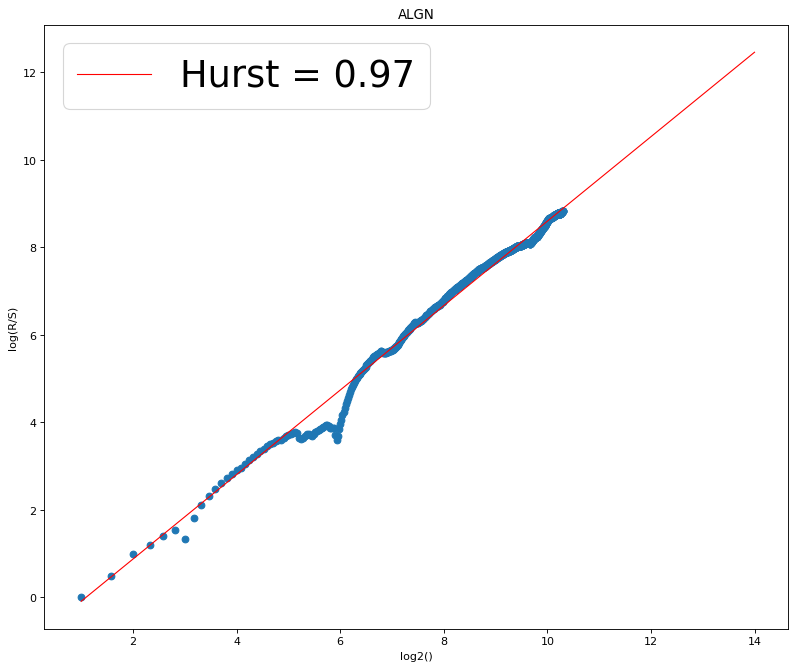

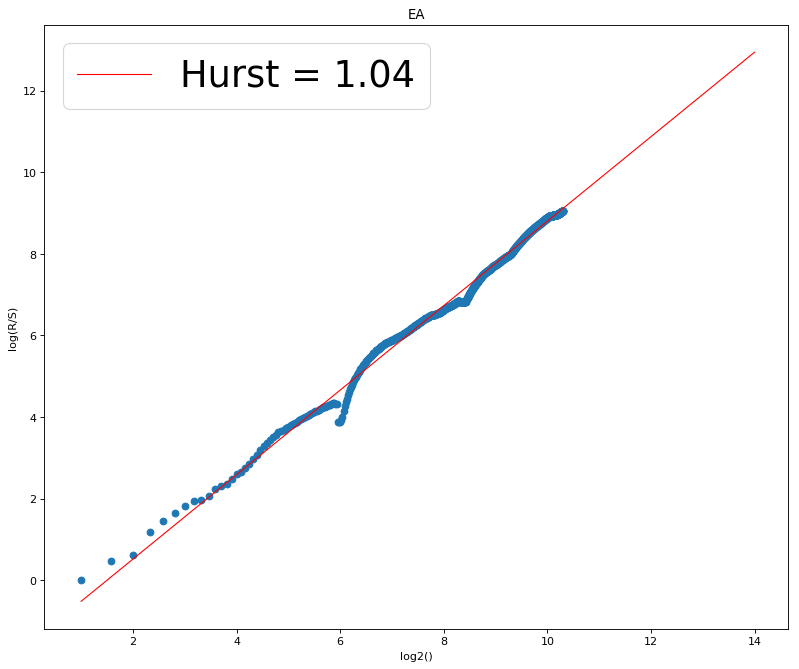

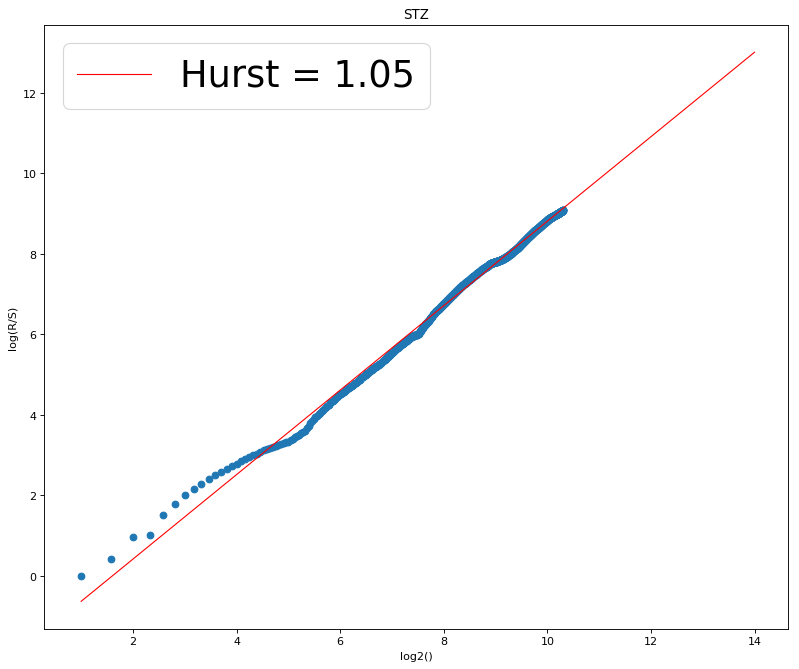

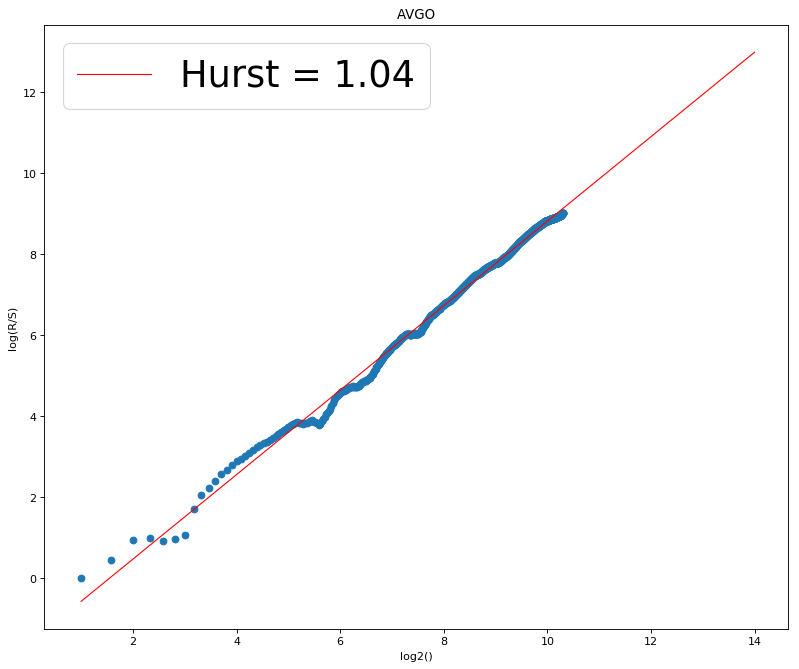

In [43]:
for i in ['NVDA', 'NFLX', 'ALGN', 'EA', 'STZ', 'AVGO']:
    Hurst(ret_usa[i], i)

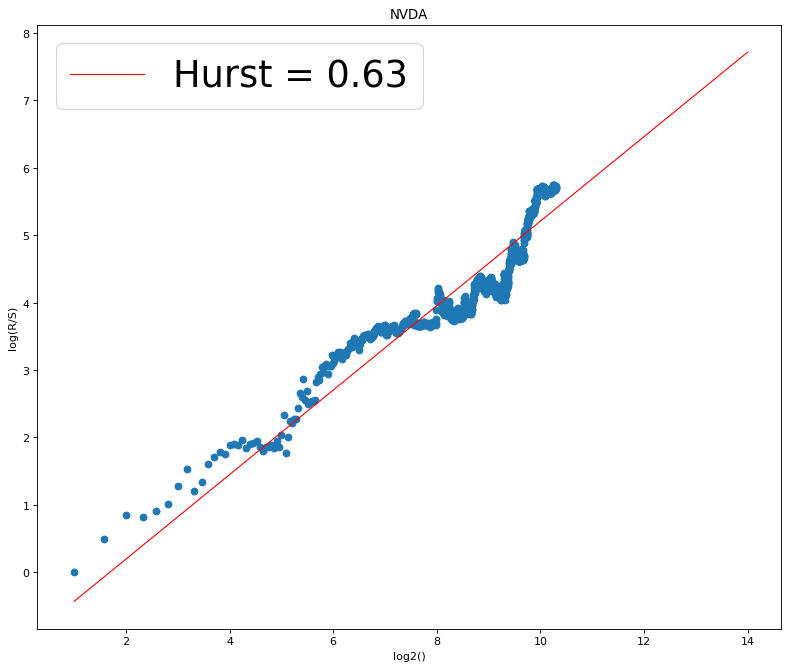

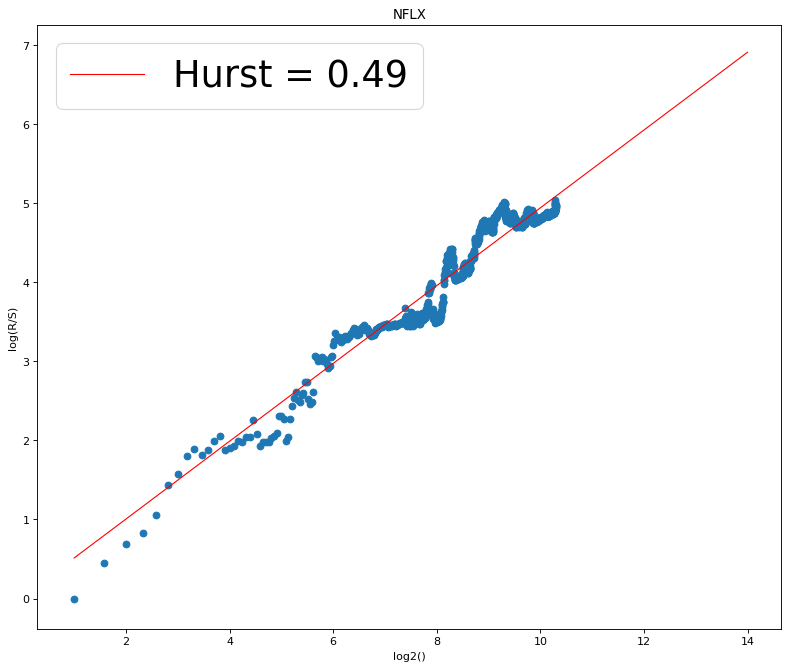

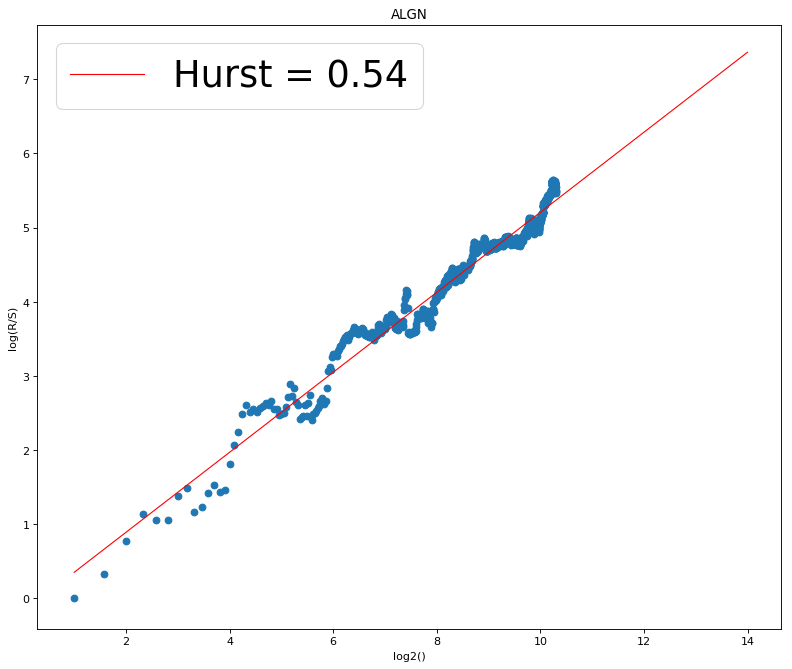

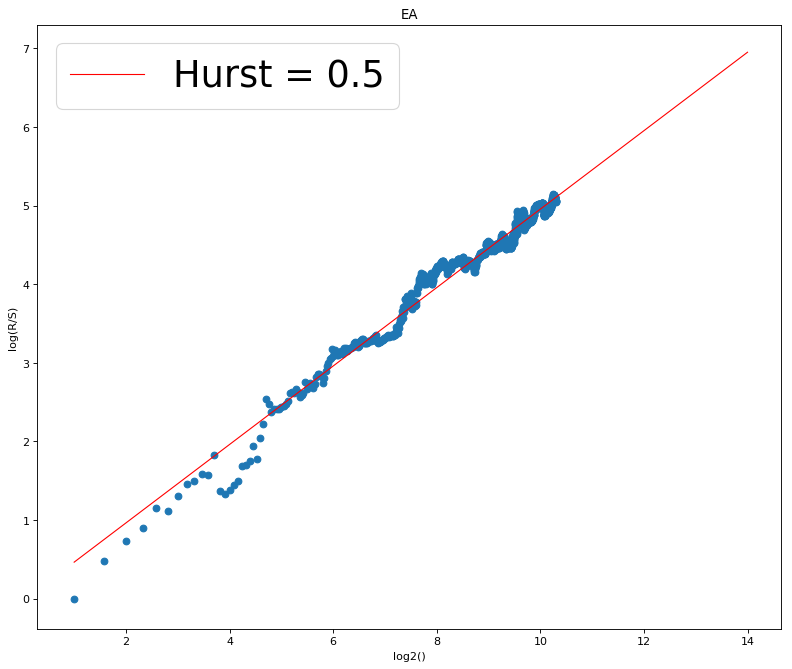

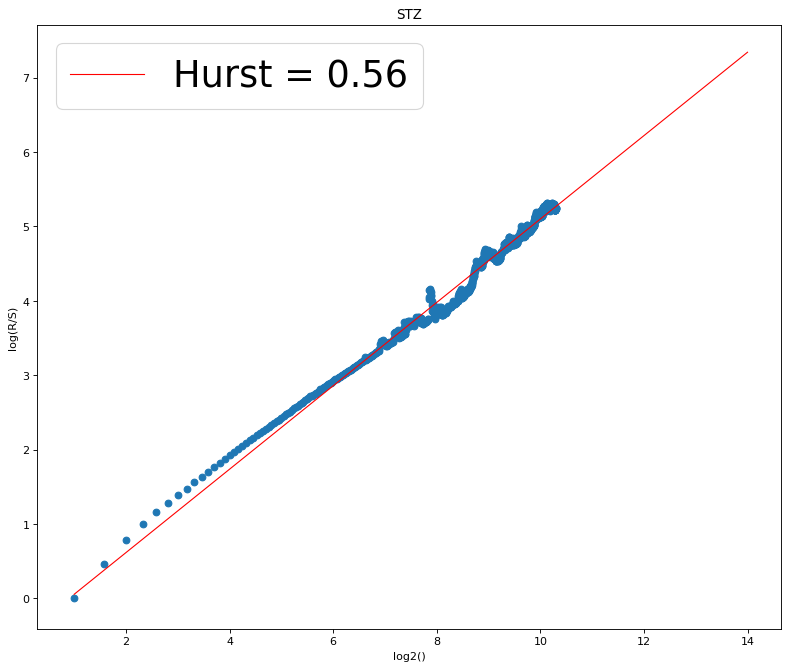

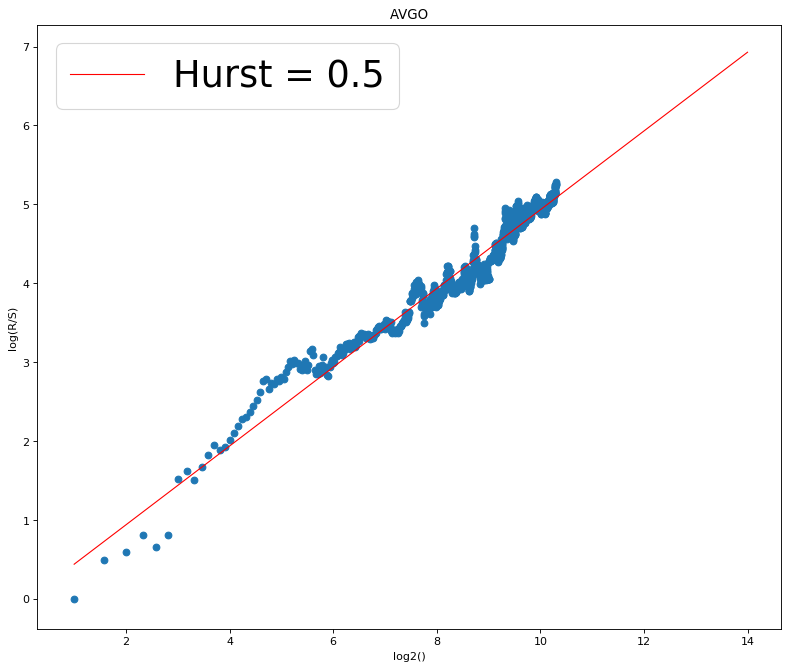

In [45]:
for i in ['NVDA', 'NFLX', 'ALGN', 'EA', 'STZ', 'AVGO']:
    Hurst(log_retorno_ret_usa[i].iloc[1:], i)

# Simulações Markowitz

In [64]:
dat2['Coef_Var'] = dat2['Risco']/dat2['Retorno']

NameError: name 'dat2' is not defined

In [532]:
dat2.sort_values(by='Coef_Var').iloc[:1]

,Risco,Retorno,NVDA,NFLX,ALGN,EA,STZ,AVGO,Coef_Var
1965,0.178406,0.241188,0.360722,0.1026,0.358951,0.131599,0.003482,0.042645,0.739699


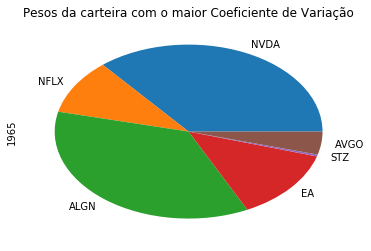

In [531]:
dat2.sort_values(by='Coef_Var').iloc[:1,2:-1].iloc[0].plot(kind='pie')
plt.title('Pesos da carteira com o maior Coeficiente de Variação')

plt.show()

# Simulação Markowitz

In [256]:
x = ['2014-07-16','2015-07-16']
log_retorno_ris_usa.loc[x[0]:x[1]].head()

,AMZN,GOOGL,MTD,AZO,CMG,EQIX
2014-07-16,0.00,-0.00,0.00,-0.00,-0.01,-0.01
2014-07-17,-0.01,-0.02,-0.01,-0.01,-0.02,-0.01
2014-07-18,0.02,0.04,0.02,-0.01,0.02,0.01
2014-07-21,0.00,-0.01,0.00,-0.01,-0.00,-0.00
2014-07-22,0.00,0.01,0.03,-0.01,0.11,0.01


In [257]:
x = ['20' + str(14) + '-07-16','2015-07-16']
log_retorno_ris_usa.loc[x[0]:x[1]].tail()

,AMZN,GOOGL,MTD,AZO,CMG,EQIX
2015-07-10,0.02,0.02,0.02,0.02,0.02,0.01
2015-07-13,0.03,0.03,0.02,0.00,0.03,0.00
2015-07-14,0.02,0.02,0.01,-0.01,-0.00,0.00
2015-07-15,-0.01,-0.00,-0.00,0.01,0.01,-0.00
2015-07-16,0.03,0.03,0.01,-0.00,-0.00,0.01


In [258]:
log_retorno_ris_usa.head()

,AMZN,GOOGL,MTD,AZO,CMG,EQIX
2013-02-08,nan,nan,nan,nan,nan,nan
2013-02-11,-0.02,-0.00,-0.01,-0.00,0.01,-0.01
2013-02-12,0.01,-0.00,-0.01,-0.01,-0.00,-0.02
2013-02-13,0.04,0.00,0.00,-0.01,-0.02,-0.01
2013-02-14,-0.00,0.01,-0.01,-0.02,0.00,0.06


In [259]:
log_retorno_ris_usa.tail()

,AMZN,GOOGL,MTD,AZO,CMG,EQIX
2018-02-01,-0.04,-0.00,0.01,-0.00,-0.03,-0.02
2018-02-02,0.03,-0.05,-0.03,-0.02,-0.01,-0.02
2018-02-05,-0.03,-0.05,-0.05,-0.03,-0.04,-0.02
2018-02-06,0.04,0.02,0.00,0.02,0.01,0.00
2018-02-07,-0.02,-0.03,0.01,-0.02,-0.11,-0.01


In [260]:
log_retorno_ris_usa.loc[x[0]:x[1]].tail()

,AMZN,GOOGL,MTD,AZO,CMG,EQIX
2015-07-10,0.02,0.02,0.02,0.02,0.02,0.01
2015-07-13,0.03,0.03,0.02,0.00,0.03,0.00
2015-07-14,0.02,0.02,0.01,-0.01,-0.00,0.00
2015-07-15,-0.01,-0.00,-0.00,0.01,0.01,-0.00
2015-07-16,0.03,0.03,0.01,-0.00,-0.00,0.01


In [261]:
a = 0
for i in range(63,1261,63):
    print([a,i])
    print(log_retorno_ris_usa.iloc[a:i].head(1))
    print(log_retorno_ris_usa.iloc[a:i].tail(1))
    a = i

[0, 63]
            AMZN  GOOGL  MTD  AZO  CMG  EQIX
2013-02-08   nan    nan  nan  nan  nan   nan
            AMZN  GOOGL   MTD   AZO  CMG  EQIX
2013-05-09  0.01  -0.00 -0.01 -0.01 0.00 -0.01
[63, 126]
            AMZN  GOOGL  MTD  AZO  CMG  EQIX
2013-05-10  0.01   0.01 0.01 0.01 0.01  0.01
            AMZN  GOOGL   MTD   AZO  CMG  EQIX
2013-08-08 -0.00   0.00 -0.00 -0.01 0.01  0.01
[126, 189]
            AMZN  GOOGL   MTD  AZO   CMG  EQIX
2013-08-09  0.01  -0.00 -0.00 0.00 -0.01 -0.00
            AMZN  GOOGL  MTD  AZO   CMG  EQIX
2013-11-06 -0.01   0.00 0.00 0.01 -0.01  0.01
[189, 252]
            AMZN  GOOGL   MTD   AZO   CMG  EQIX
2013-11-07 -0.04  -0.01 -0.01 -0.01 -0.03 -0.02
            AMZN  GOOGL  MTD  AZO  CMG  EQIX
2014-02-07  0.02   0.01 0.00 0.03 0.01  0.02
[252, 315]
            AMZN  GOOGL   MTD   AZO   CMG  EQIX
2014-02-10 -0.00  -0.00 -0.00 -0.02 -0.00  0.02
            AMZN  GOOGL  MTD  AZO  CMG  EQIX
2014-05-09  0.01   0.01 0.02 0.01 0.01  0.01
[315, 378]
            

In [262]:
log_retorno_ris_usa.iloc[0:63]

,AMZN,GOOGL,MTD,AZO,CMG,EQIX
2013-02-08,nan,nan,nan,nan,nan,nan
2013-02-11,-0.02,-0.00,-0.01,-0.00,0.01,-0.01
2013-02-12,0.01,-0.00,-0.01,-0.01,-0.00,-0.02
2013-02-13,0.04,0.00,0.00,-0.01,-0.02,-0.01
2013-02-14,-0.00,0.01,-0.01,-0.02,0.00,0.06
2013-02-15,-0.02,0.01,-0.01,0.00,-0.01,-0.01
2013-02-19,0.02,0.02,0.01,0.00,-0.00,-0.02
2013-02-20,-0.01,-0.02,-0.01,0.01,-0.01,-0.03
2013-02-21,-0.00,0.00,-0.01,-0.01,-0.00,-0.01
2013-02-22,-0.00,0.01,-0.00,0.02,0.02,0.00


In [263]:
def markowitz(dados):
    df_retornos1 = pd.DataFrame()
    df_variancias1 = pd.DataFrame()
    df_pesos = pd.DataFrame()
    dat1 = pd.DataFrame()
    # formula nova
    np.random.seed(10)
    for i in range(100):
        pesos = np.random.random(len(log_retorno_ris_usa.columns))
        pesos /= np.sum(pesos)
        df_pesos = df_pesos.append([pesos], ignore_index=True)
        df_retornos1 = df_retornos1.append([np.sum(dados.mean()*pesos)*252], ignore_index=True)
        df_variancias1 = df_variancias1.append([np.sqrt(np.dot(pesos.T,np.dot(dados.cov()*252,pesos)))], ignore_index=True)

    df_pesos.columns = ['AMZN', 'GOOGL', 'MTD', 'AZO', 'CMG', 'EQIX']

    dat1 = pd.concat([df_variancias1, df_retornos1, df_pesos], axis=1, ignore_index=True)
    dat1.columns = ['Risco','Retorno','AMZN', 'GOOGL', 'MTD', 'AZO', 'CMG', 'EQIX']
    return dat1

In [264]:
xxx = markowitz(log_retorno_ris_usa)

In [265]:
xxx

,Risco,Retorno,AMZN,GOOGL,MTD,AZO,CMG,EQIX
0,0.16,0.18,0.27,0.01,0.22,0.26,0.17,0.08
1,0.16,0.13,0.07,0.27,0.06,0.03,0.24,0.33
2,0.15,0.12,0.00,0.17,0.28,0.21,0.24,0.10
3,0.17,0.20,0.27,0.21,0.16,0.04,0.11,0.20
4,0.15,0.15,0.14,0.13,0.19,0.16,0.20,0.18
5,0.17,0.22,0.27,0.18,0.31,0.11,0.03,0.10
6,0.15,0.13,0.04,0.28,0.02,0.21,0.18,0.27
7,0.15,0.15,0.06,0.26,0.11,0.23,0.09,0.26
8,0.18,0.12,0.17,0.08,0.20,0.05,0.42,0.08
9,0.16,0.15,0.10,0.25,0.26,0.12,0.21,0.07


In [278]:
def markowitz(dados):
    df_retornos1 = pd.DataFrame()
    df_variancias1 = pd.DataFrame()
    df_pesos = pd.DataFrame()
    dat1 = pd.DataFrame()
    # formula nova
    np.random.seed(10)
    for i in range(10000):
        pesos = np.random.random(len(log_retorno_ris_usa.columns))
        pesos /= np.sum(pesos)
        df_pesos = df_pesos.append([pesos], ignore_index=True)
        df_retornos1 = df_retornos1.append([np.sum(dados.mean()*pesos)*252], ignore_index=True)
        df_variancias1 = df_variancias1.append([np.sqrt(np.dot(pesos.T,np.dot(dados.cov().values*252,pesos)))], ignore_index=True)

    df_pesos.columns = ['AMZN', 'GOOGL', 'MTD', 'AZO', 'CMG', 'EQIX']

    dat1 = pd.concat([df_variancias1, df_retornos1, df_pesos], axis=1, ignore_index=True)
    dat1.columns = ['Risco','Retorno','AMZN', 'GOOGL', 'MTD', 'AZO', 'CMG', 'EQIX']
    #dat1['Coef_Var'] = dat1['Risco']/dat1['Retorno']
    # melhor = dat1.sort_values(by='Coef_Var').iloc[:1]
    melhor = dat1.sort_values(by='Risco').iloc[:1]
    # melhor = melhor[melhor['Retorno'] >= 0]
    if melhor.empty:
        melhor = dat1.sort_values(by='Coef_Var').iloc[:1]
    print('Risco da Carteira = {:.2%} ; Retorno da Carteira = {:.2%}'.format(float(melhor['Risco']),float(melhor['Retorno'])))
    melhor.iloc[:,2:].iloc[0].plot(kind='pie')
    #print('Coef de Var {:.2%}'.format(float(melhor['Coef_Var'])))
    plt.title('Pesos da carteira escolhida \n' + 'de '+ str(dados.iloc[0].name) + ' até ' + str(dados.iloc[-1].name))
    plt.show()
    return (melhor, dados.iloc[0].name, dados.iloc[-1].name)

# Mairores Riscos (EUA)

[0, 63]
Risco da Carteira = 13.74% ; Retorno da Carteira = 32.99%


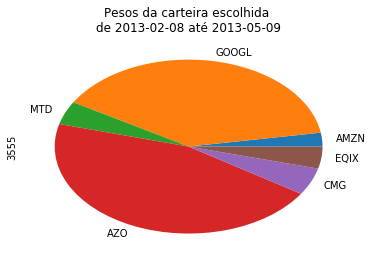

[63, 126]
Risco da Carteira = 12.83% ; Retorno da Carteira = 14.24%


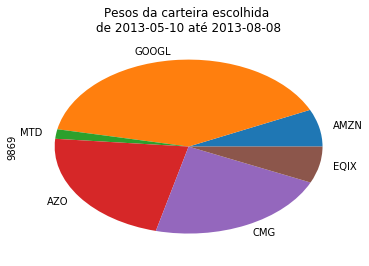

[126, 189]
Risco da Carteira = 12.58% ; Retorno da Carteira = 19.85%


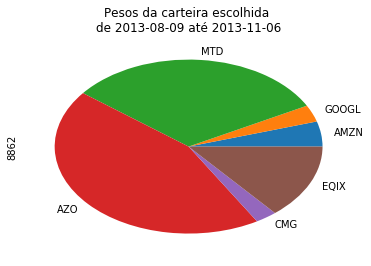

[189, 252]
Risco da Carteira = 15.56% ; Retorno da Carteira = 47.09%


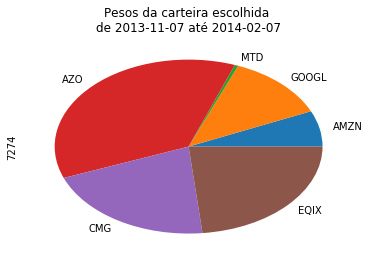

[252, 315]
Risco da Carteira = 13.90% ; Retorno da Carteira = -9.04%


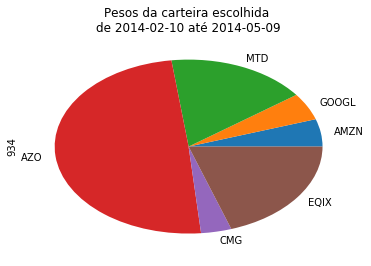

[315, 378]
Risco da Carteira = 9.93% ; Retorno da Carteira = 25.98%


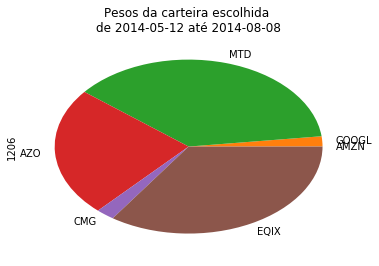

[378, 441]
Risco da Carteira = 13.34% ; Retorno da Carteira = 4.72%


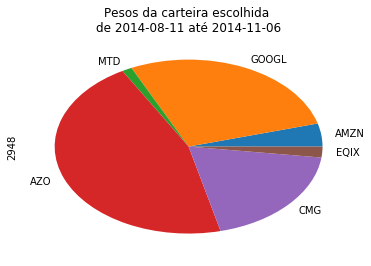

[441, 504]
Risco da Carteira = 14.66% ; Retorno da Carteira = 15.41%


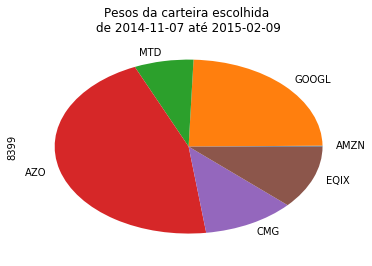

[504, 567]
Risco da Carteira = 11.94% ; Retorno da Carteira = 32.14%


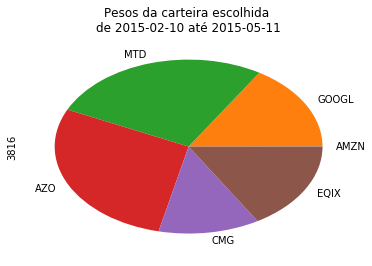

[567, 630]
Risco da Carteira = 11.16% ; Retorno da Carteira = 25.33%


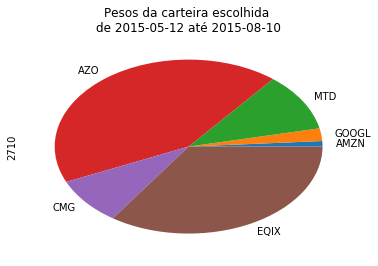

[630, 693]
Risco da Carteira = 19.79% ; Retorno da Carteira = -14.94%


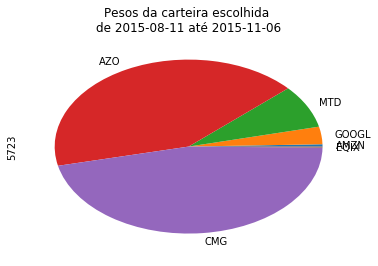

[693, 756]
Risco da Carteira = 18.68% ; Retorno da Carteira = -52.75%


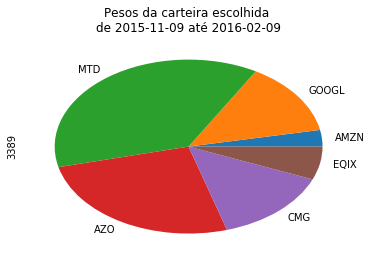

[756, 819]
Risco da Carteira = 13.89% ; Retorno da Carteira = 44.80%


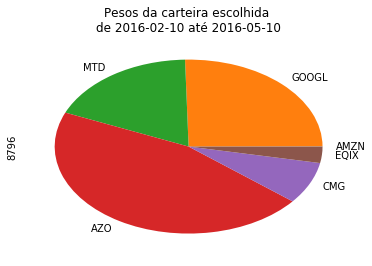

[819, 882]
Risco da Carteira = 13.02% ; Retorno da Carteira = 15.51%


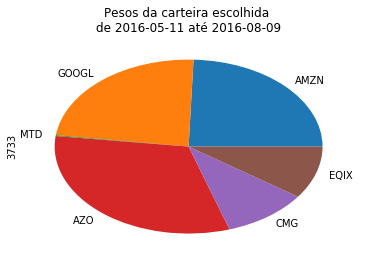

[882, 945]
Risco da Carteira = 10.88% ; Retorno da Carteira = -13.96%


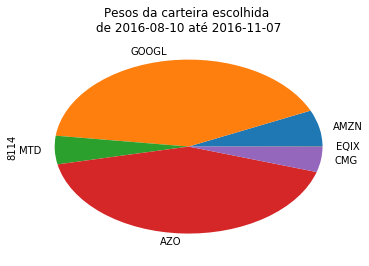

[945, 1008]
Risco da Carteira = 9.90% ; Retorno da Carteira = 21.31%


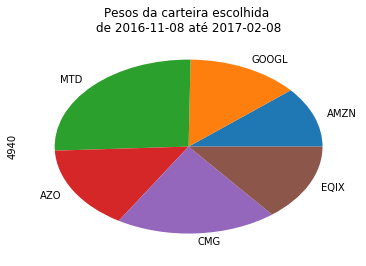

[1008, 1071]
Risco da Carteira = 7.24% ; Retorno da Carteira = 42.87%


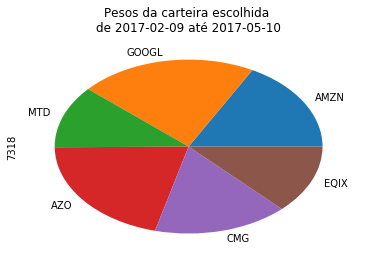

[1071, 1134]
Risco da Carteira = 10.92% ; Retorno da Carteira = -21.36%


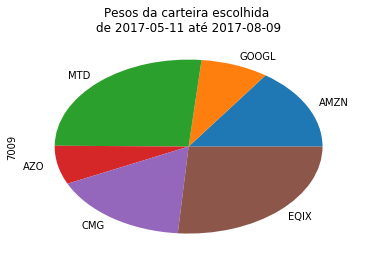

[1134, 1197]
Risco da Carteira = 10.23% ; Retorno da Carteira = 37.10%


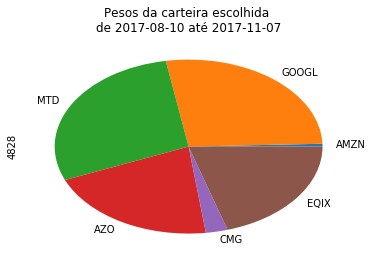

[1197, 1260]
Risco da Carteira = 12.70% ; Retorno da Carteira = 22.37%


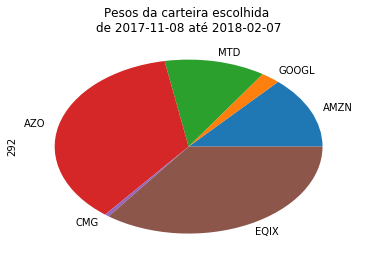

In [279]:
df_final = pd.DataFrame()
df_dinicial = pd.DataFrame()
df_dfinal = pd.DataFrame()
a = 0
for i in range(63,1261,63):
    print([a,i])
    retorno, data_inicial, data_final = markowitz(log_retorno_ris_usa.iloc[a:i])
    df_final = df_final.append([retorno], ignore_index=True)
    df_dinicial = df_dinicial.append([data_inicial], ignore_index=True)
    df_dfinal = df_dfinal.append([data_final], ignore_index=True)
    a = i
df_final = pd.concat([df_dinicial, df_dfinal, df_final], axis=1, ignore_index=True)
df_final.columns = ['Data Inicio','Data Fim','Risco','Retorno','AMZN', 'GOOGL', 'MTD', 'AZO', 'CMG', 'EQIX']

In [280]:
ris_usa.loc[df_final['Data Fim'].iloc[j+1]]

AMZN    1416.78
GOOGL   1055.41
MTD      641.96
AZO      728.33
CMG      272.21
EQIX     426.08
Name: 2018-02-07, dtype: float64

In [281]:
j = 0
df_montante = pd.DataFrame()
# numero de acoes compradas
p0 = df_final.iloc[j,4:] * 100000 / ris_usa.loc[df_final['Data Fim'].iloc[j]]
print(p0)
# valorizacao das acoes
p0 = (p0 * ris_usa.loc[df_final['Data Fim'].iloc[j+1]]).sum()
print(p0)
p1 = df_final.iloc[j+1,4:] * p0 / ris_usa.loc[df_final['Data Fim'].iloc[j+1]]
print(p1)
p1 = (p1 * ris_usa.loc[df_final['Data Fim'].iloc[j+2]]).sum()
print(p1)

AMZN      9.83
GOOGL    89.27
MTD      19.36
AZO     108.45
CMG      13.77
EQIX     18.37
dtype: object
102690.586315
AMZN    24.08
GOOGL   91.65
MTD      7.93
AZO     53.85
CMG     55.77
EQIX    38.41
dtype: object
117908.817403


In [282]:
df_montante = pd.DataFrame()
p0 =  100000
df_montante = df_montante.append([p0], ignore_index=True)
for j in range(19):
    # numero de acoes compradas
    p0 = df_final.iloc[j,4:] * p0 / ris_usa.loc[df_final['Data Fim'].iloc[j]]
    print(p0)
    # valorizacao das acoes
    p0 = (p0 * ris_usa.loc[df_final['Data Fim'].iloc[j+1]]).sum()
    print(p0)
    df_montante = df_montante.append([p0], ignore_index=True)

AMZN      9.83
GOOGL    89.27
MTD      19.36
AZO     108.45
CMG      13.77
EQIX     18.37
dtype: object
102690.586315
AMZN    24.08
GOOGL   91.65
MTD      7.93
AZO     53.85
CMG     55.77
EQIX    38.41
dtype: object
117908.817403
AMZN     15.44
GOOGL     7.19
MTD     150.92
AZO     116.13
CMG       5.74
EQIX     99.96
dtype: object
132166.487363
AMZN     24.38
GOOGL    27.61
MTD       2.16
AZO      90.25
CMG      50.00
EQIX    165.60
dtype: object
127495.511622
AMZN     22.25
GOOGL    12.18
MTD      89.21
AZO     117.61
CMG       9.25
EQIX    132.64
dtype: object
133259.390307
AMZN      0.05
GOOGL     4.35
MTD     191.04
AZO      60.75
CMG       4.48
EQIX    219.01
dtype: object
137124.42214
AMZN     19.79
GOOGL    68.94
MTD       6.27
AZO     110.50
CMG      40.57
EQIX     12.85
dtype: object
142561.69836
AMZN      0.65
GOOGL    65.30
MTD      33.50
AZO     105.87
CMG      24.51
EQIX     77.13
dtype: object
154574.347942
AMZN      0.19
GOOGL    45.57
MTD     127.81
AZO      64.64
CMG 

In [283]:
df_final['Montante'] = df_montante

In [284]:
df_final

,Data Inicio,Data Fim,Risco,Retorno,AMZN,GOOGL,MTD,AZO,CMG,EQIX,Montante
0,2013-02-08,2013-05-09,0.14,0.33,0.03,0.39,0.04,0.45,0.05,0.04,100000.00
1,2013-05-10,2013-08-08,0.13,0.14,0.07,0.40,0.02,0.22,0.22,0.07,102690.59
2,2013-08-09,2013-11-06,0.13,0.20,0.05,0.03,0.32,0.44,0.03,0.14,117908.82
3,2013-11-07,2014-02-07,0.16,0.47,0.07,0.12,0.00,0.36,0.21,0.23,132166.49
4,2014-02-10,2014-05-09,0.14,-0.09,0.05,0.05,0.17,0.49,0.04,0.20,127495.51
5,2014-05-12,2014-08-08,0.10,0.26,0.00,0.02,0.37,0.24,0.02,0.35,133259.39
6,2014-08-11,2014-11-06,0.13,0.05,0.04,0.28,0.01,0.46,0.19,0.02,137124.42
7,2014-11-07,2015-02-09,0.15,0.15,0.00,0.24,0.07,0.46,0.11,0.12,142561.70
8,2015-02-10,2015-05-11,0.12,0.32,0.00,0.16,0.27,0.28,0.12,0.16,154574.35
9,2015-05-12,2015-08-10,0.11,0.25,0.01,0.02,0.11,0.43,0.09,0.35,167910.48


# Maiores Retornos (EUA)

[0, 63]
Risco da Carteira = 20.11% ; Retorno da Carteira = 44.33%


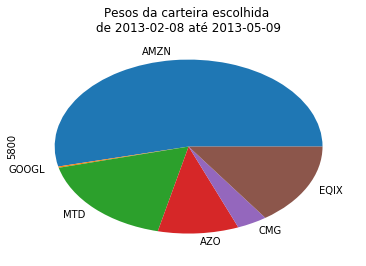

[63, 126]
Risco da Carteira = 15.80% ; Retorno da Carteira = 44.65%


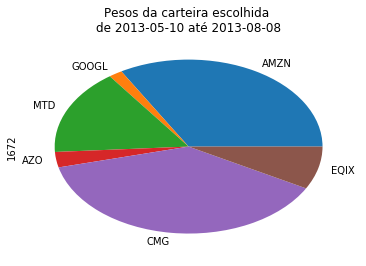

[126, 189]
Risco da Carteira = 13.27% ; Retorno da Carteira = 38.20%


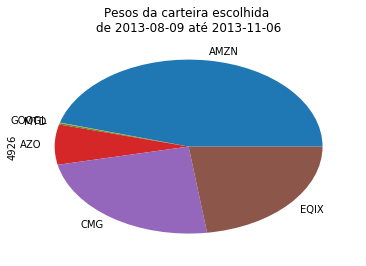

[189, 252]
Risco da Carteira = 17.79% ; Retorno da Carteira = 53.04%


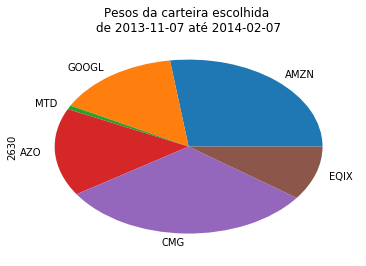

[252, 315]
Risco da Carteira = 16.45% ; Retorno da Carteira = 36.34%


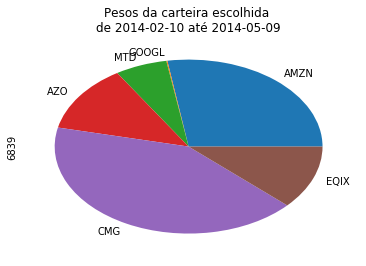

[315, 378]
Risco da Carteira = 13.73% ; Retorno da Carteira = 29.75%


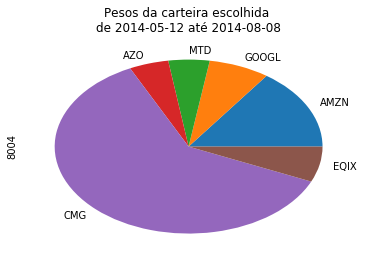

[378, 441]
Risco da Carteira = 16.63% ; Retorno da Carteira = 30.96%


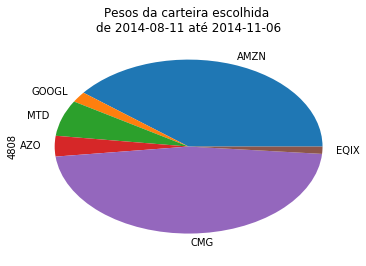

[441, 504]
Risco da Carteira = 17.27% ; Retorno da Carteira = 58.16%


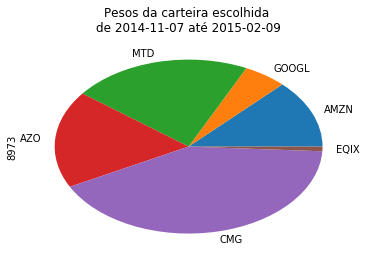

[504, 567]
Risco da Carteira = 15.00% ; Retorno da Carteira = 31.89%


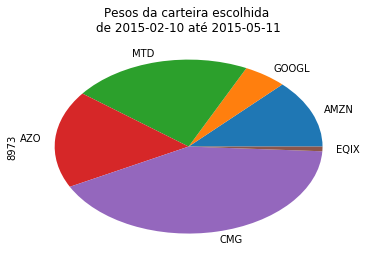

[567, 630]
Risco da Carteira = 13.43% ; Retorno da Carteira = 35.92%


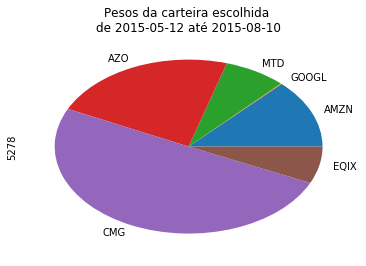

[630, 693]
Risco da Carteira = 22.81% ; Retorno da Carteira = 24.79%


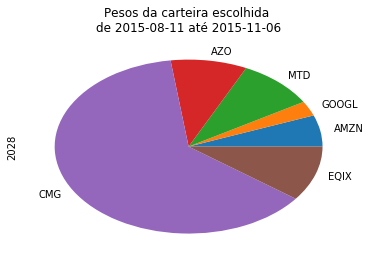

[693, 756]
Risco da Carteira = 23.26% ; Retorno da Carteira = -34.21%


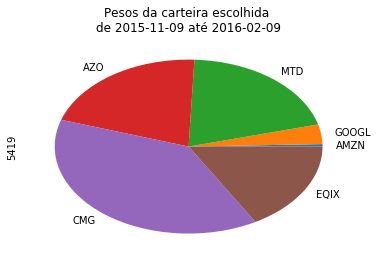

[756, 819]
Risco da Carteira = 16.83% ; Retorno da Carteira = 86.28%


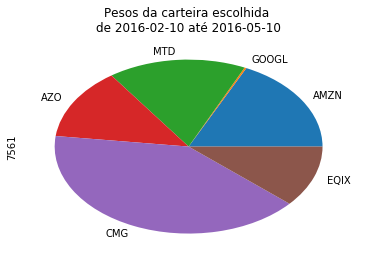

[819, 882]
Risco da Carteira = 15.76% ; Retorno da Carteira = 52.63%


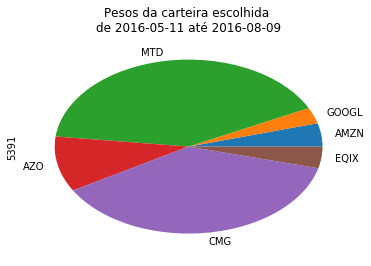

[882, 945]
Risco da Carteira = 15.13% ; Retorno da Carteira = 4.63%


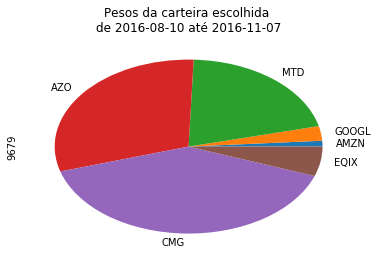

[945, 1008]
Risco da Carteira = 16.17% ; Retorno da Carteira = 33.24%


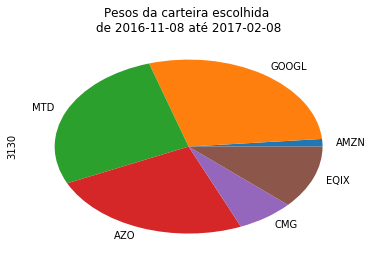

[1008, 1071]
Risco da Carteira = 12.00% ; Retorno da Carteira = 66.33%


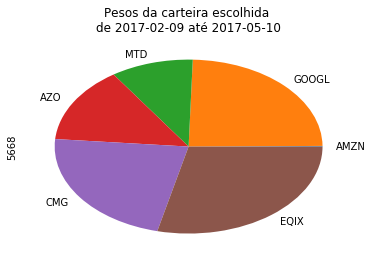

[1071, 1134]
Risco da Carteira = 13.67% ; Retorno da Carteira = 48.10%


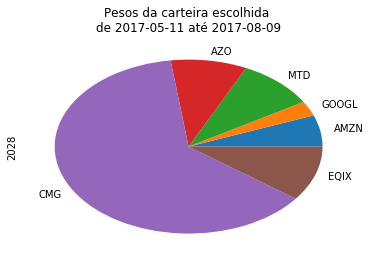

[1134, 1197]
Risco da Carteira = 12.58% ; Retorno da Carteira = 45.27%


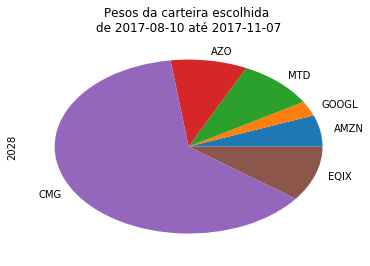

[1197, 1260]
Risco da Carteira = 16.08% ; Retorno da Carteira = -0.26%


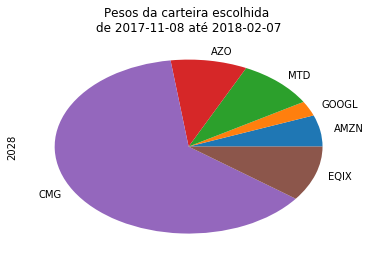

In [285]:
df_final2 = pd.DataFrame()
df_dinicial2 = pd.DataFrame()
df_dfinal2 = pd.DataFrame()
a = 0
for i in range(63,1261,63):
    print([a,i])
    retorno2, data_inicial2, data_final2 = markowitz(log_retorno_ret_usa.iloc[a:i])
    df_final2 = df_final2.append([retorno2], ignore_index=True)
    df_dinicial2 = df_dinicial2.append([data_inicial2], ignore_index=True)
    df_dfinal2 = df_dfinal2.append([data_final2], ignore_index=True)
    a = i
df_final2 = pd.concat([df_dinicial2, df_dfinal2, df_final2], axis=1, ignore_index=True)
df_final2.columns = ['Data Inicio','Data Fim','Risco','Retorno','NVDA', 'NFLX', 'ALGN', 'EA', 'STZ', 'AVGO']

In [286]:
df_montante2 = pd.DataFrame()
p0 =  100000
df_montante2 = df_montante2.append([p0], ignore_index=True)
for j in range(19):
    # numero de acoes compradas
    p0 = df_final2.iloc[j,4:] * p0 / ret_usa.loc[df_final2['Data Inicio'].iloc[j+1]]
    print(p0)
    # valorizacao das acoes
    p0 = (p0 * ret_usa.loc[df_final2['Data Fim'].iloc[j+1]]).sum()
    print(p0)
    df_montante2 = df_montante2.append([p0], ignore_index=True)

NVDA   3692.36
NFLX      7.61
ALGN    471.43
EA      433.56
STZ      74.19
AVGO    448.82
dtype: object
107683.156517
NVDA   2480.30
NFLX     49.10
ALGN    391.65
EA      115.76
STZ     757.53
AVGO    233.19
dtype: object
125537.519327
NVDA   3931.66
NFLX      2.96
ALGN      5.48
EA      369.34
STZ     455.97
AVGO    655.37
dtype: object
145336.457234
NVDA   2485.03
NFLX    353.74
ALGN     19.08
EA      882.45
STZ     579.50
AVGO    259.12
dtype: object
156826.462736
NVDA   2324.73
NFLX      4.01
ALGN    192.12
EA      556.69
STZ     815.95
AVGO    268.19
dtype: object
161656.98495
NVDA   1292.62
NFLX    184.47
ALGN    147.95
EA      219.08
STZ    1163.56
AVGO    150.45
dtype: object
174973.554909
NVDA   3480.96
NFLX     62.92
ALGN    222.78
EA      163.44
STZ     875.66
AVGO     27.55
dtype: object
196820.615869
NVDA   1189.38
NFLX    158.98
ALGN    765.12
EA      649.92
STZ     720.09
AVGO     15.86
dtype: object
210380.545793
NVDA   1278.64
NFLX    132.18
ALGN    777.39
EA      609.

In [287]:
df_final2['Montante'] = df_montante2
df_final2

,Data Inicio,Data Fim,Risco,Retorno,NVDA,NFLX,ALGN,EA,STZ,AVGO,Montante
0,2013-02-08,2013-05-09,0.20,0.44,0.54,0.00,0.17,0.10,0.04,0.15,100000.00
1,2013-05-10,2013-08-08,0.16,0.45,0.33,0.02,0.16,0.03,0.38,0.08,107683.16
2,2013-08-09,2013-11-06,0.13,0.38,0.46,0.00,0.00,0.07,0.24,0.23,125537.52
3,2013-11-07,2014-02-07,0.18,0.53,0.27,0.15,0.01,0.16,0.31,0.10,145336.46
4,2014-02-10,2014-05-09,0.16,0.36,0.28,0.00,0.06,0.13,0.42,0.12,156826.46
5,2014-05-12,2014-08-08,0.14,0.30,0.15,0.07,0.05,0.05,0.61,0.07,161656.98
6,2014-08-11,2014-11-06,0.17,0.31,0.39,0.02,0.07,0.04,0.47,0.01,174973.55
7,2014-11-07,2015-02-09,0.17,0.58,0.13,0.05,0.22,0.18,0.41,0.01,196820.62
8,2015-02-10,2015-05-11,0.15,0.32,0.13,0.05,0.22,0.18,0.41,0.01,210380.55
9,2015-05-12,2015-08-10,0.13,0.36,0.13,0.00,0.07,0.22,0.50,0.07,235116.73


# Hurst Aplicado

In [110]:
def hurst(nome):        
    serie = nome.values
    # variavel com o tamanho do vetor dados
    tamanhoDados = serie.shape[0]
    # variavel logTamanho
    logTamanho = tamanhoDados - 1
    # vetor de maxima
    max_ = np.zeros(logTamanho)
    # vetor de minima
    min_ = np.zeros(logTamanho)
    # vetor de media
    media_ = np.zeros(logTamanho)
    # vetor de amplitude
    range_ = np.zeros(logTamanho)
    # vetor de desvio padrao
    sdesvio_ = np.zeros(logTamanho)
    # vetor do eixo x
    eixo_x = np.zeros(logTamanho)
    # vetor do eixo y
    eixo_y = np.zeros(logTamanho)
    # matrix para calcular o Y
    Y_calculo = np.zeros((tamanhoDados-1,tamanhoDados))
    # preenchendo médias
    for i in np.arange(np.size(media_)):
        ch1 = 2+i
        media_[i] = serie[:ch1].sum() / ch1
    # preenchendo desvios
    for i in np.arange(np.size(sdesvio_)):
        ch1 = i + 2
        sdesvio_[i] = serie[:ch1].std()
    # preenchendo o range
    yAcumulado = 0
    for i in np.arange(np.size(max_)):
        ch1 = i + 2
        for j in range(ch1):
            Y_calculo[i][j] = serie[j] - serie[:ch1].mean() + yAcumulado
            yAcumulado = Y_calculo[i][j]
        max_[i] = Y_calculo[i].max()
        min_[i] = Y_calculo[i].min()
        range_[i] = max_[i] - min_[i]
    # calculando o eixo x
    for i in np.arange(np.size(max_)):
        eixo_x[i] = np.log2(i+2.0)
    # calculando o eixo y
    for i in np.arange(np.size(range_)):
        eixo_y[i] = np.log2((range_[i] / sdesvio_[i]))
    
    # criar figura
    # figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')
    # acrecentar MMQ
    mx = eixo_x.mean()
    my = eixo_y.mean()
    temp = eixo_x - mx
    c1 = np.sum(temp * (eixo_y-my)) / np.sum(temp ** 2)
    c0 = my - c1 * mx
    
    return c1

# Maiores Retornos (EUA)

[0, 63]


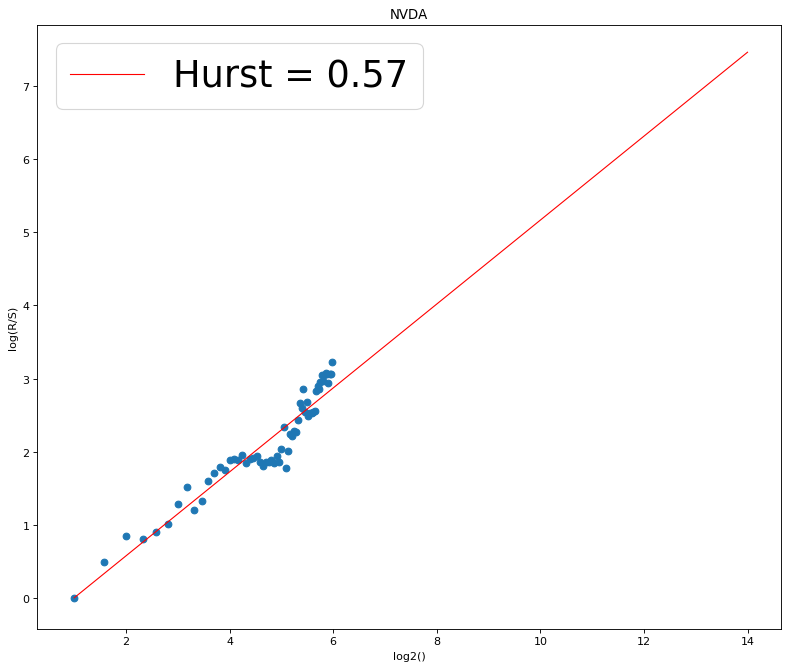

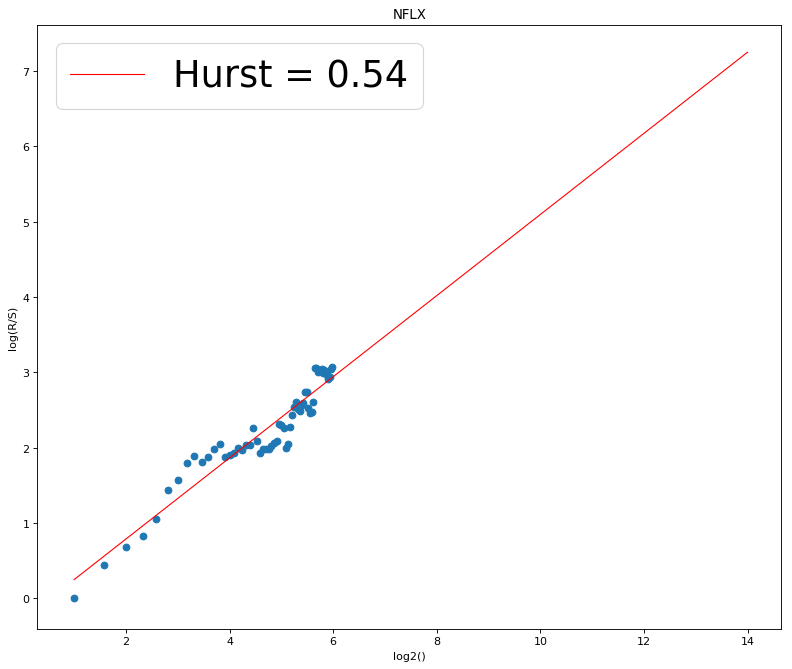

/Users/caiosalgado/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:6201: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=True'.

To retain the current behavior and silence the warning, pass sort=False

  sort=sort)


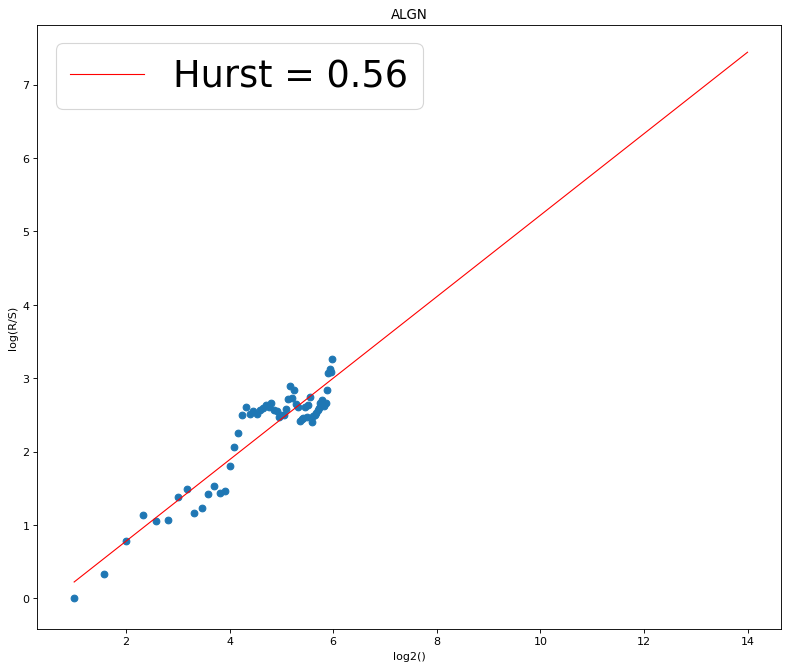

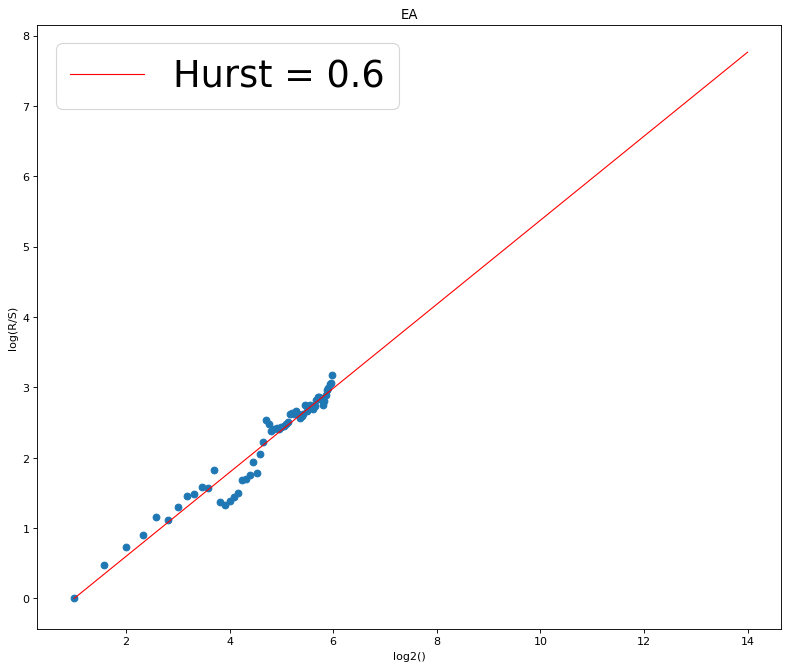

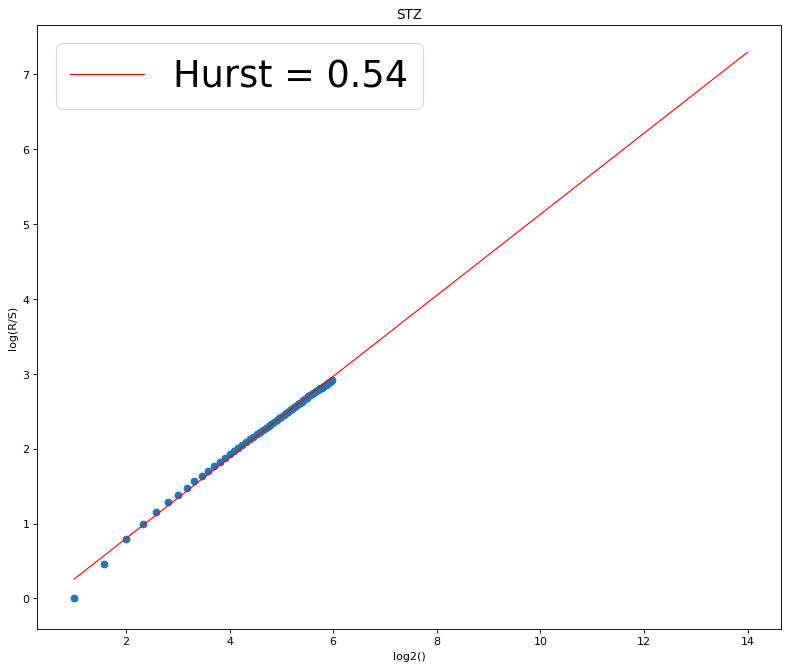

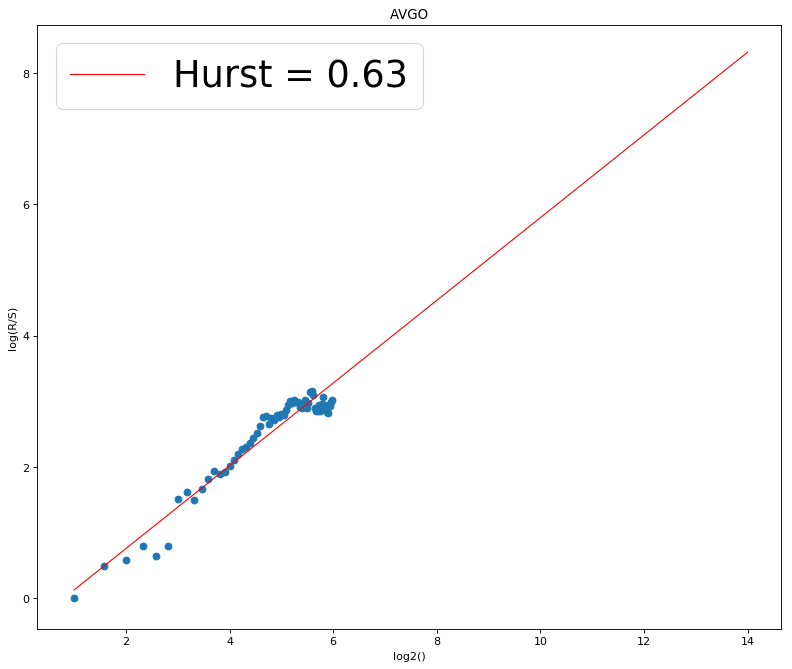

[63, 126]


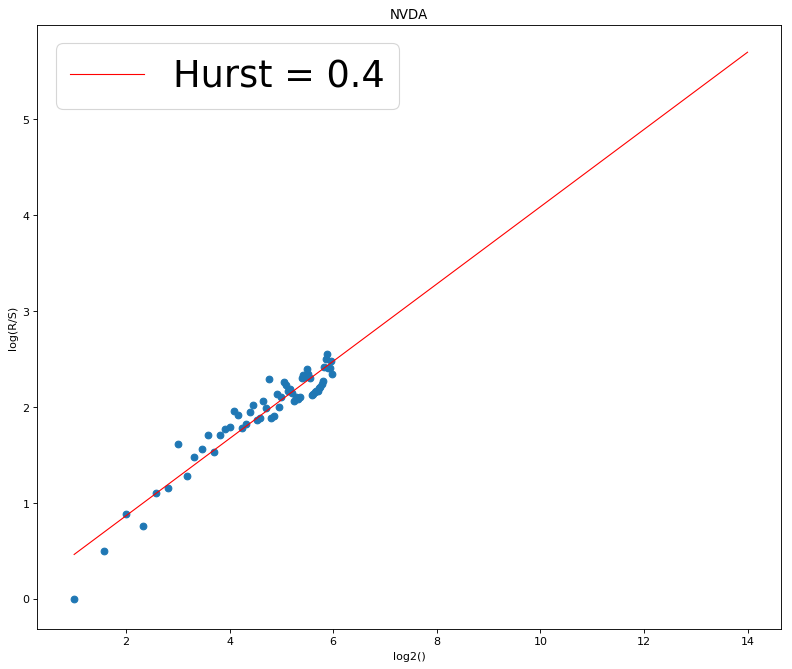

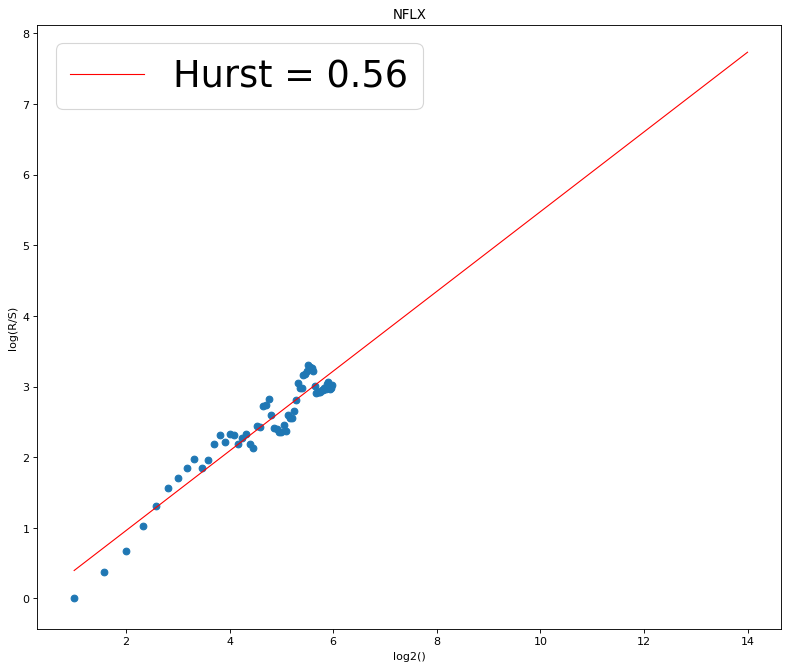

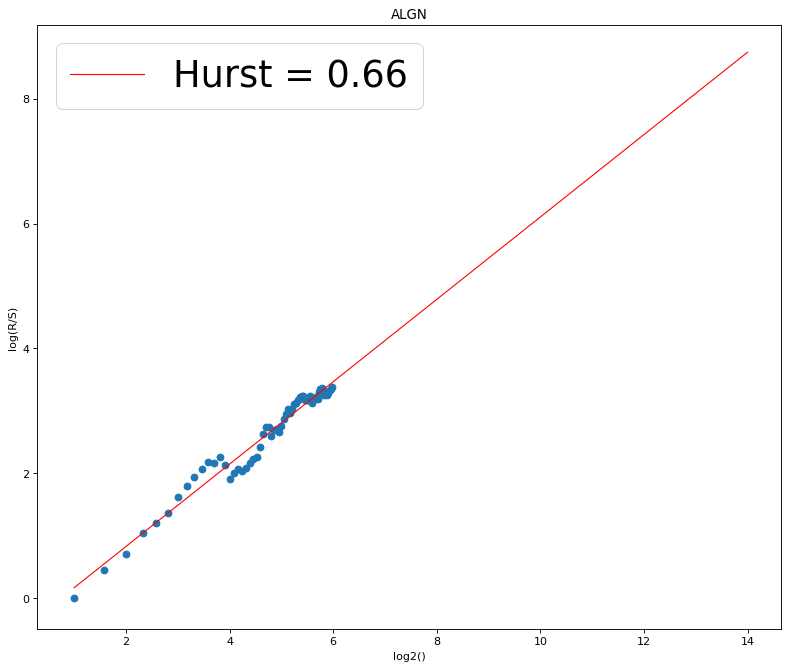

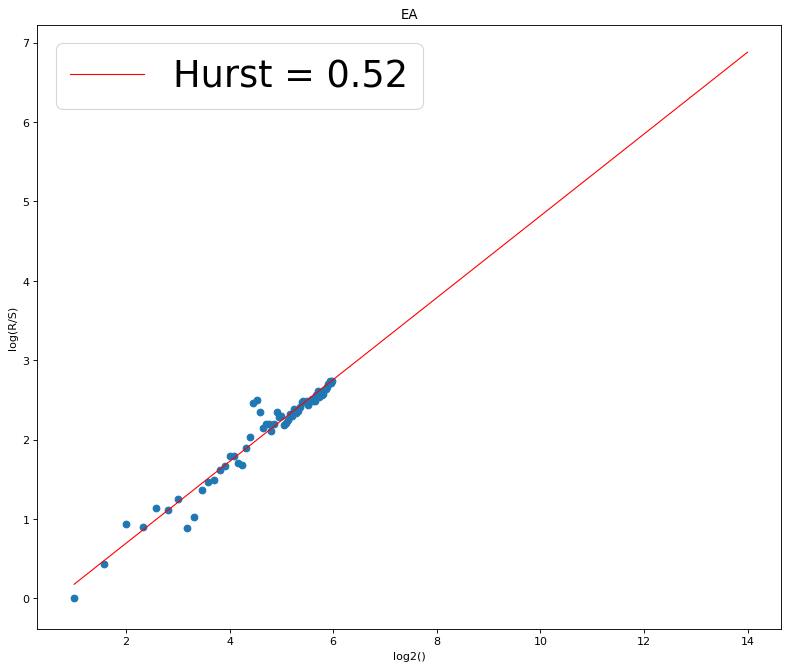

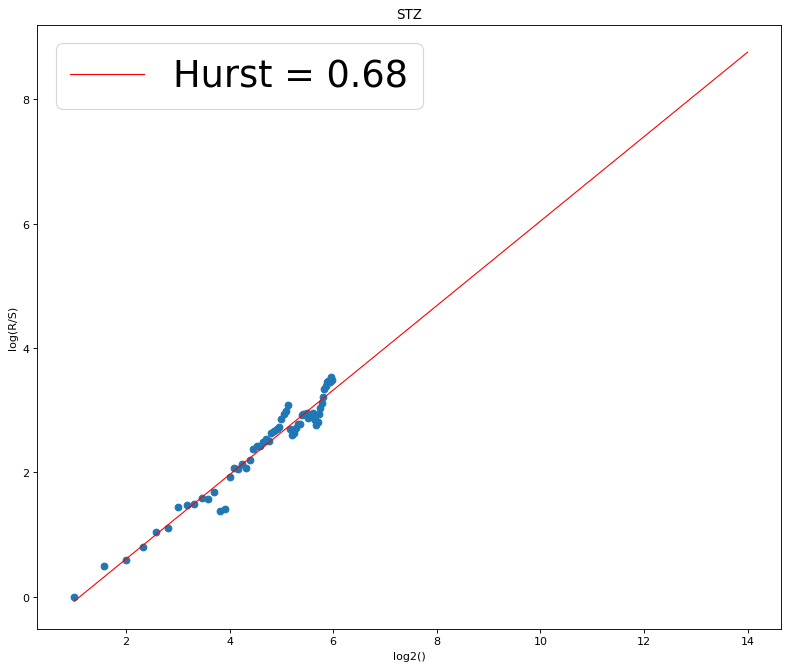

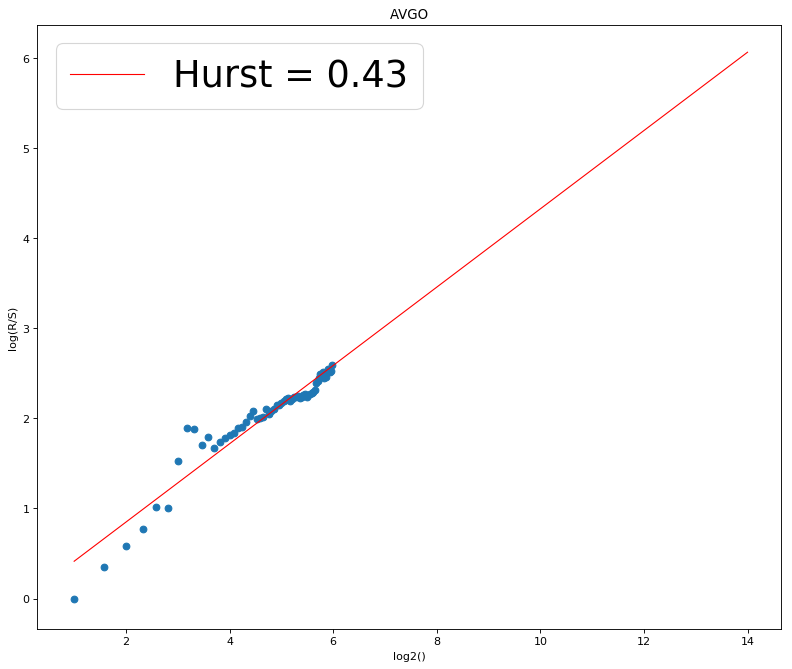

[126, 189]


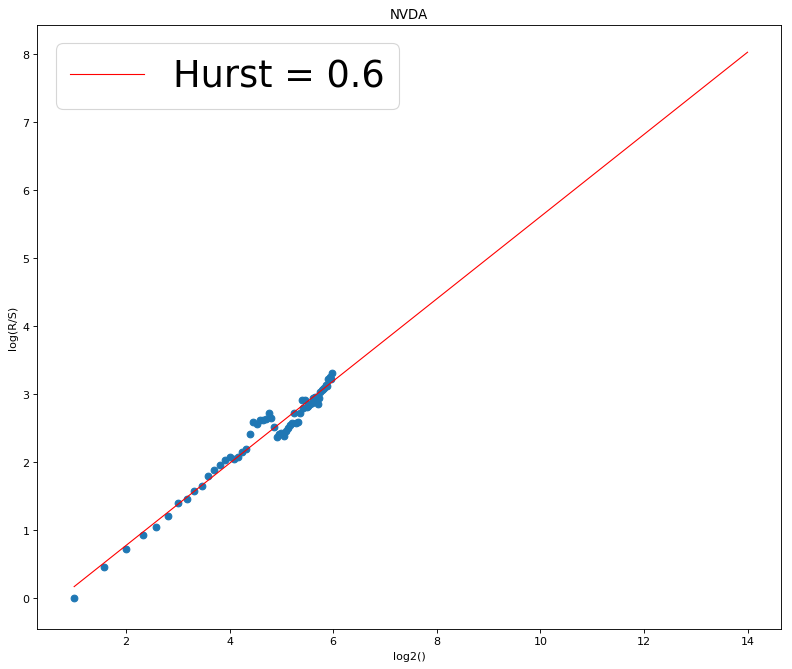

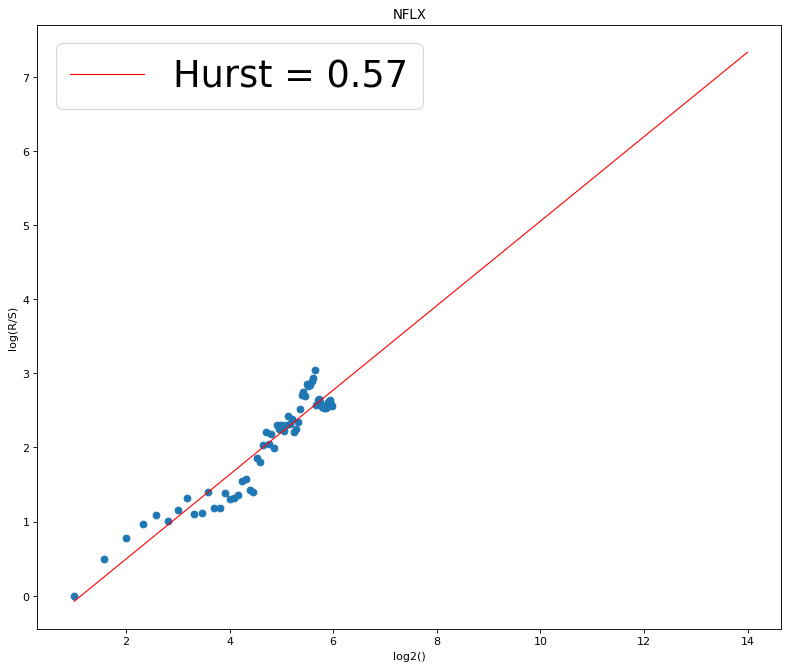

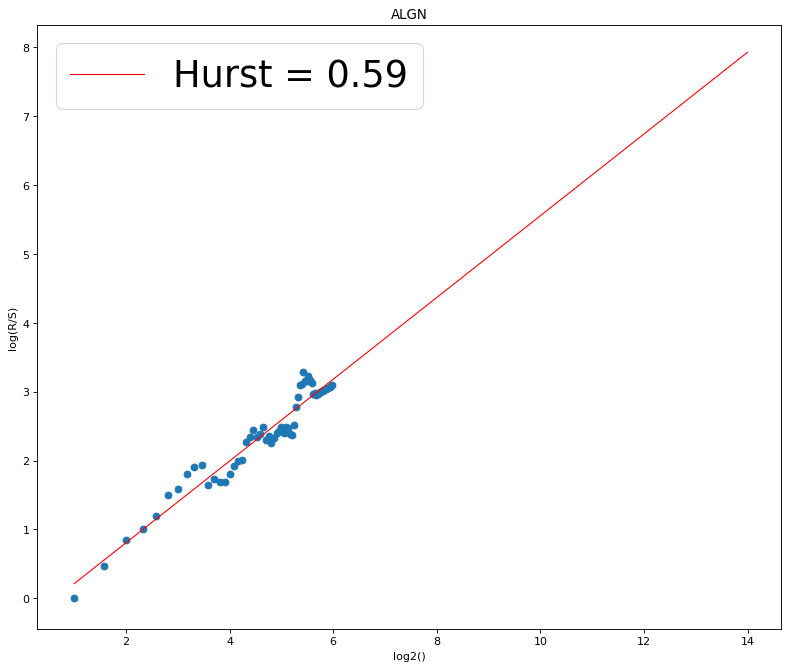

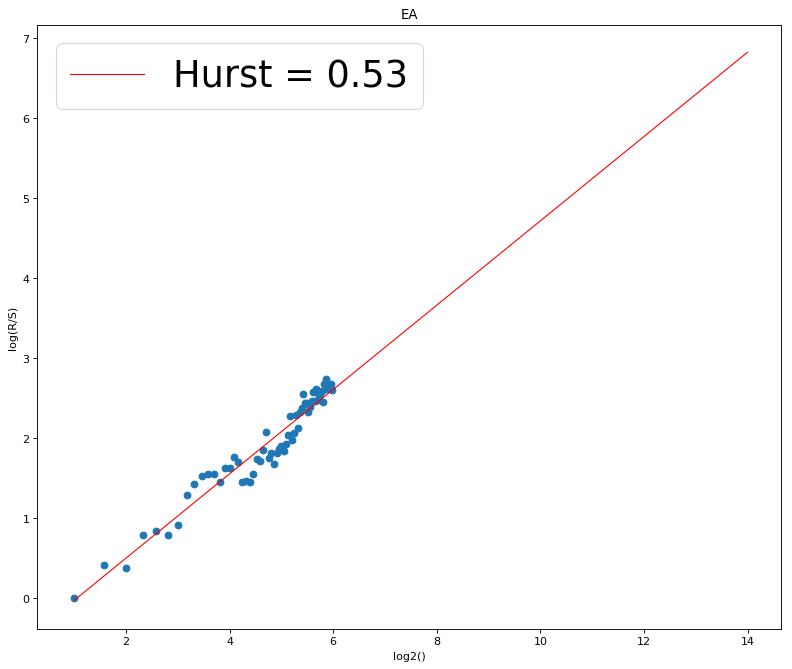

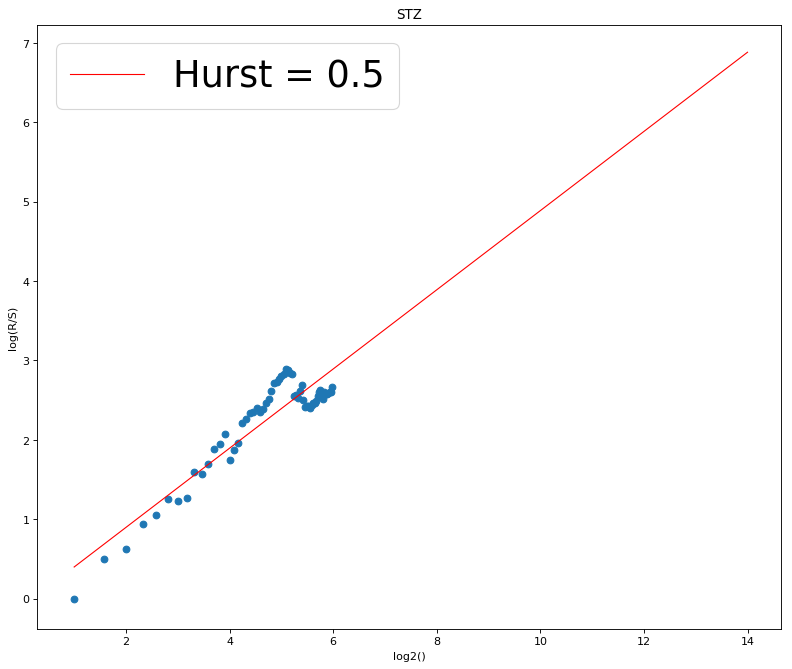

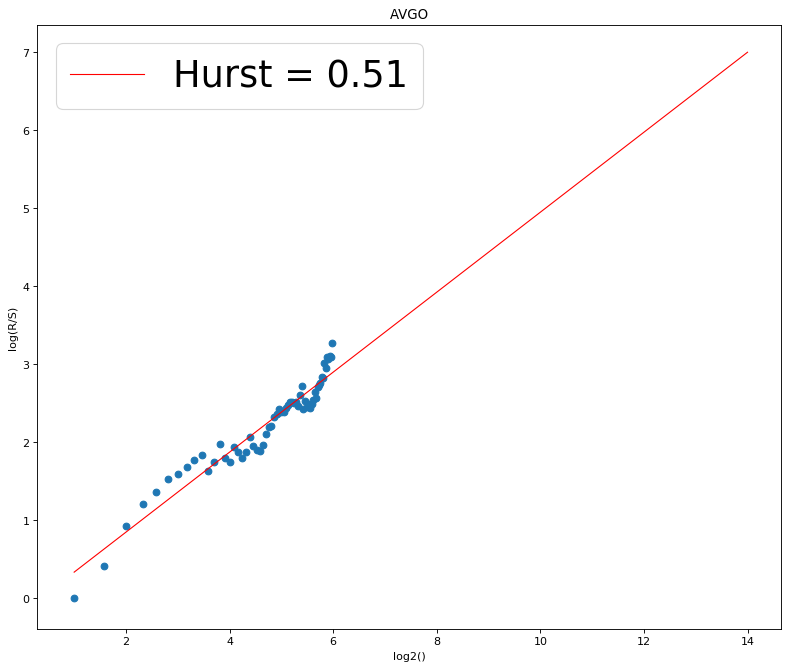

[189, 252]


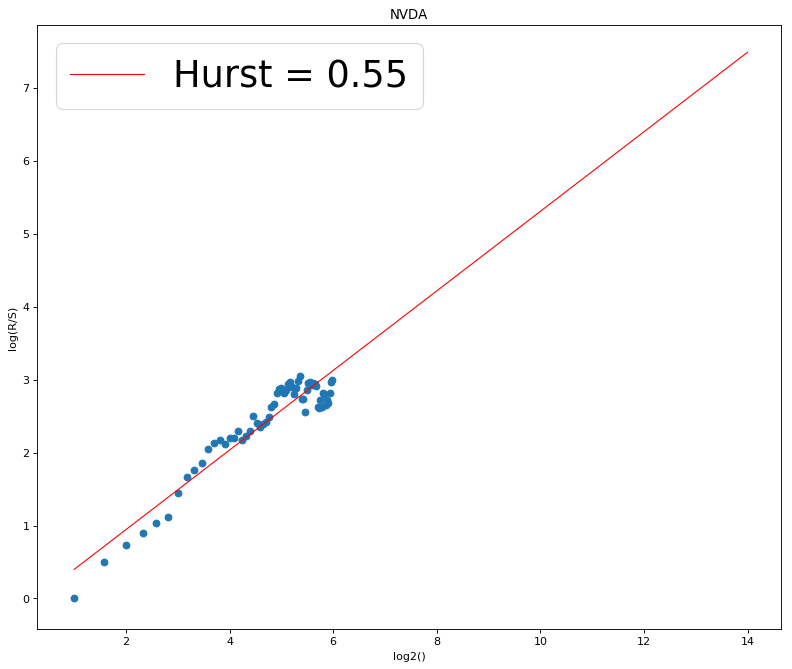

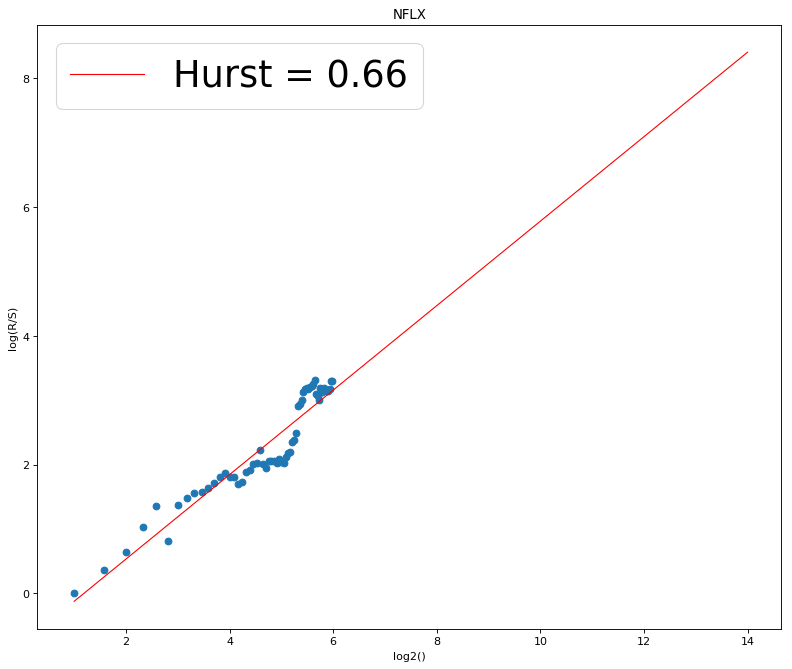

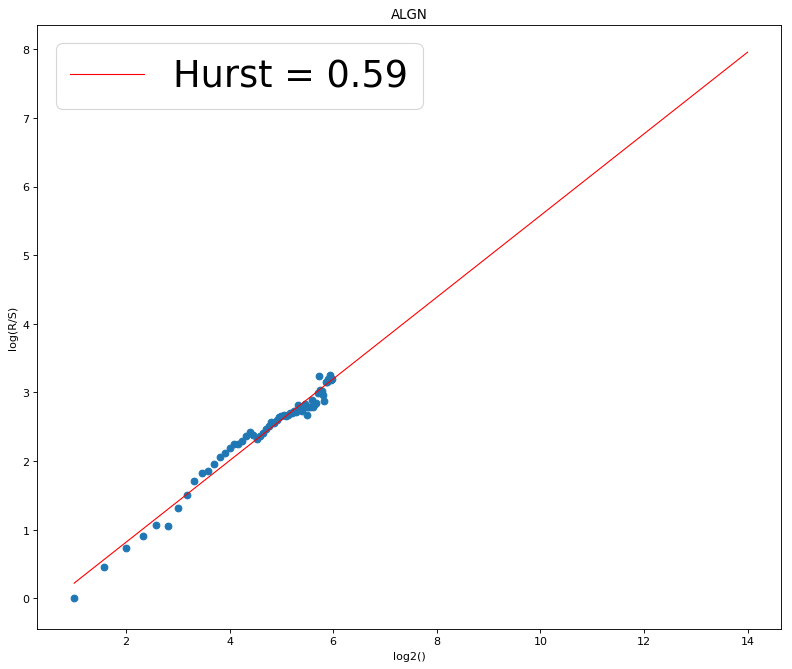

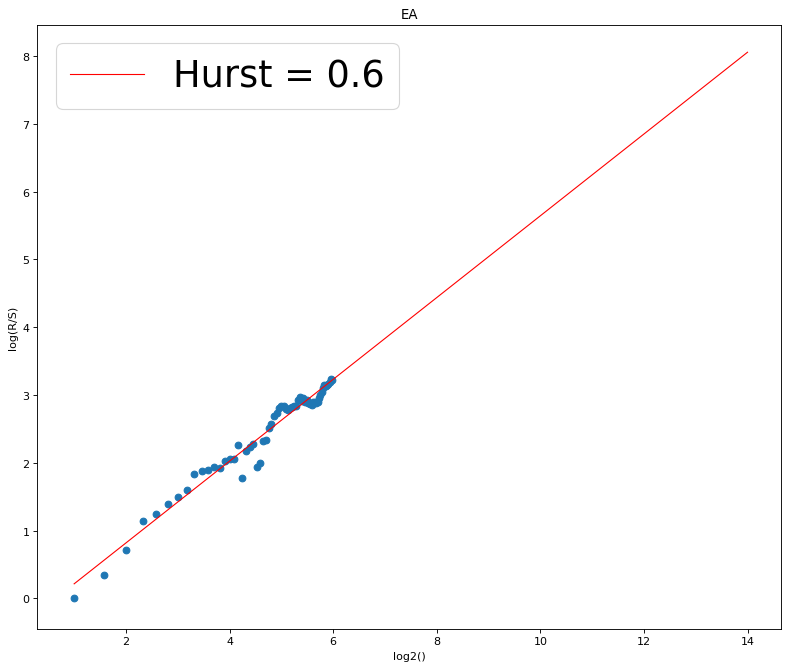

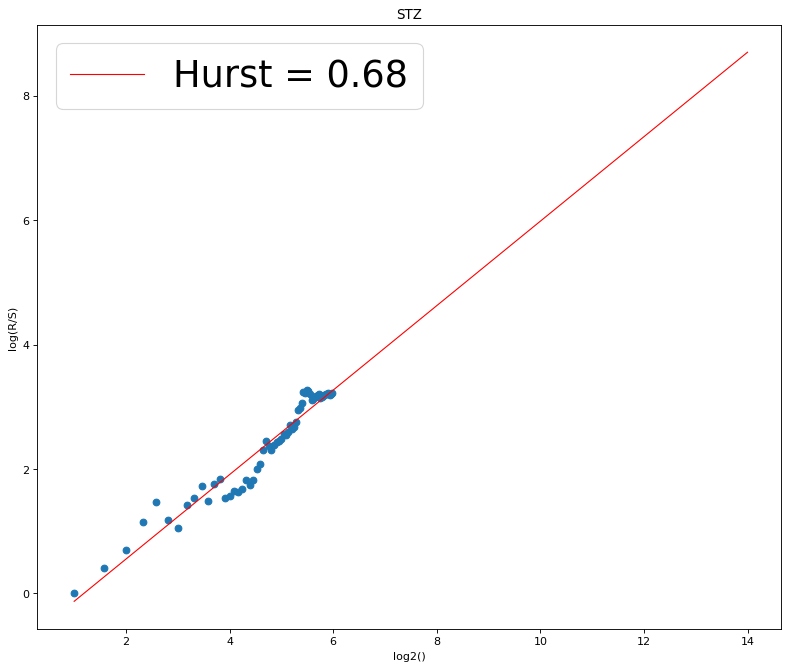

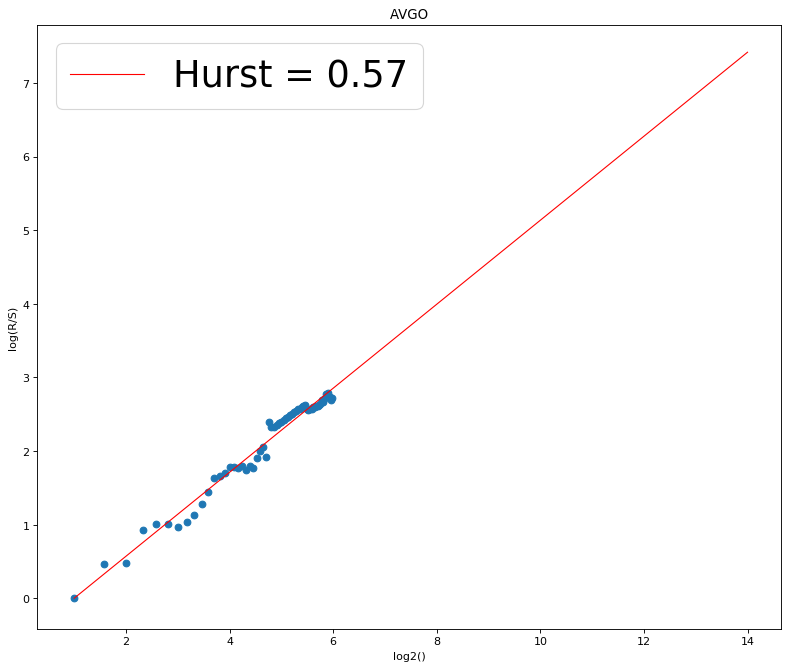

[252, 315]


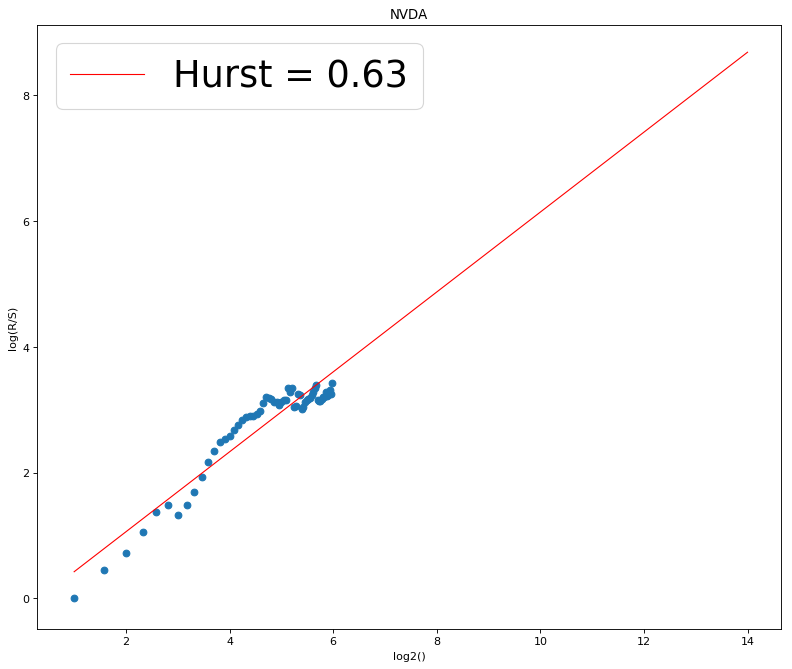

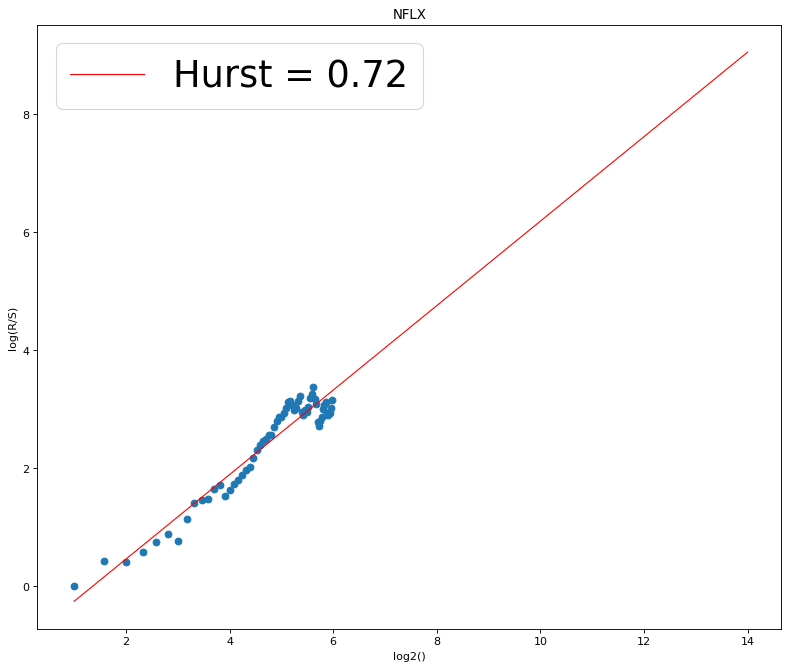

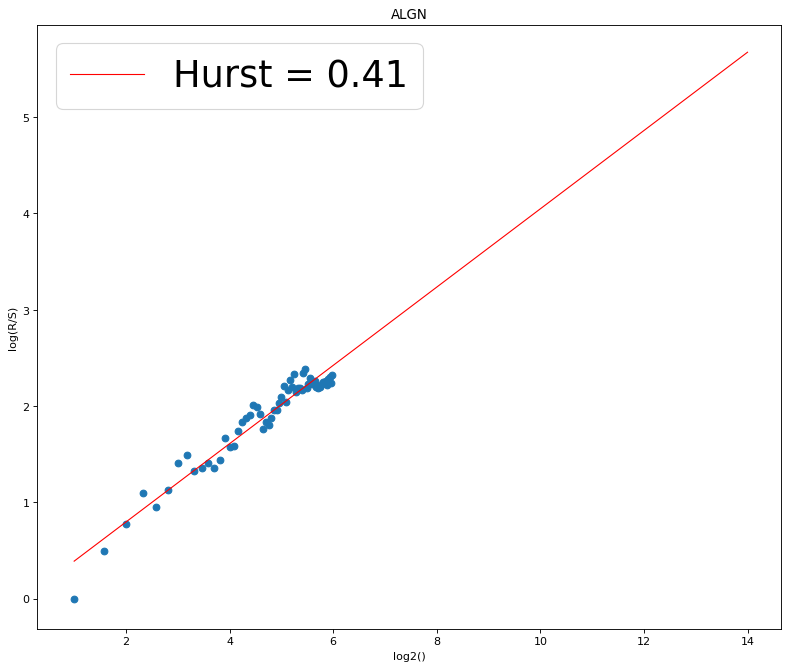

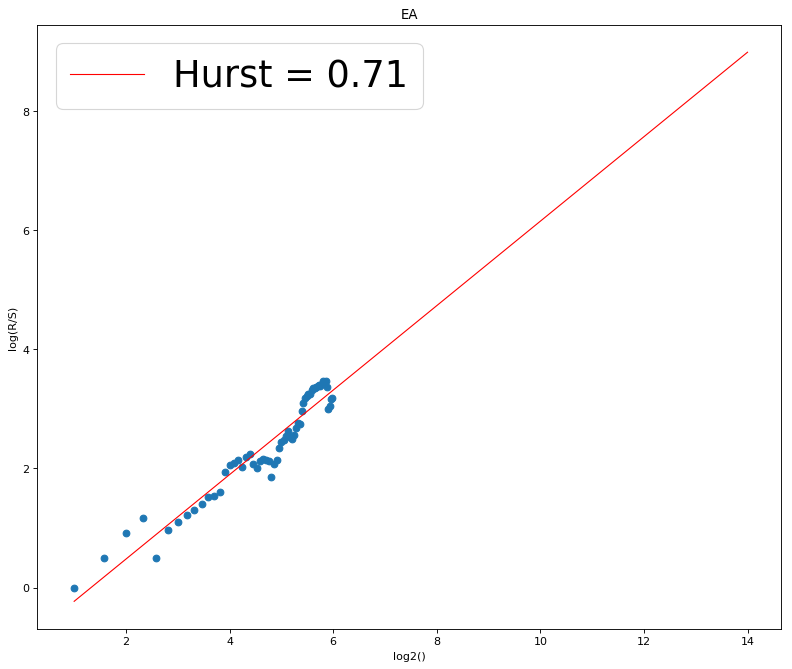

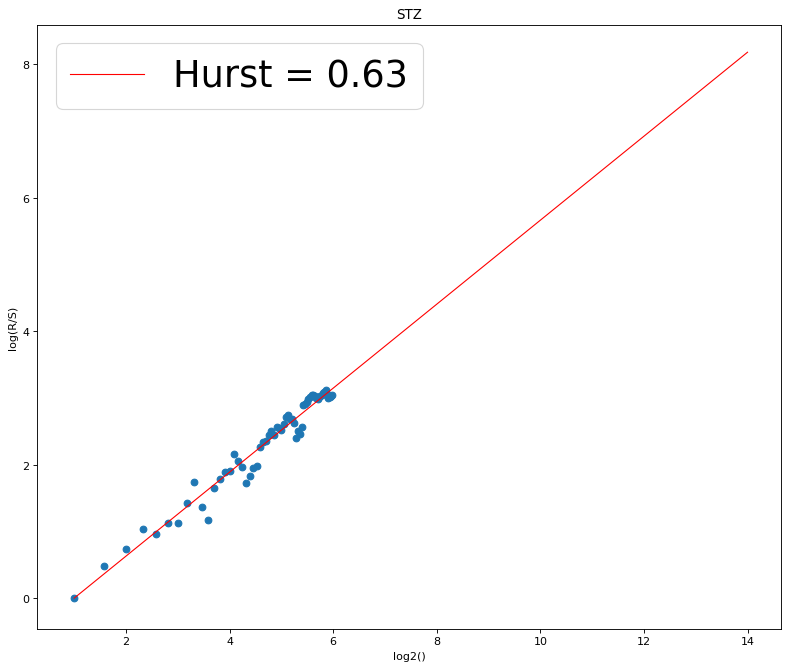

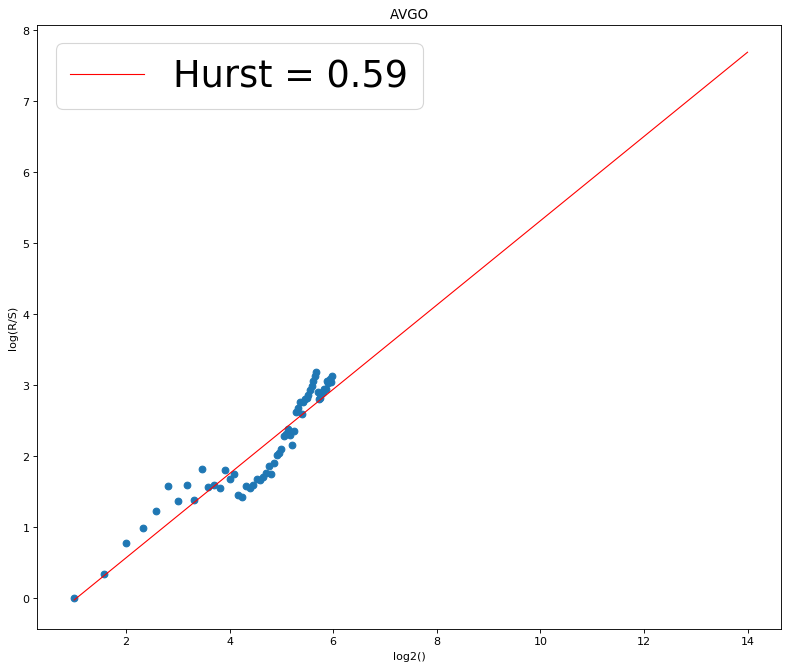

[315, 378]


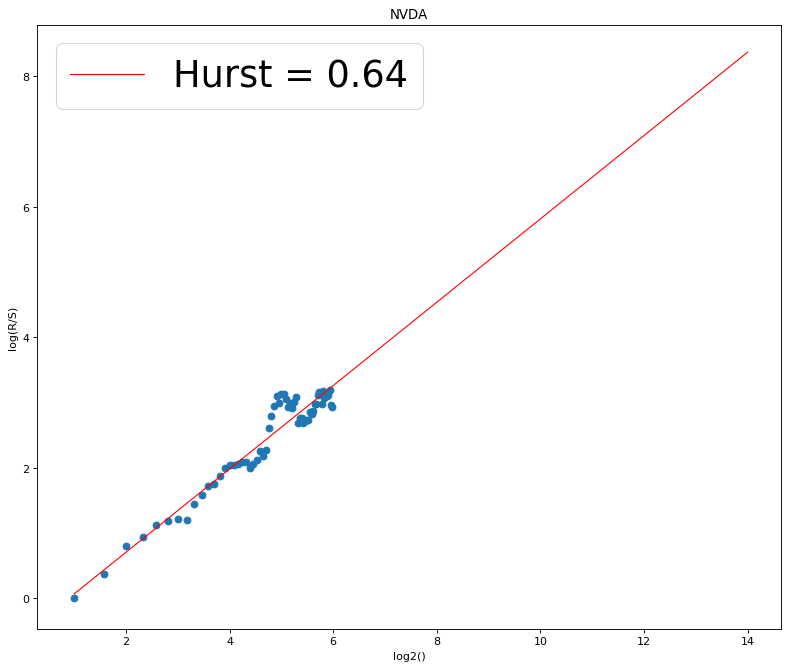

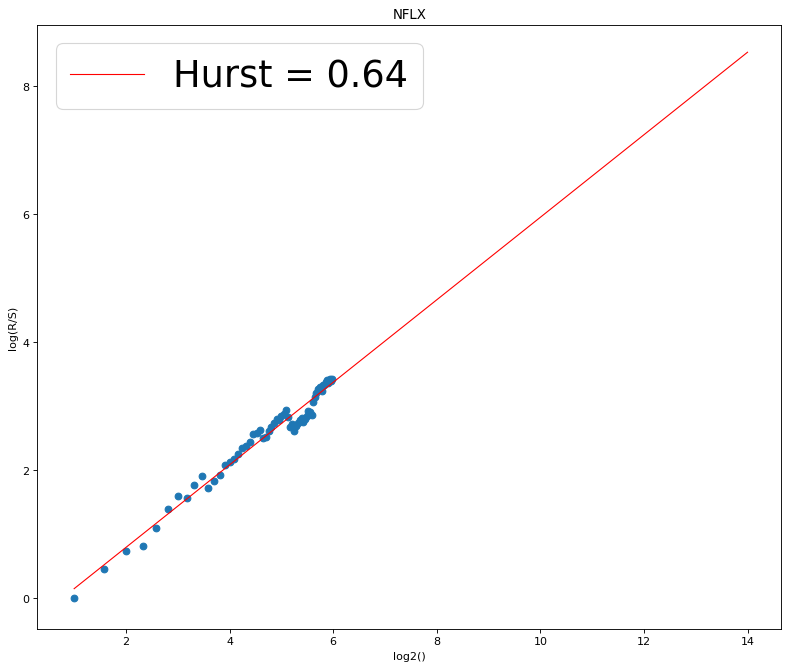

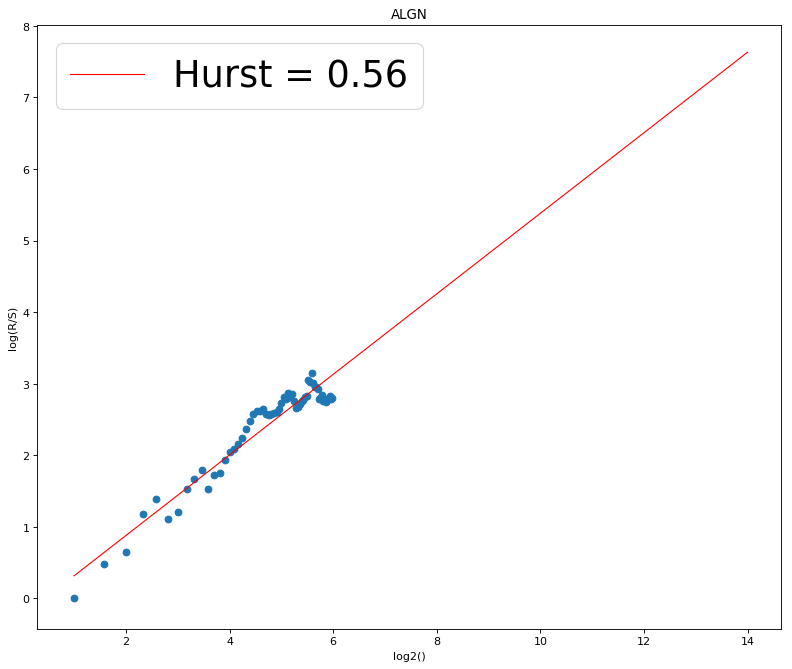

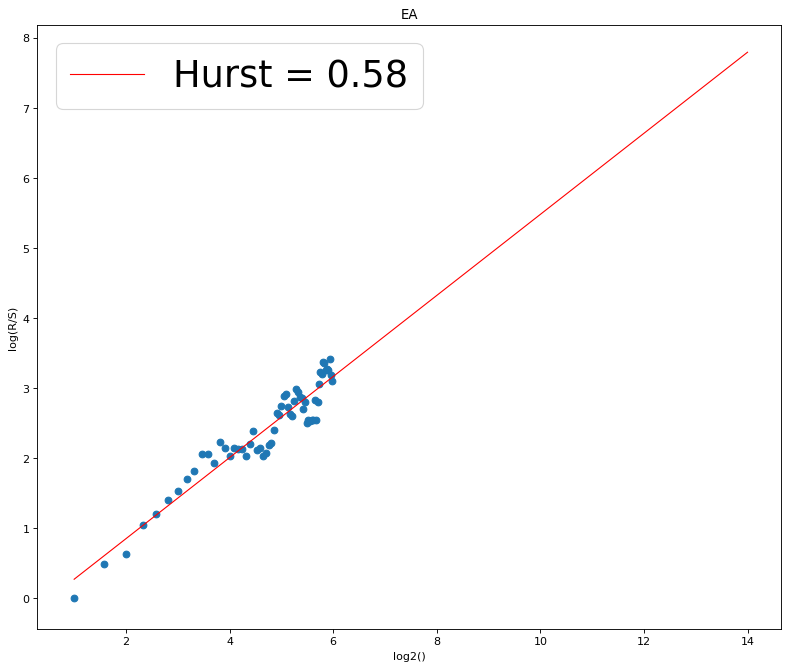

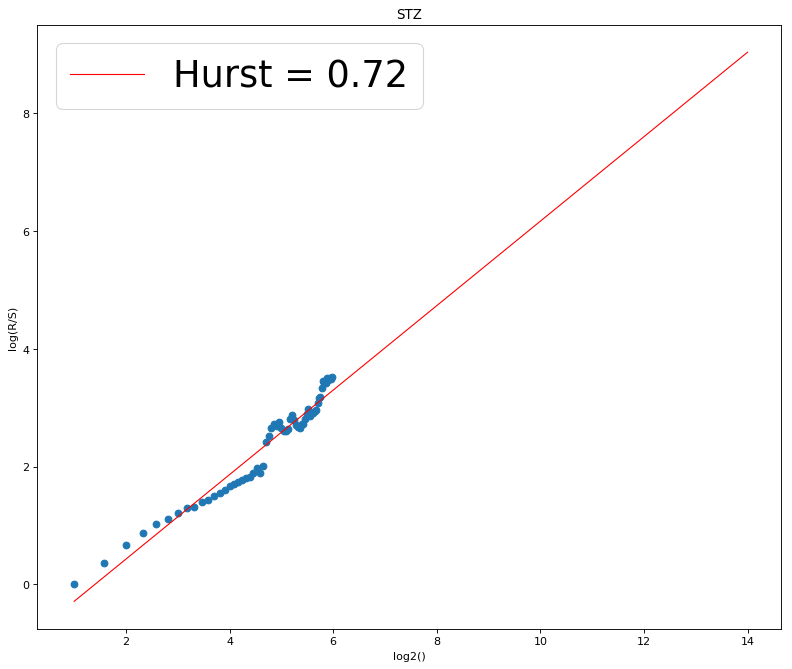

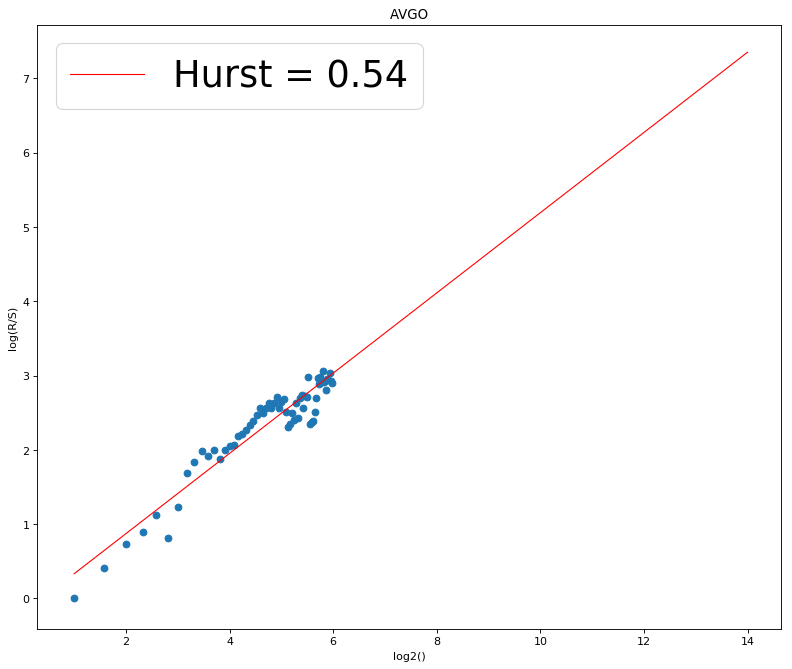

[378, 441]


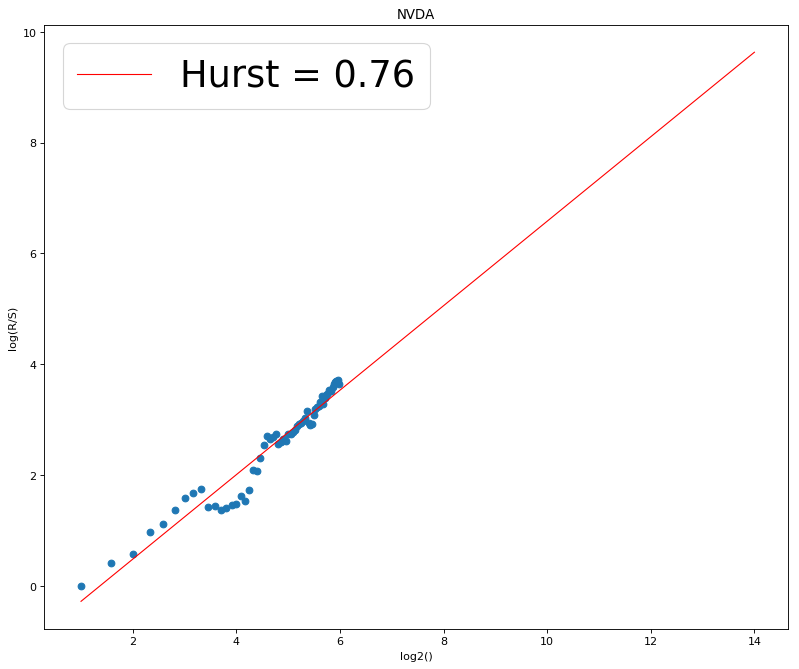

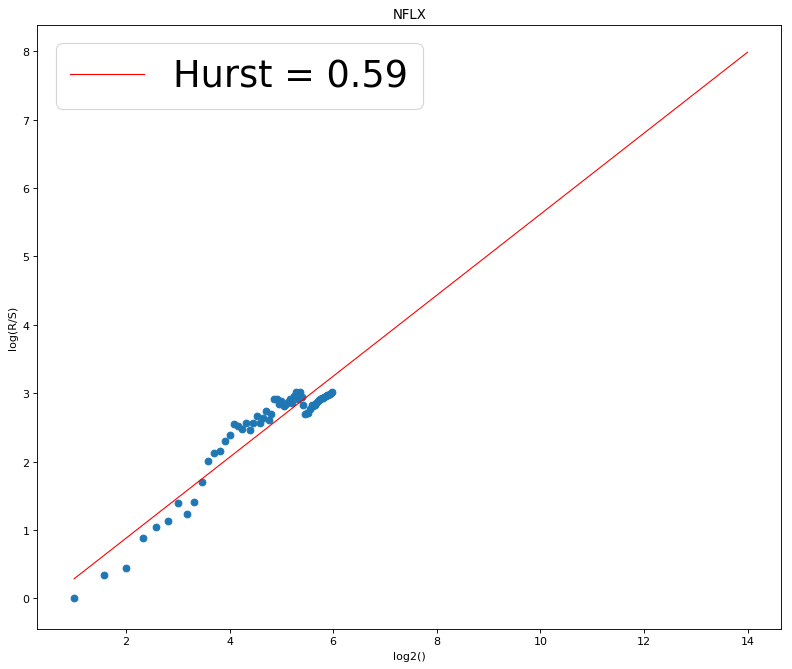

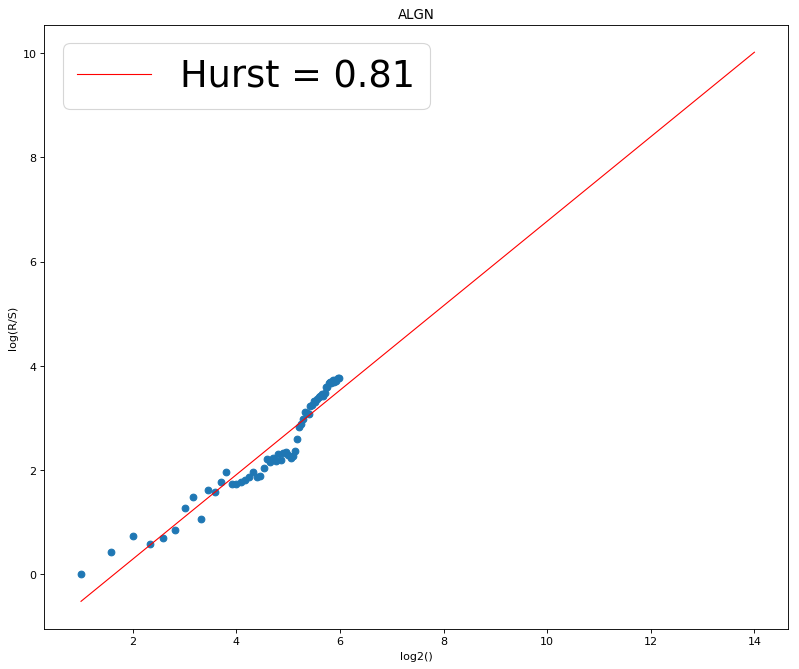

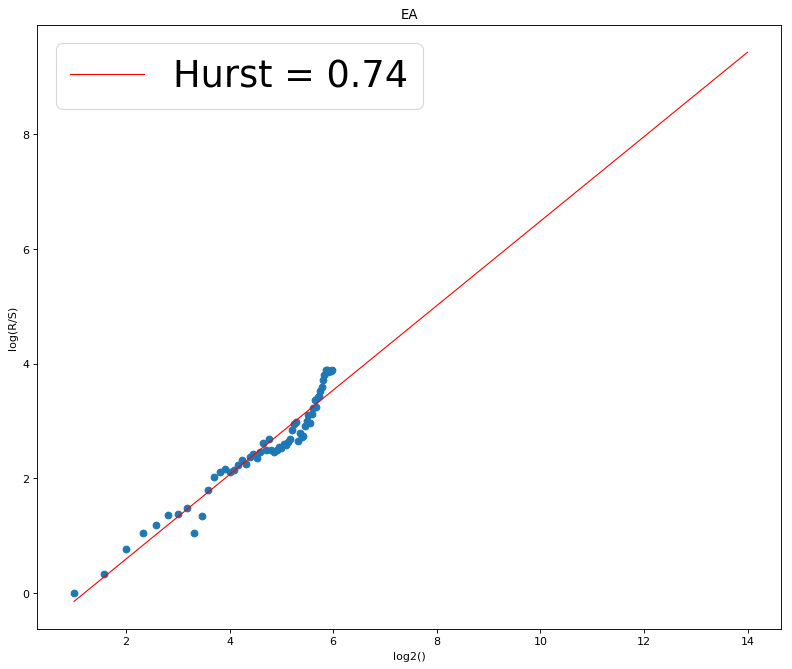

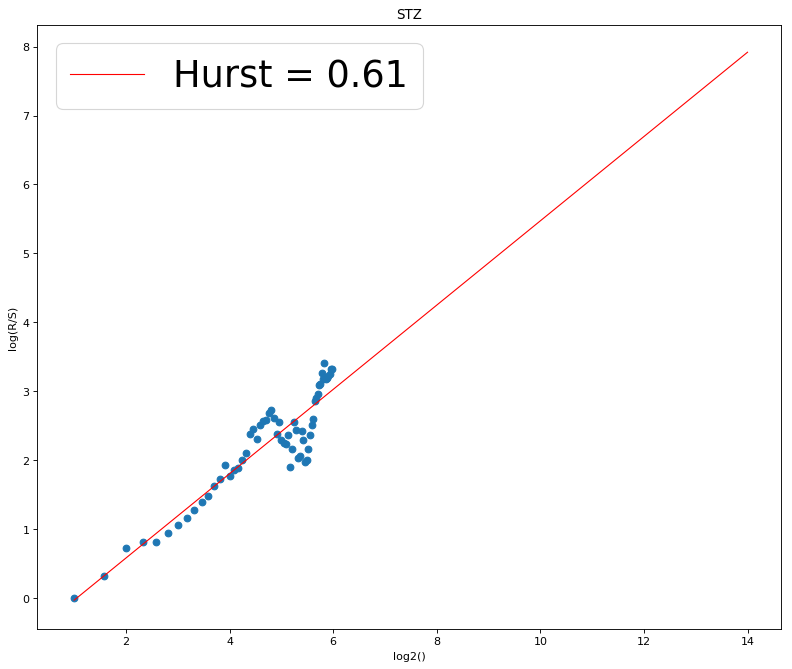

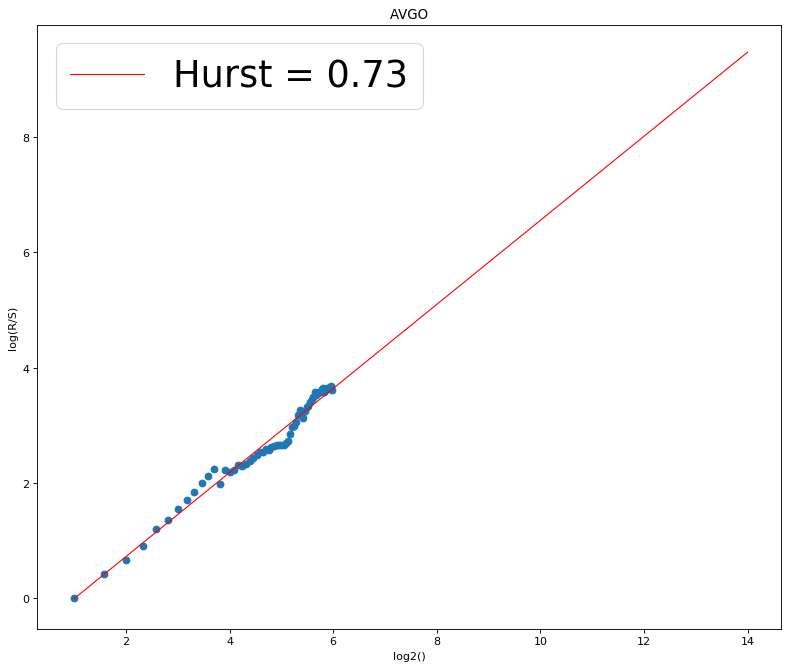

[441, 504]


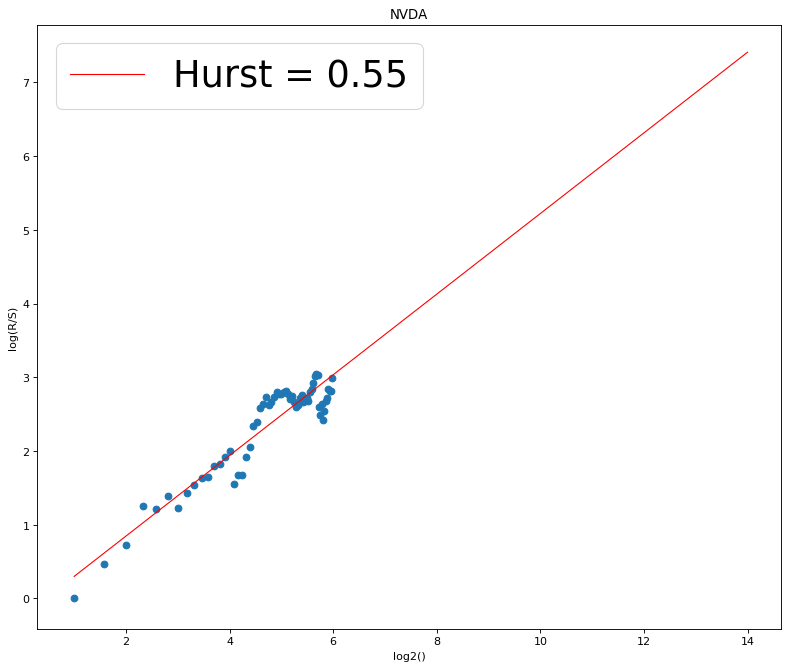

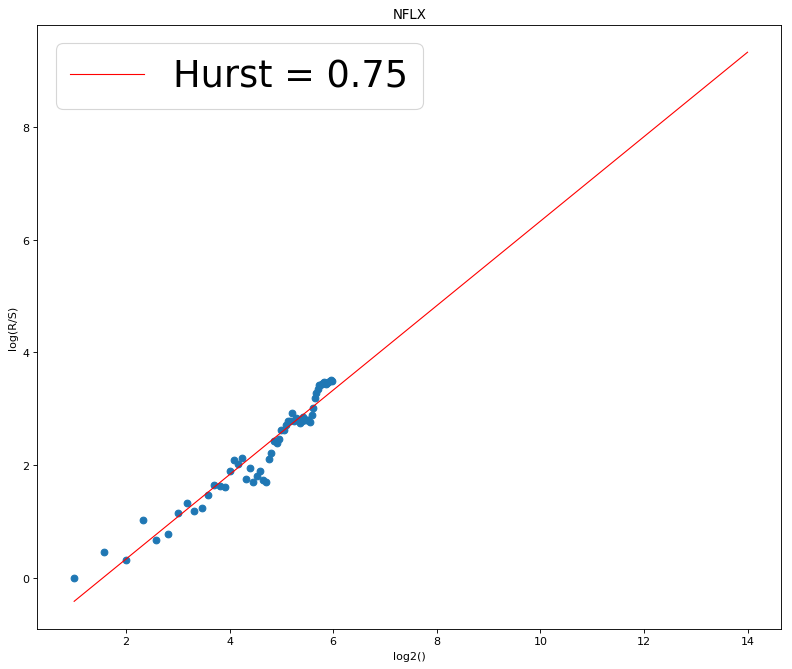

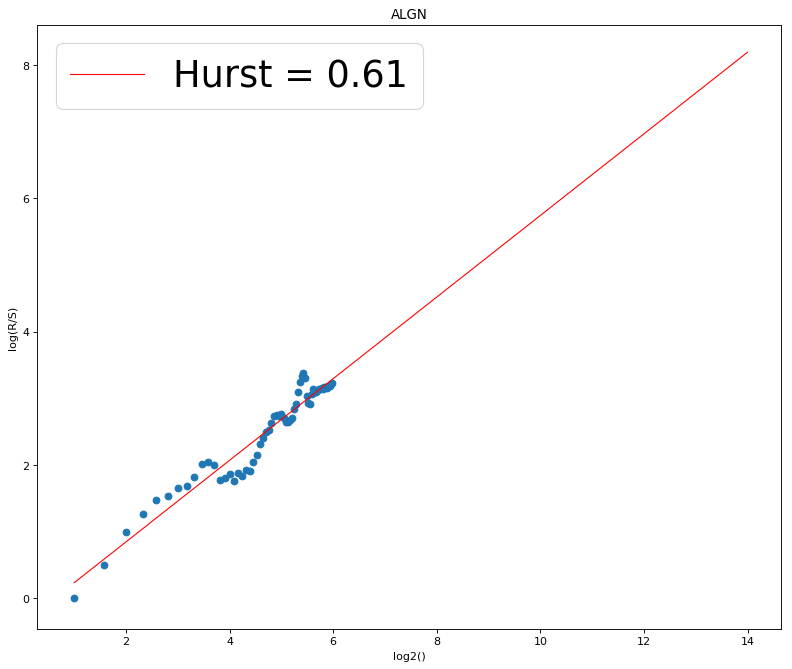

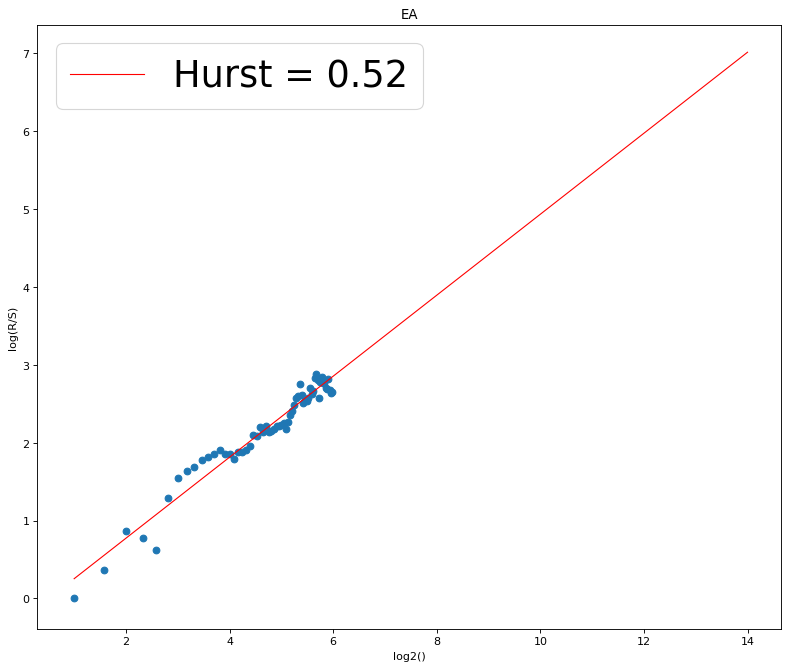

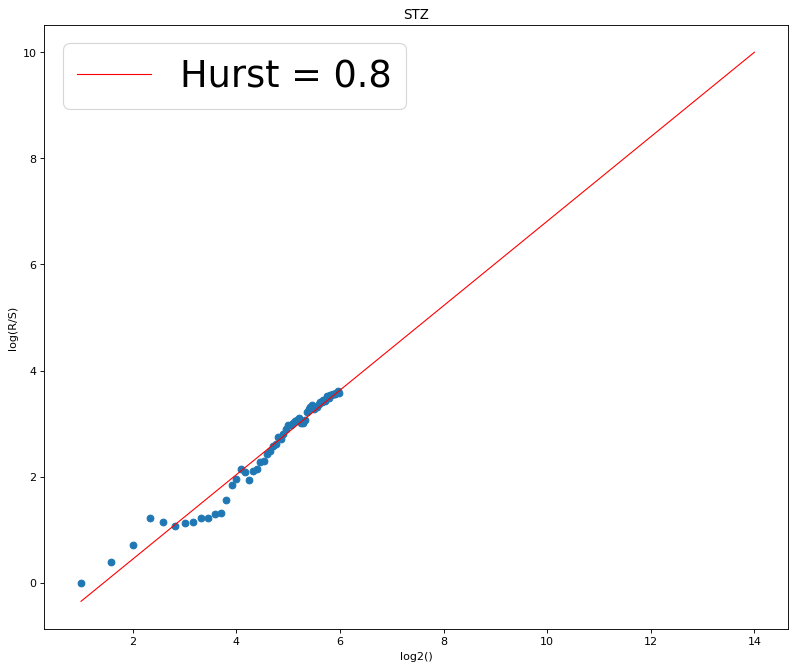

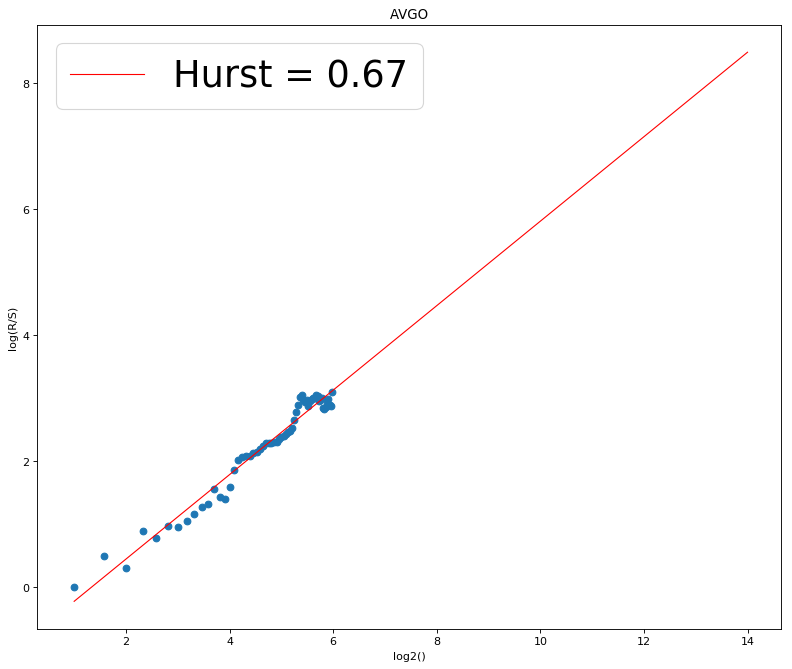

[504, 567]


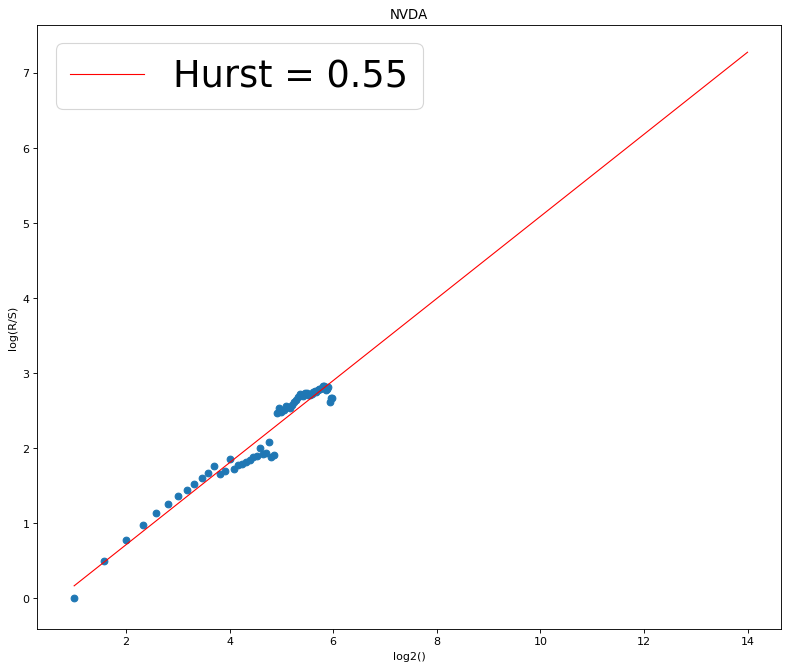

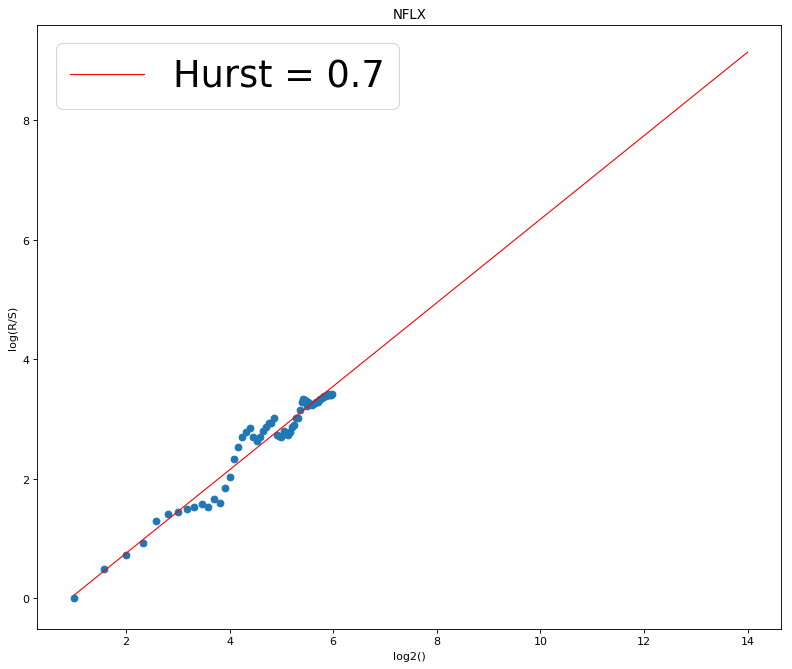

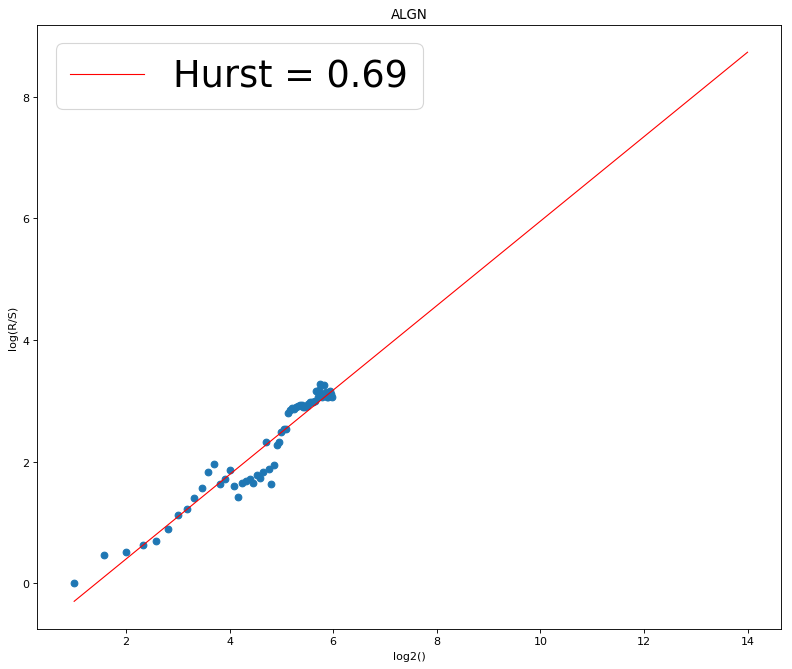

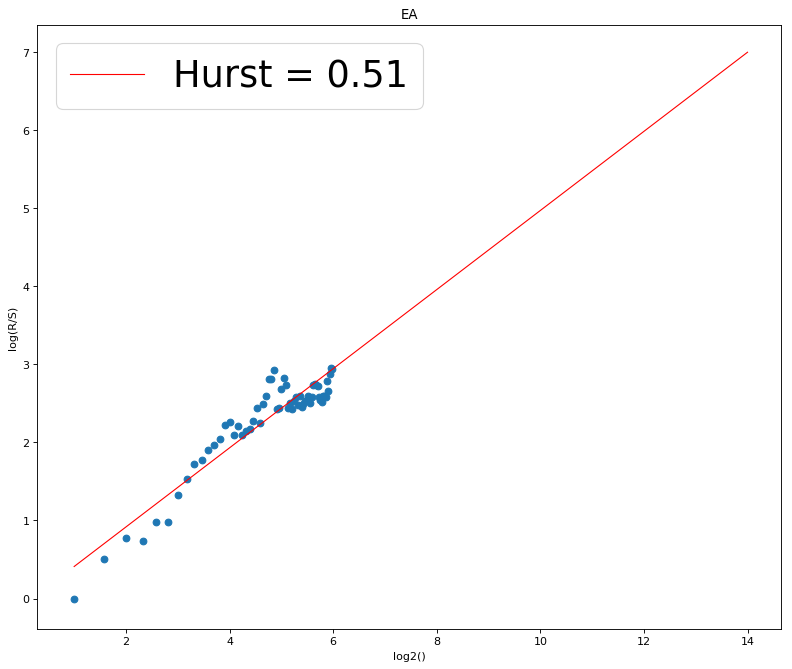

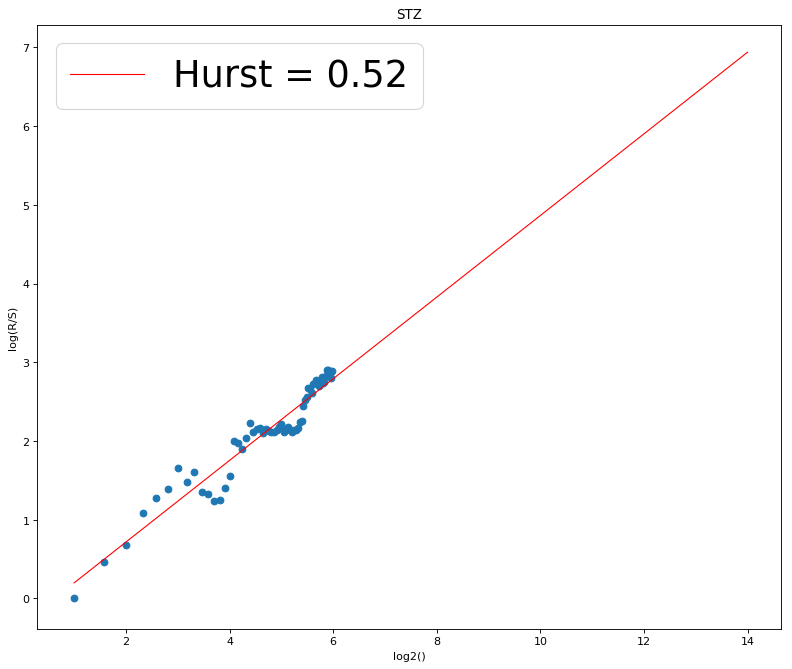

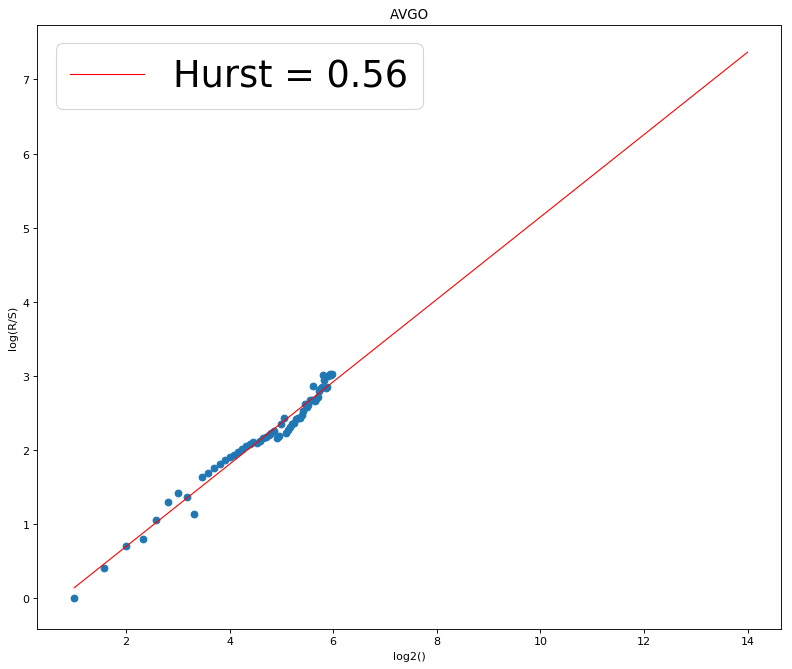

[567, 630]


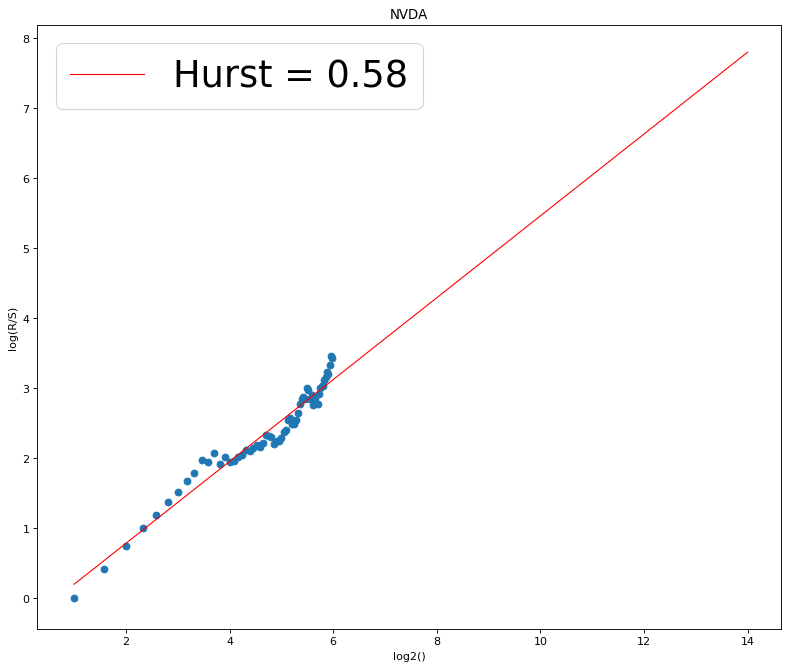

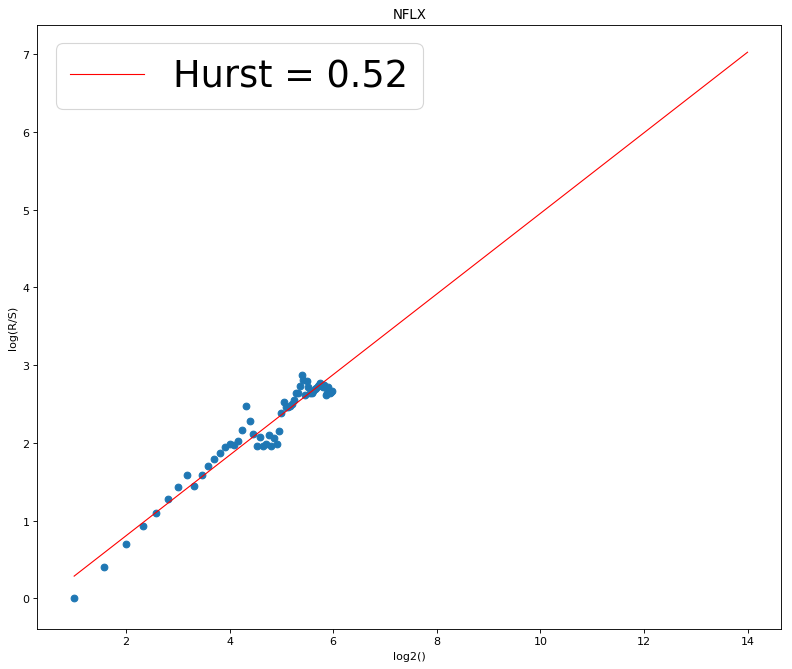

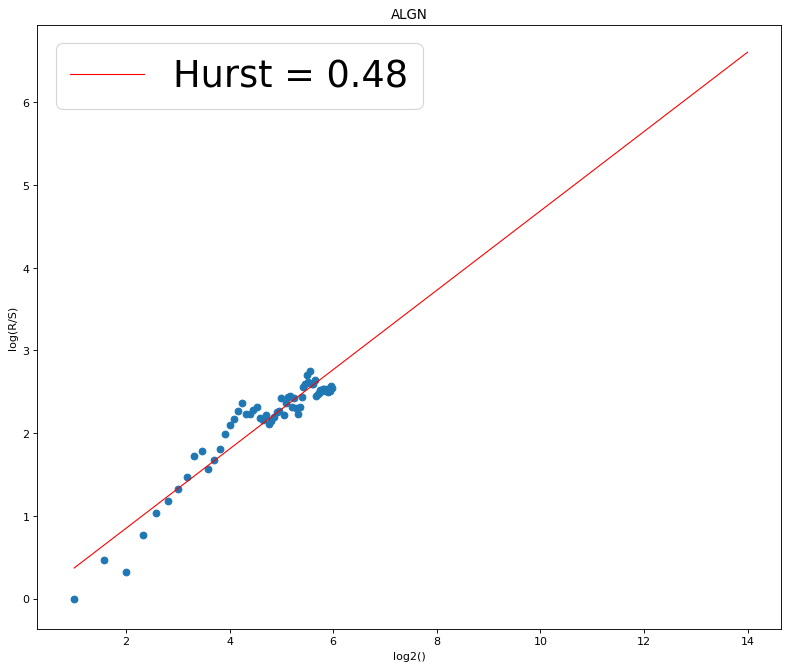

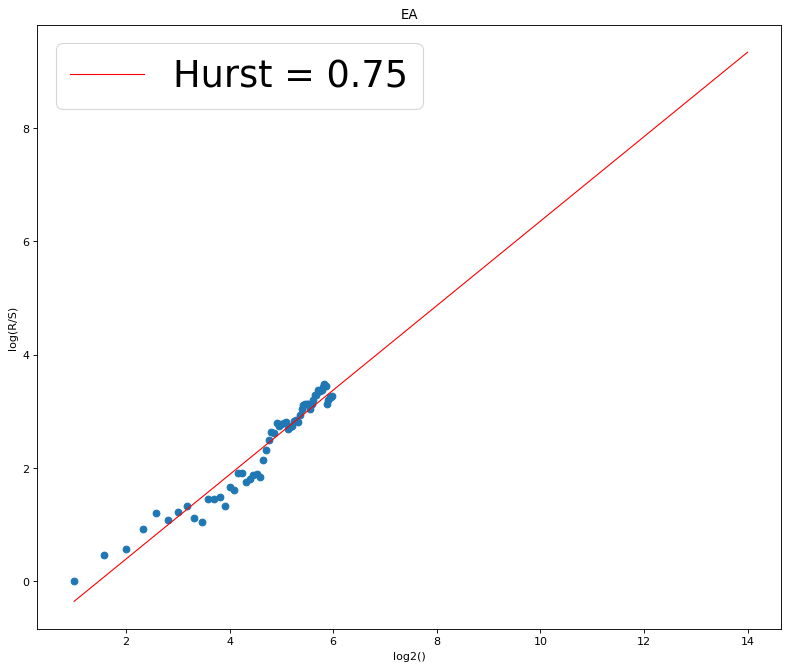

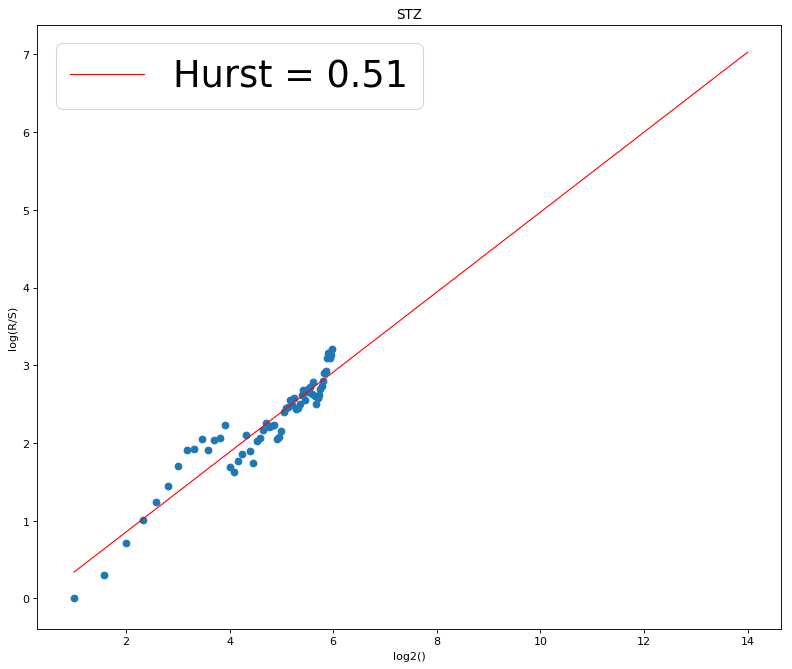

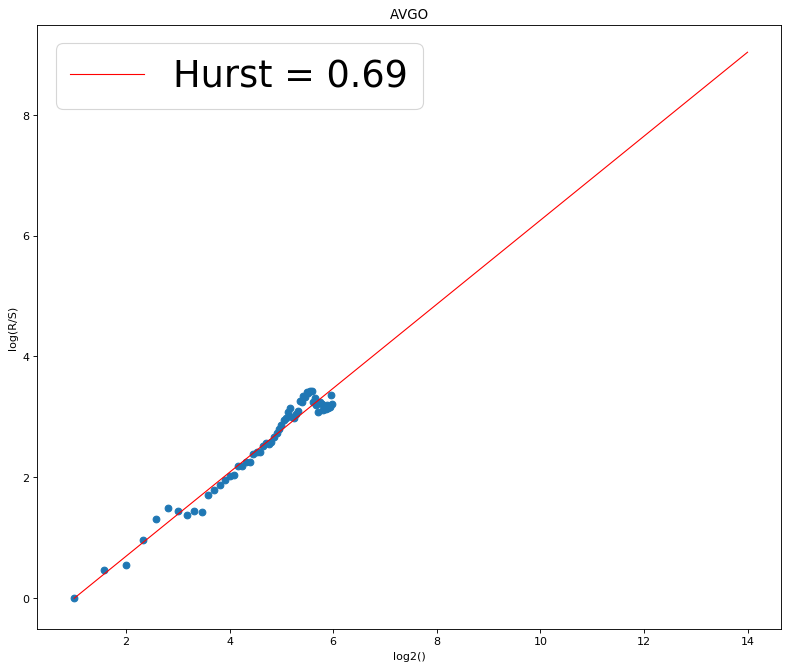

[630, 693]


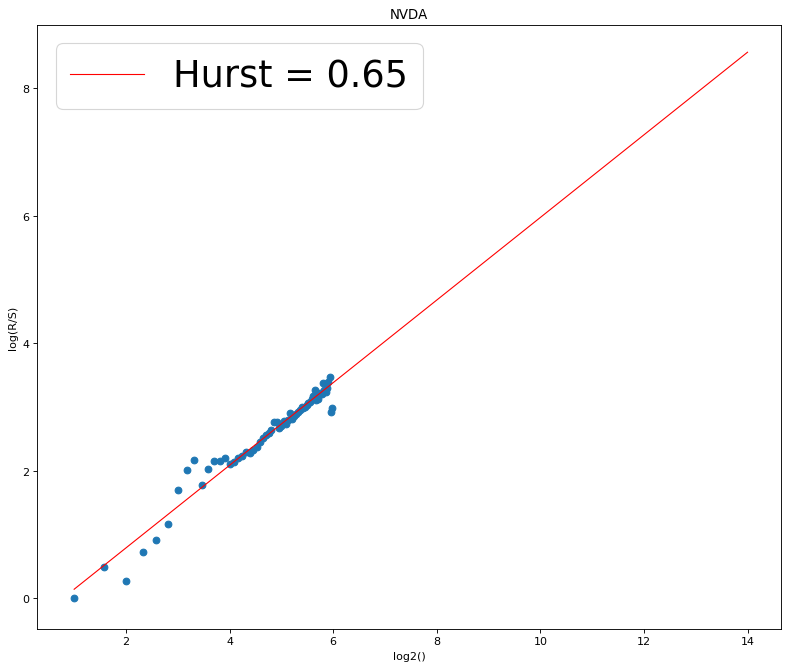

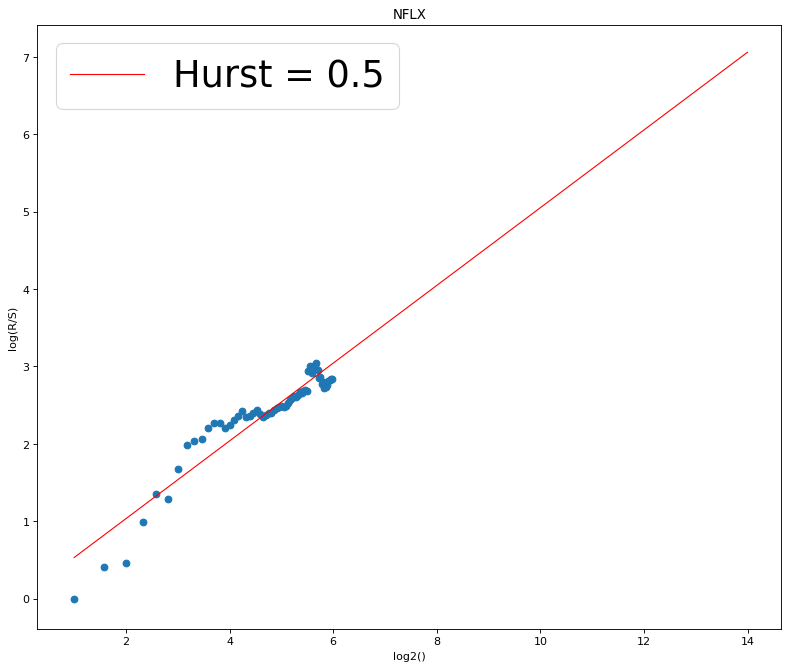

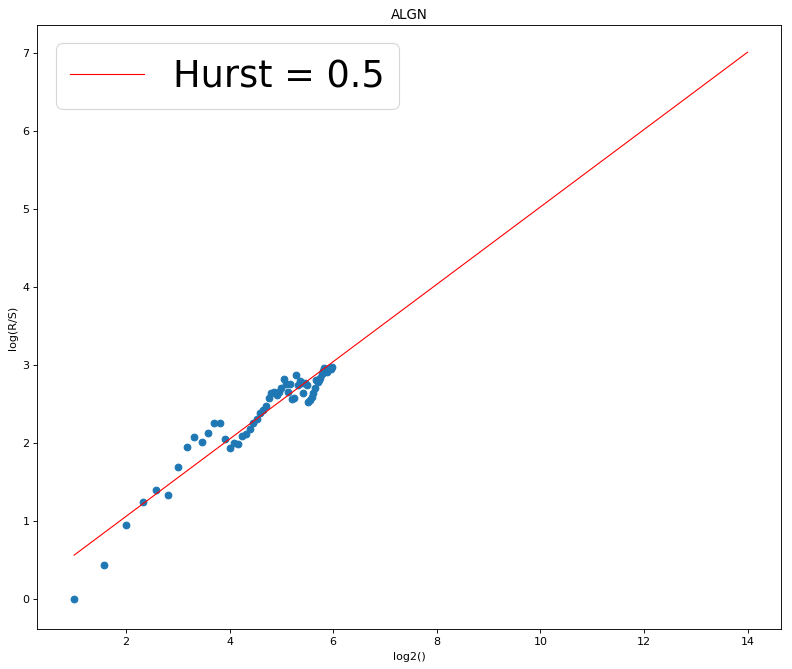

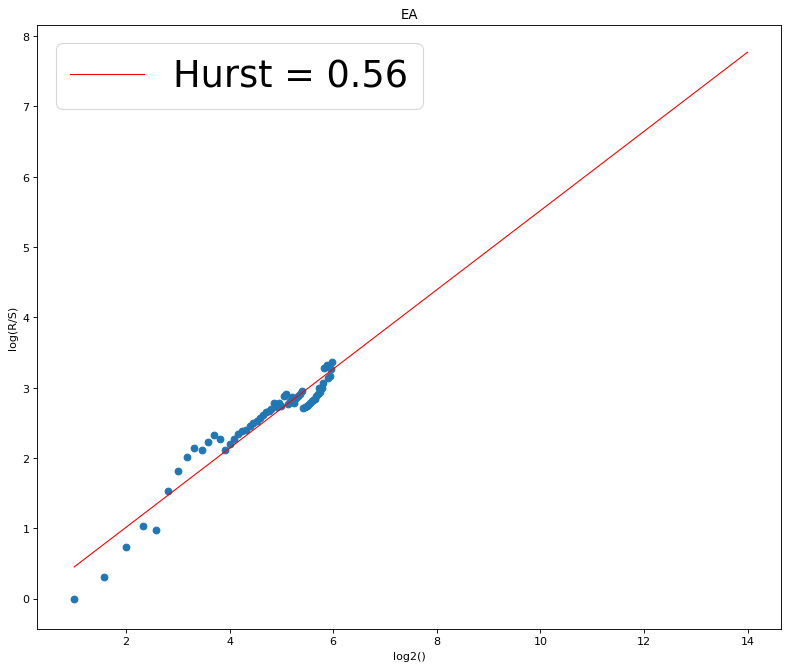

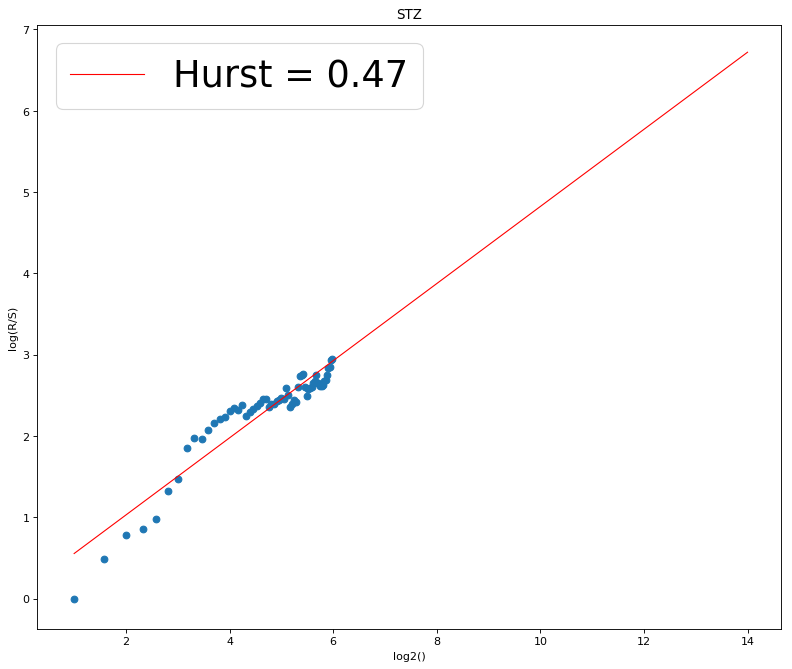

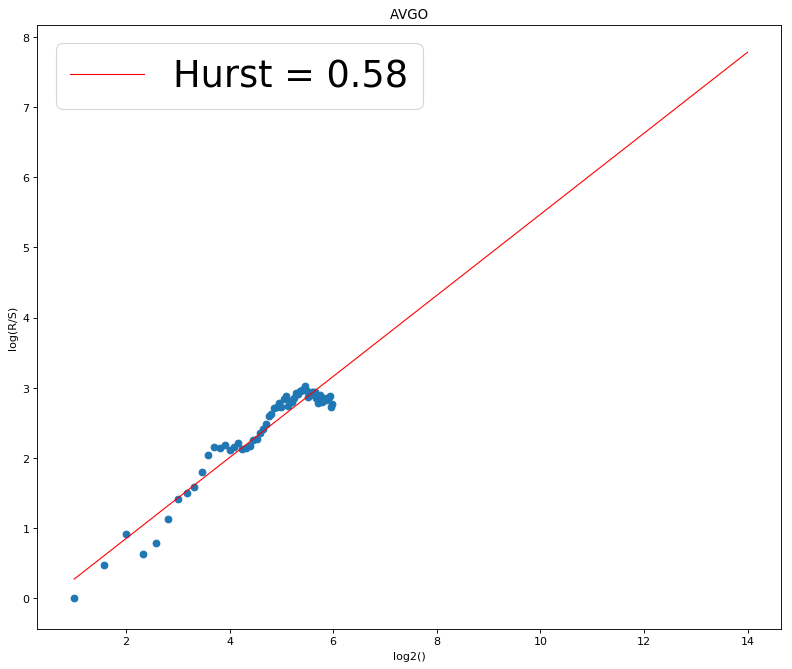

[693, 756]


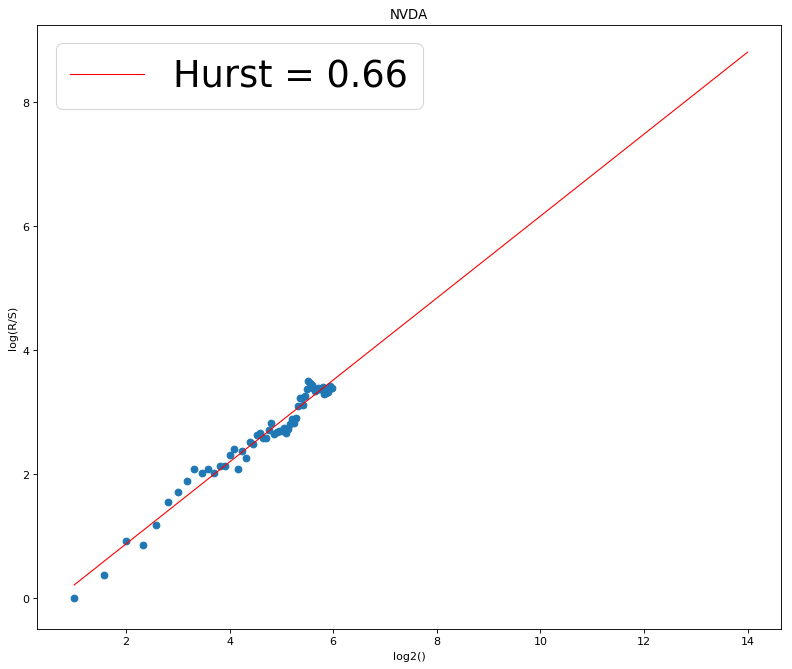

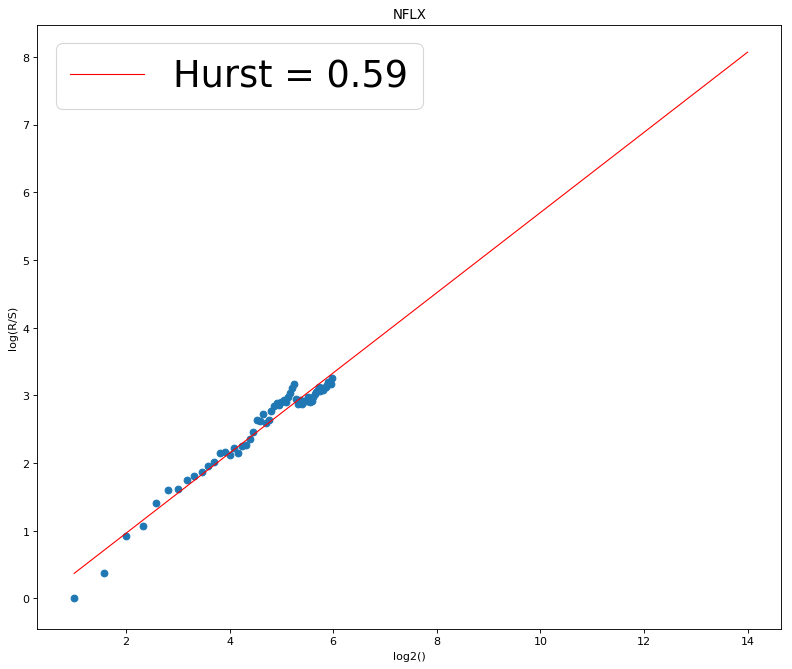

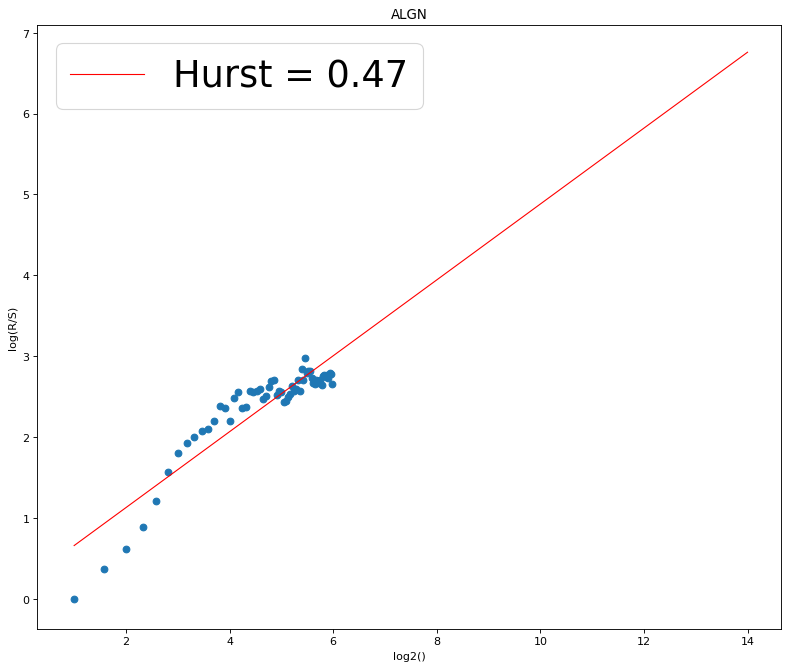

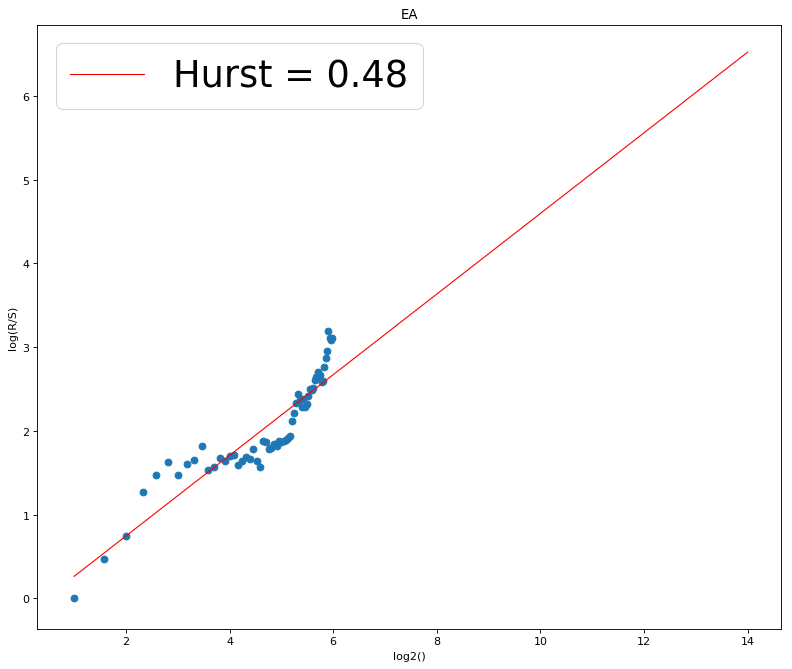

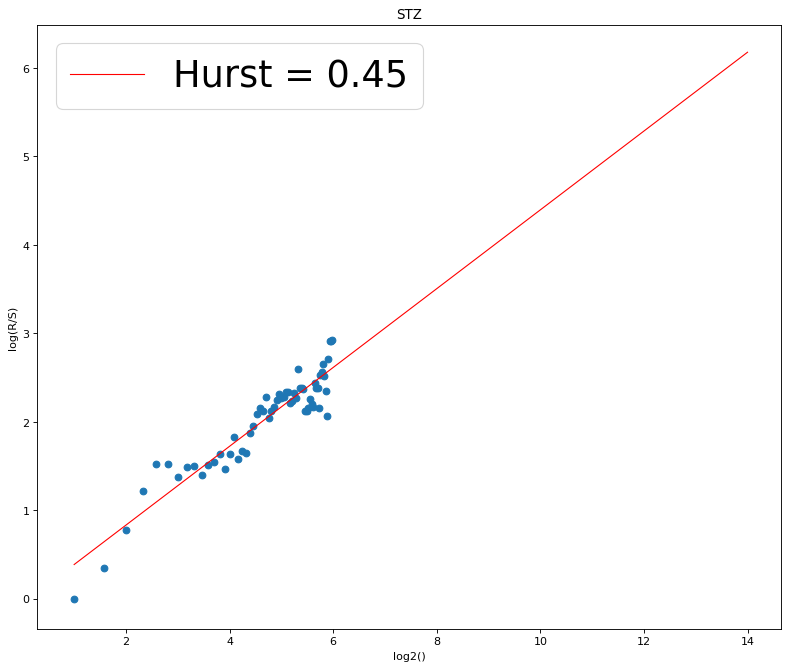

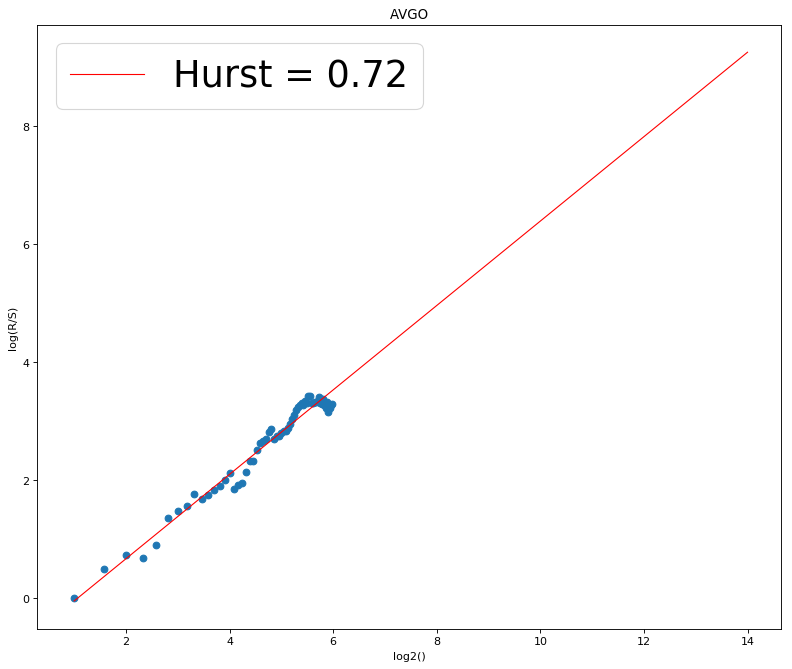

[756, 819]


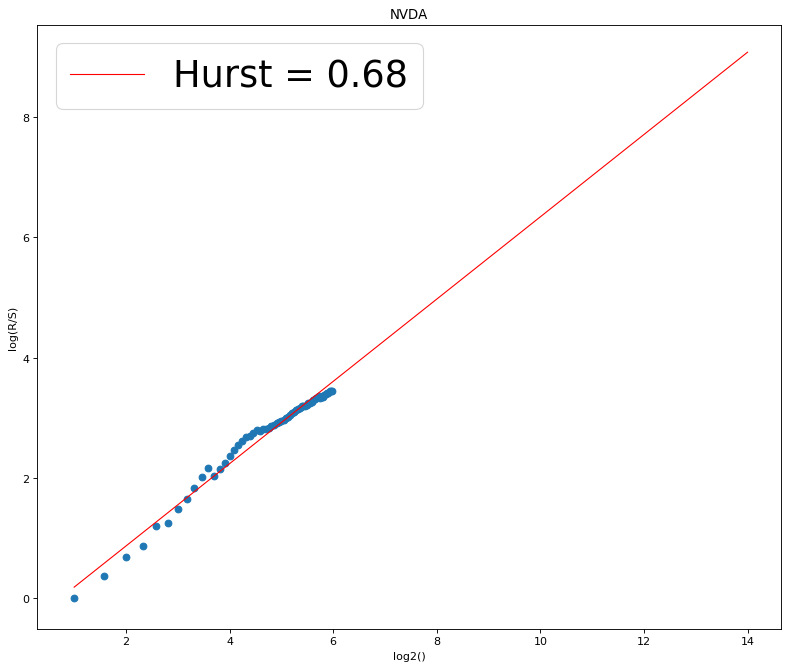

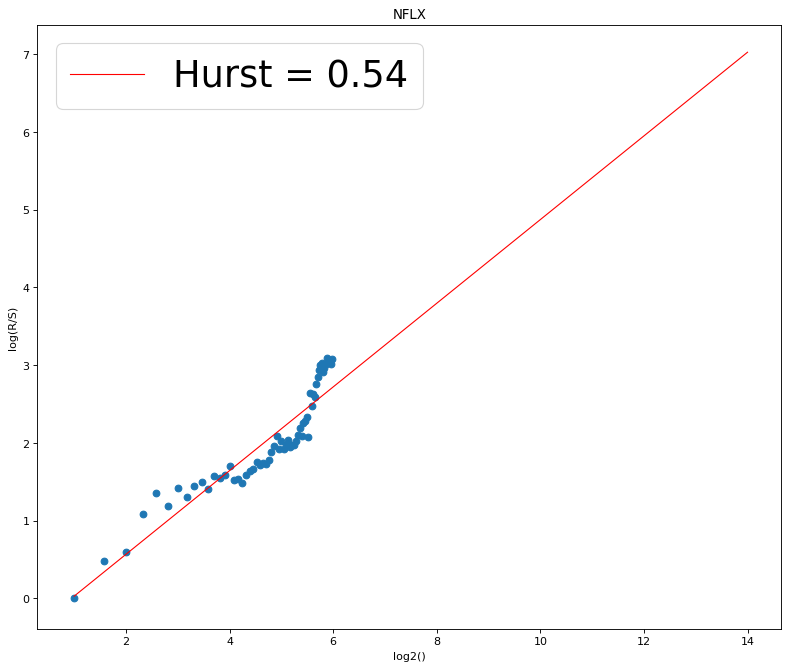

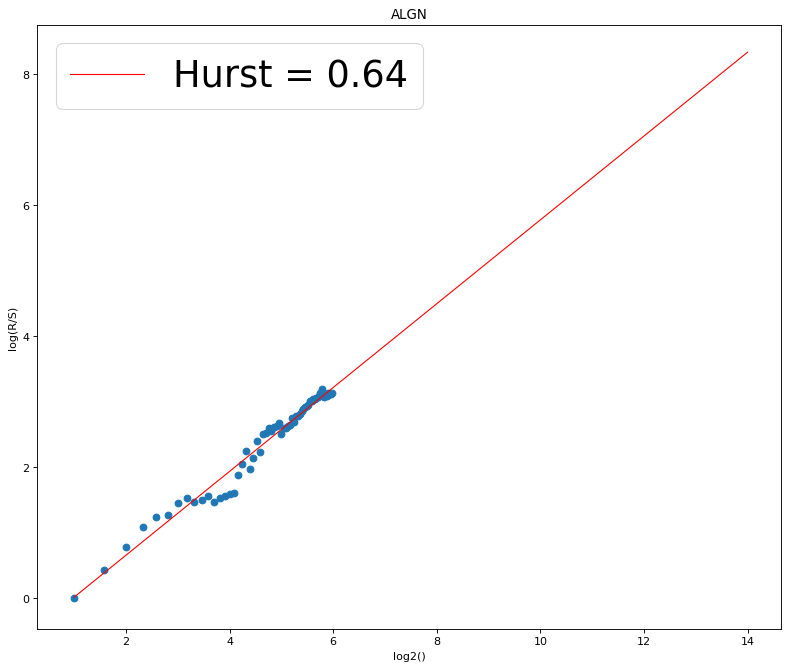

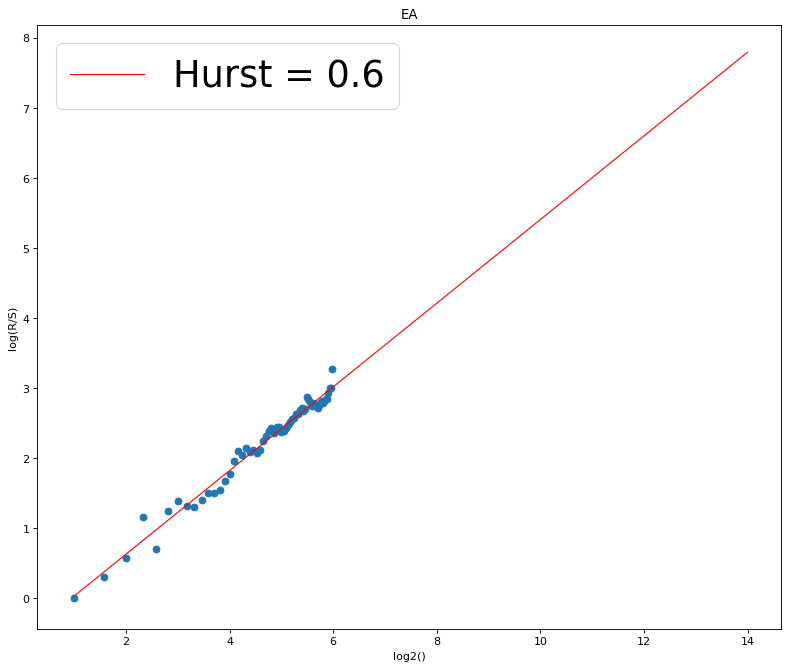

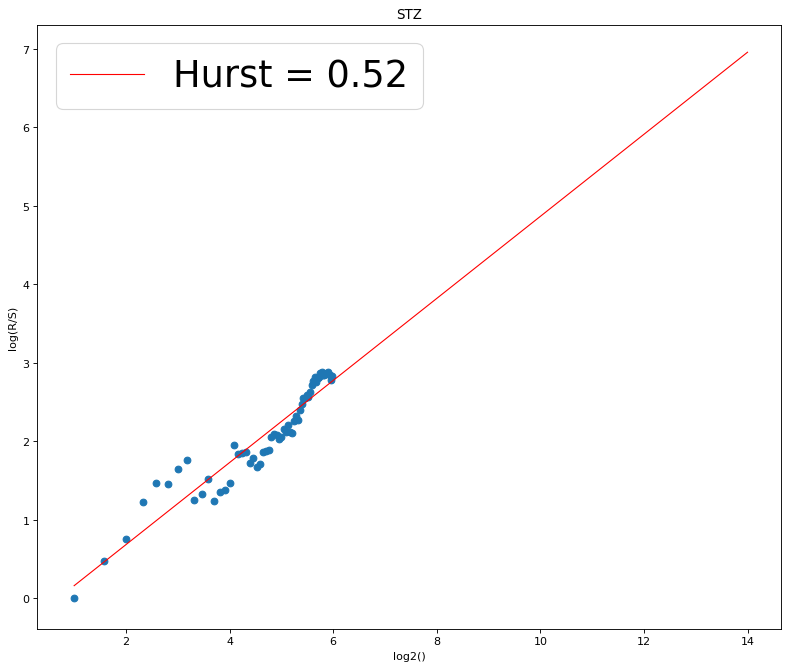

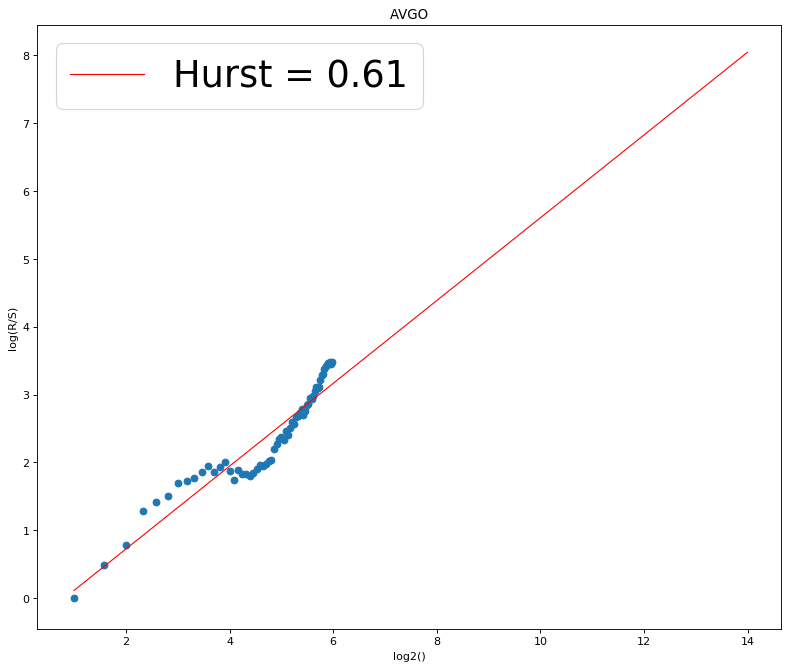

[819, 882]


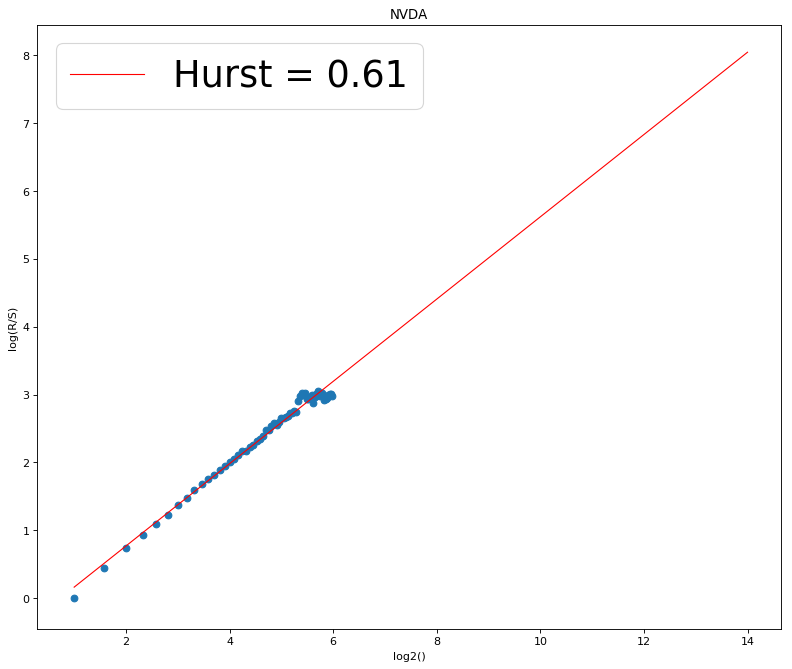

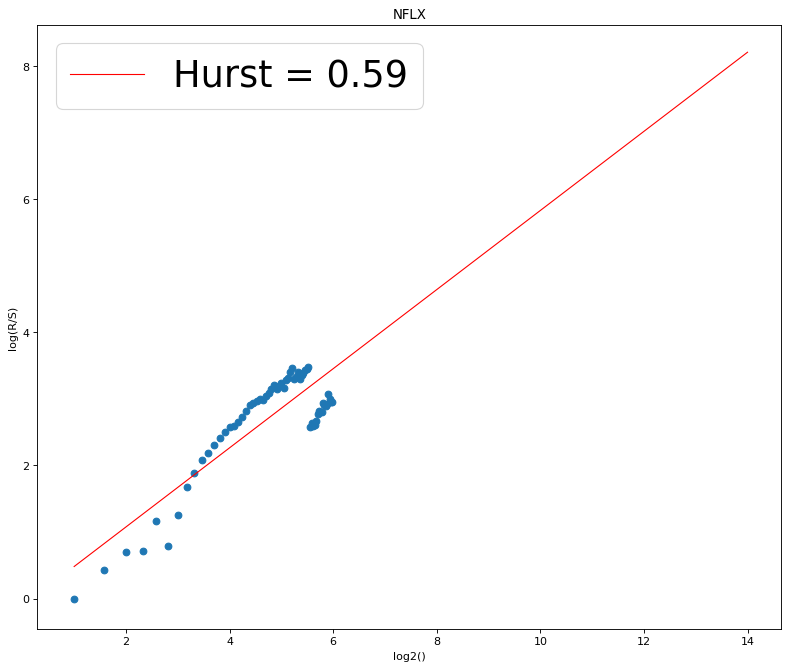

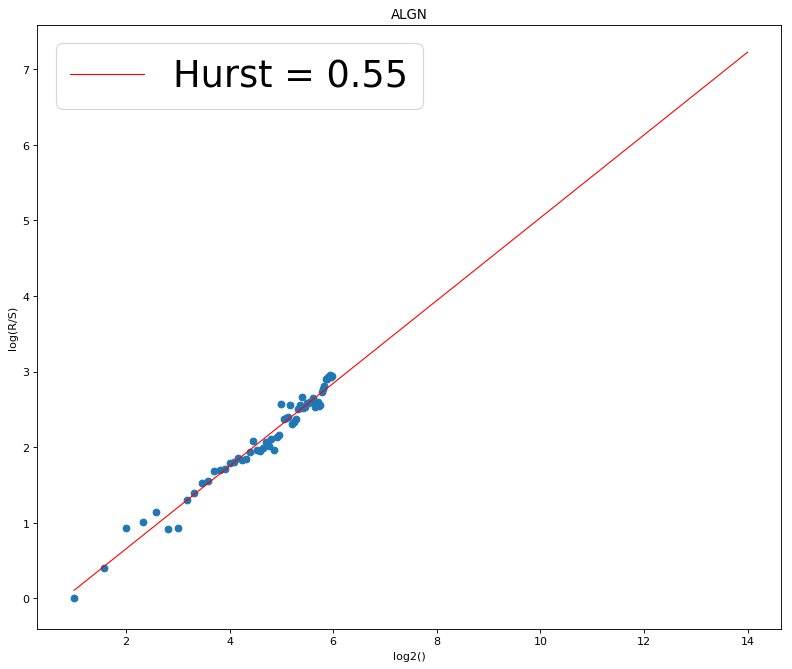

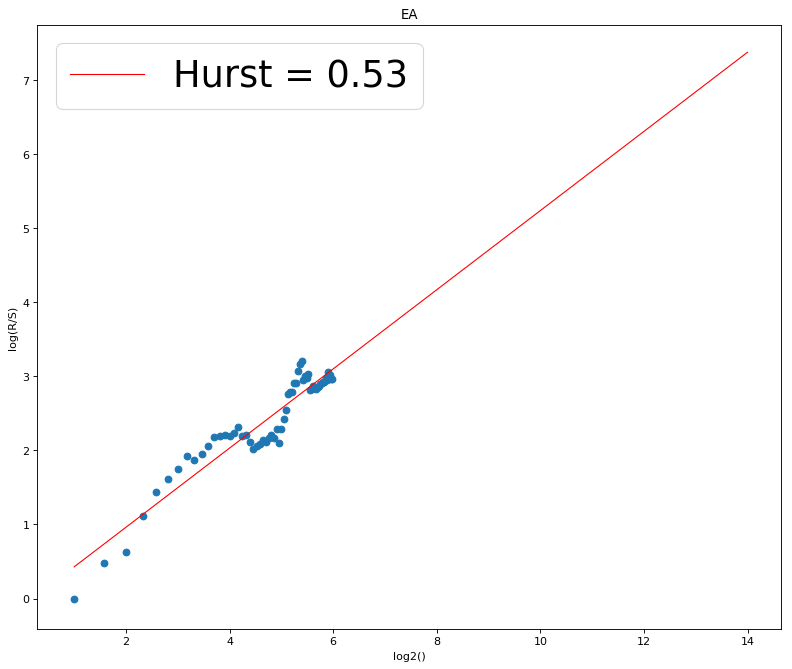

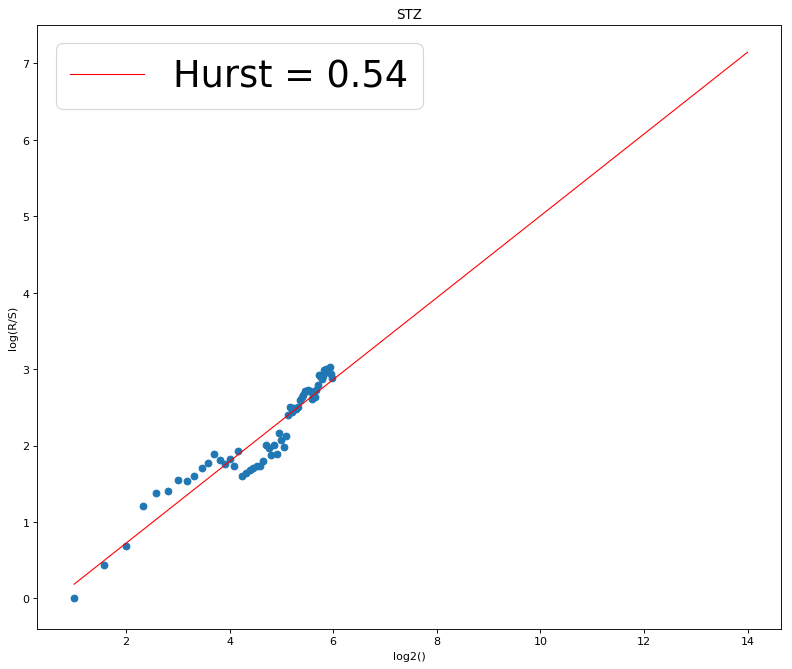

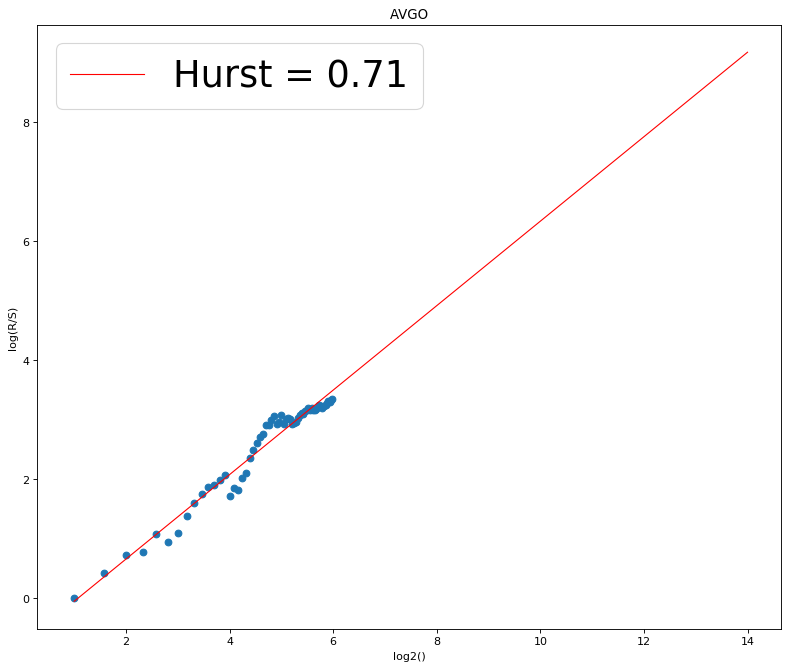

[882, 945]


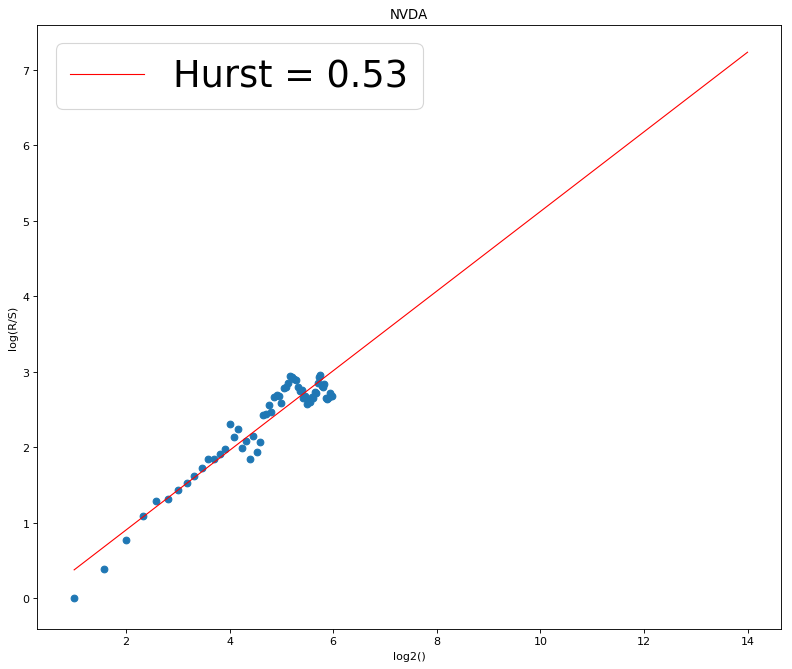

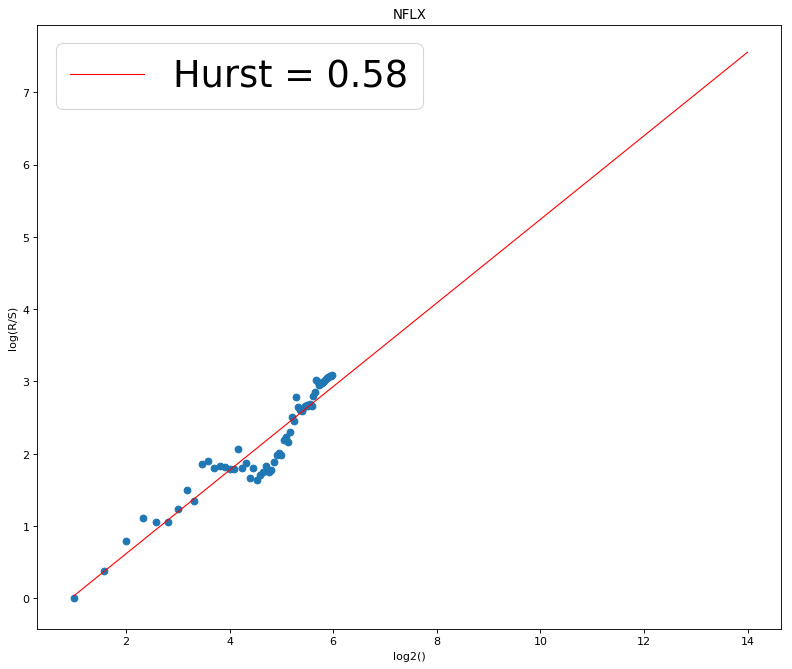

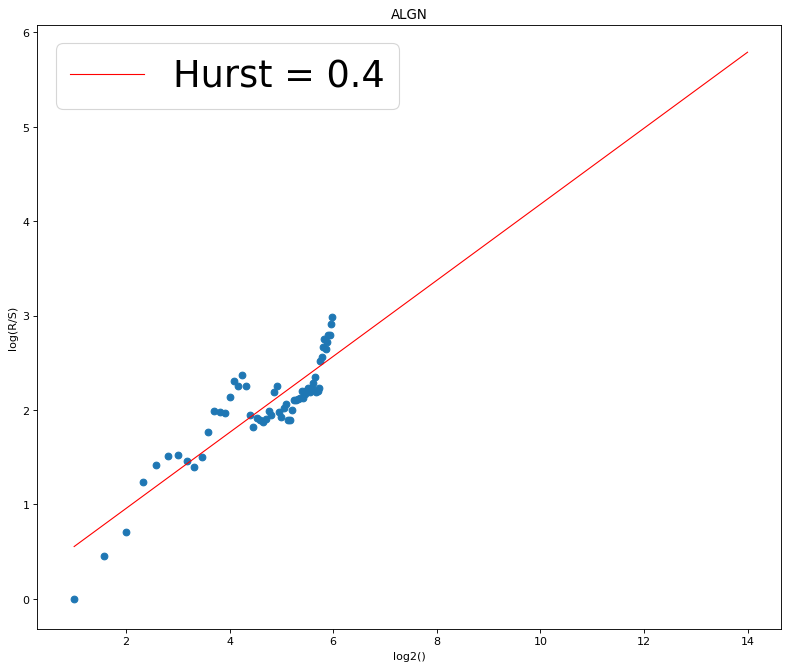

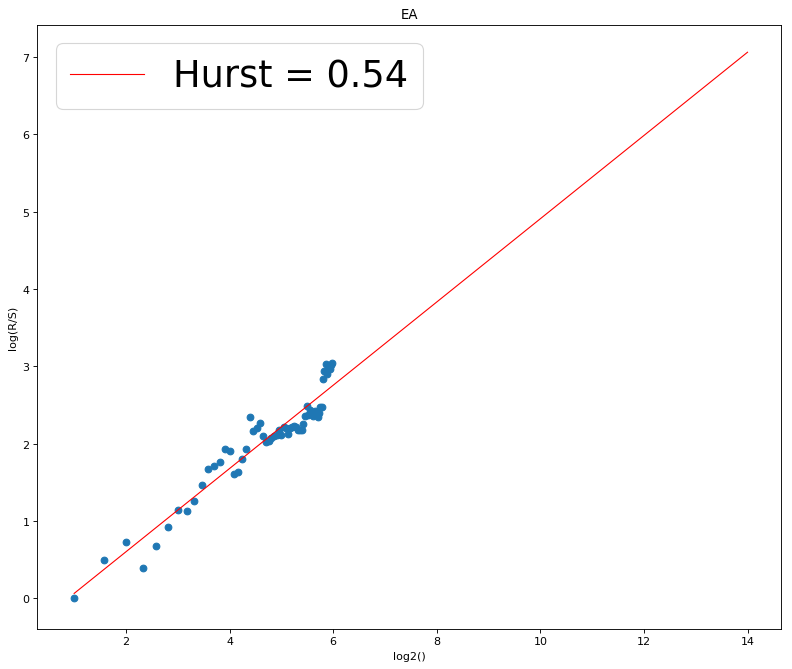

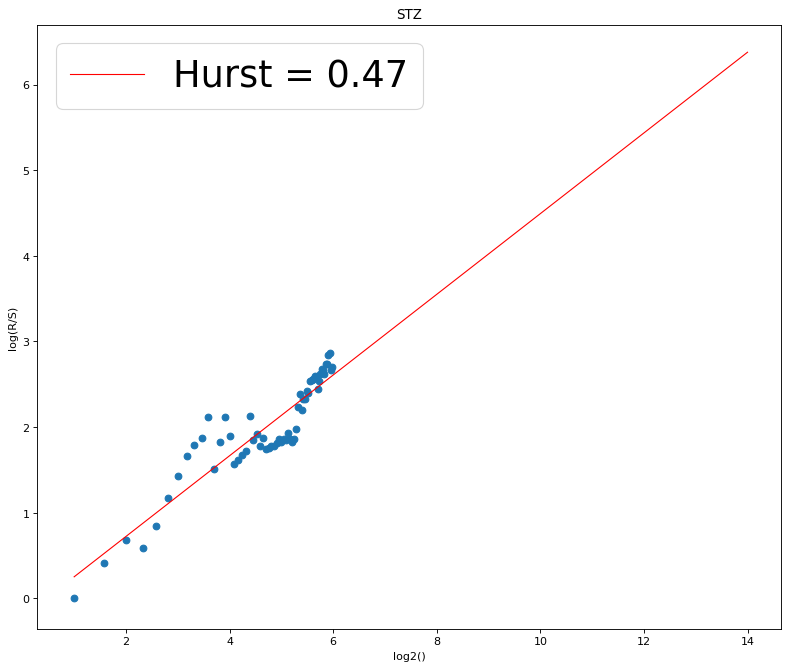

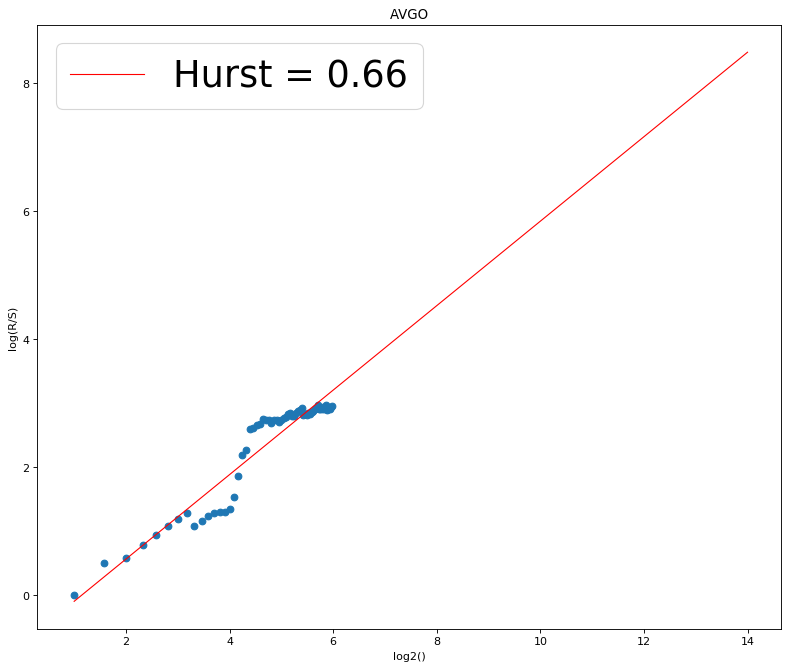

[945, 1008]


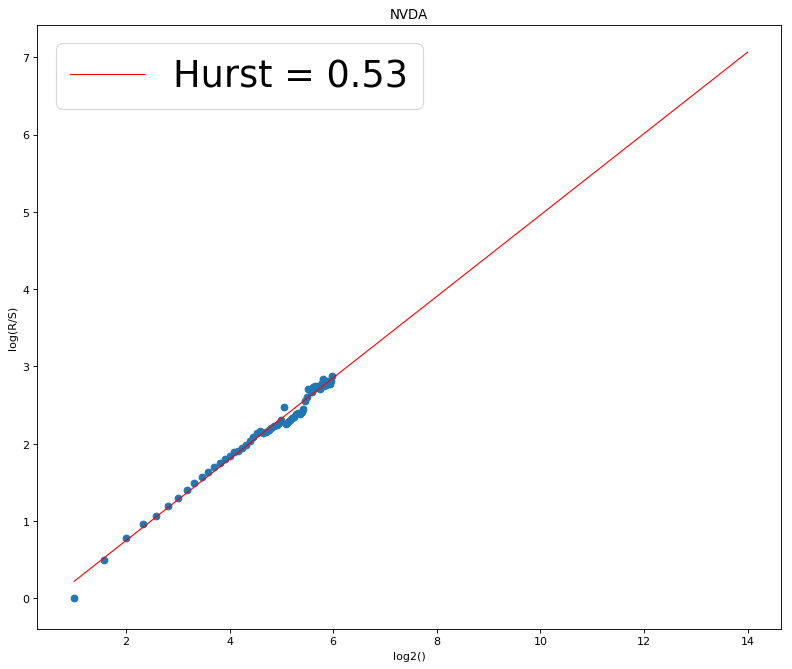

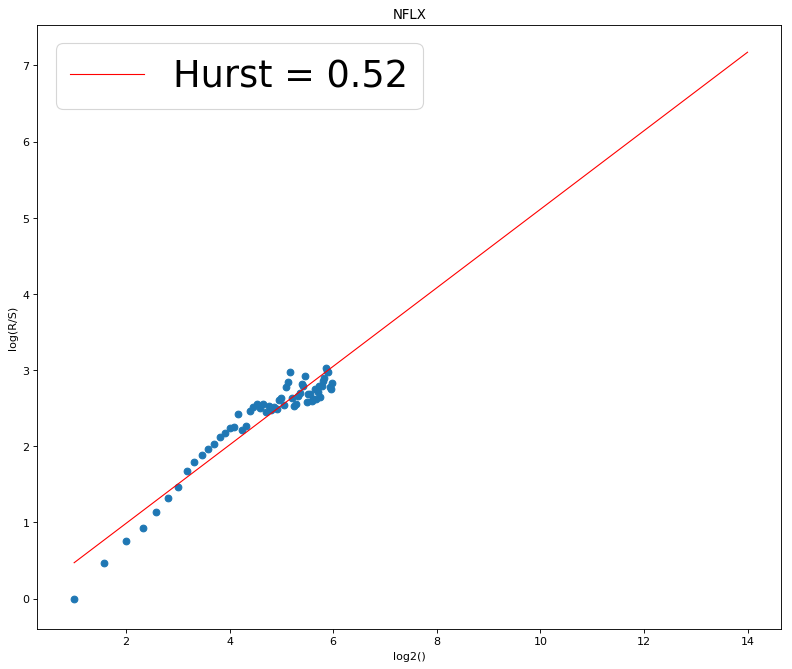

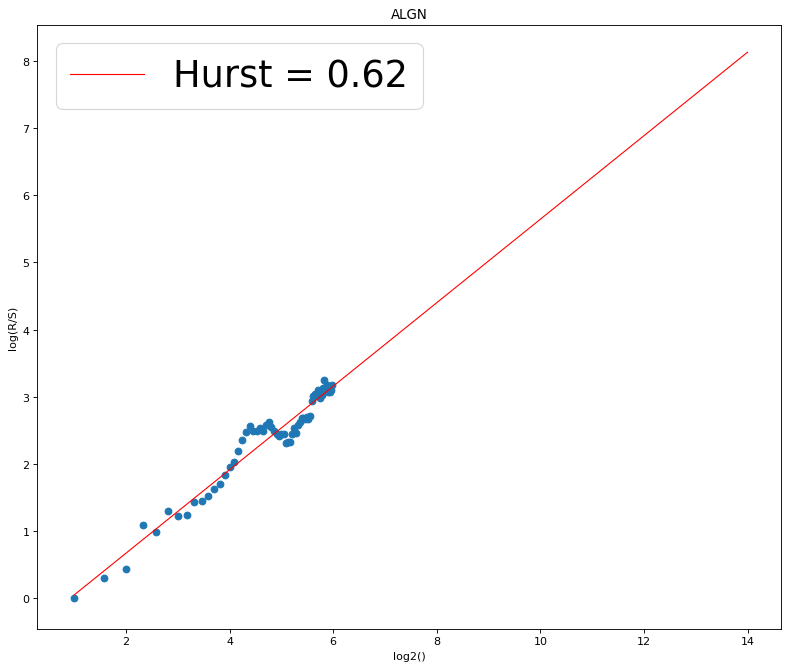

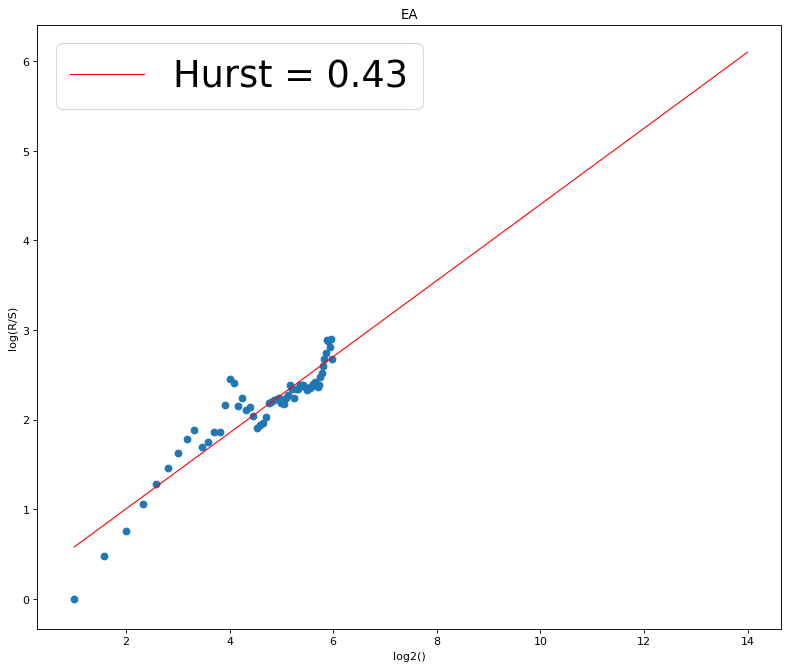

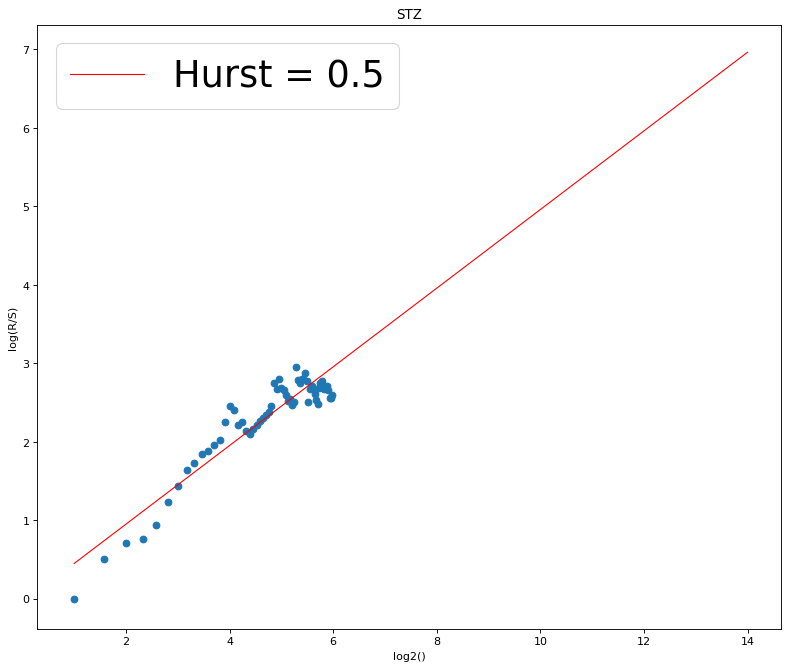

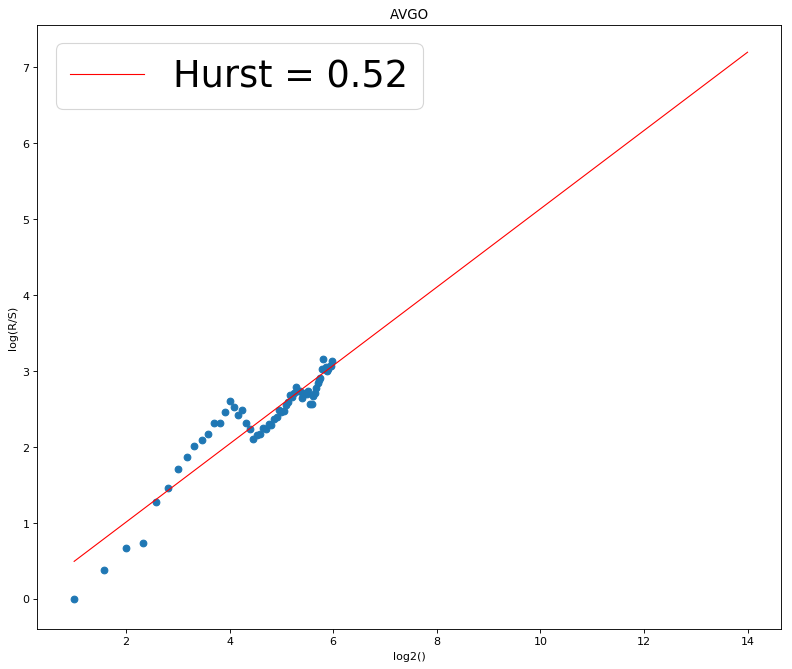

[1008, 1071]


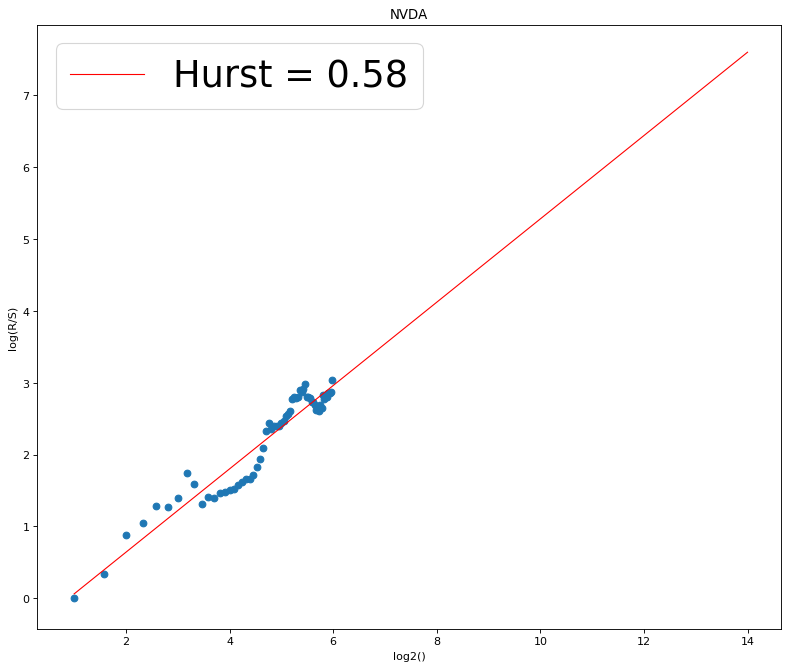

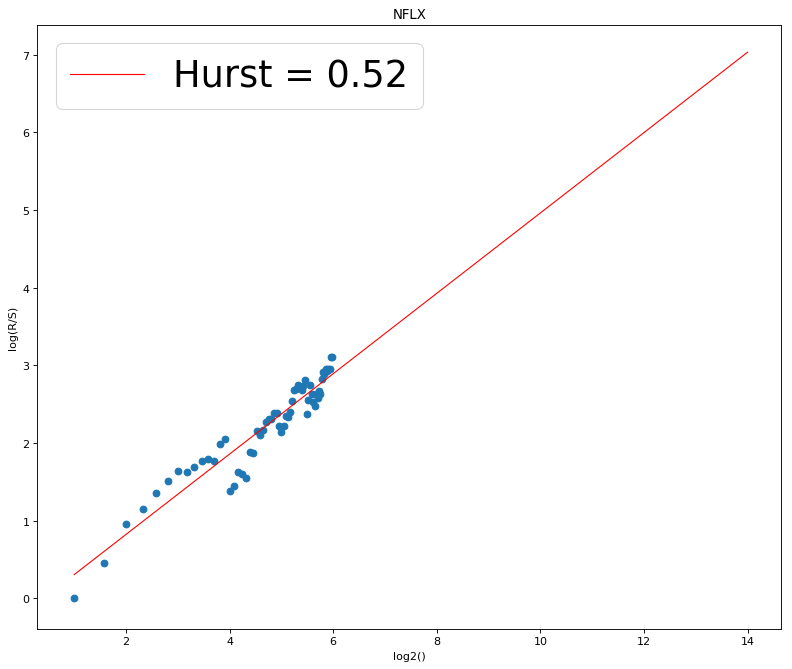

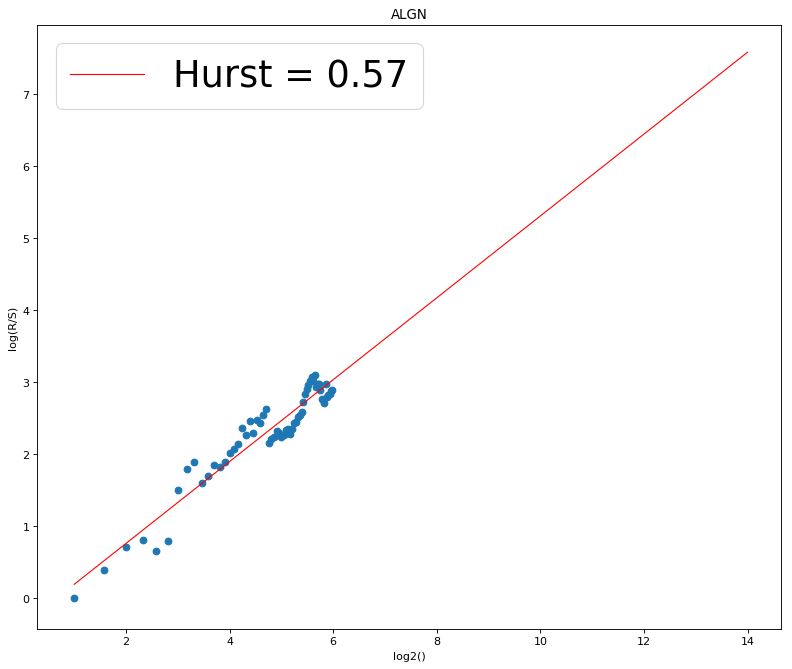

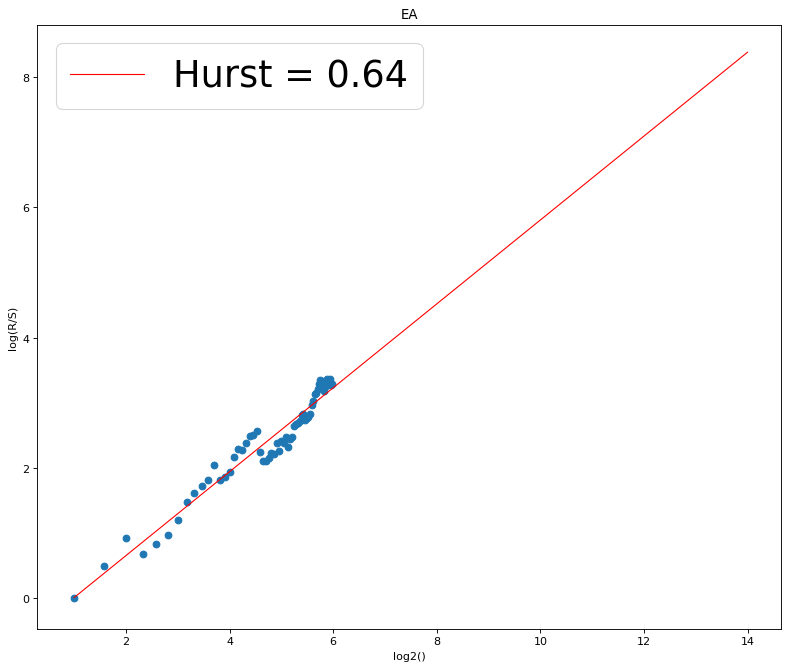

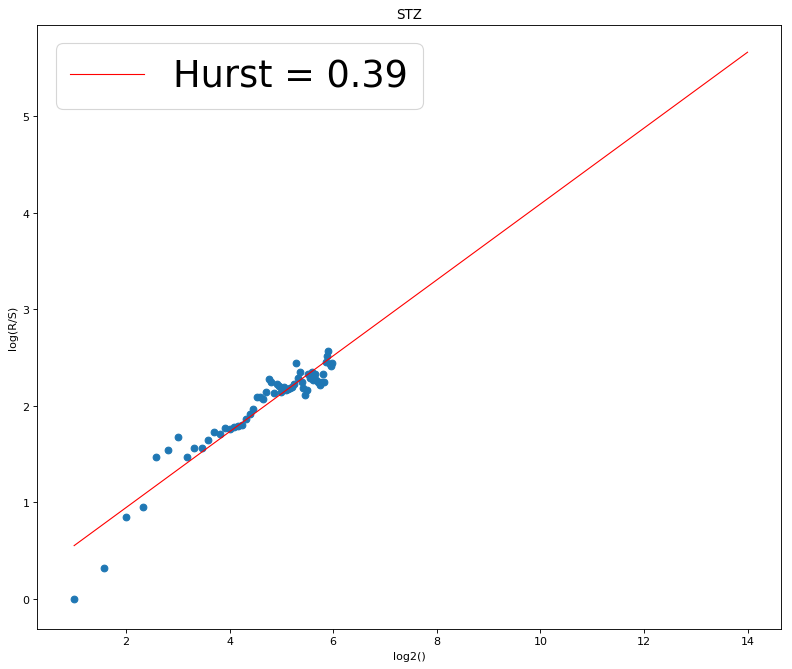

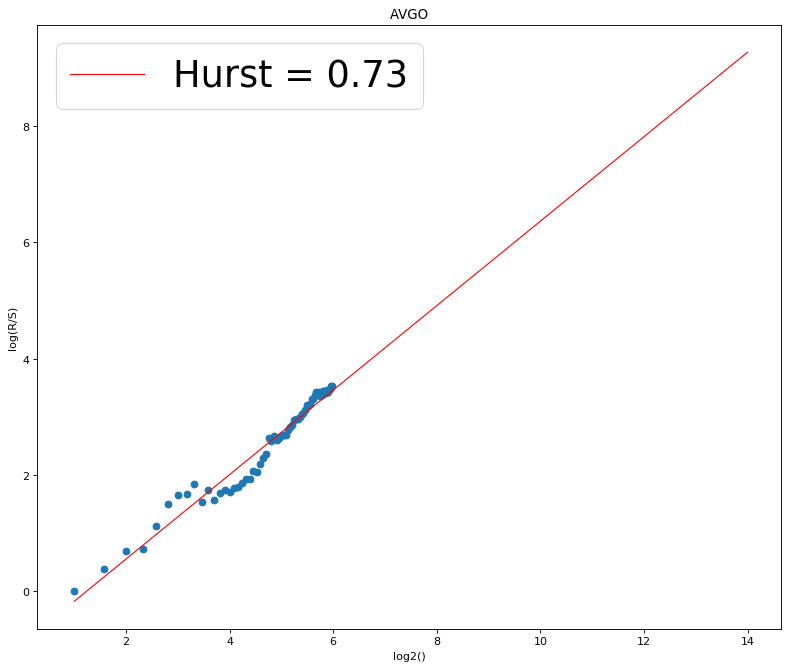

[1071, 1134]


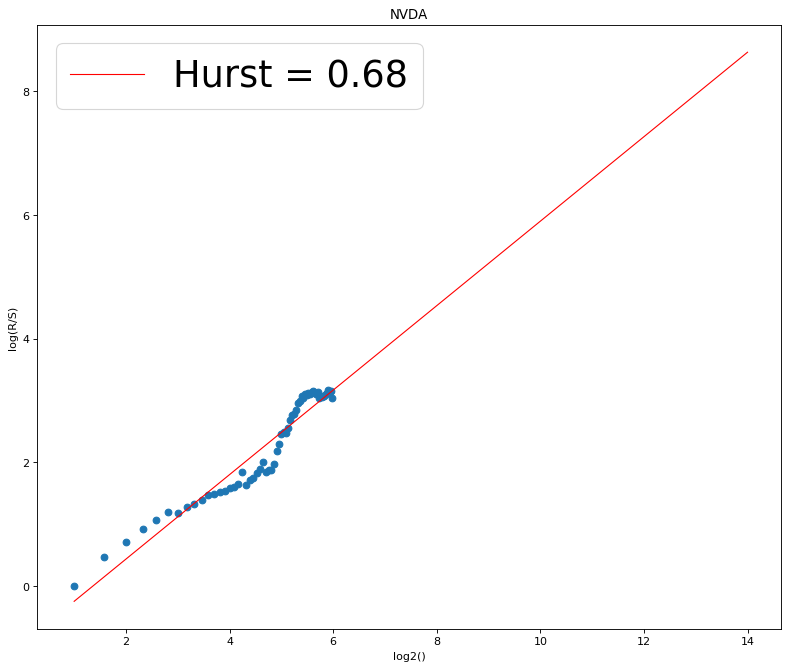

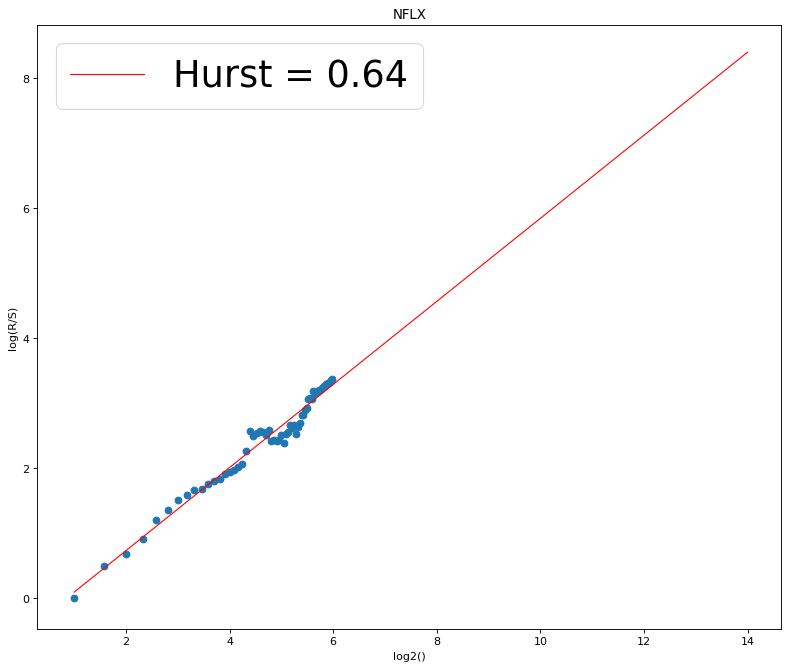

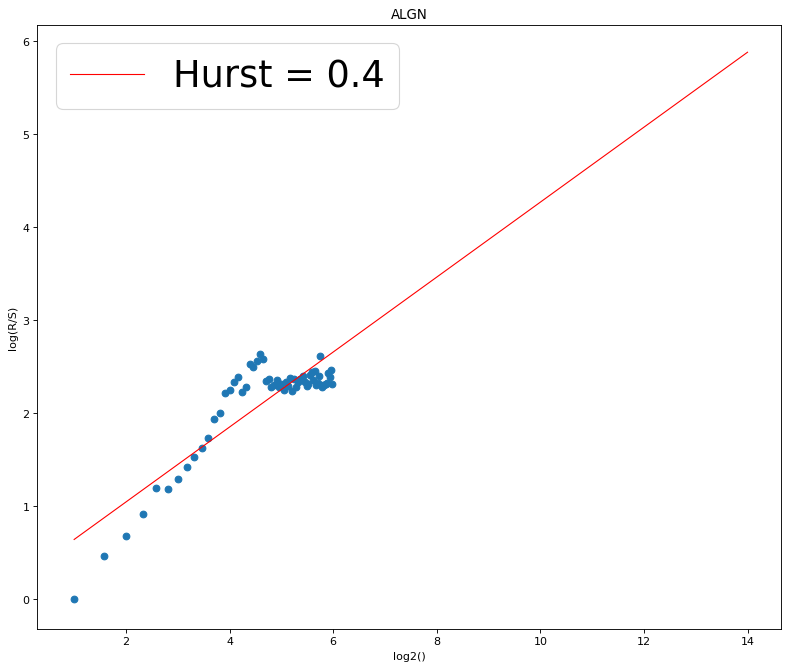

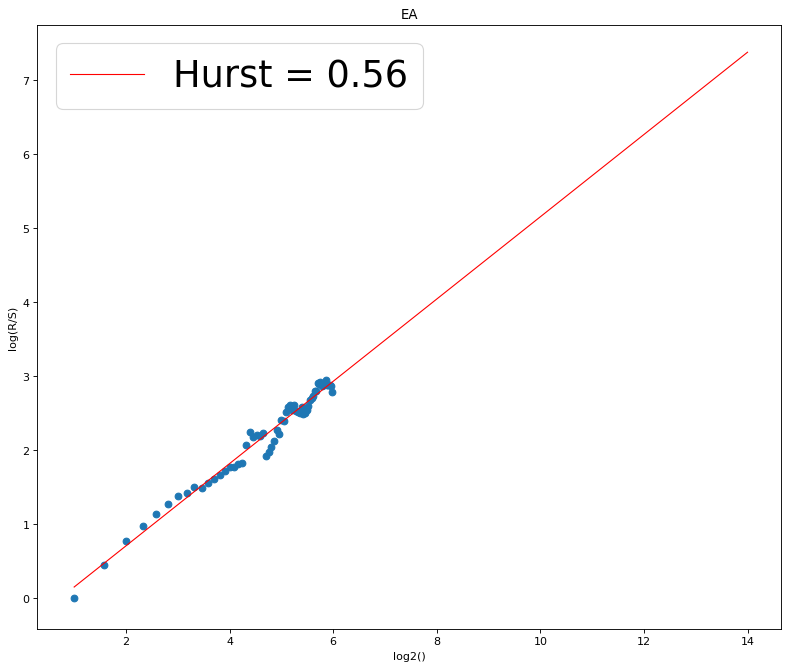

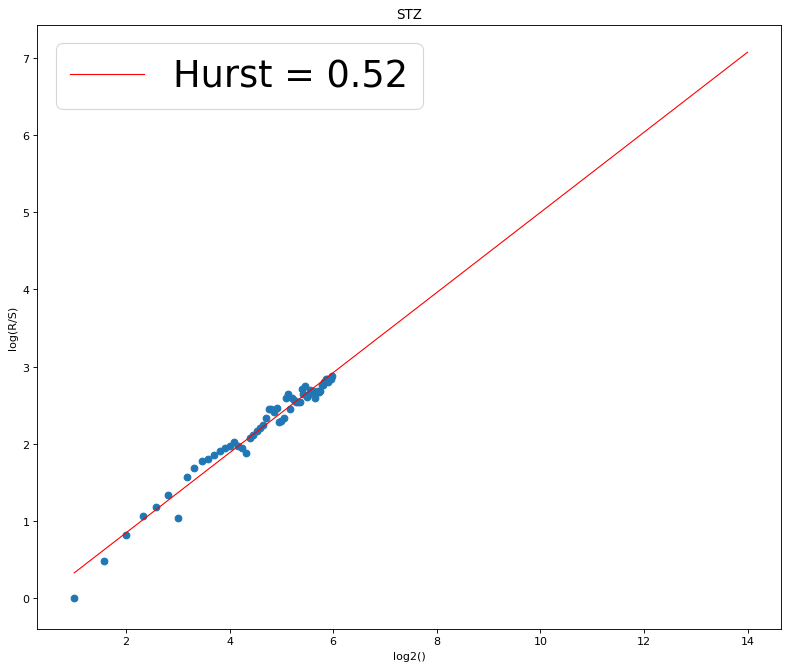

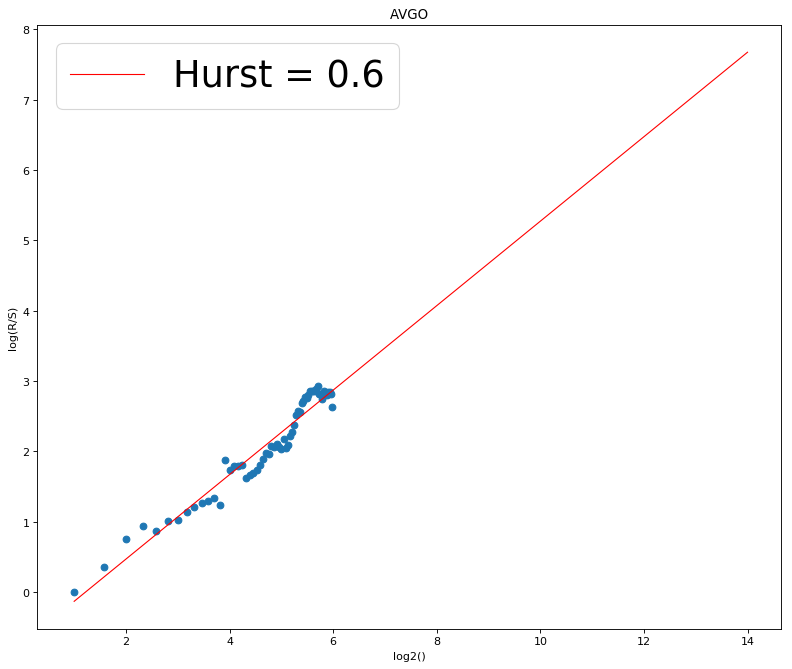

[1134, 1197]


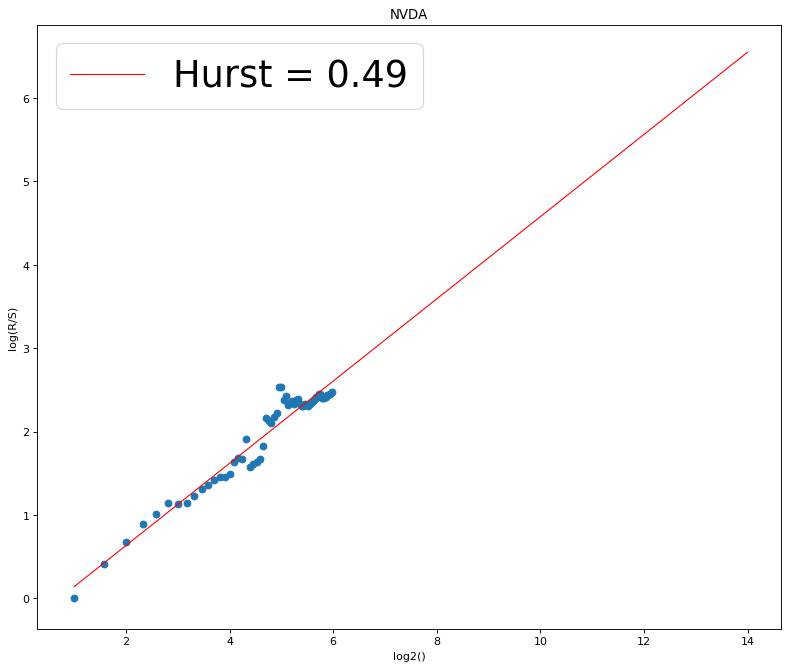

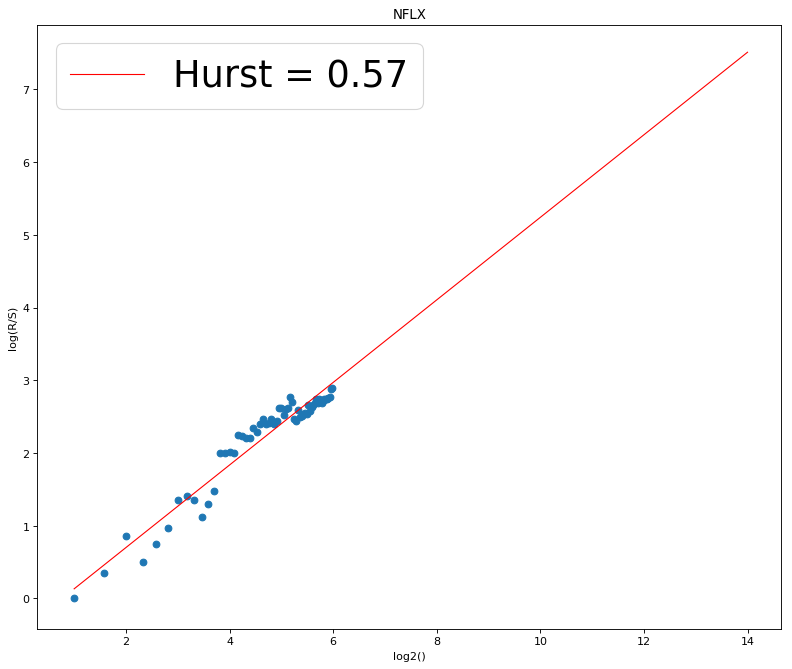

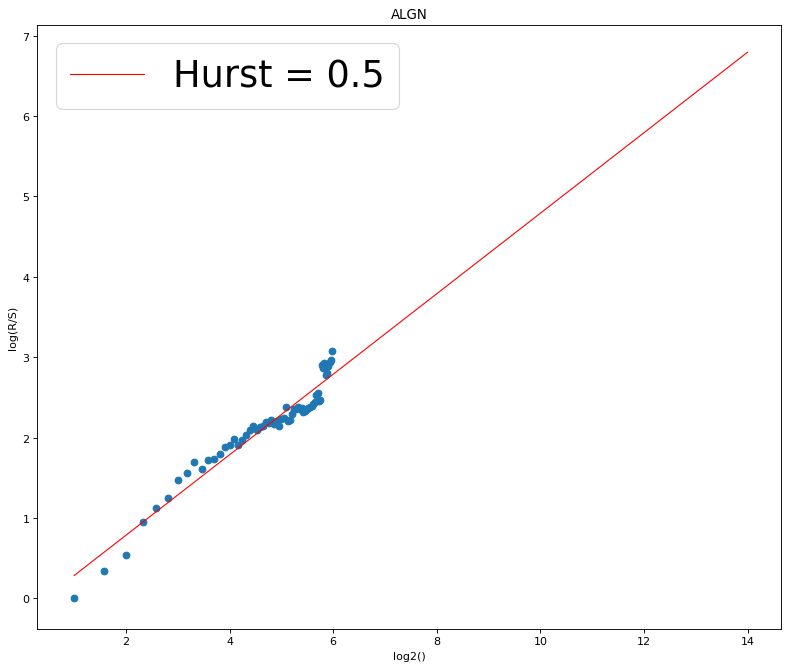

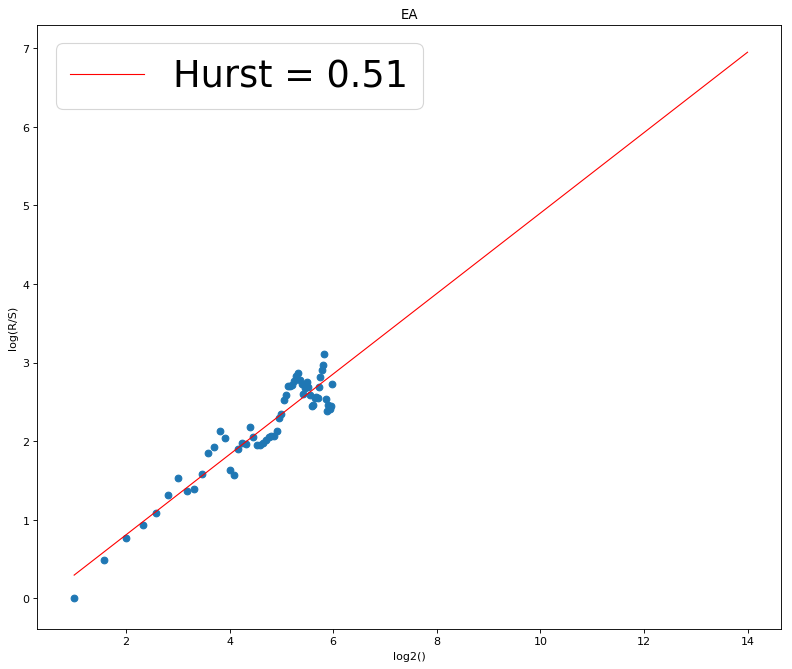

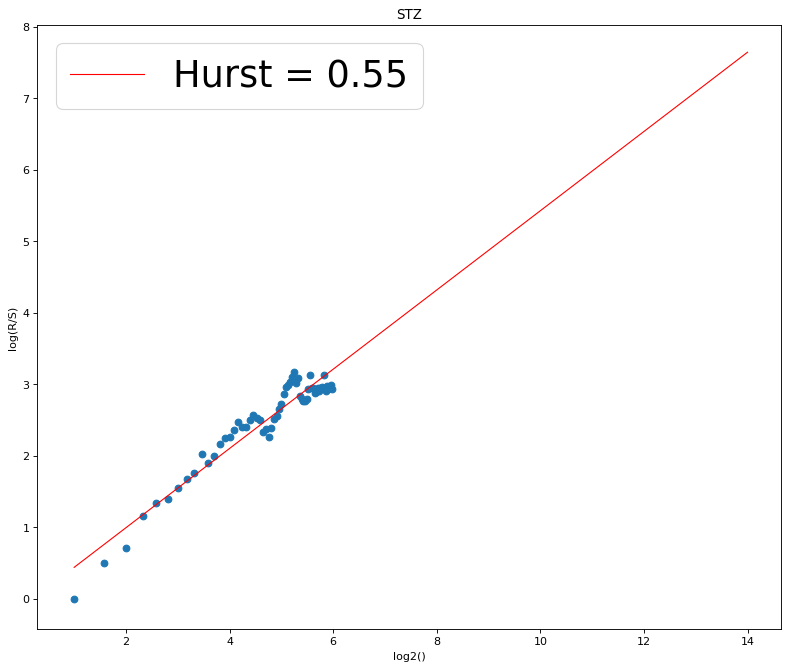

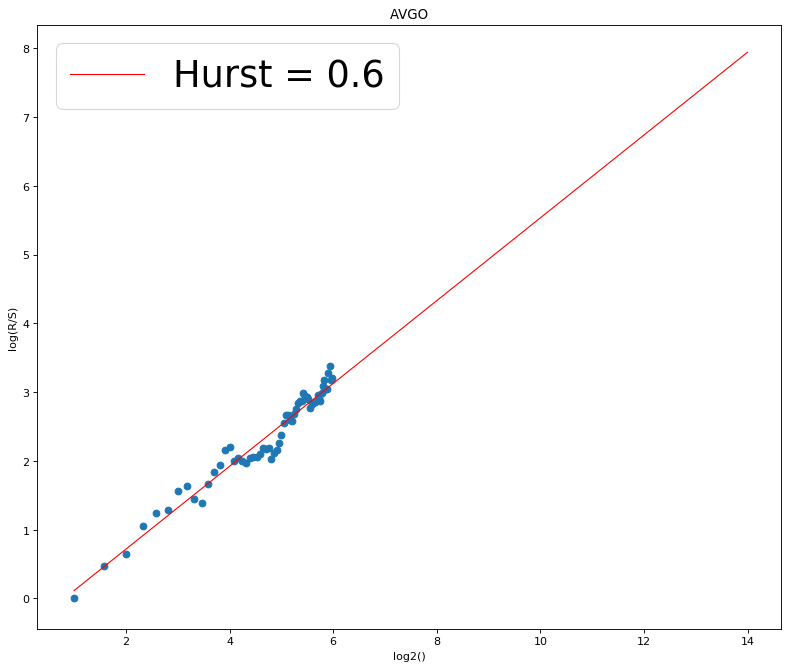

[1197, 1260]


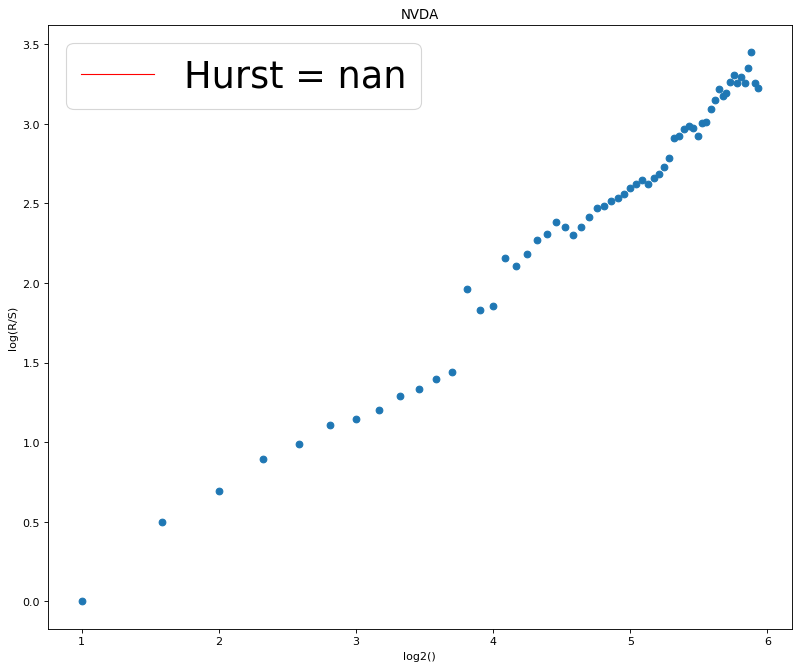

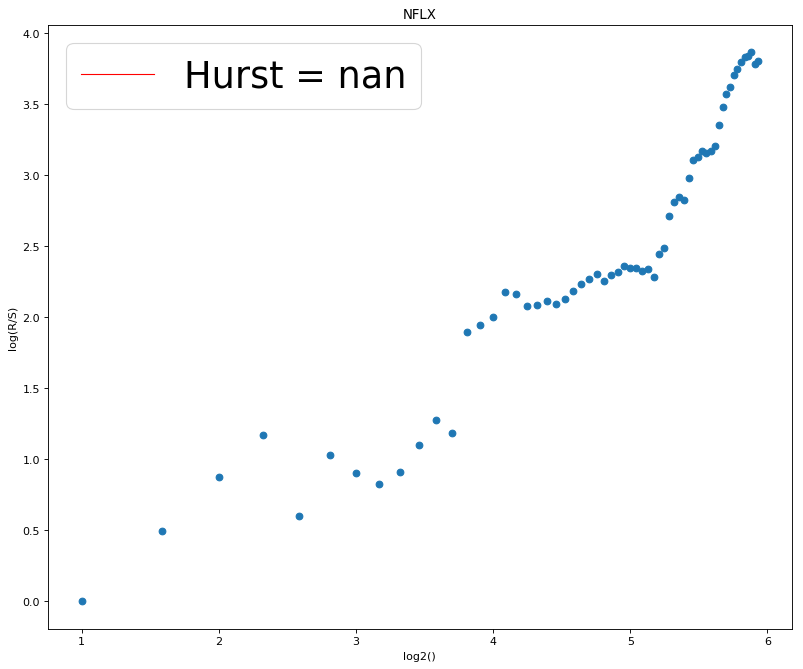

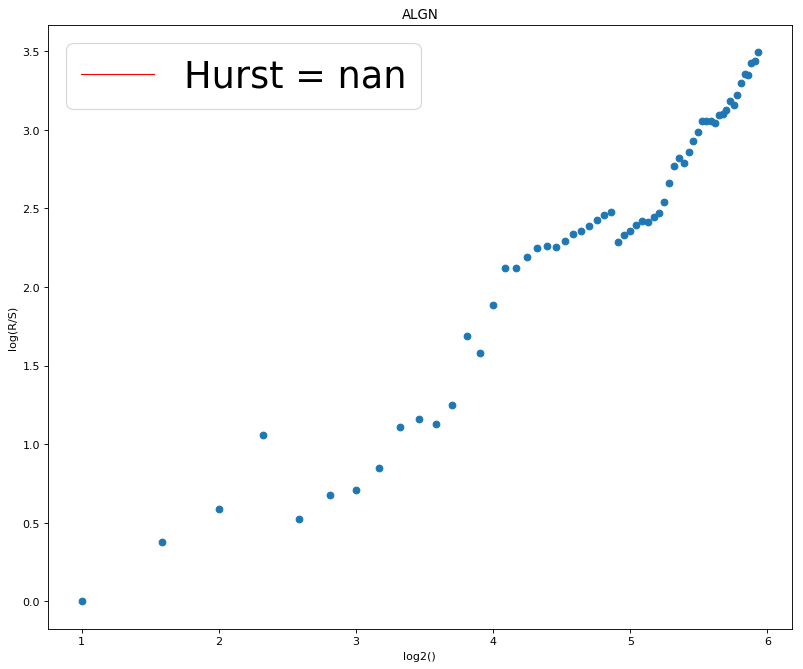

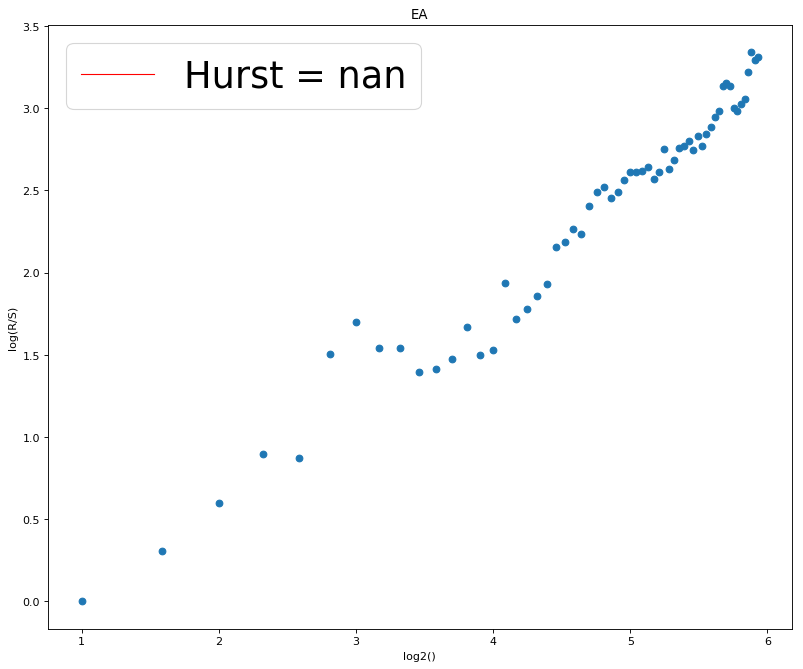

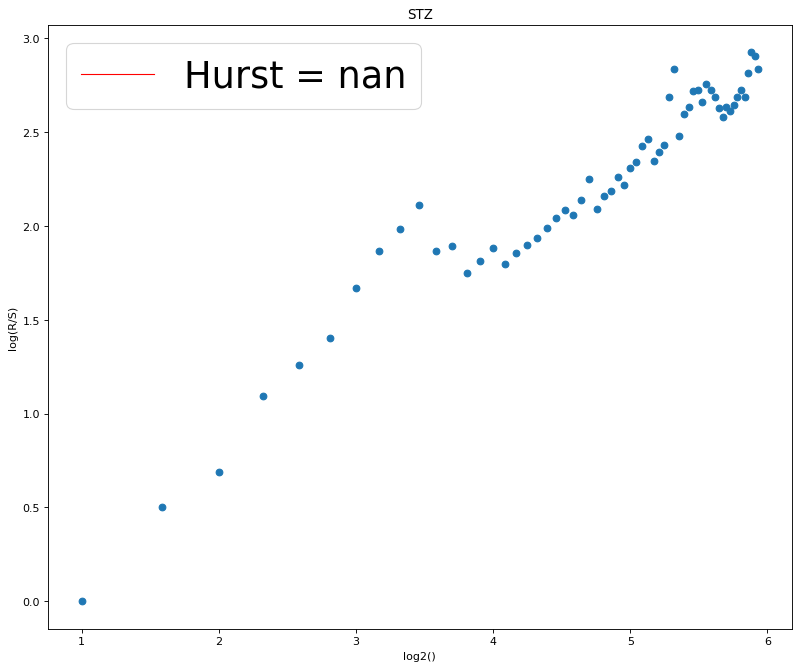

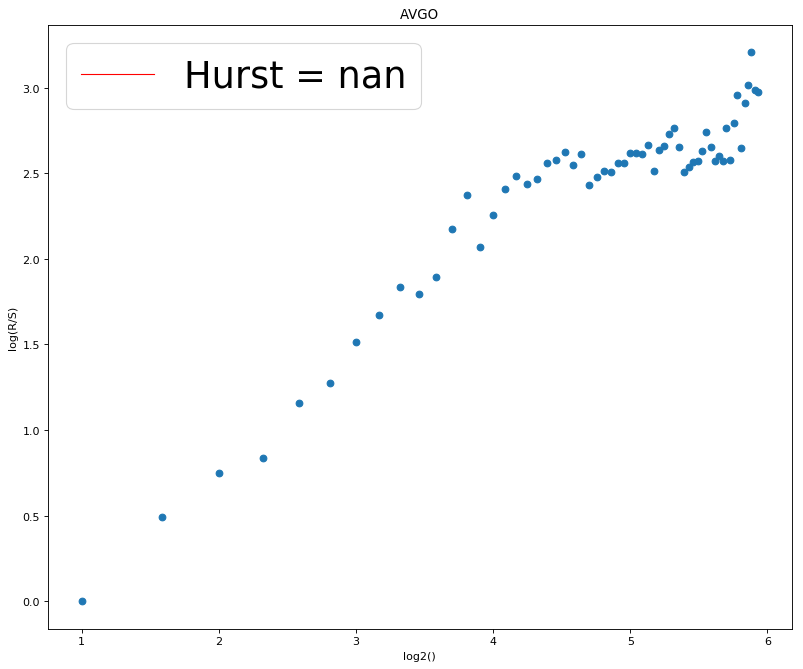

In [44]:
corte = 0.7
datadata = log_retorno_ret_usa.shift(-1)
df_final3 = pd.DataFrame()
df_dinicial3 = pd.DataFrame()
df_dfinal3 = pd.DataFrame()
df_hurst = pd.DataFrame()
a = 0
for i in range(63,1261,63):
    print([a,i])
    for name in ['NVDA', 'NFLX', 'ALGN', 'EA', 'STZ', 'AVGO']:
        agua = pd.DataFrame([Hurst(datadata[name].iloc[a:i], name)], columns=[name], index= [a])
        df_hurst = df_hurst.append(agua)
    a = i
#df_final2 = pd.concat([df_dinicial2, df_dfinal2, df_final2], axis=1, ignore_index=True)
#df_final2.columns = ['Data Inicio','Data Fim','Risco','Retorno','NVDA', 'NFLX', 'ALGN', 'EA', 'STZ', 'AVGO','Coef_Var']

In [46]:
df_hurst

,ALGN,AVGO,EA,NFLX,NVDA,STZ
0,NaN,NaN,NaN,NaN,0.573054,NaN
0,NaN,NaN,NaN,0.538544,NaN,NaN
0,0.555067,NaN,NaN,NaN,NaN,NaN
0,NaN,NaN,0.597243,NaN,NaN,NaN
0,NaN,NaN,NaN,NaN,NaN,0.540826
0,NaN,0.629299,NaN,NaN,NaN,NaN
63,NaN,NaN,NaN,NaN,0.403153,NaN
63,NaN,NaN,NaN,0.564229,NaN,NaN
63,0.659261,NaN,NaN,NaN,NaN,NaN
63,NaN,NaN,0.515351,NaN,NaN,NaN


In [49]:
df_hurst = df_hurst.groupby(df_hurst.index).first().reset_index()
df_hurst

,index,ALGN,AVGO,EA,NFLX,NVDA,STZ
0,0,0.555067,0.629299,0.597243,0.538544,0.573054,0.540826
1,63,0.659261,0.434697,0.515351,0.564229,0.403153,0.679543
2,126,0.592943,0.512487,0.526710,0.569996,0.604615,0.498786
3,189,0.594955,0.570481,0.603169,0.655856,0.545019,0.678744
4,252,0.406535,0.592968,0.709221,0.715413,0.634883,0.629019
5,315,0.562618,0.539831,0.578174,0.643838,0.638294,0.716607
6,378,0.811101,0.729113,0.736850,0.592221,0.762352,0.611079
7,441,0.611701,0.670704,0.519965,0.748896,0.546983,0.796724
8,504,0.694633,0.555717,0.506710,0.698604,0.546334,0.518587
9,567,0.479793,0.694754,0.745661,0.518293,0.584323,0.514289


In [53]:
df_teste = df_hurst.copy() #[df_hurst > 0.6] 
df_teste

,index,ALGN,AVGO,EA,NFLX,NVDA,STZ
0,0,0.555067,0.629299,0.597243,0.538544,0.573054,0.540826
1,63,0.659261,0.434697,0.515351,0.564229,0.403153,0.679543
2,126,0.592943,0.512487,0.526710,0.569996,0.604615,0.498786
3,189,0.594955,0.570481,0.603169,0.655856,0.545019,0.678744
4,252,0.406535,0.592968,0.709221,0.715413,0.634883,0.629019
5,315,0.562618,0.539831,0.578174,0.643838,0.638294,0.716607
6,378,0.811101,0.729113,0.736850,0.592221,0.762352,0.611079
7,441,0.611701,0.670704,0.519965,0.748896,0.546983,0.796724
8,504,0.694633,0.555717,0.506710,0.698604,0.546334,0.518587
9,567,0.479793,0.694754,0.745661,0.518293,0.584323,0.514289


In [55]:
df_teste = df_teste.set_index('index')


In [105]:
df_teste[df_teste >= 0.6] = 1
df_teste[df_teste < 0.6] = 0
df_teste

,ALGN,AVGO,EA,NFLX,NVDA,STZ
index,,,,,,
0,0.0,1.0,0.0,0.0,0.0,0.0
63,1.0,0.0,0.0,0.0,0.0,1.0
126,0.0,0.0,0.0,0.0,1.0,0.0
189,0.0,0.0,1.0,1.0,0.0,1.0
252,0.0,0.0,1.0,1.0,1.0,1.0
315,0.0,0.0,0.0,1.0,1.0,1.0
378,1.0,1.0,1.0,0.0,1.0,1.0
441,1.0,1.0,0.0,1.0,0.0,1.0
504,1.0,0.0,0.0,1.0,0.0,0.0


In [120]:
df_soma_ret_ret = pd.DataFrame()
v_entrada = log_retorno_ret_usa
for i in range(63,1261,63):
    valores = pd.DataFrame([v_entrada.iloc[:i].sum().values], columns=v_entrada.columns.values)
    df_soma_ret_ret = df_soma_ret_ret.append(valores)
df_soma_ret_ret

,NVDA,NFLX,ALGN,EA,STZ,AVGO
0,0.117334,0.178845,0.086298,0.219799,0.426693,-0.041920
0,0.172505,0.324730,0.297714,0.427669,0.540278,0.055080
0,0.186087,0.617679,0.556337,0.393302,0.734810,0.250402
0,0.249156,0.865409,0.519223,0.448472,0.889241,0.471029
0,0.377871,0.596360,0.412670,0.704026,0.912453,0.646344
0,0.429165,0.901653,0.502727,0.680109,0.974412,0.690170
0,0.491398,0.750488,0.474994,0.853938,1.077245,0.908674
0,0.499280,0.895386,0.519405,1.139319,1.256211,1.062874
0,0.511472,1.181700,0.595160,1.281861,1.303015,1.246189
0,0.653571,1.560009,0.633992,1.448915,1.359164,1.281940


In [210]:
xxx = df_teste.values * df_soma_ret_ret.values
xxx = pd.DataFrame(xxx)
xxx

,0,1,2,3,4,5
0,0.000000,0.178845,0.000000,0.000000,0.000000,-0.000000
1,0.172505,0.000000,0.000000,0.000000,0.000000,0.055080
2,0.000000,0.000000,0.000000,0.000000,0.734810,0.000000
3,0.000000,0.000000,0.519223,0.448472,0.000000,0.471029
4,0.000000,0.000000,0.412670,0.704026,0.912453,0.646344
5,0.000000,0.000000,0.000000,0.680109,0.974412,0.690170
6,0.491398,0.750488,0.474994,0.000000,1.077245,0.908674
7,0.499280,0.895386,0.000000,1.139319,0.000000,1.062874
8,0.511472,0.000000,0.000000,1.281861,0.000000,0.000000
9,0.000000,1.560009,0.633992,0.000000,0.000000,0.000000


In [211]:
xxx[xxx > 0] = 1
xxx[xxx <= 0] = 0
xxx

,0,1,2,3,4,5
0,0.0,1.0,0.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,1.0
2,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,1.0,1.0,0.0,1.0
4,0.0,0.0,1.0,1.0,1.0,1.0
5,0.0,0.0,0.0,1.0,1.0,1.0
6,1.0,1.0,1.0,0.0,1.0,1.0
7,1.0,1.0,0.0,1.0,0.0,1.0
8,1.0,0.0,0.0,1.0,0.0,0.0
9,0.0,1.0,1.0,0.0,0.0,0.0


In [212]:
montante = np.zeros(20)
p0 = 100000
acumular = 63
for j in range(20):
    montante[j] = p0
    # acoes que entram
    a = ret_usa.iloc[acumular].values * xxx.iloc[j].values
    # pesos
    b = xxx.iloc[j].values / xxx.iloc[j].values.sum()
    # dinheiro aplicado em cada acao
    c = b * p0
    # numero de acoes compradas
    compradas = np.zeros(c.shape[0])
    for i in range(c.shape[0]):
        if c[i] > 0.1:
            compradas[i] = (b[i] * p0) / a[i]
    if acumular + 63 > 1258:
        acumular = 1258 - 63
    # valorizacao
    valorizacao = (ret_usa.iloc[acumular+63].values * xxx.iloc[j].values) * compradas
    # novao p0
    p0 = valorizacao.sum()
    p0
    acumular += 63
montante

array([  100000.        ,   116103.35990431,   127089.19728148,
         149196.71644302,   172778.81045223,   178694.0966796 ,
         206584.01921604,   238603.98904643,   272558.24728432,
         315859.32238422,   314601.7895681 ,   330133.27581501,
         361771.5074633 ,   444431.87064596,   516963.2801898 ,
         599284.92204083,   651396.65439221,   753187.66278464,
         823645.03649811,  1109262.52726502])

In [217]:
np.set_printoptions(suppress=True)
pd.set_option('display.float_format', lambda x: '%.2f' % x)
df_teste['Montante'] = montante
df_teste

,ALGN,AVGO,EA,NFLX,NVDA,STZ,Montante
index,,,,,,,
0,0.00,1.00,0.00,0.00,0.00,0.00,100000.00
63,1.00,0.00,0.00,0.00,0.00,1.00,116103.36
126,0.00,0.00,0.00,0.00,1.00,0.00,127089.20
189,0.00,0.00,1.00,1.00,0.00,1.00,149196.72
252,0.00,0.00,1.00,1.00,1.00,1.00,172778.81
315,0.00,0.00,0.00,1.00,1.00,1.00,178694.10
378,1.00,1.00,1.00,0.00,1.00,1.00,206584.02
441,1.00,1.00,0.00,1.00,0.00,1.00,238603.99
504,1.00,0.00,0.00,1.00,0.00,0.00,272558.25


# Maiores Riscos (EUA)

[0, 63]


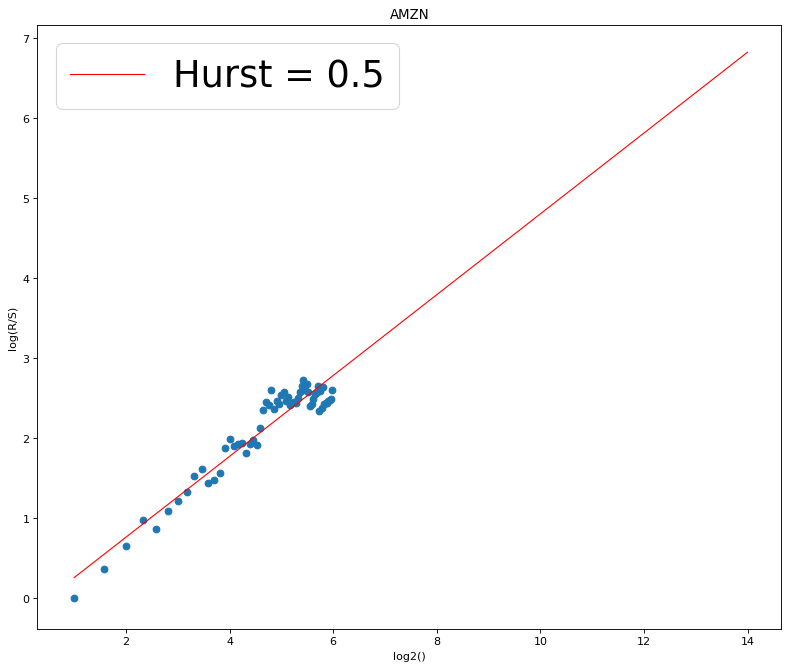

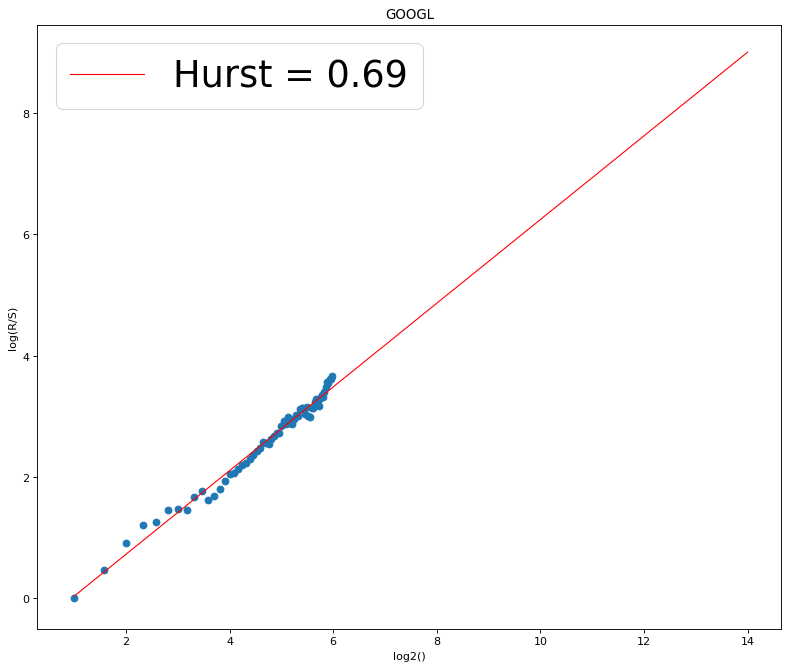

/Users/caiosalgado/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:6201: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=True'.

To retain the current behavior and silence the warning, pass sort=False

  sort=sort)


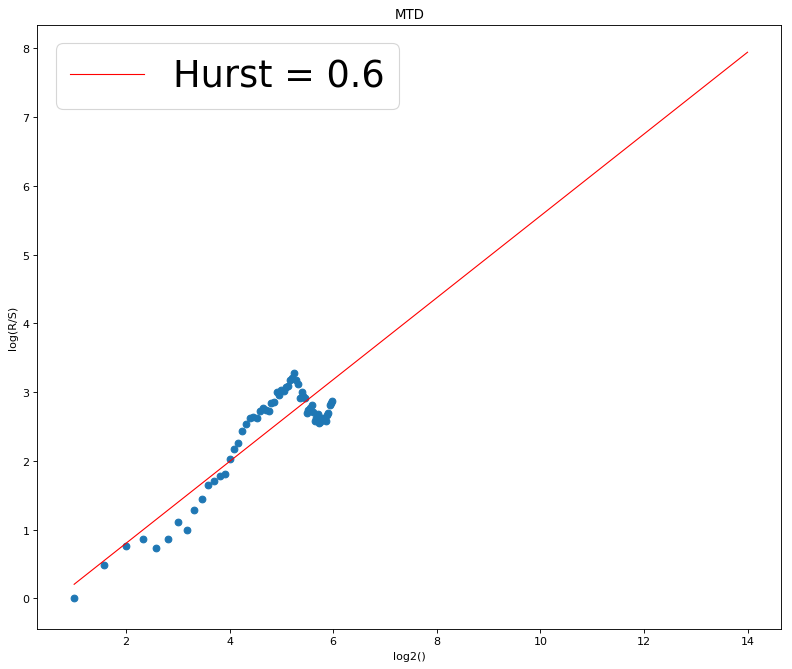

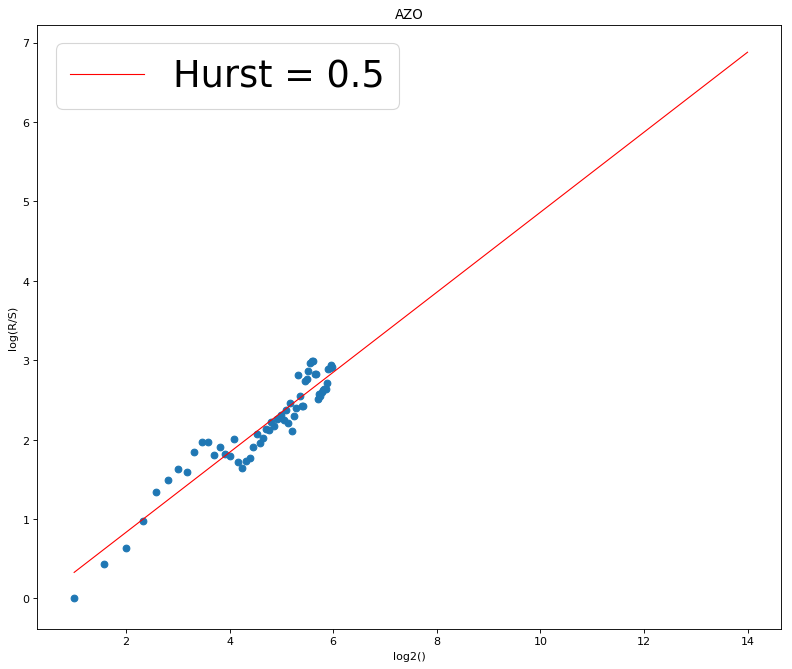

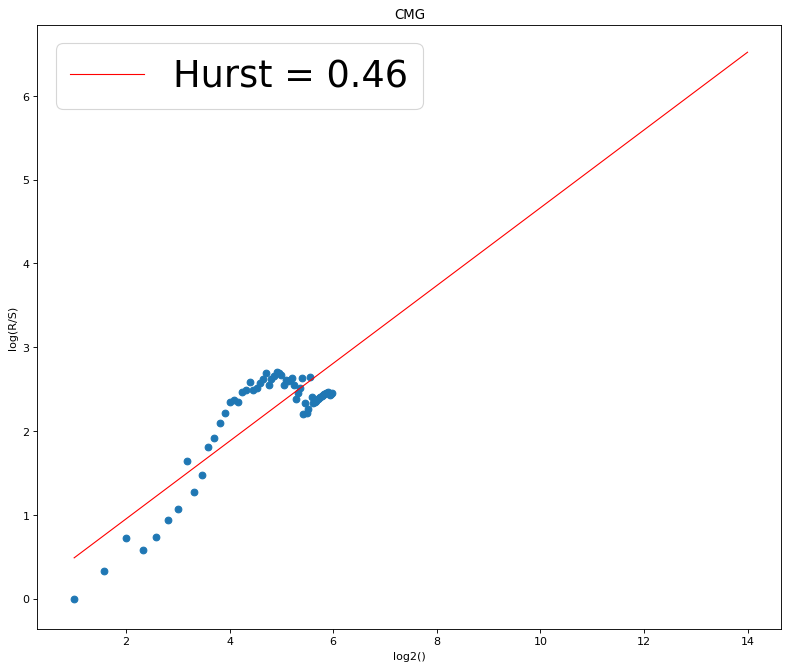

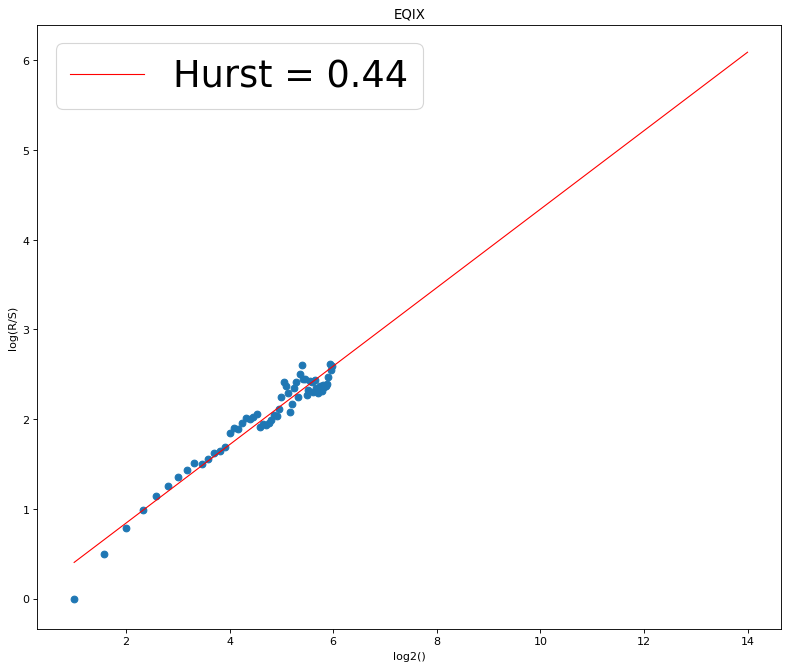

[63, 126]


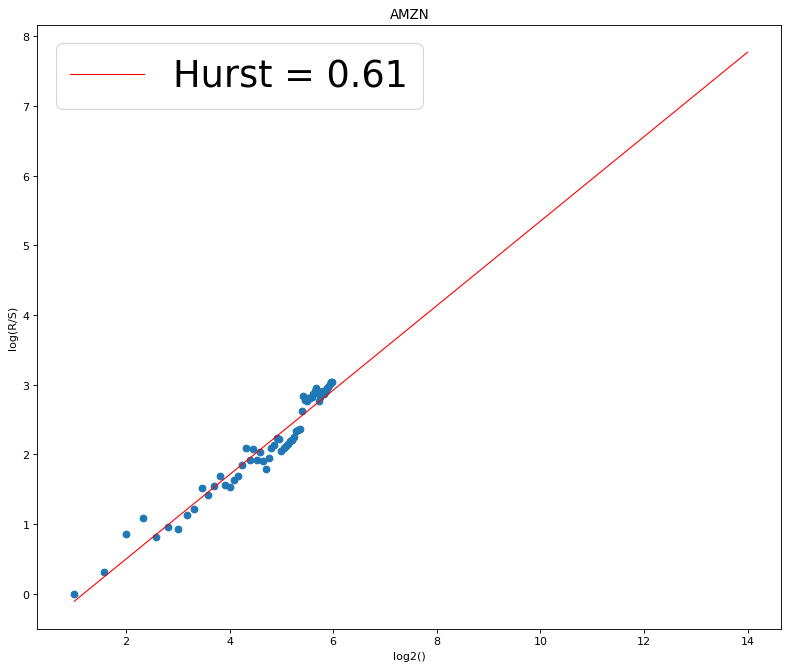

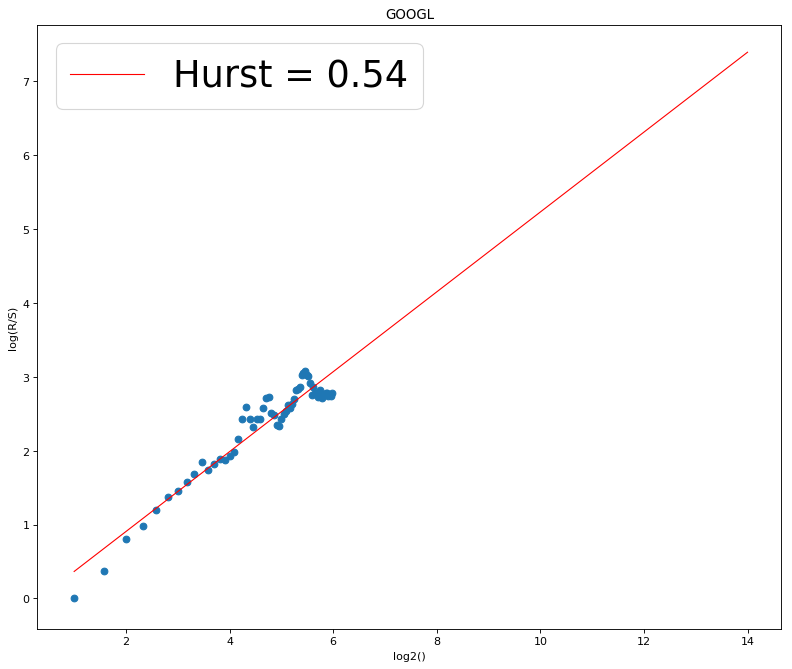

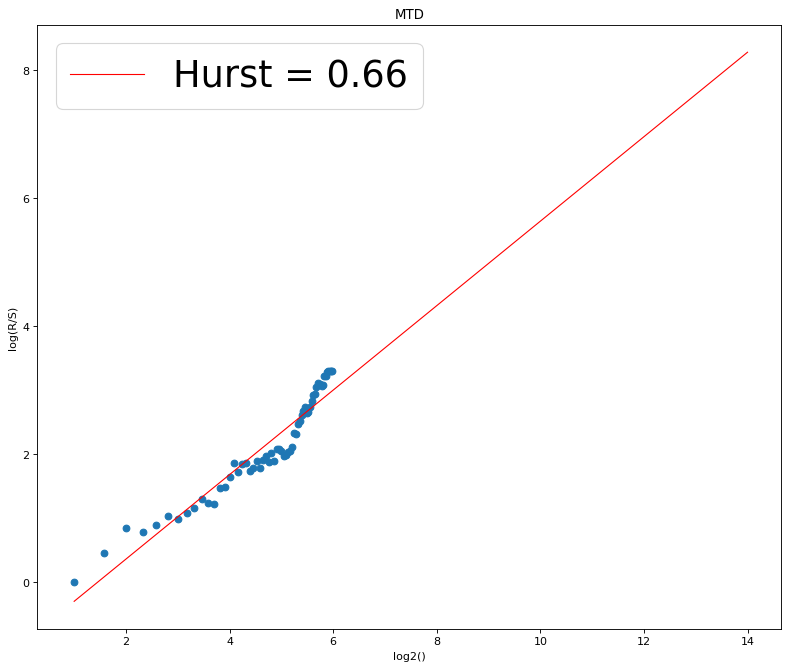

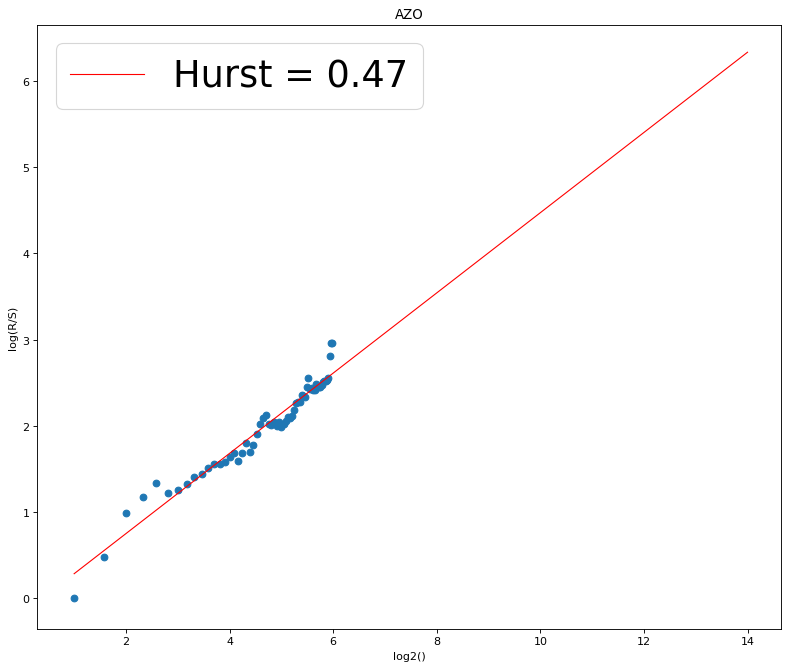

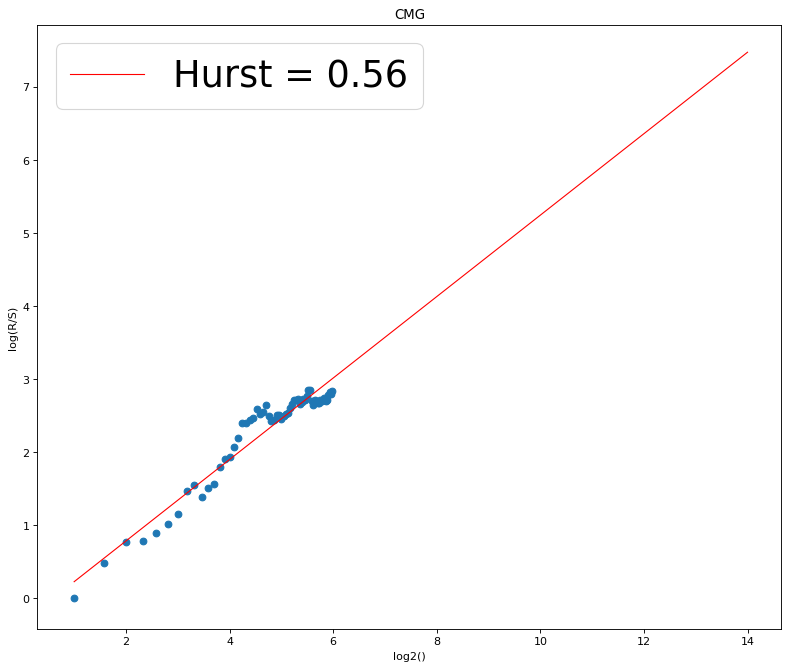

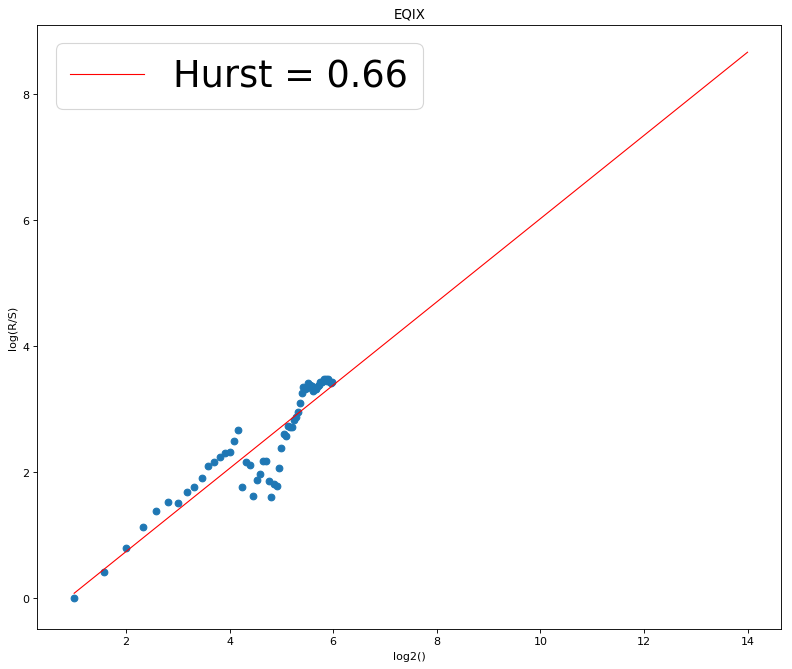

[126, 189]


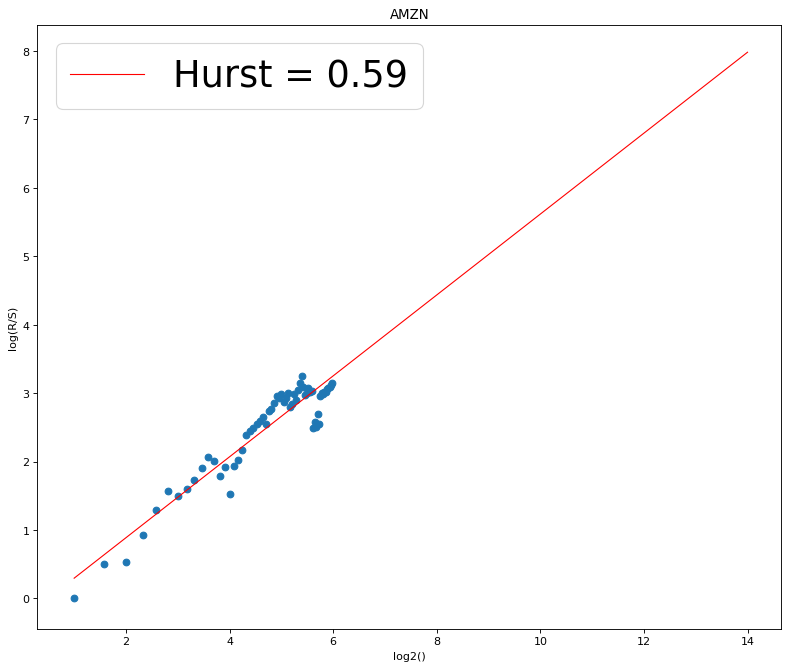

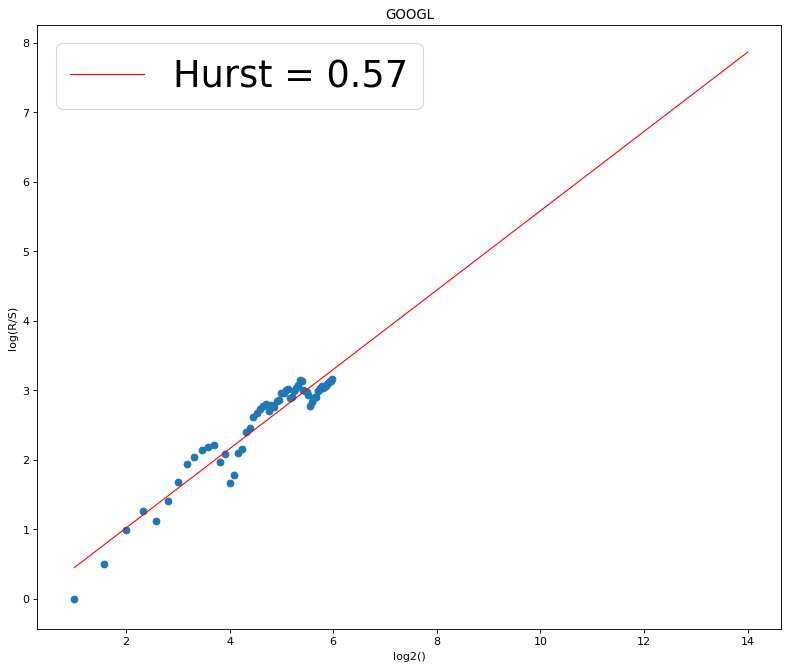

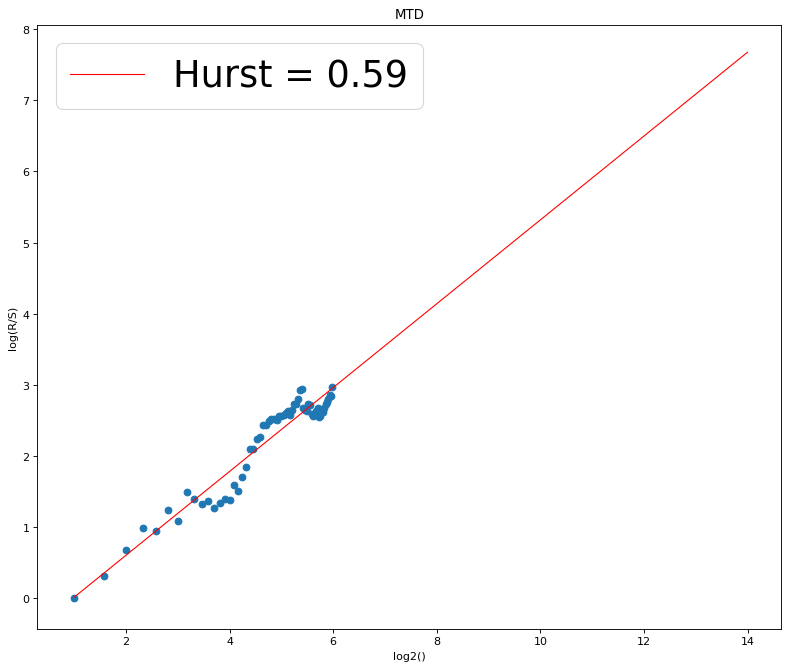

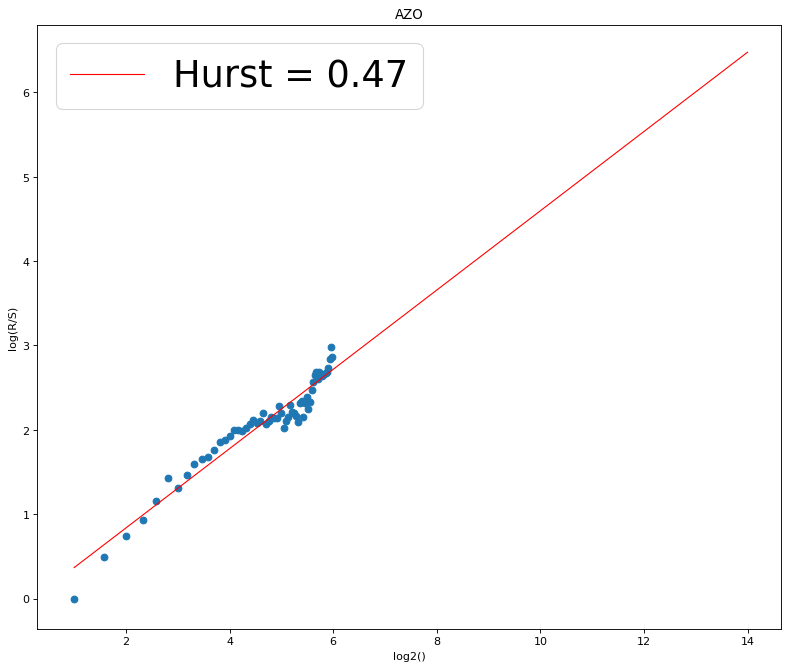

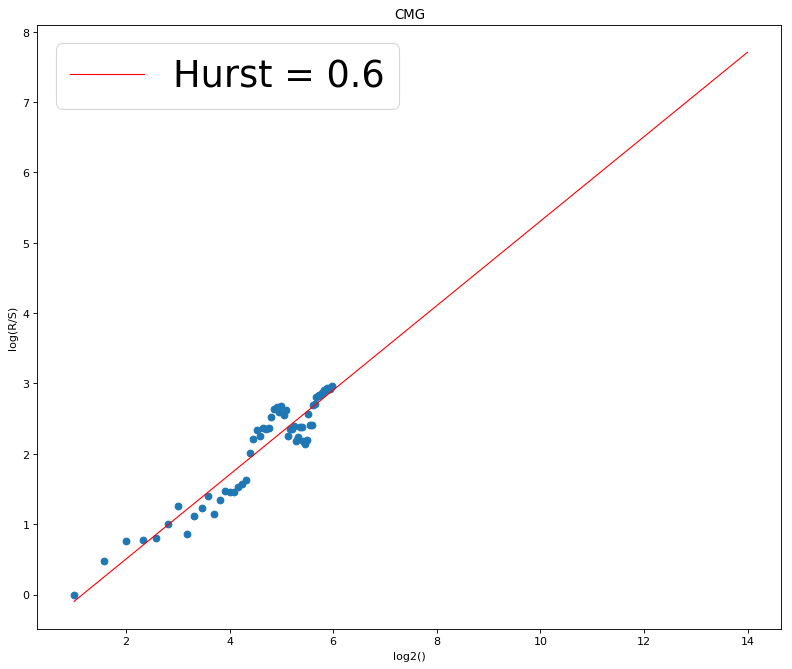

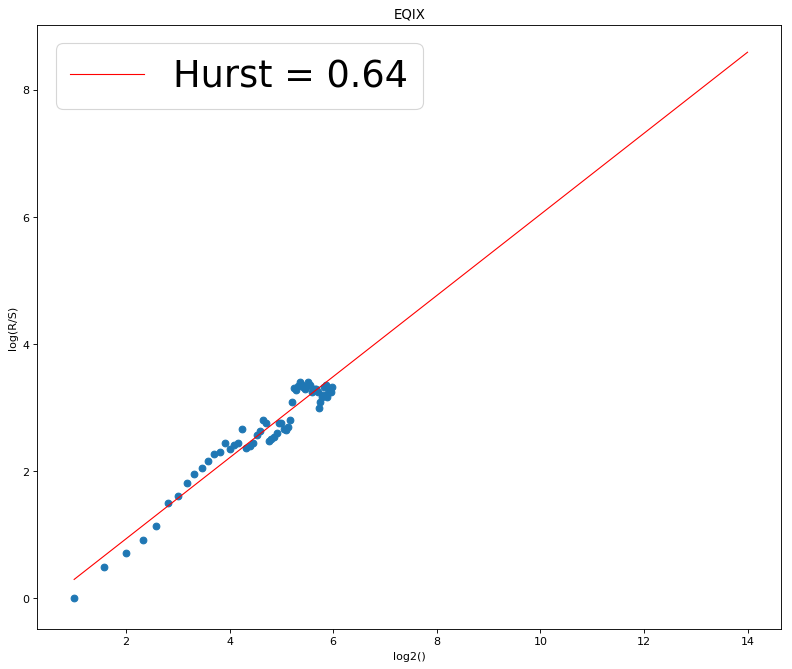

[189, 252]


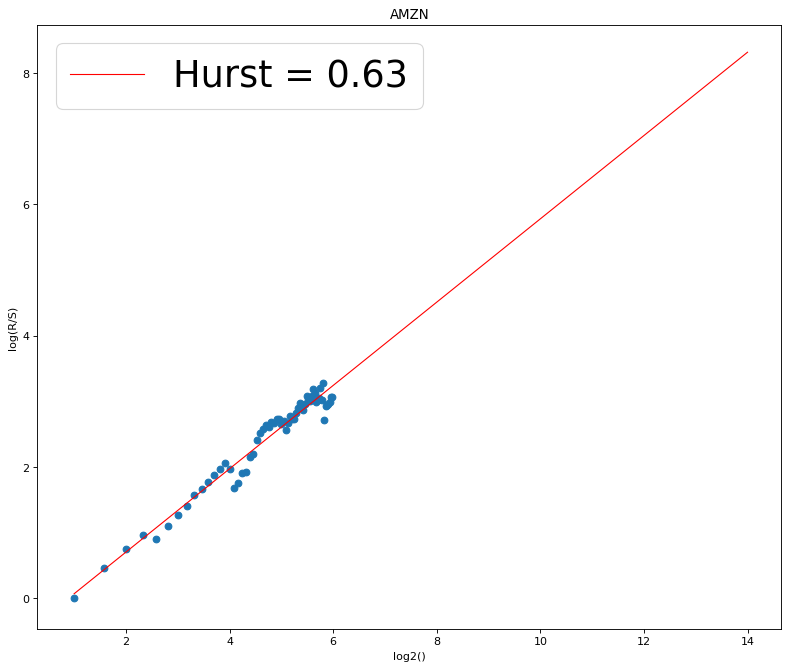

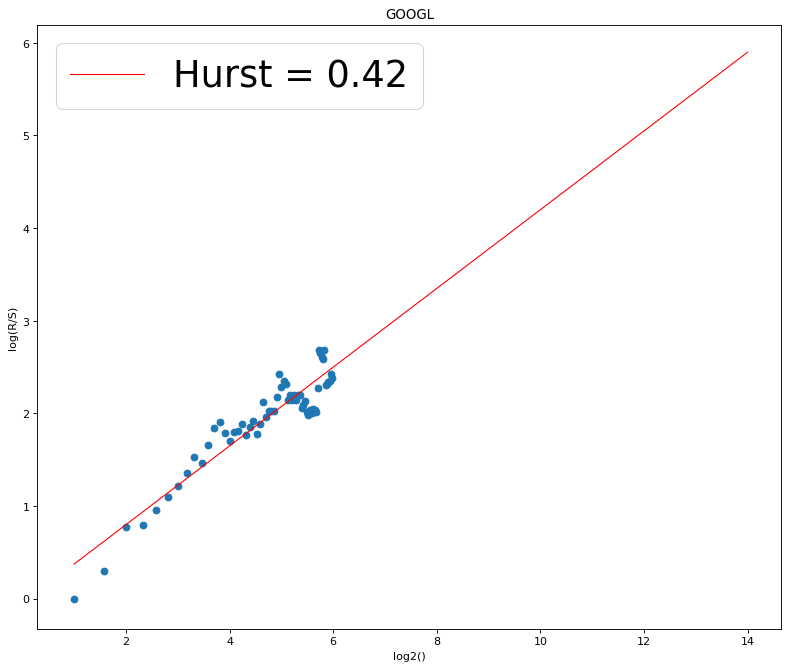

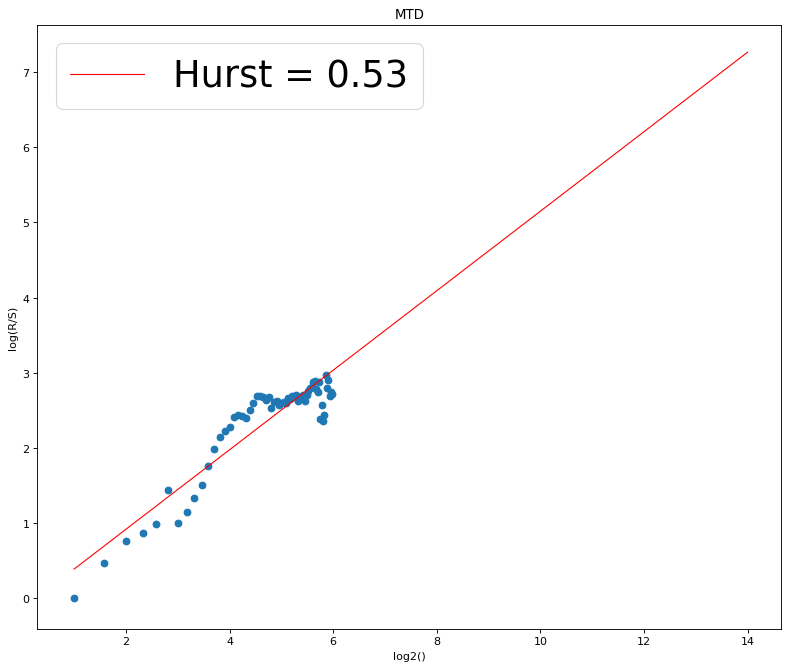

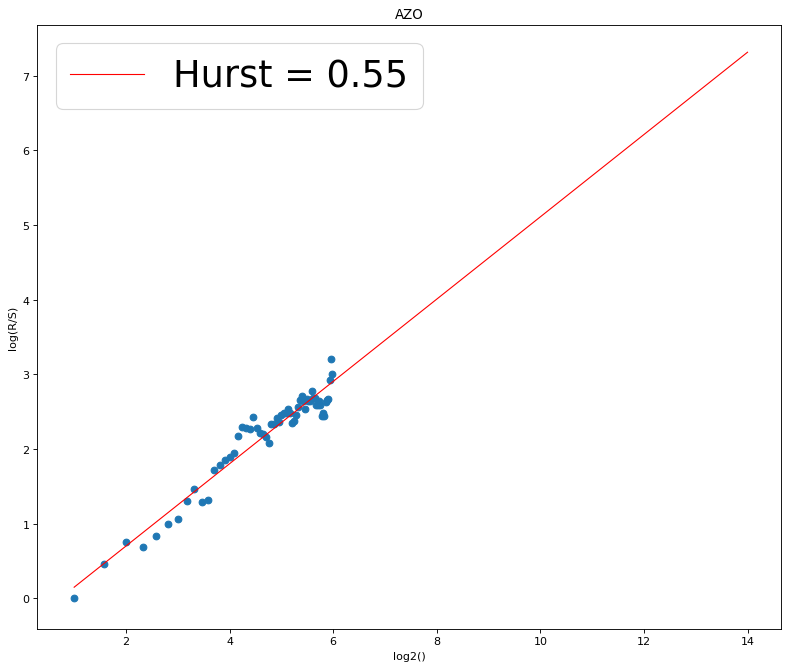

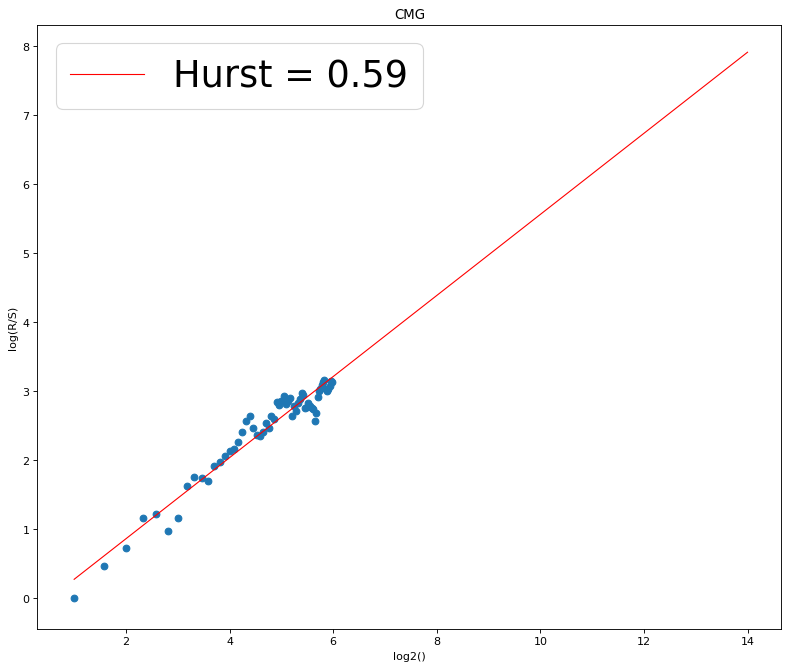

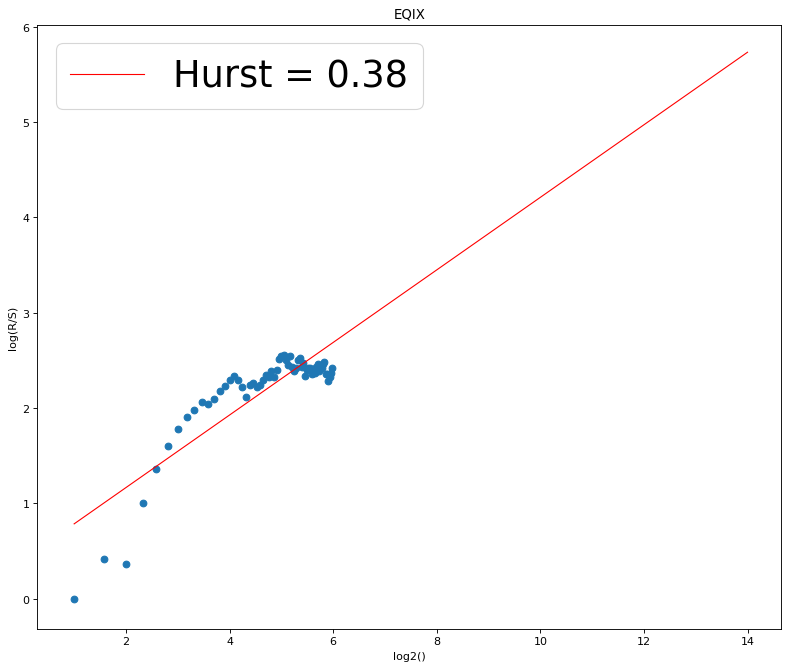

[252, 315]


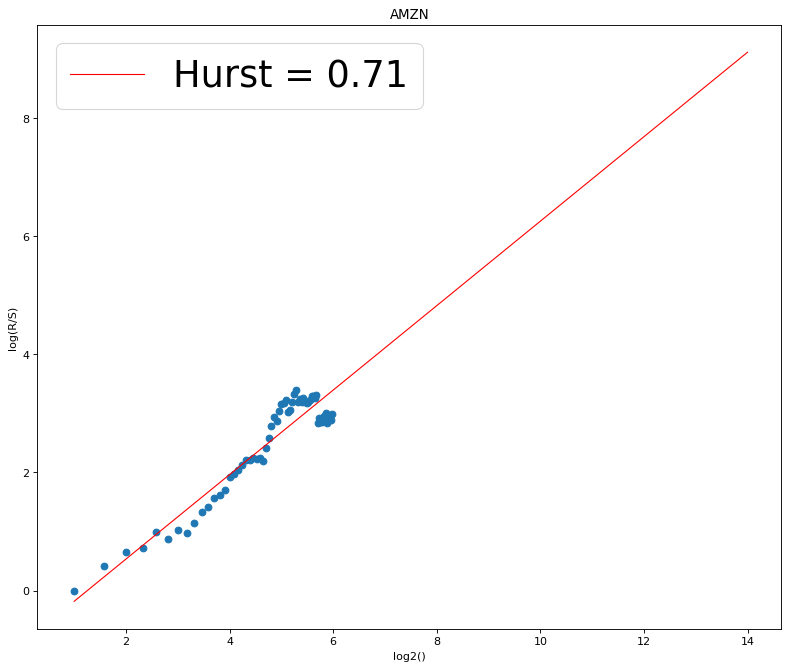

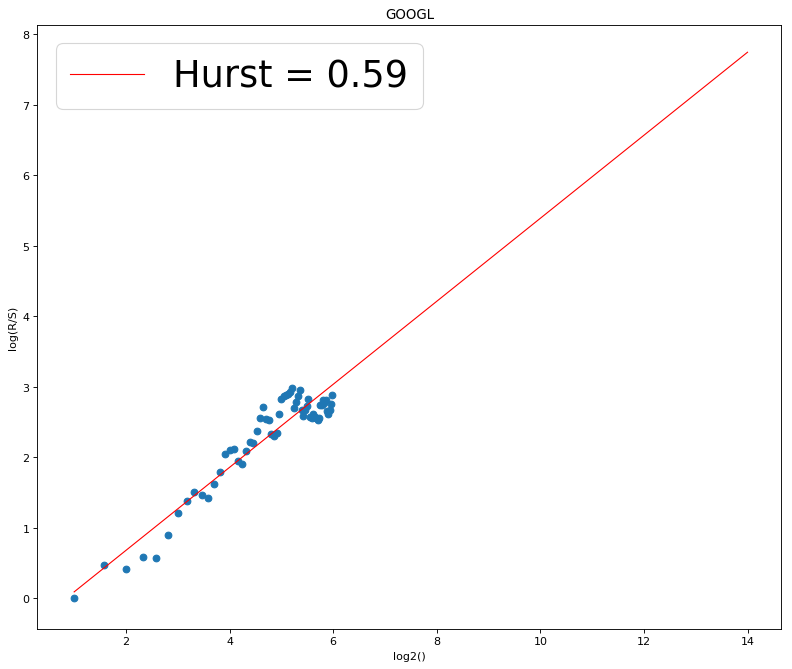

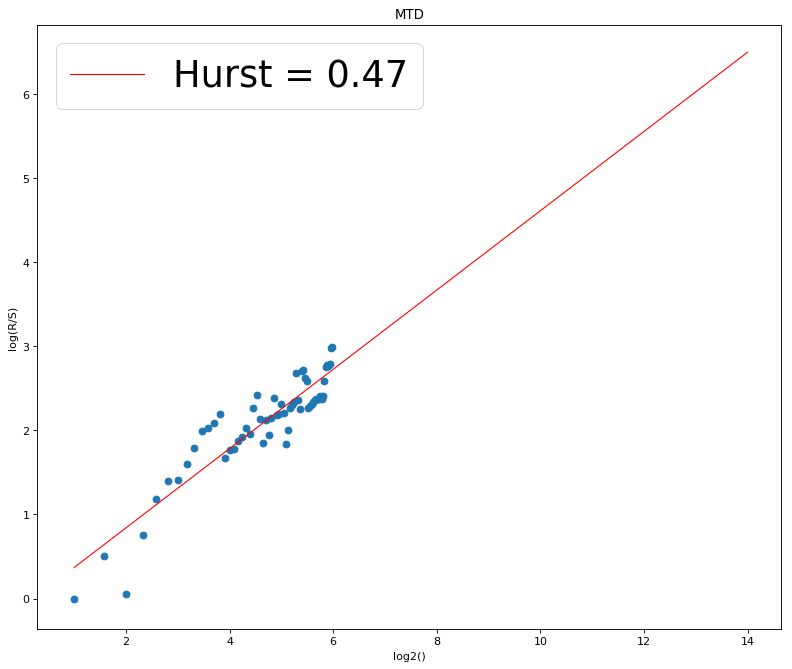

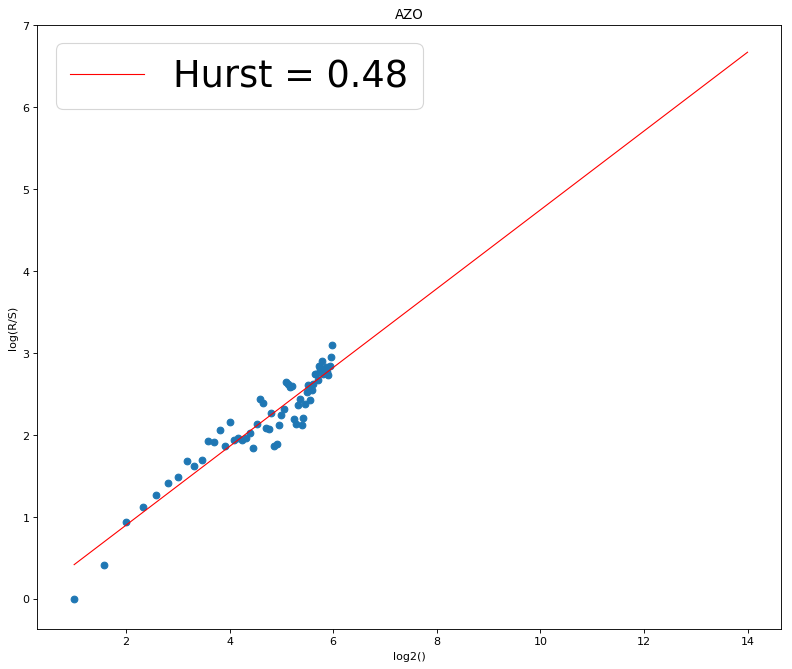

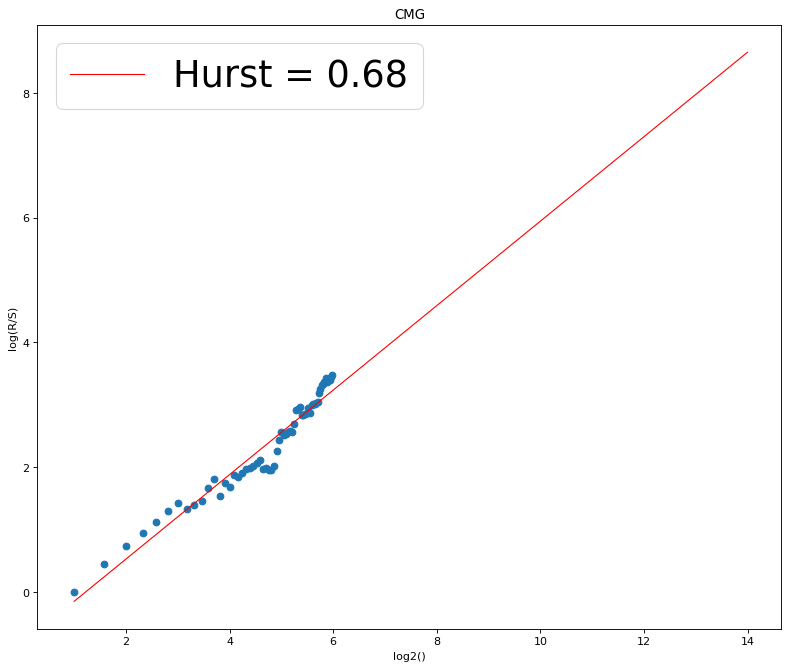

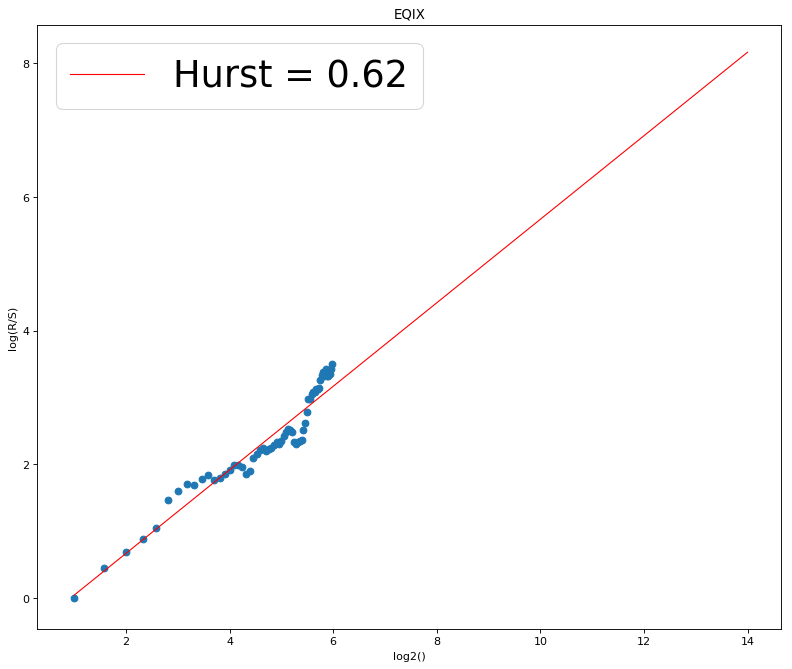

[315, 378]


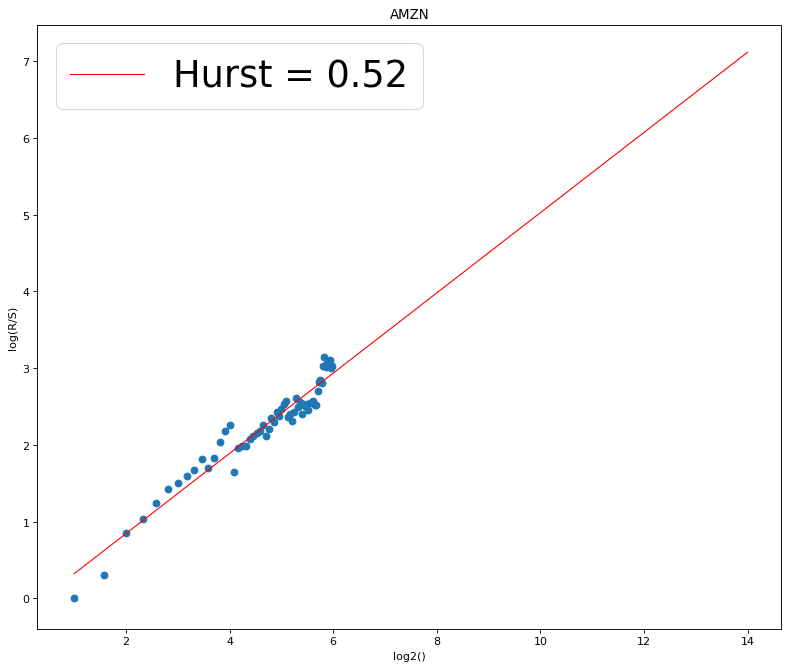

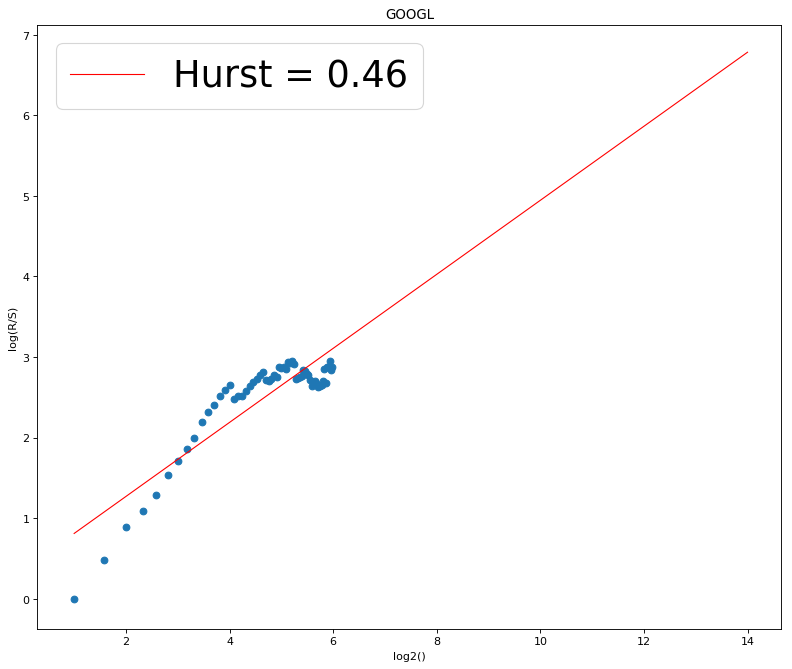

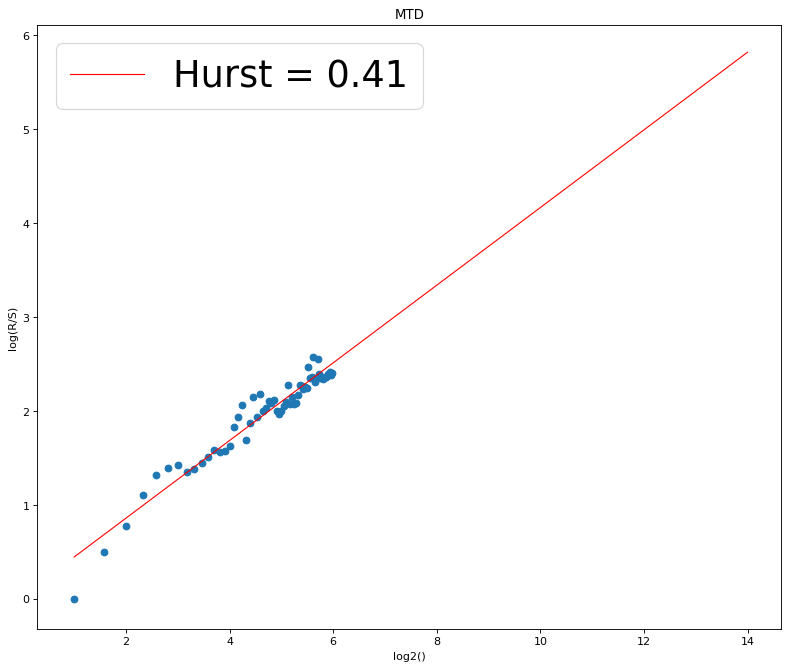

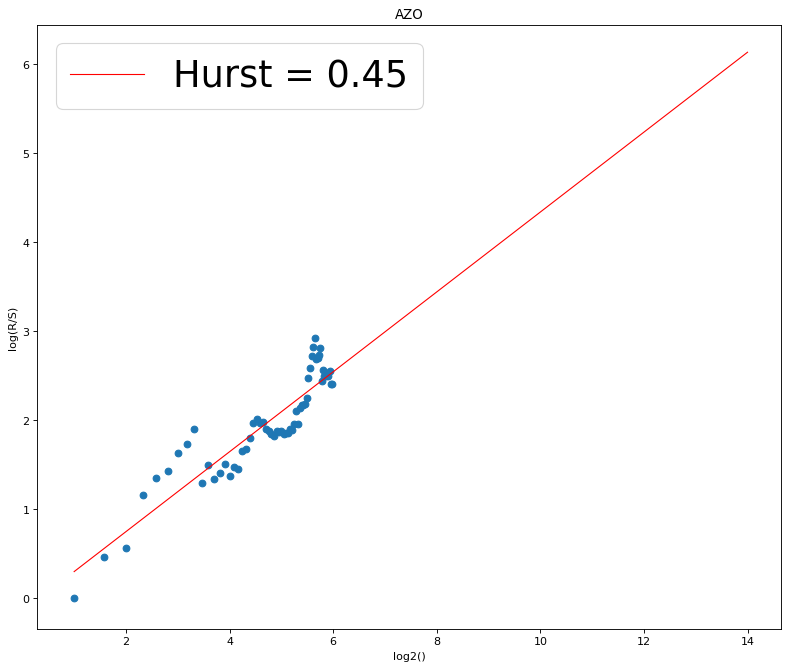

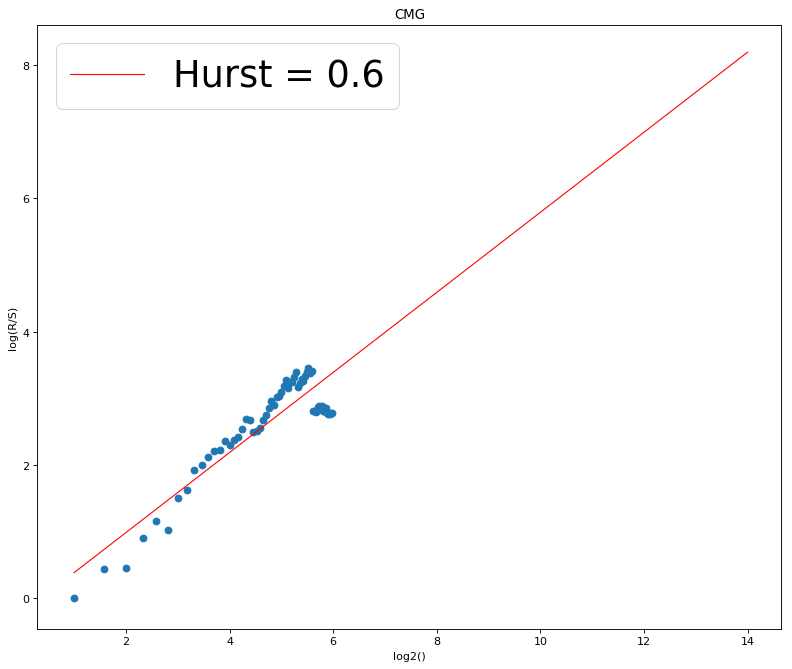

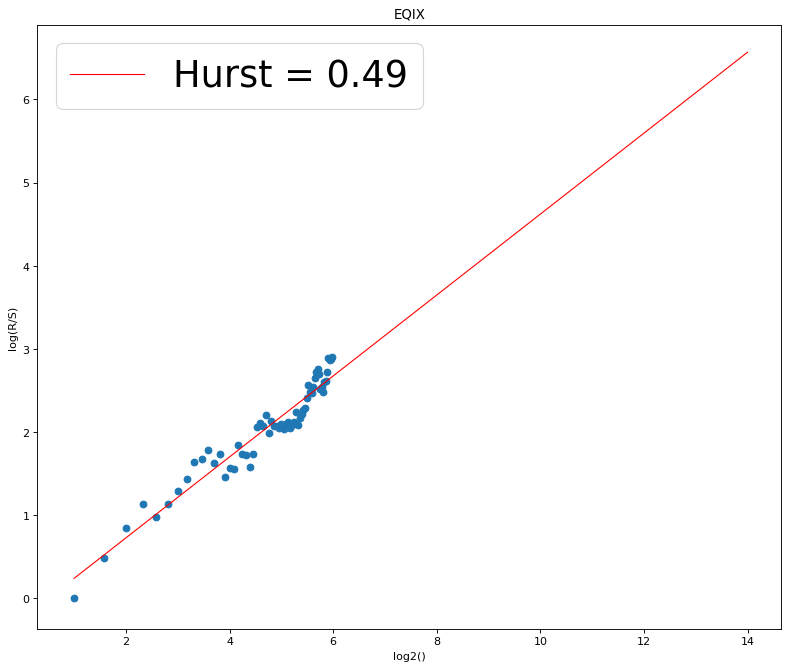

[378, 441]


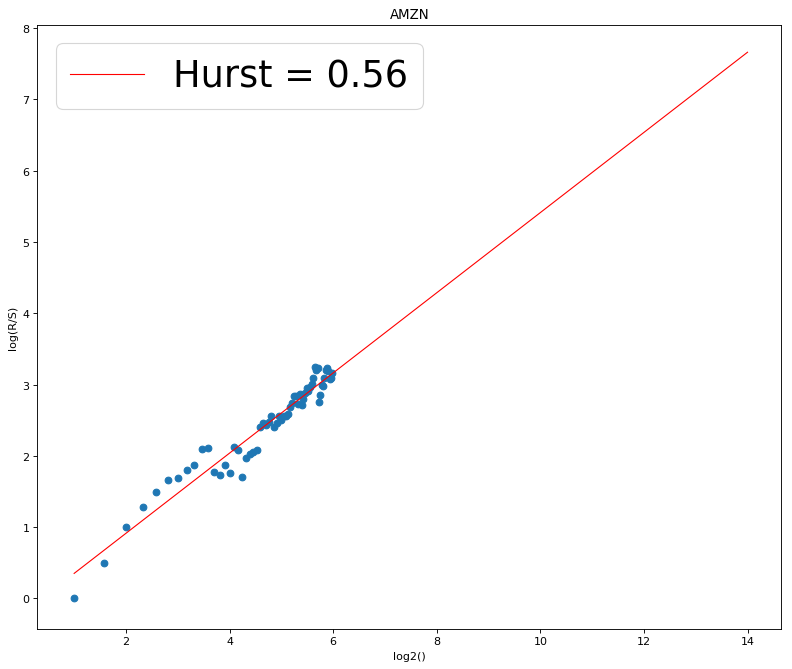

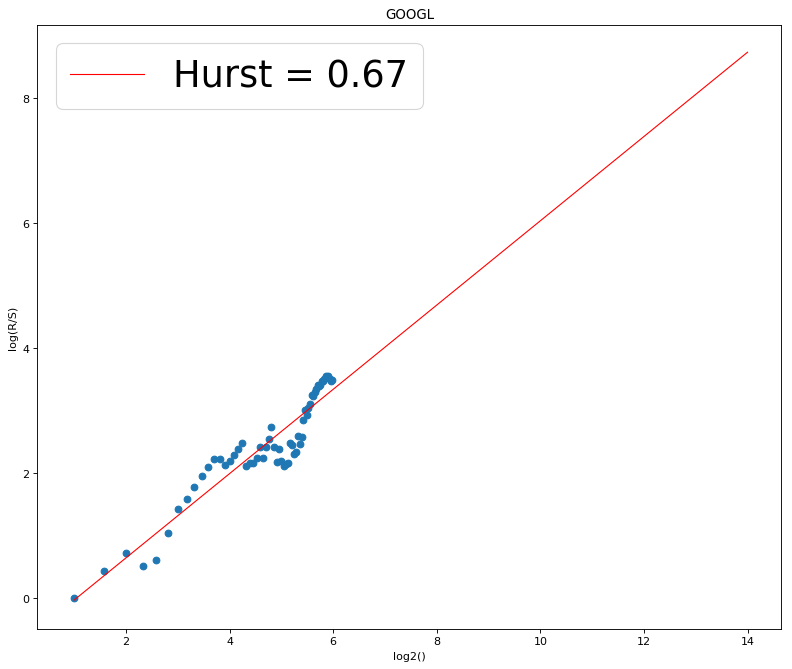

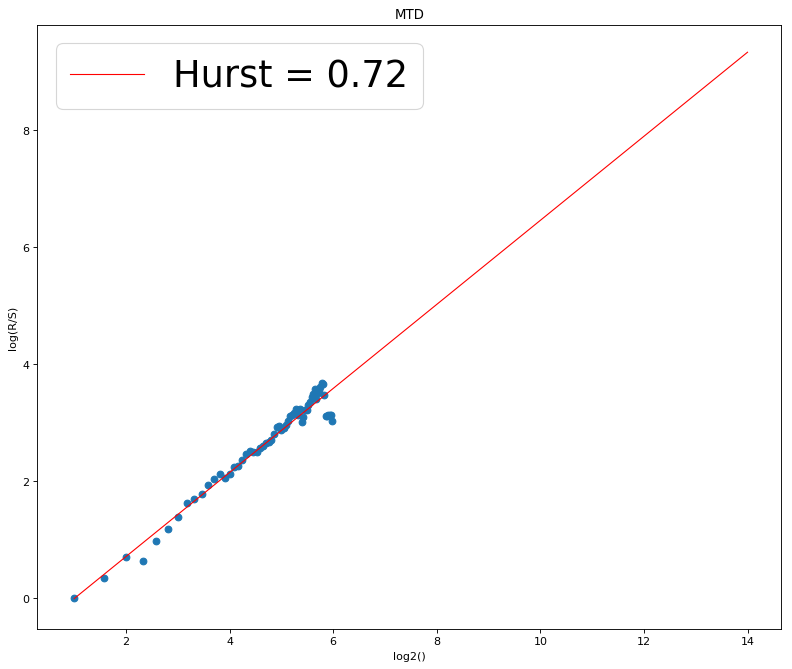

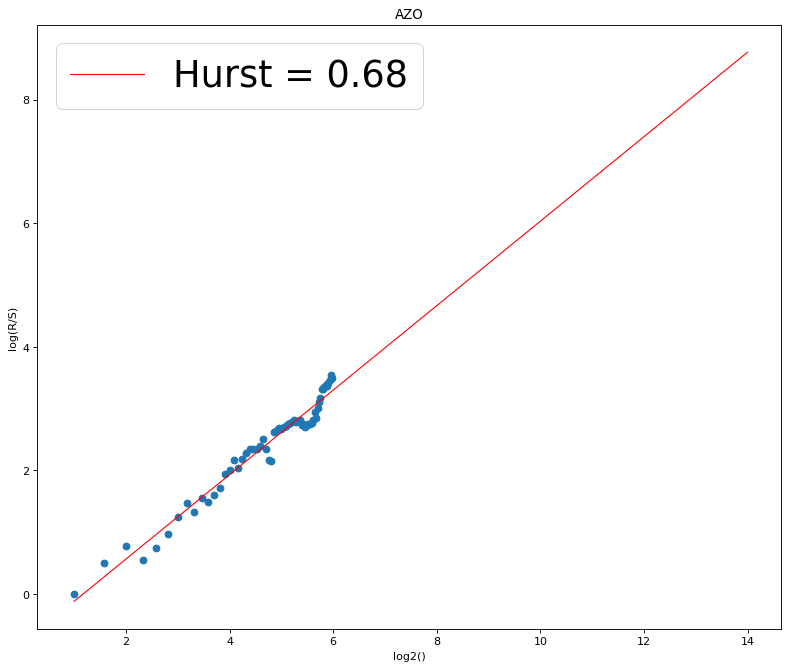

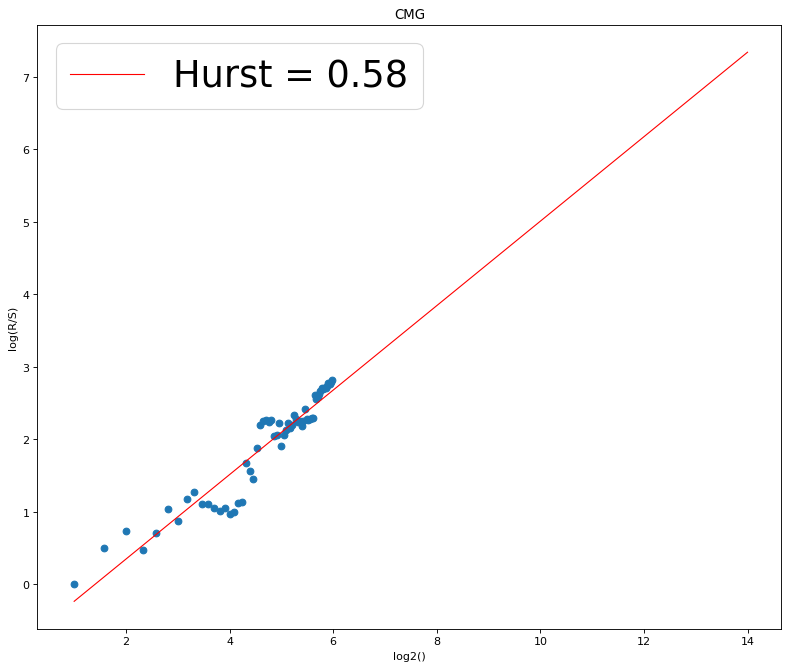

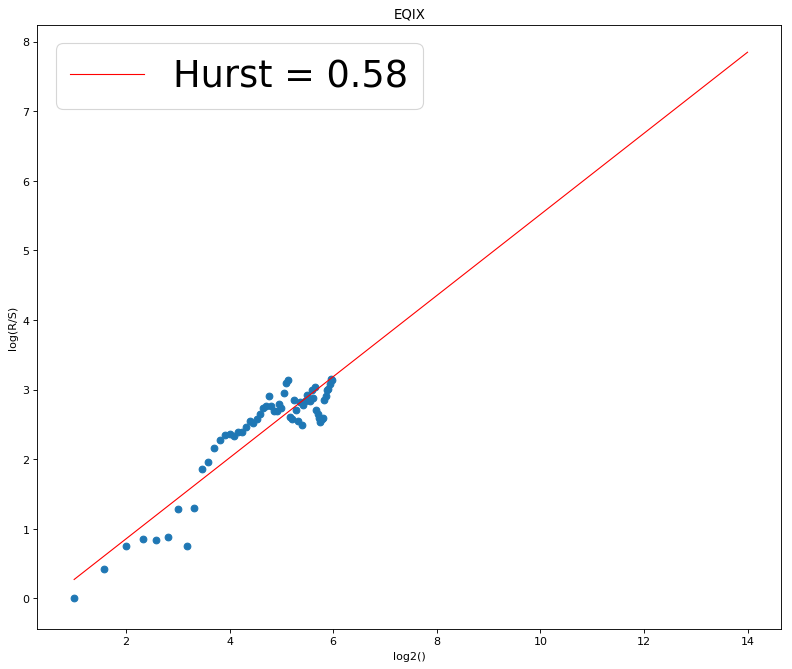

[441, 504]


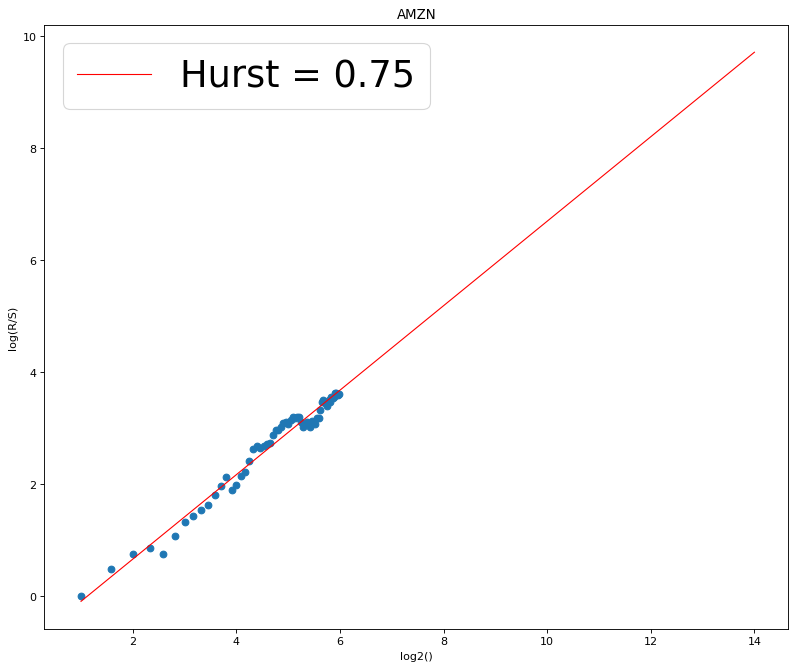

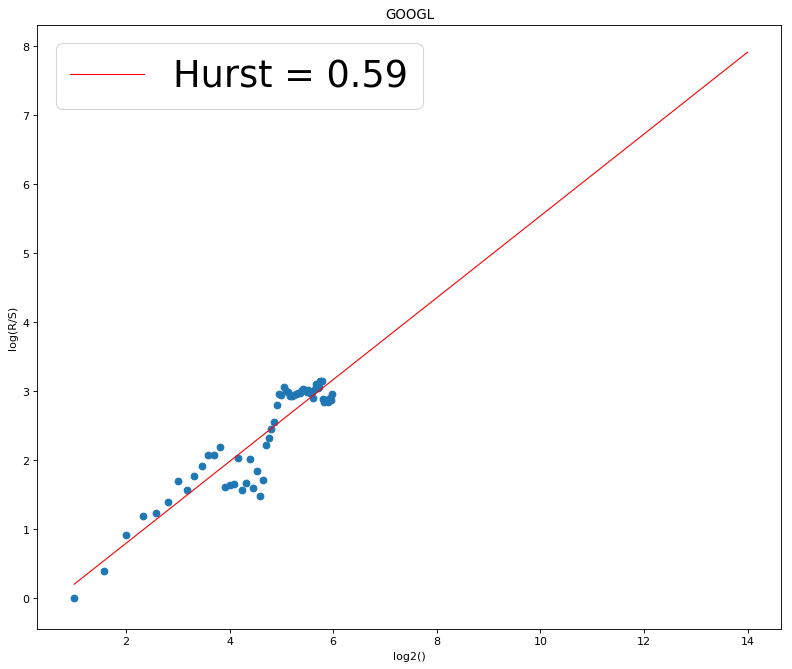

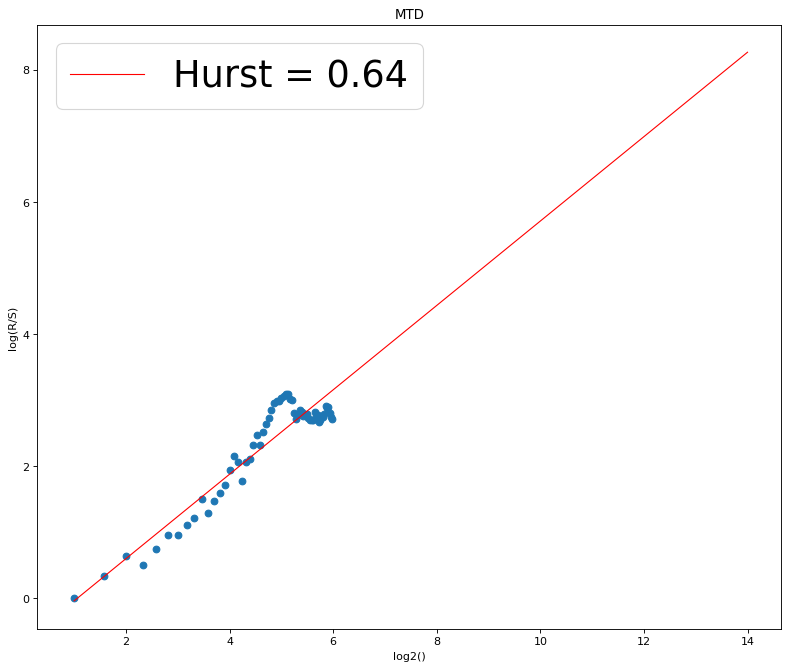

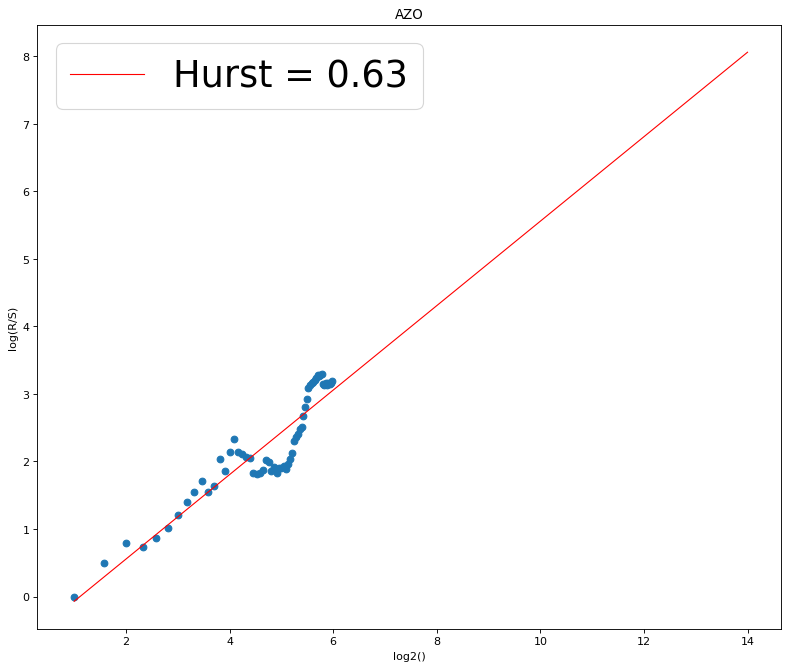

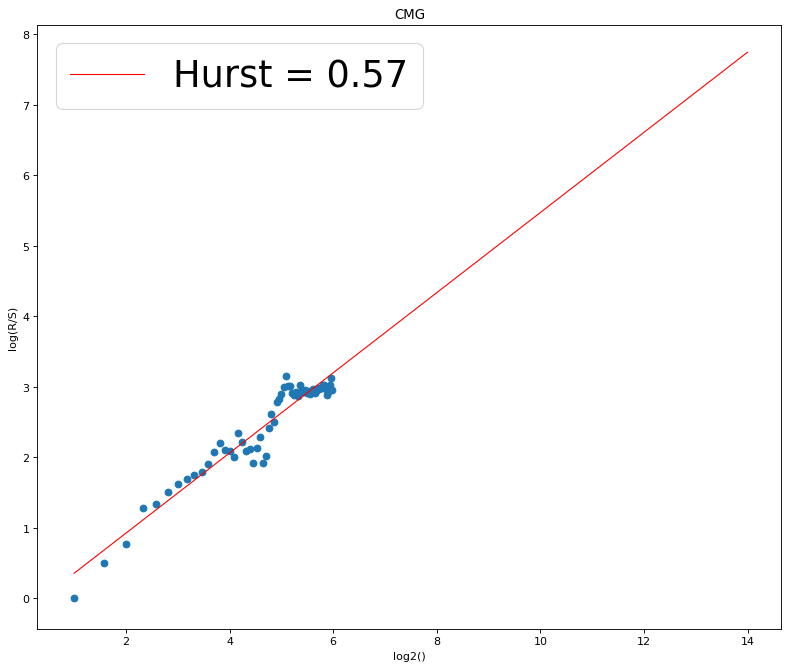

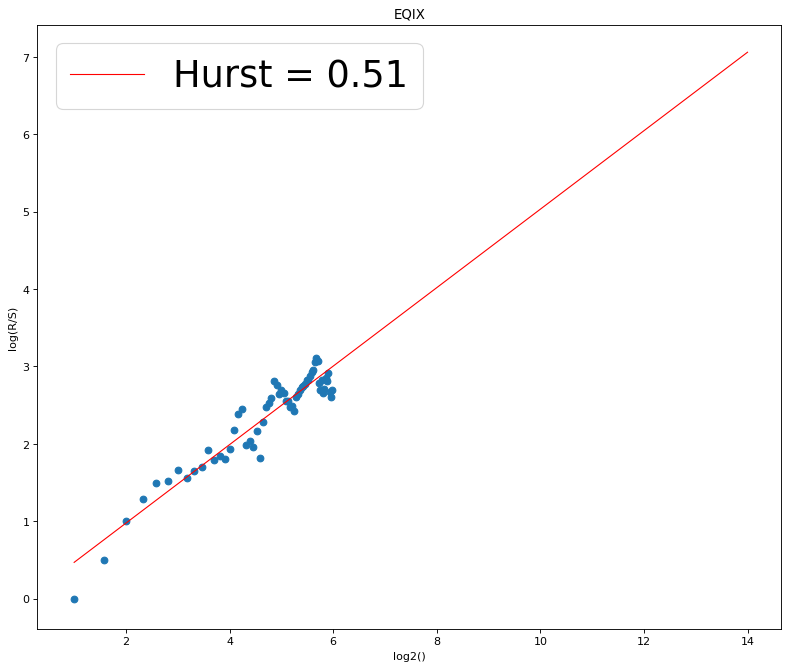

[504, 567]


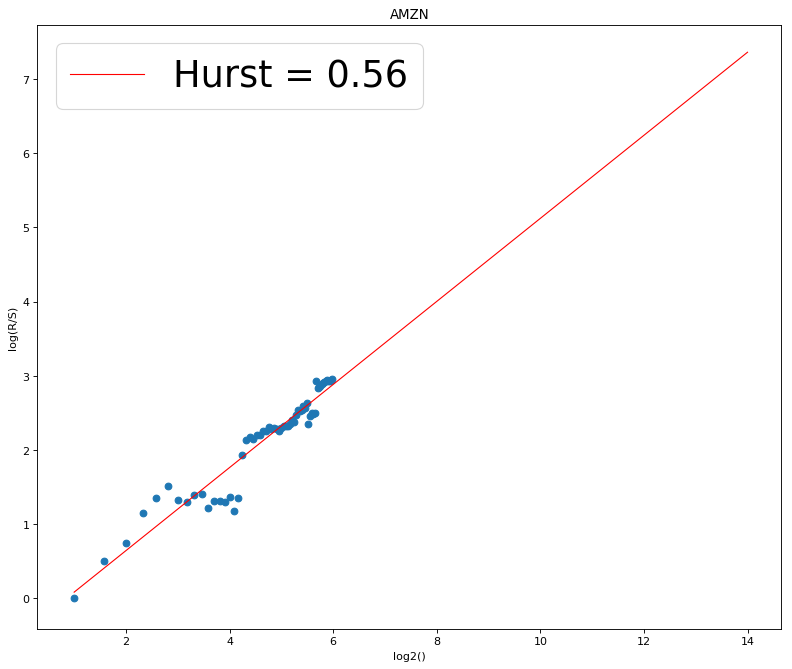

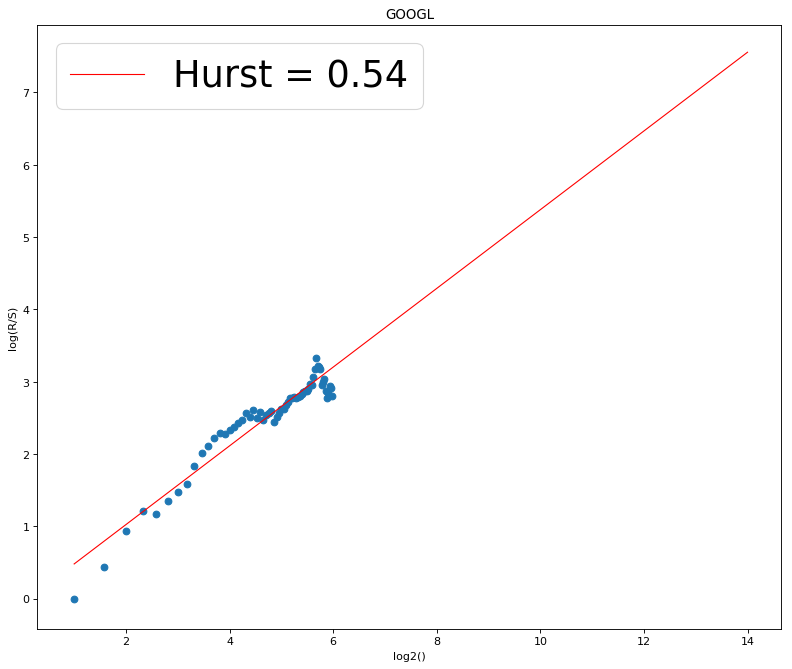

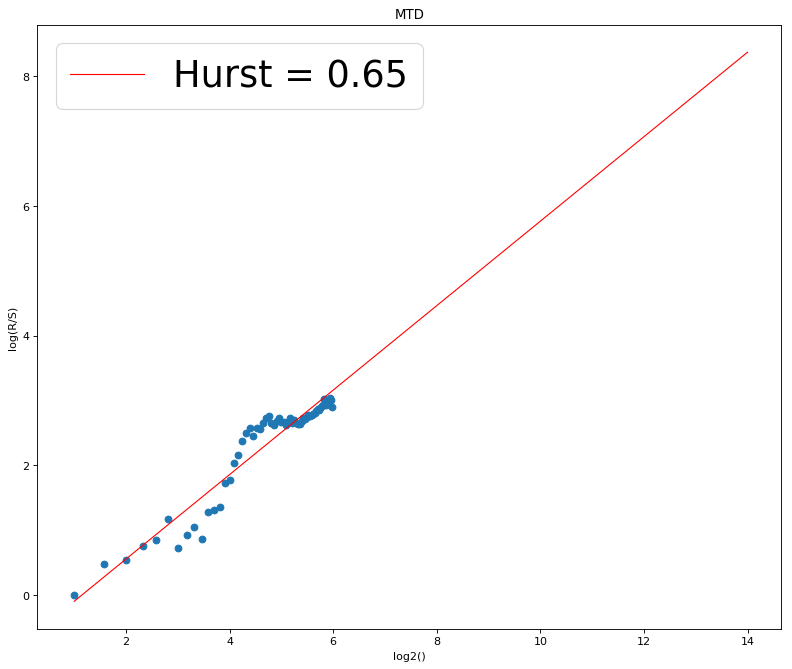

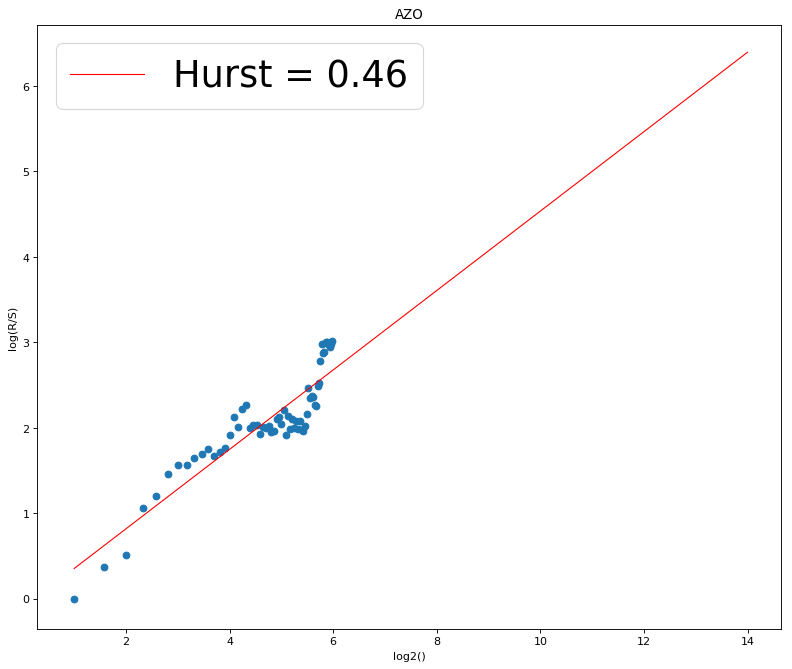

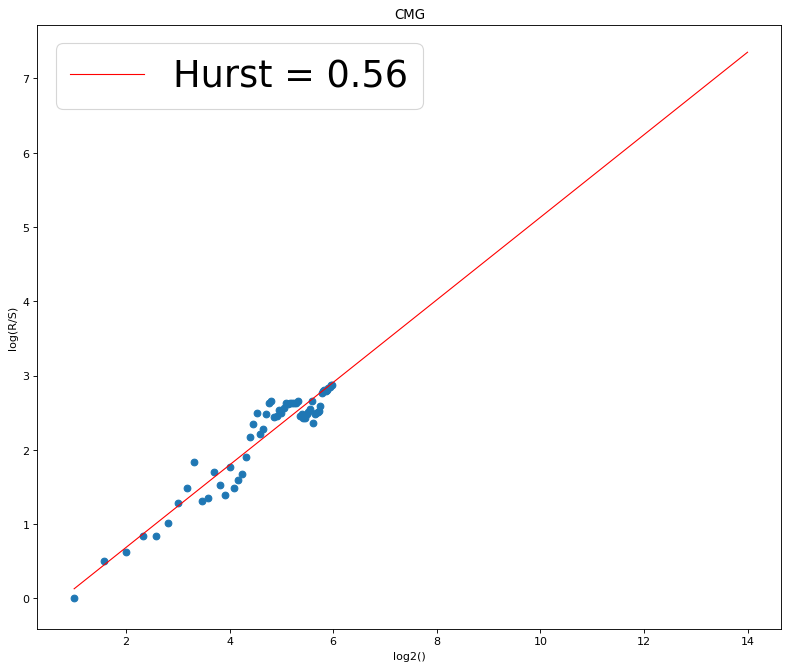

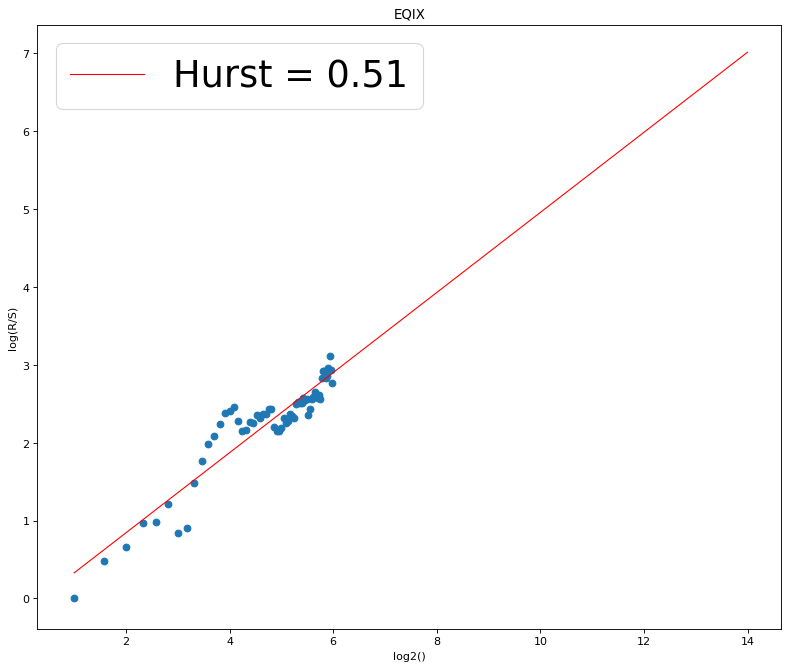

[567, 630]


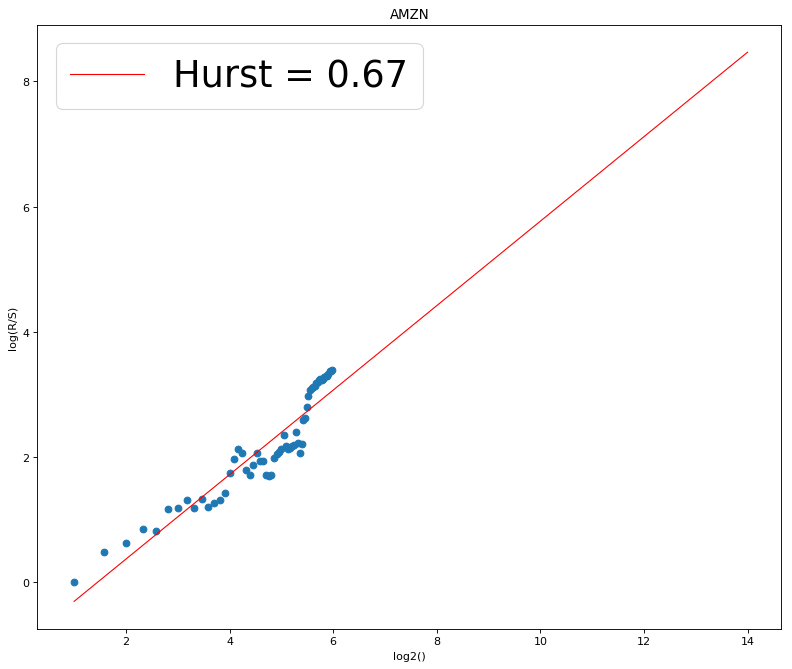

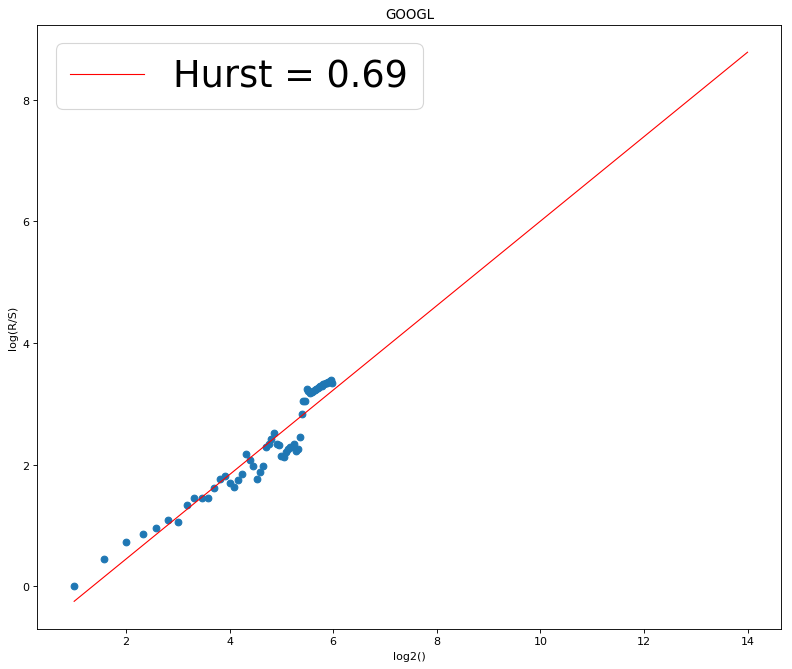

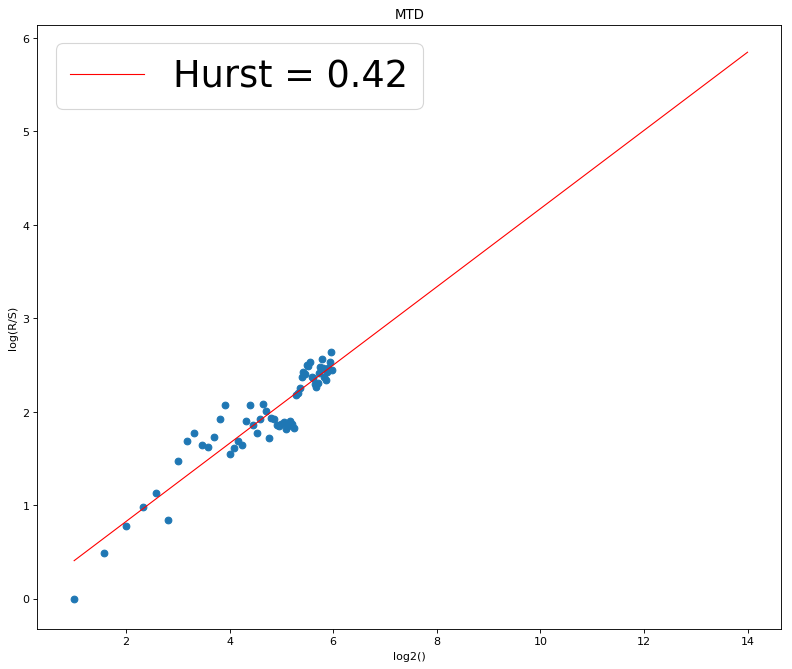

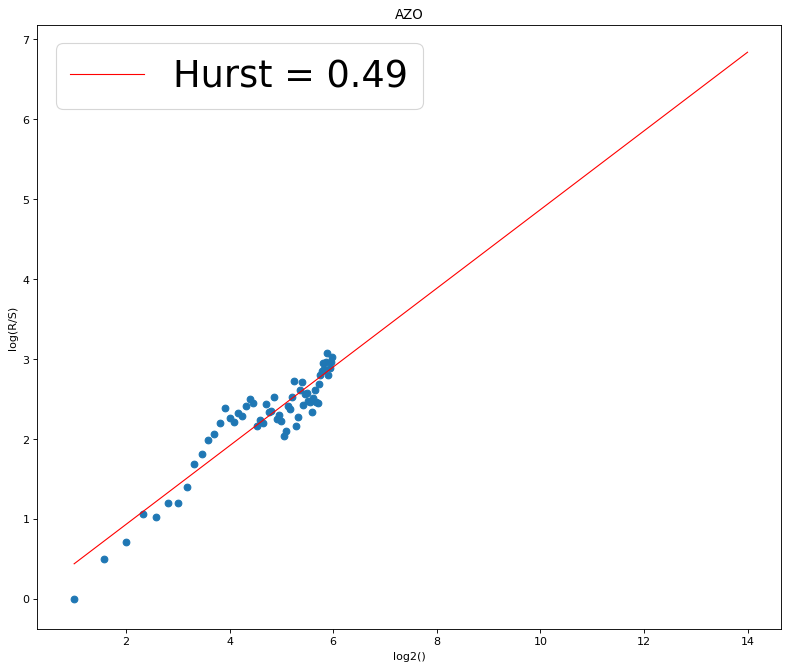

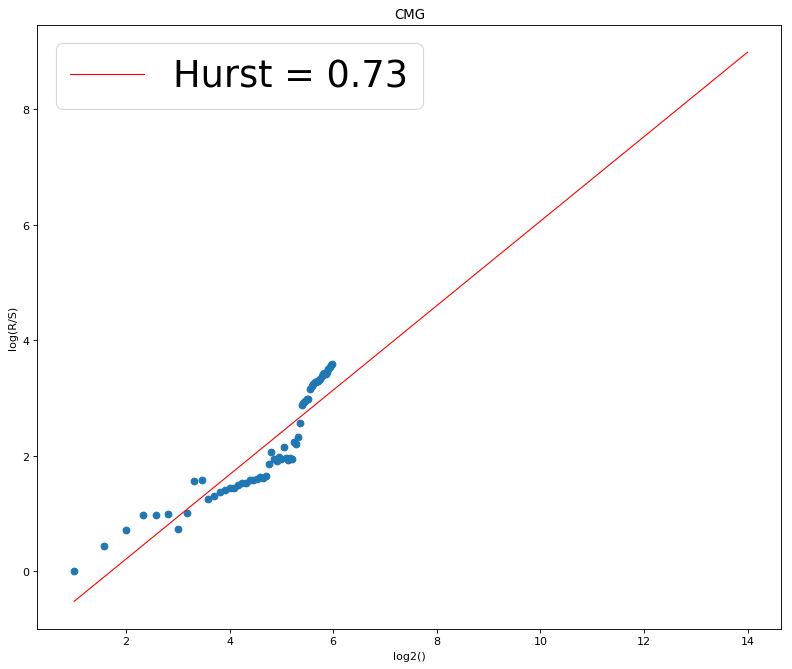

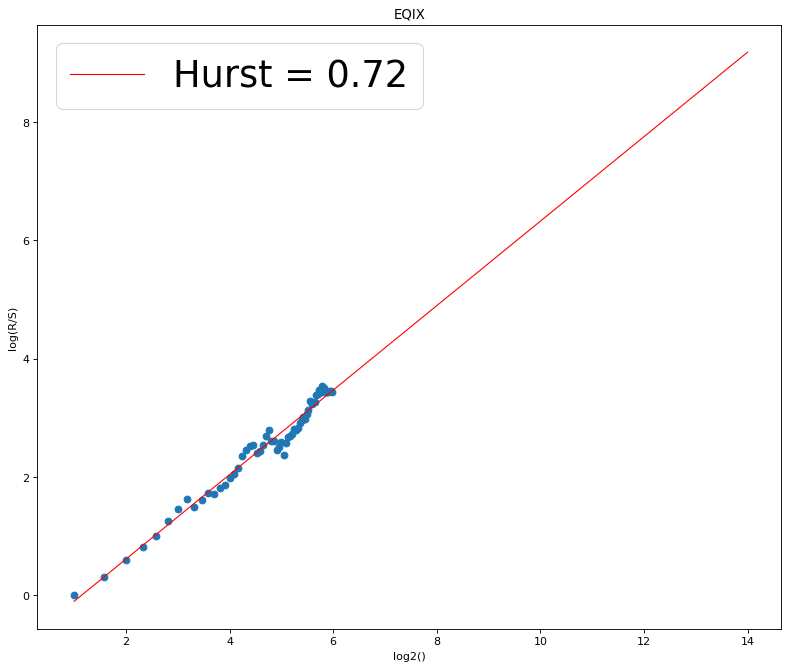

[630, 693]


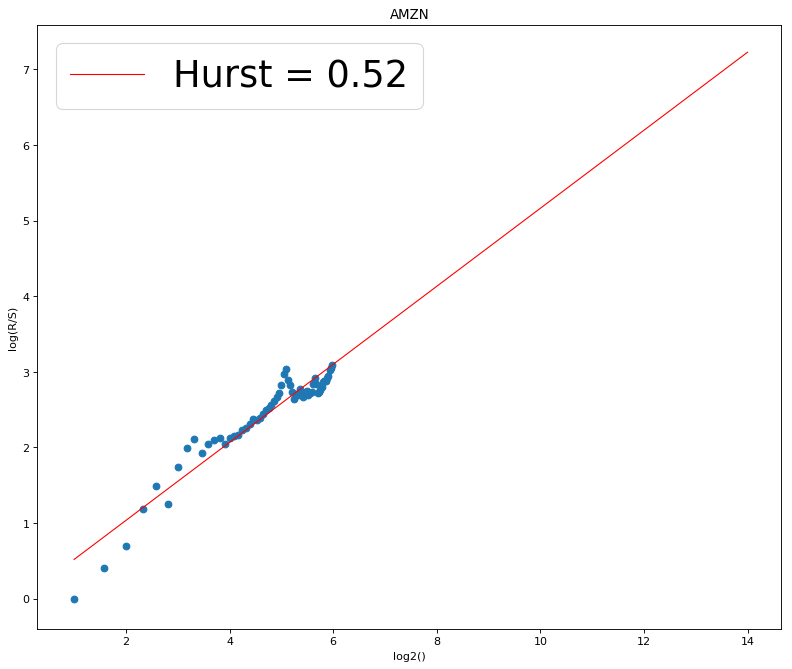

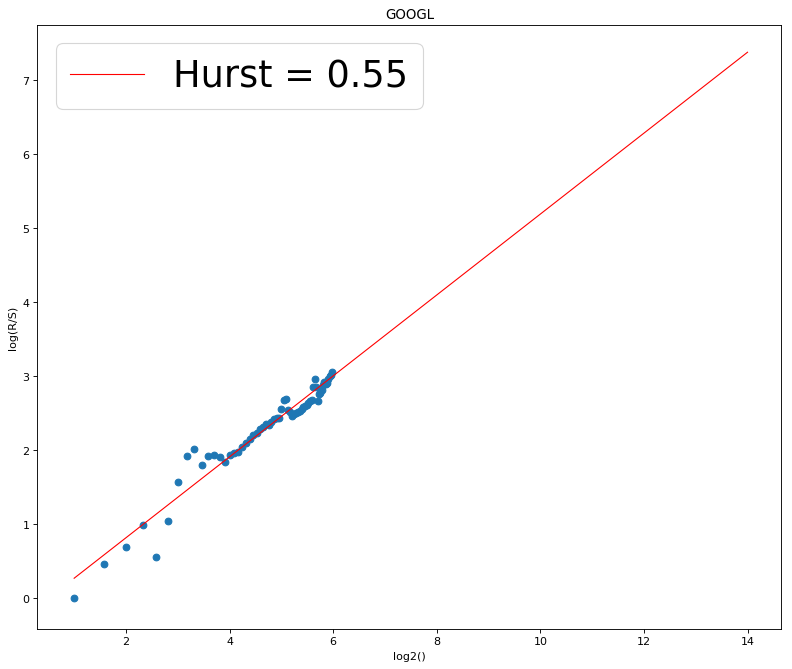

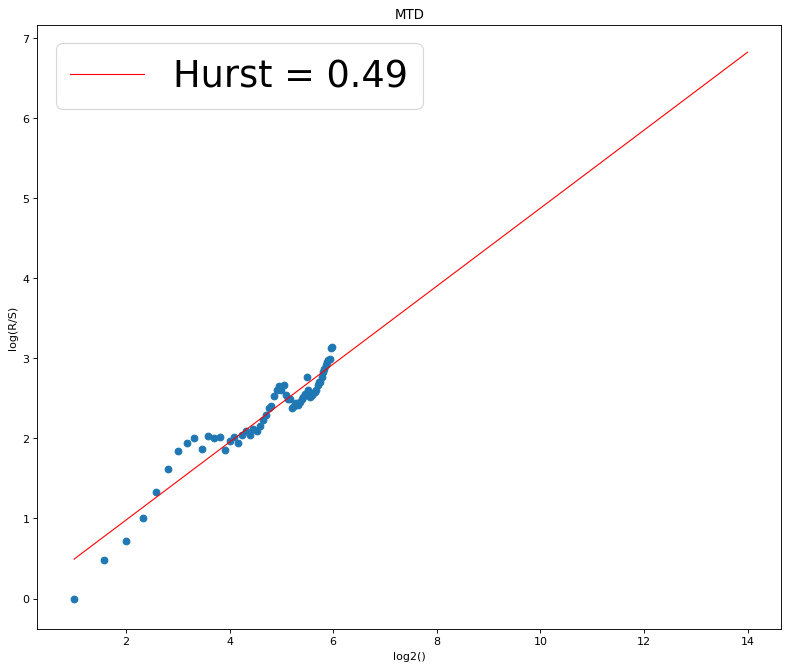

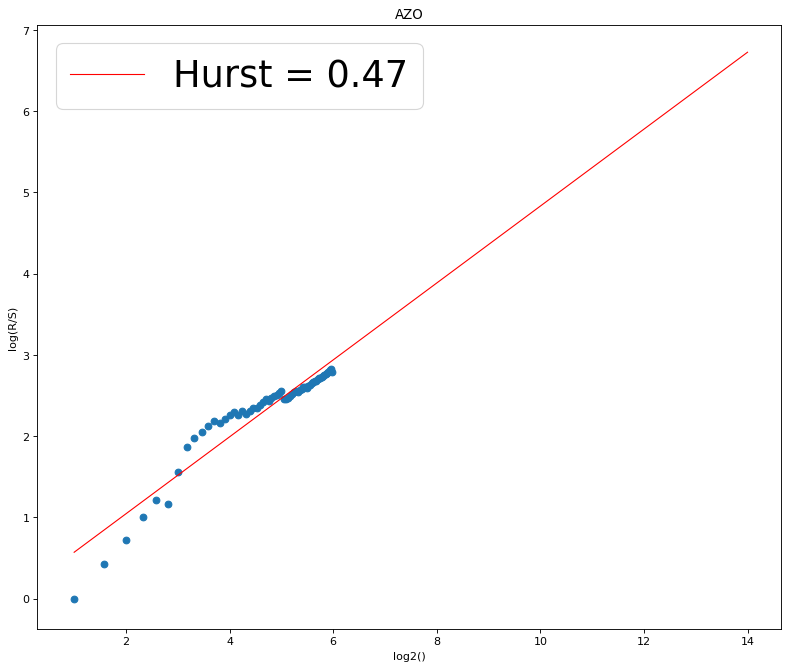

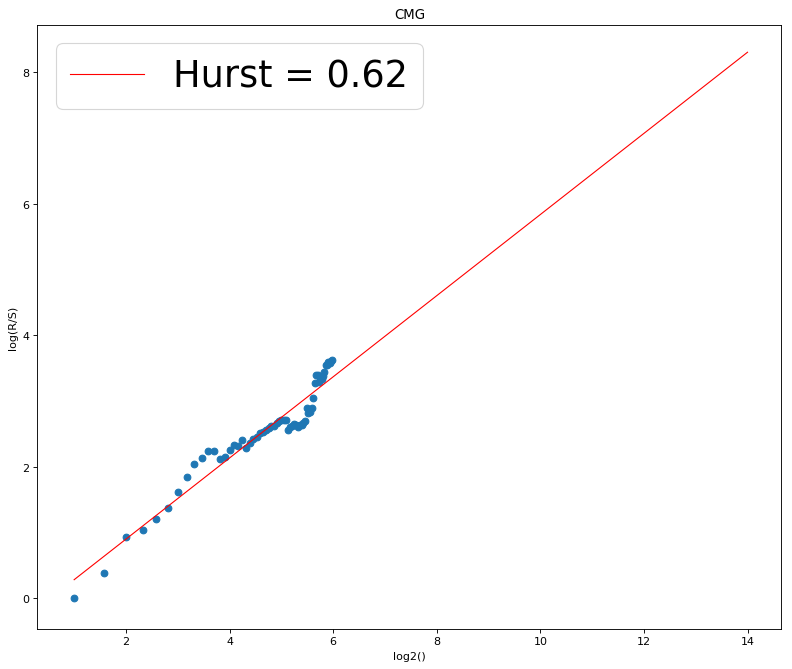

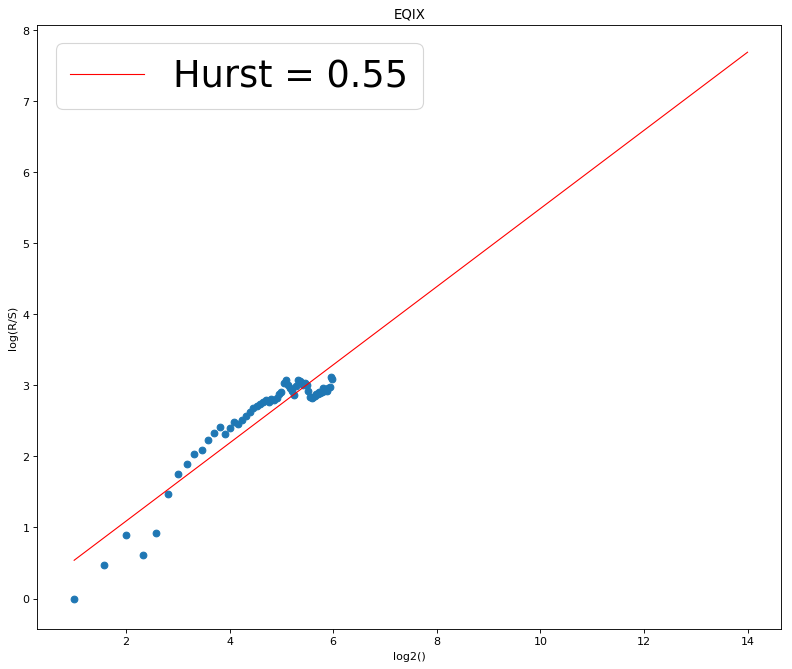

[693, 756]


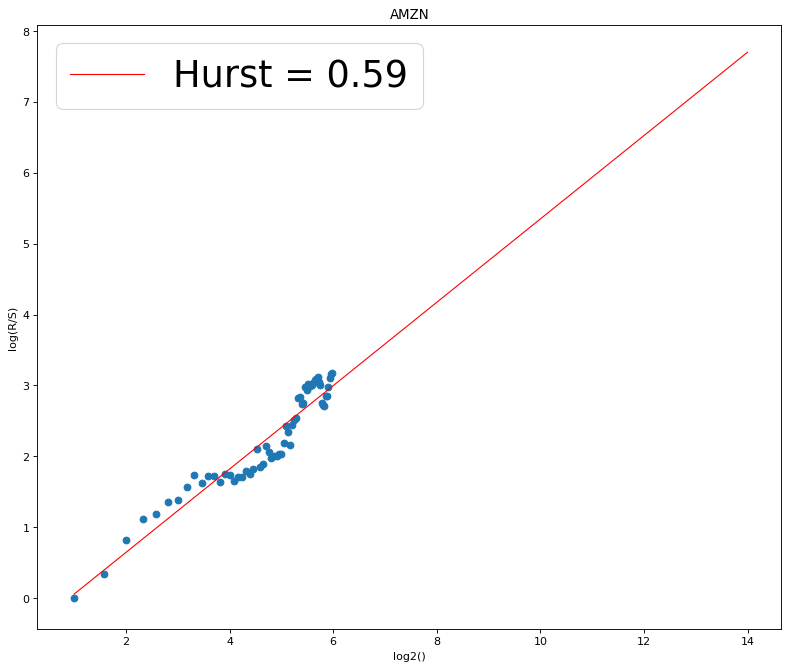

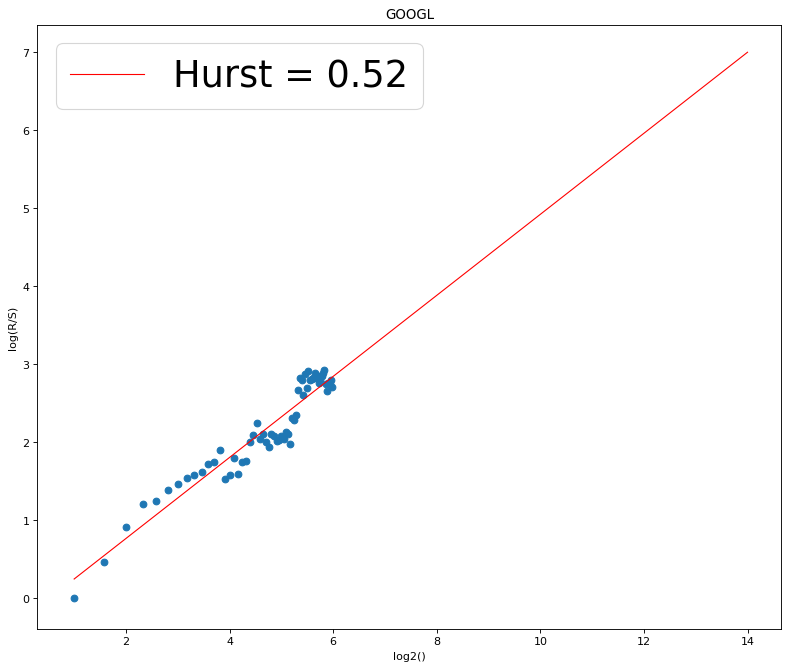

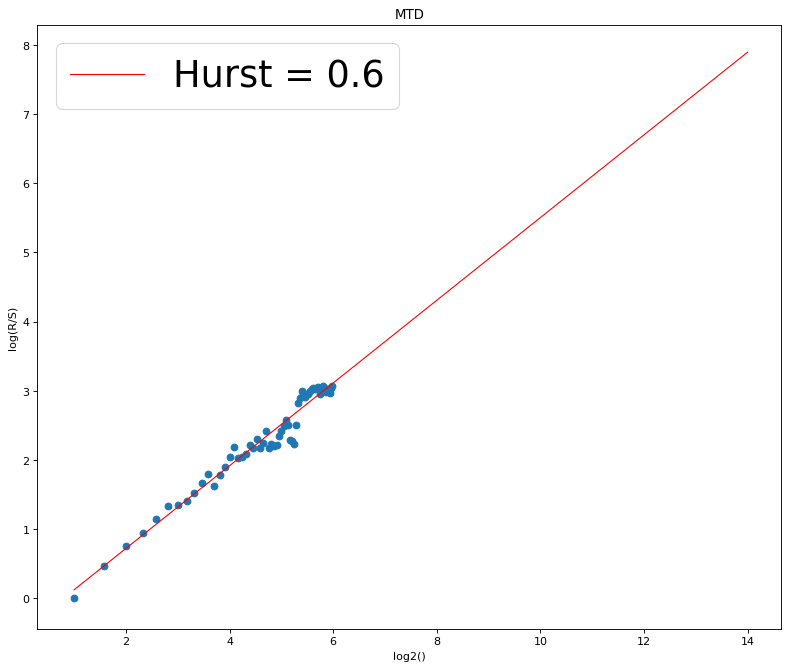

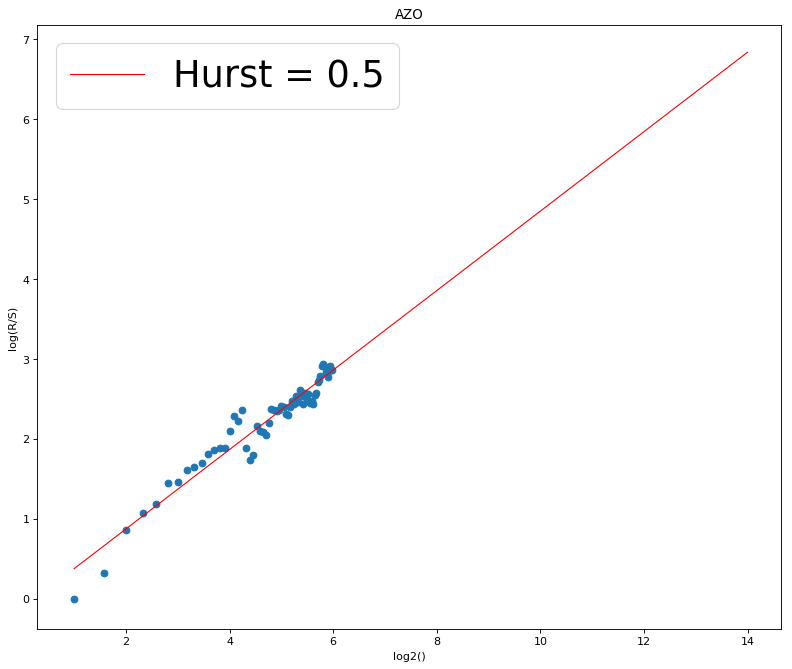

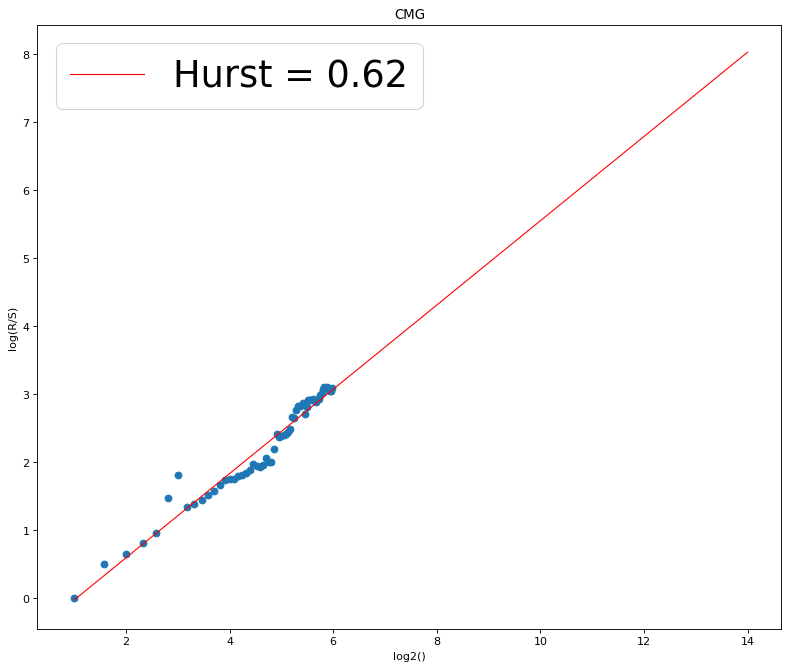

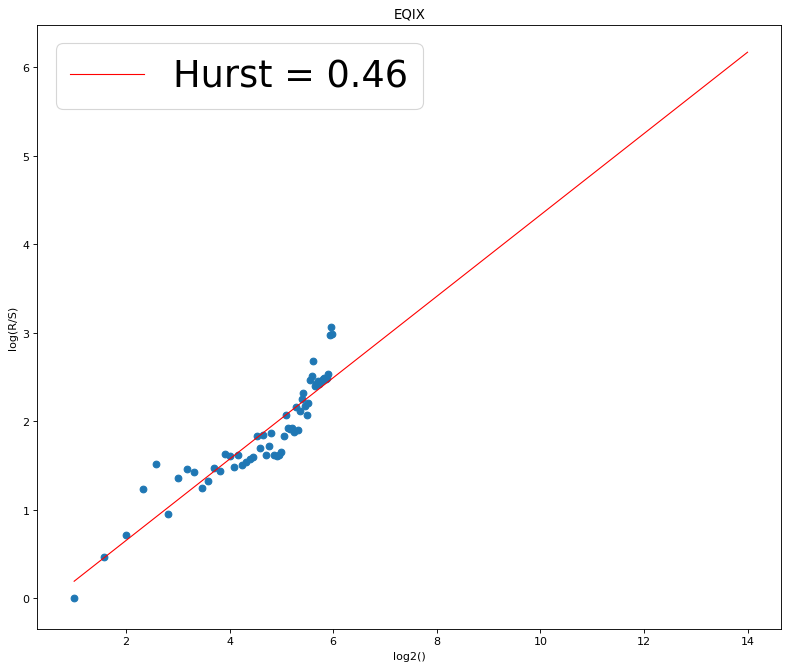

[756, 819]


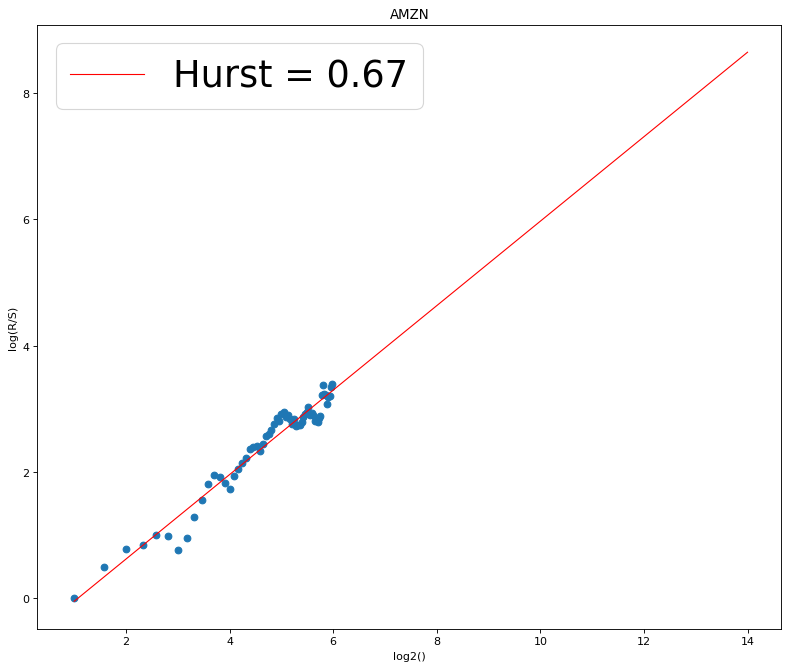

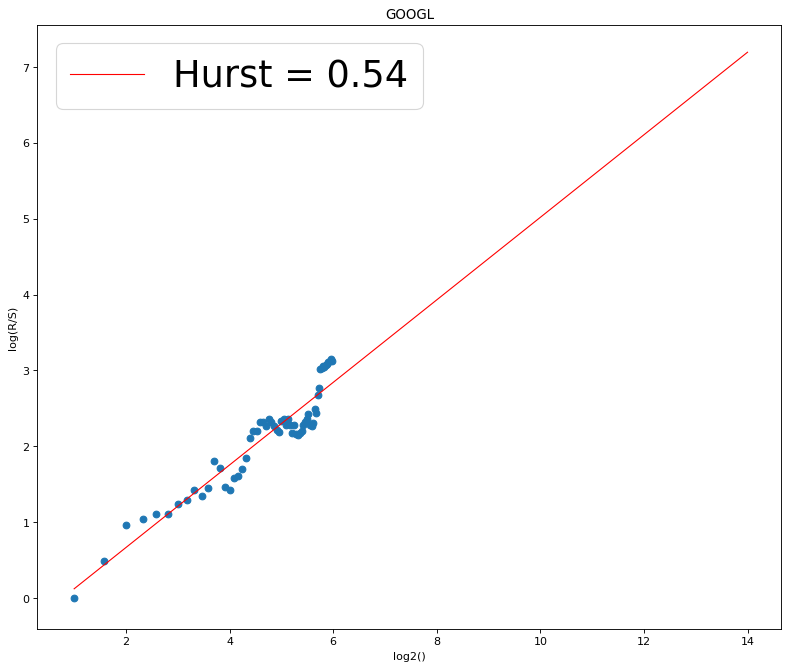

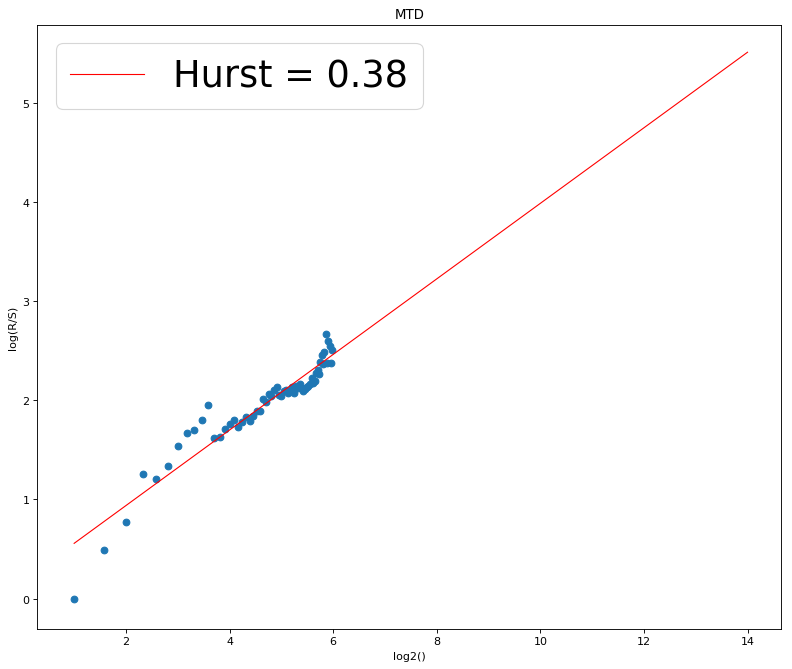

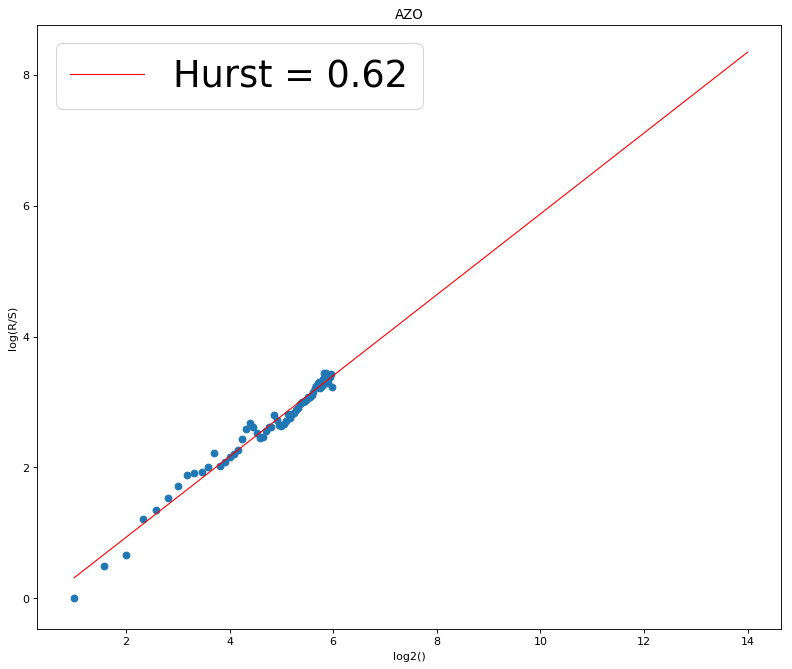

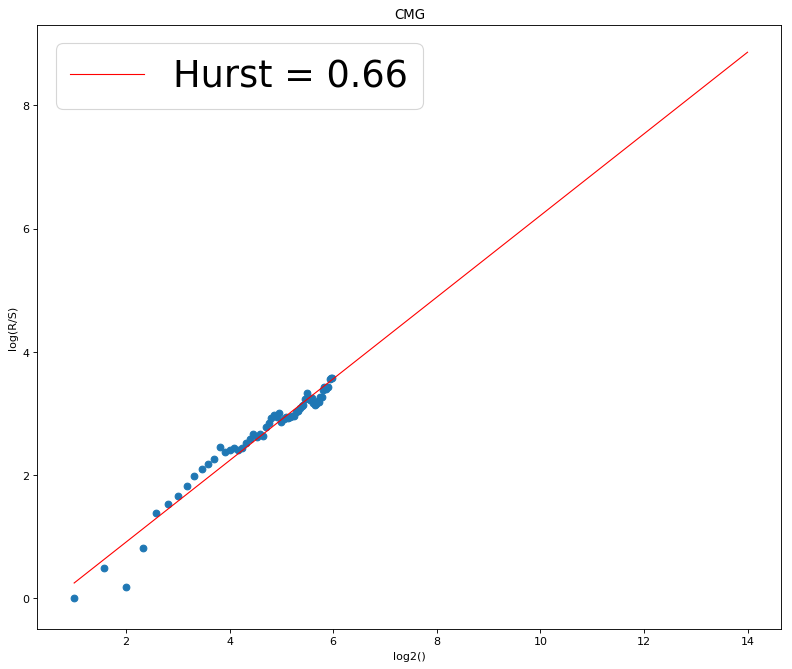

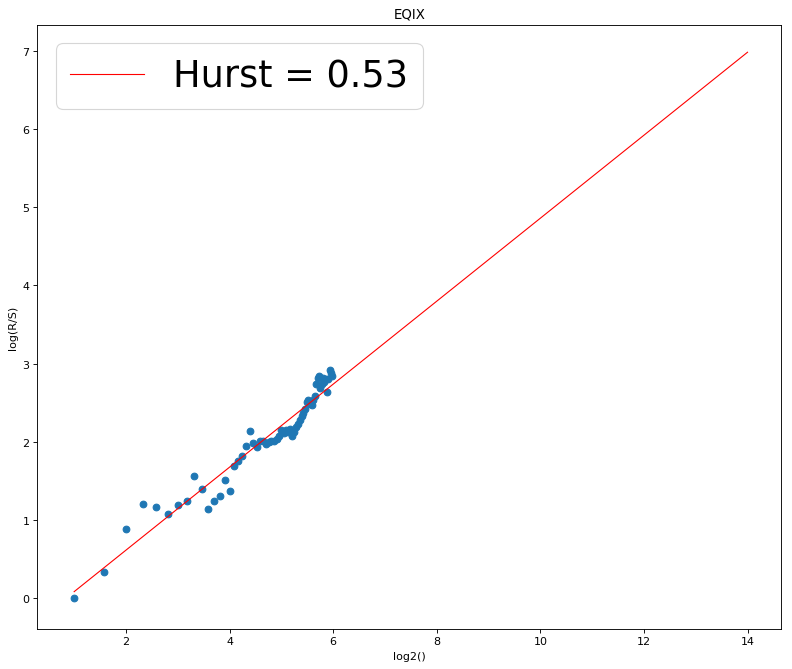

[819, 882]


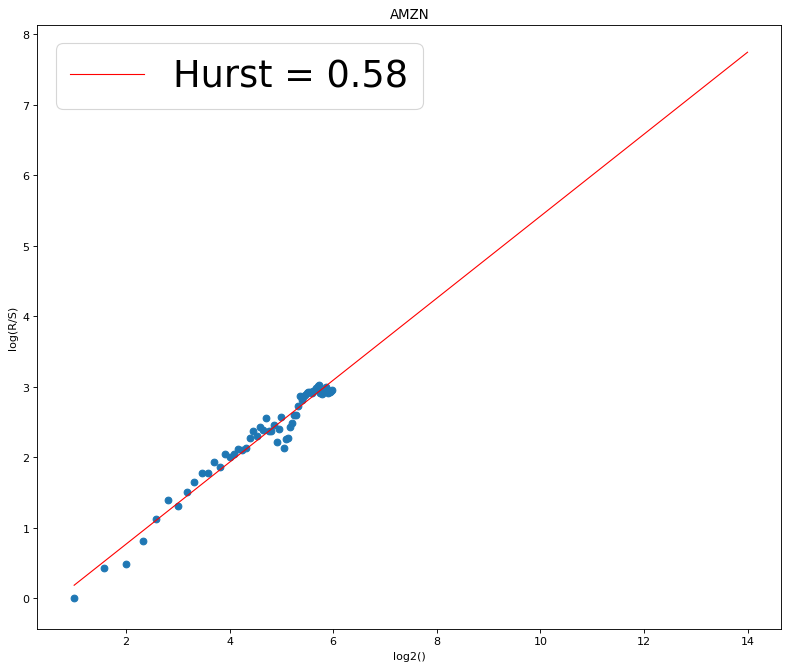

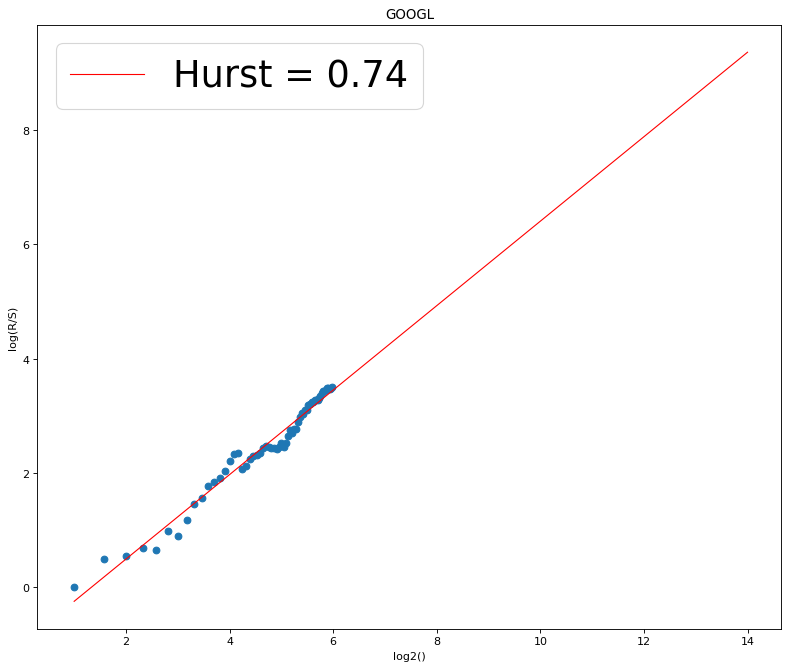

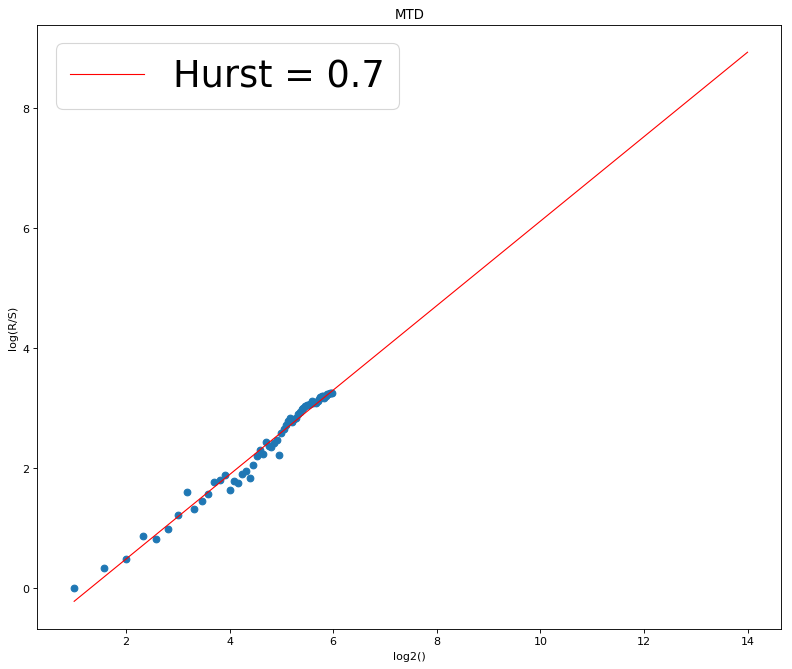

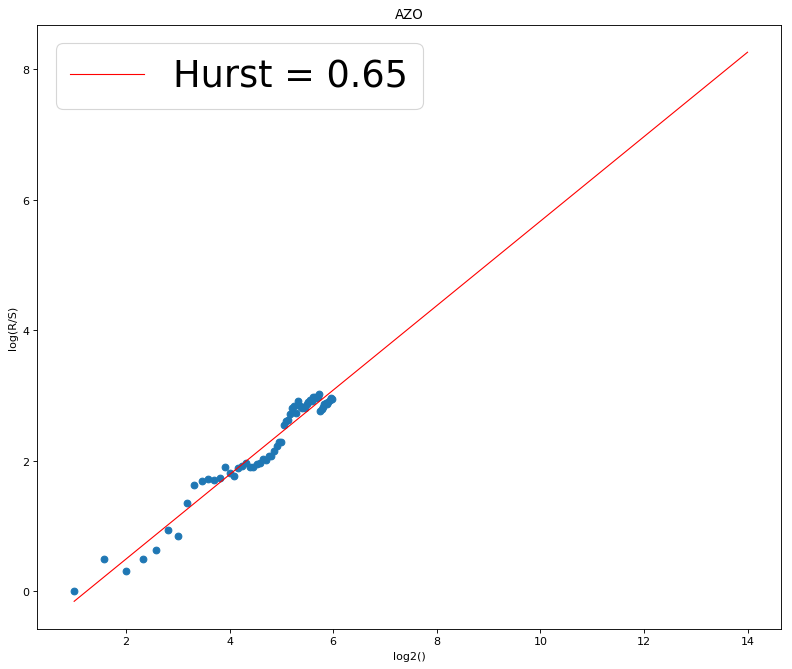

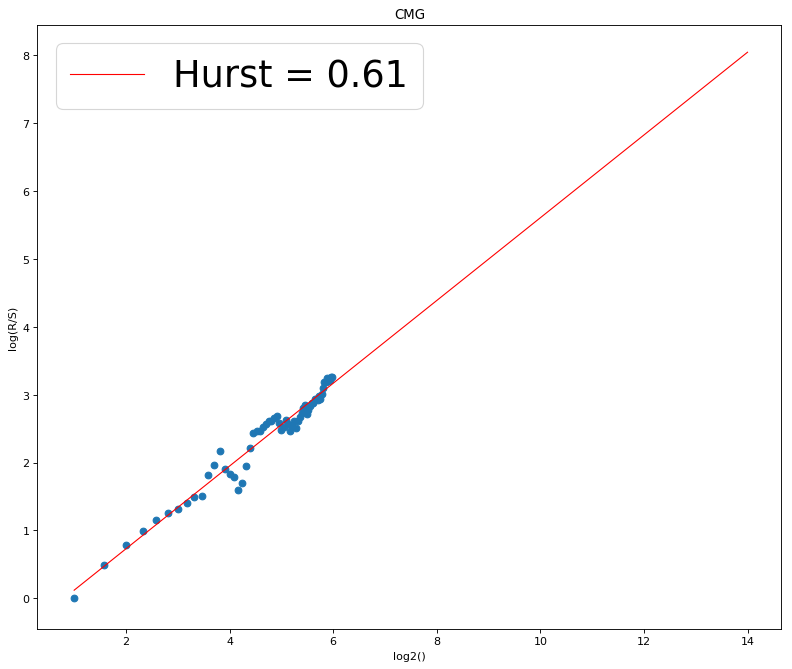

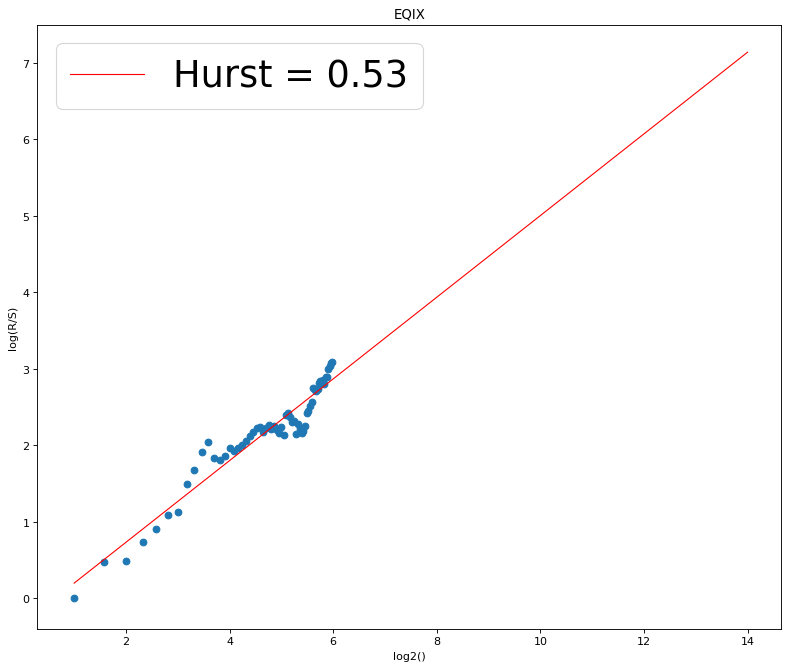

[882, 945]


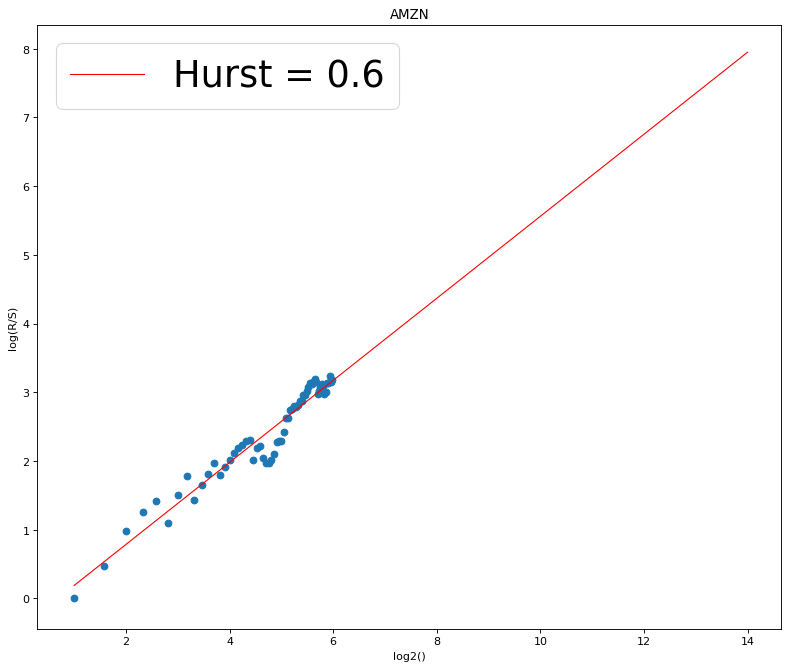

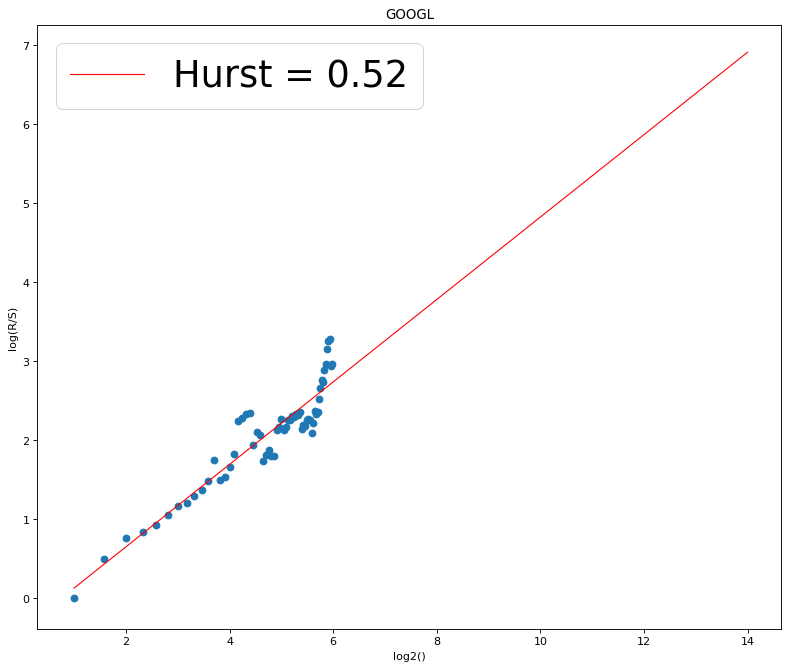

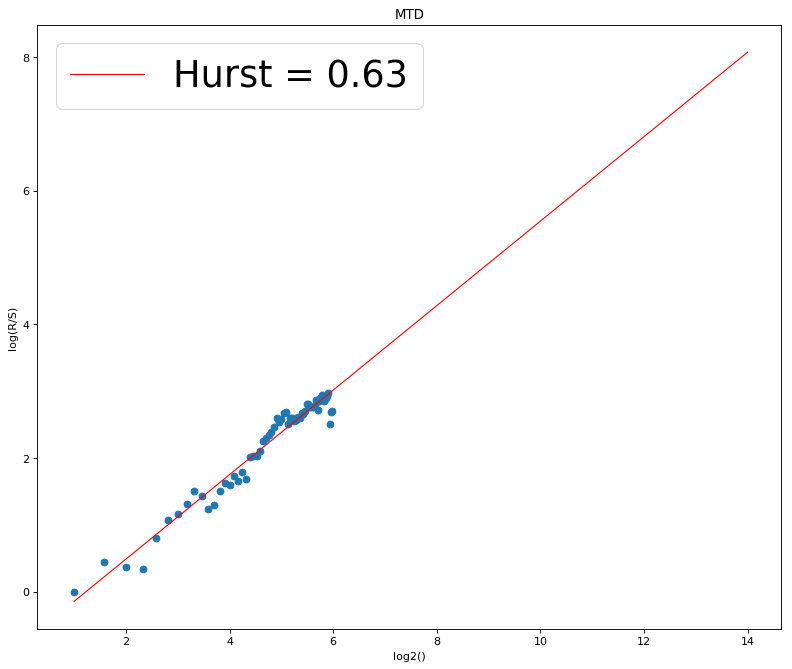

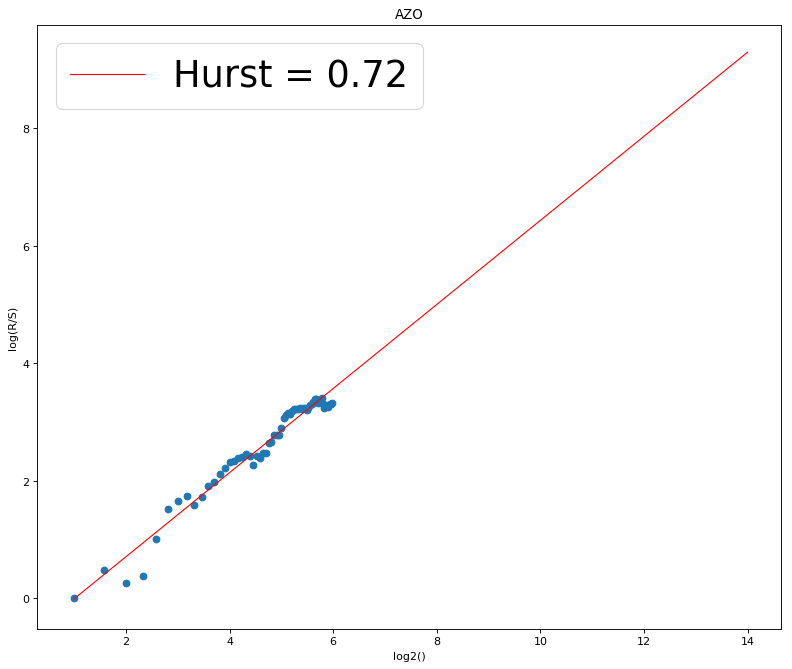

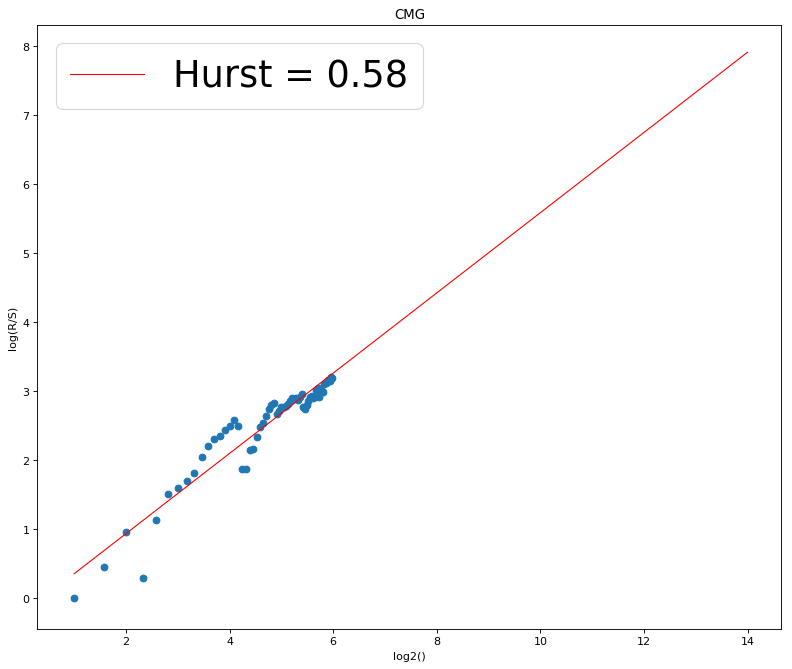

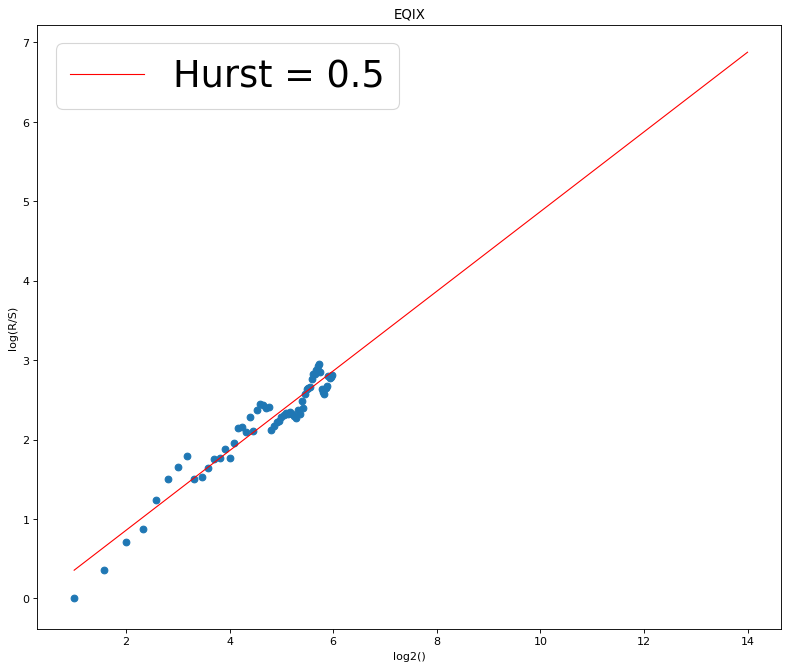

[945, 1008]


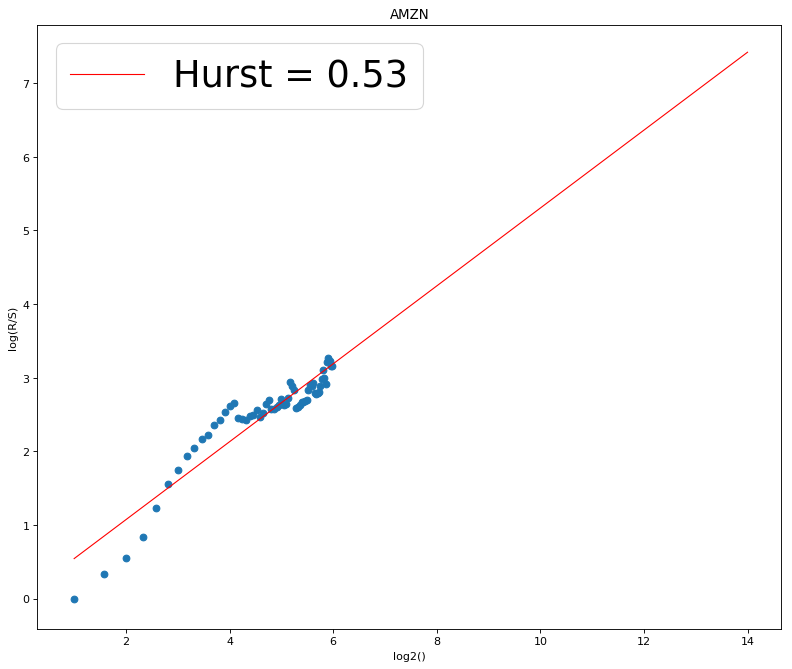

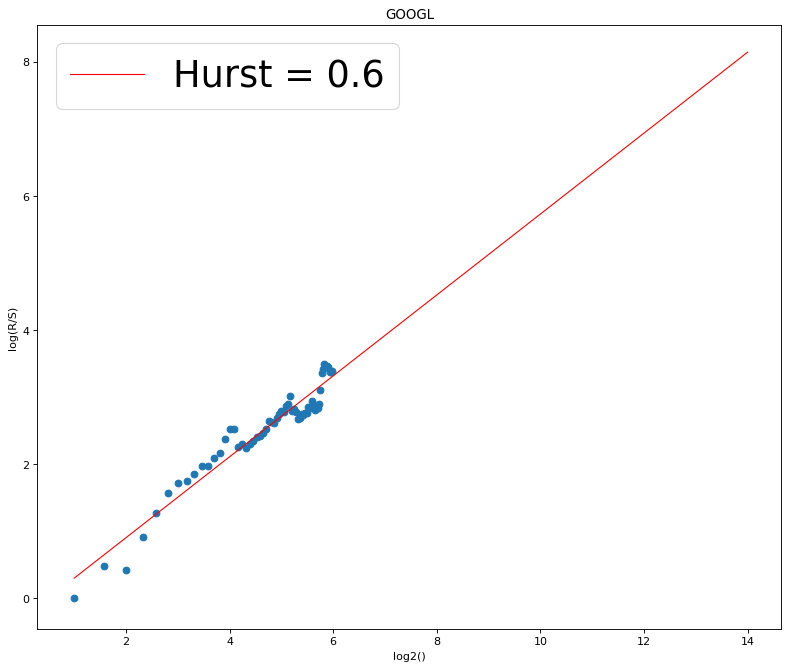

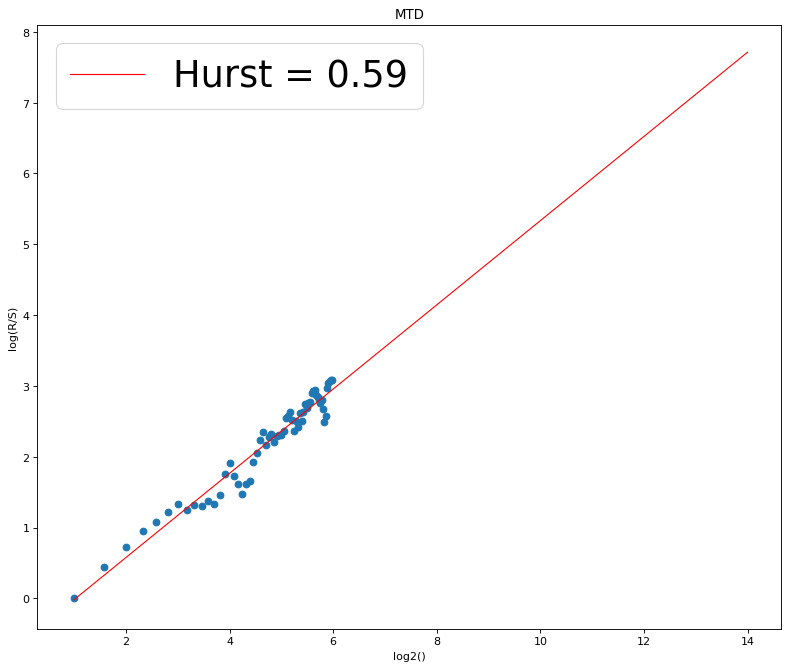

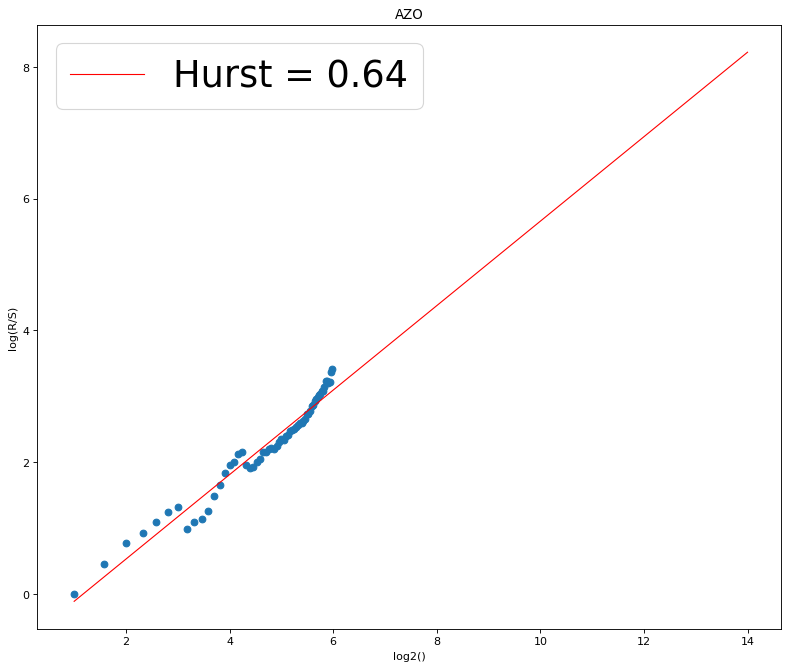

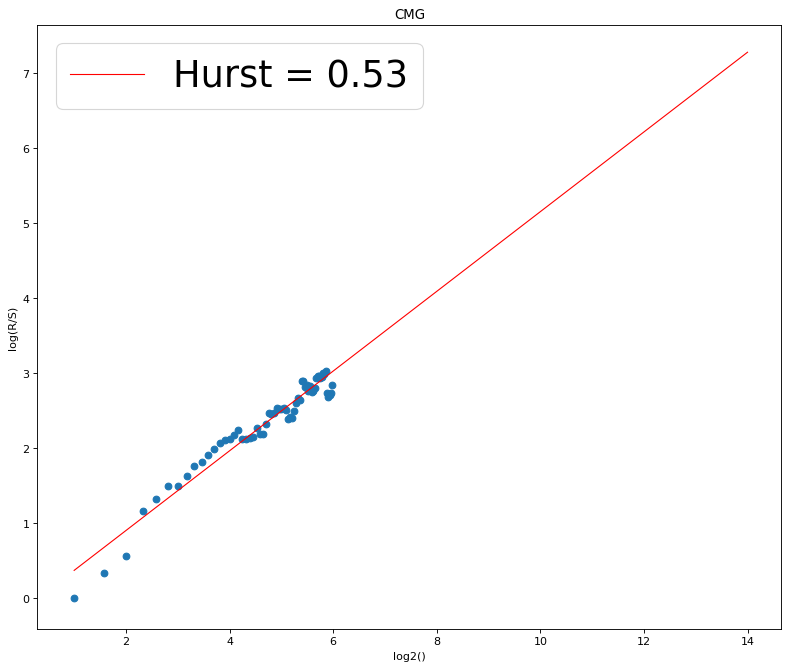

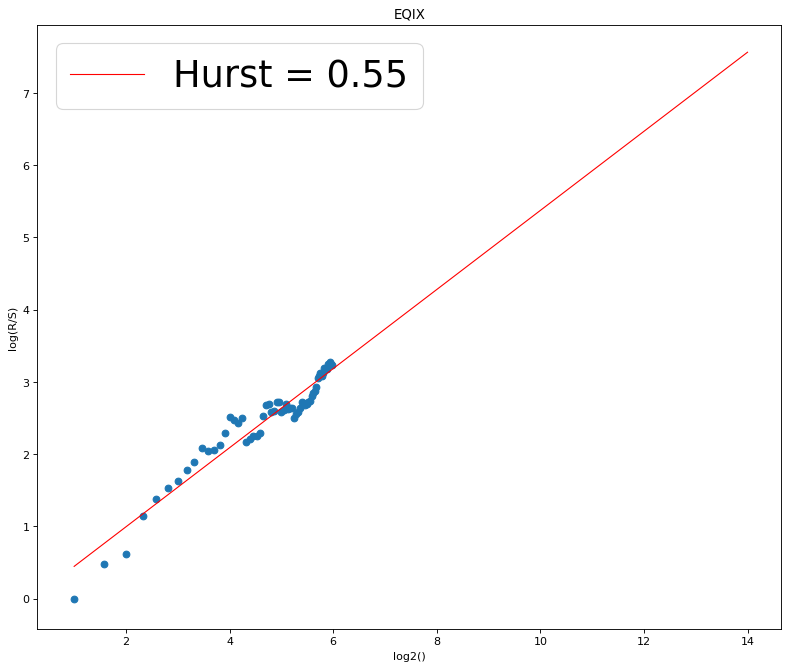

[1008, 1071]


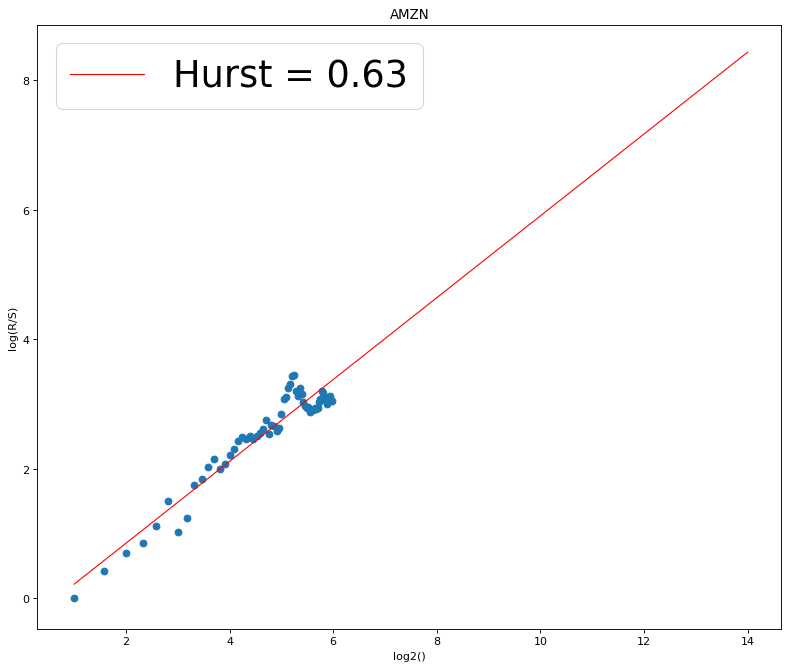

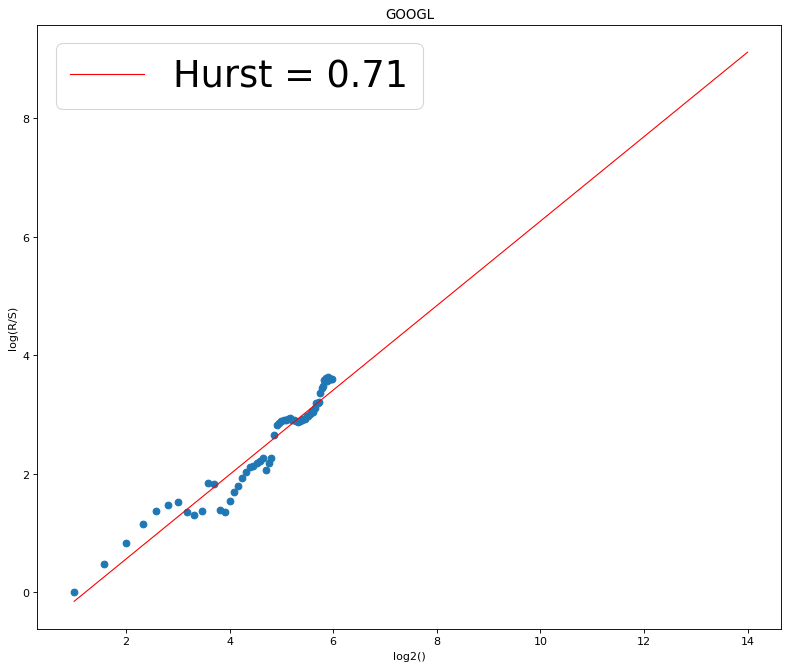

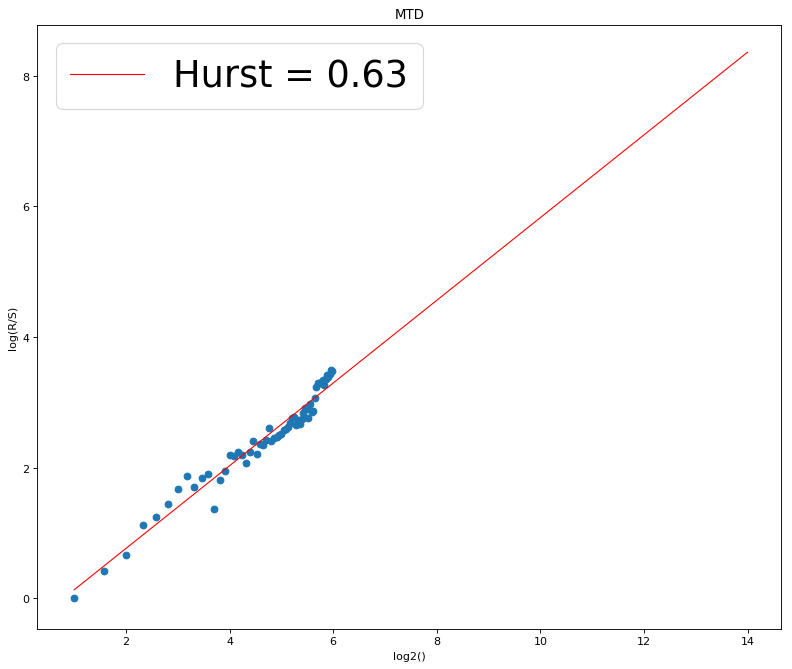

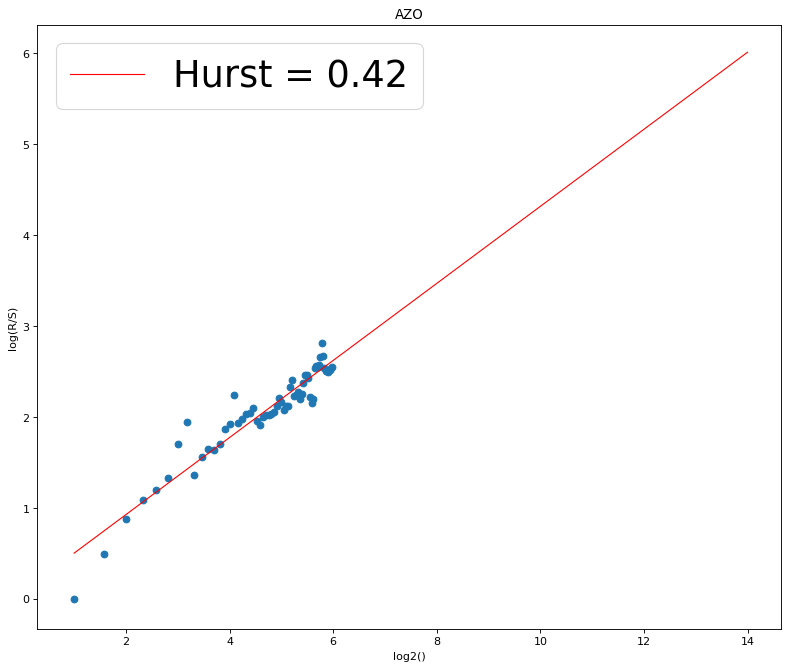

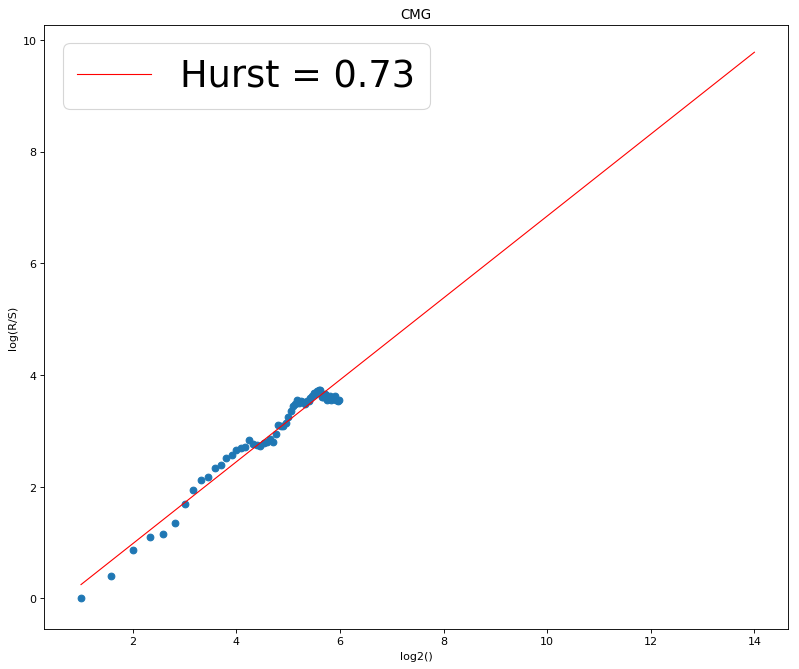

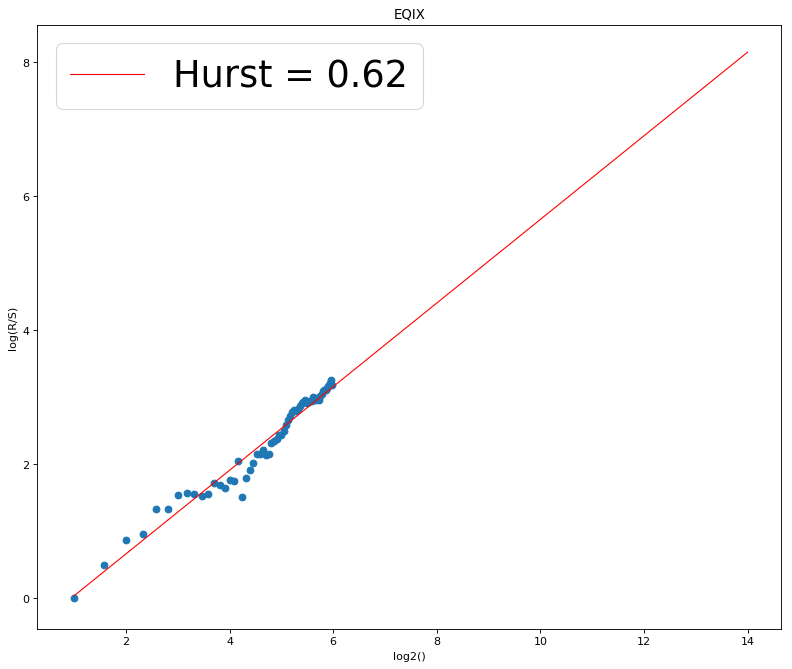

[1071, 1134]


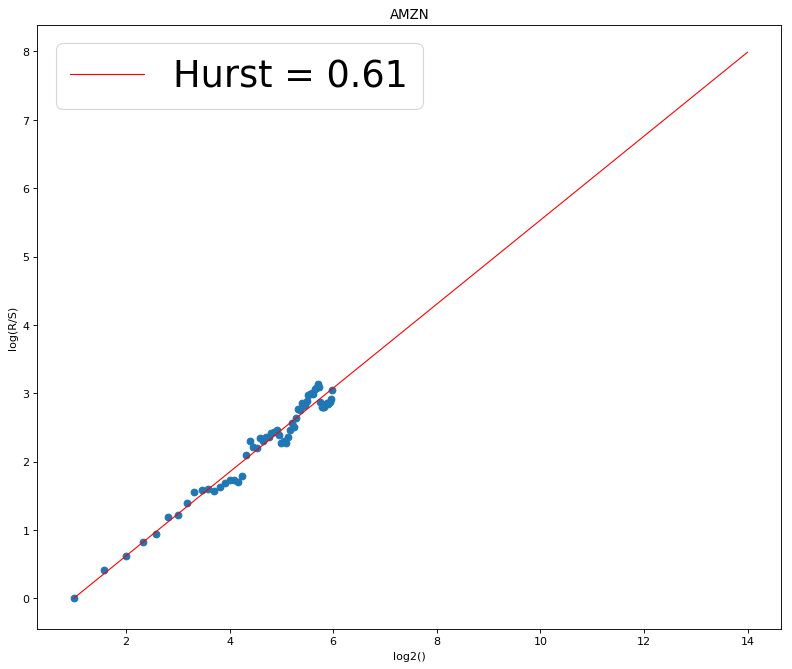

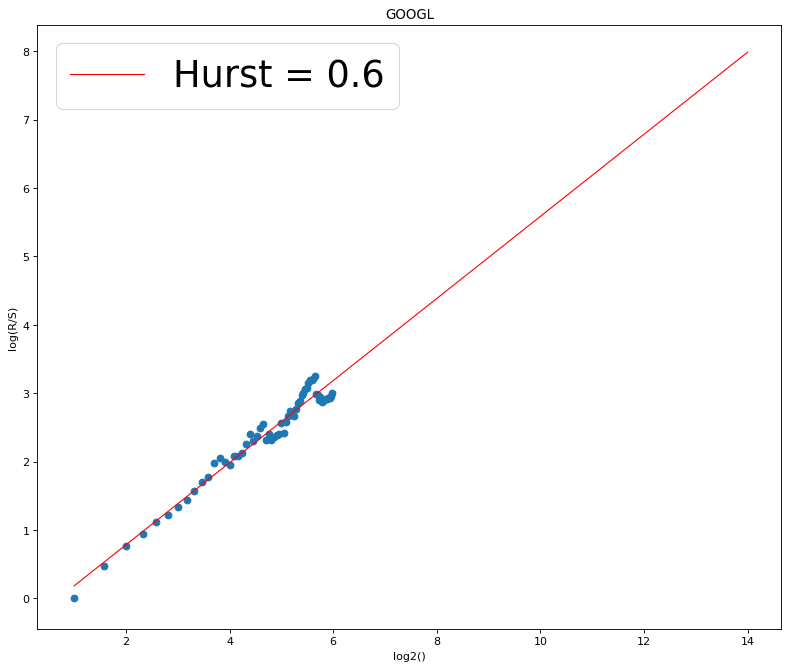

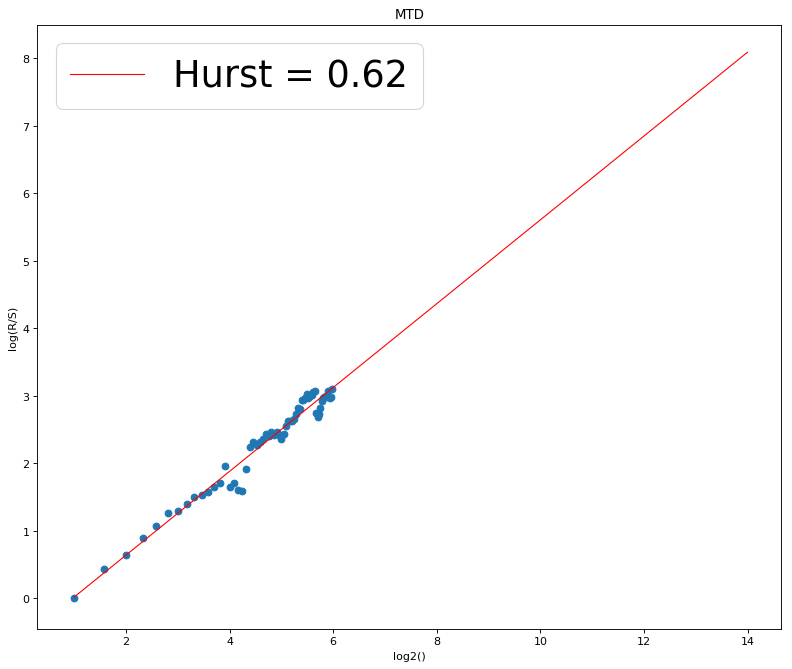

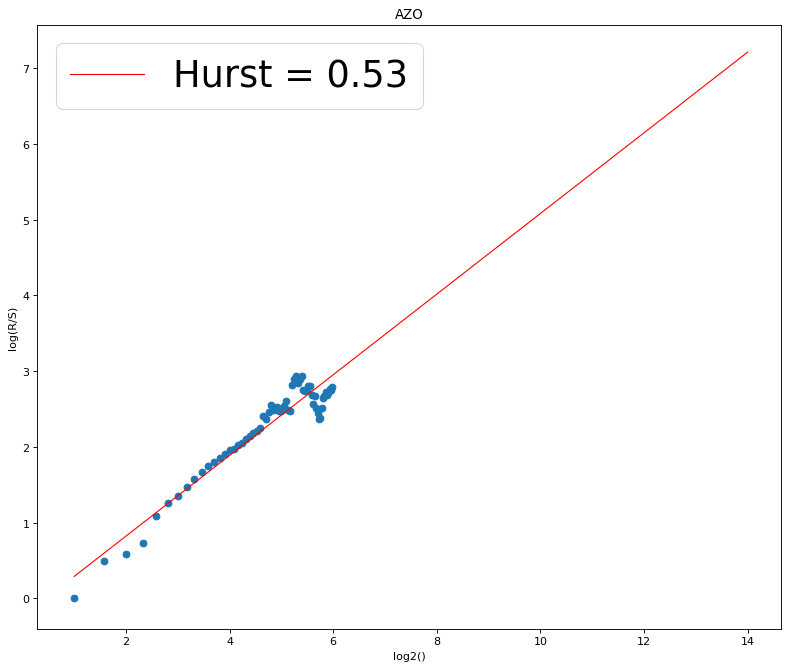

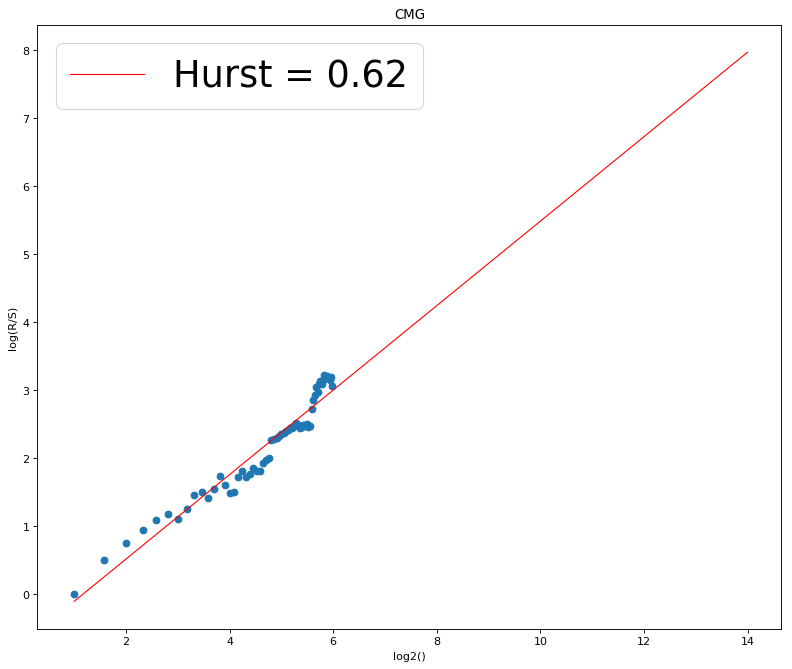

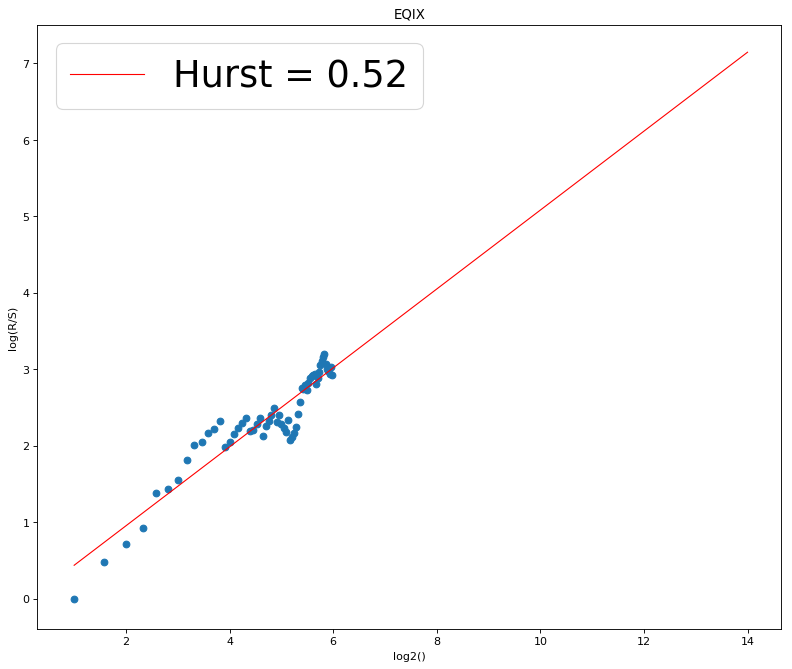

[1134, 1197]


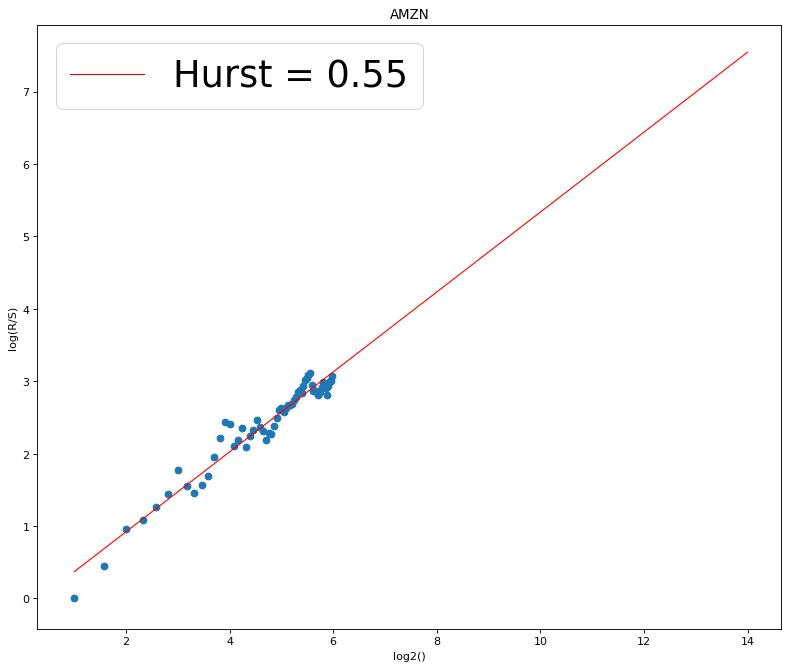

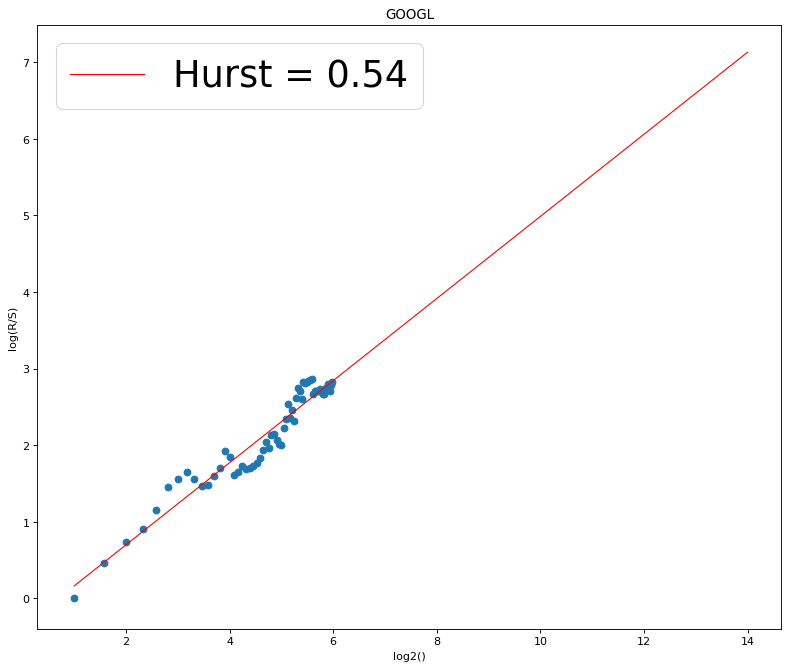

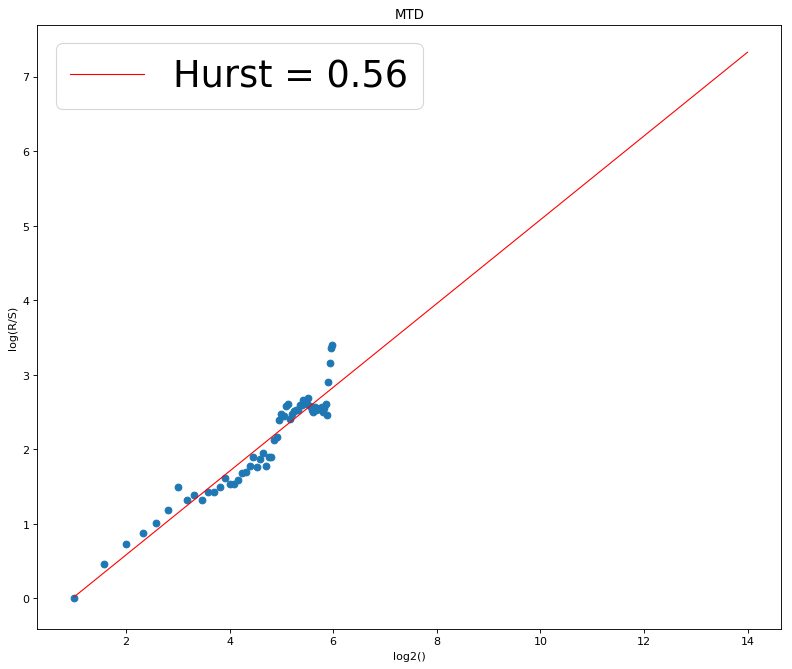

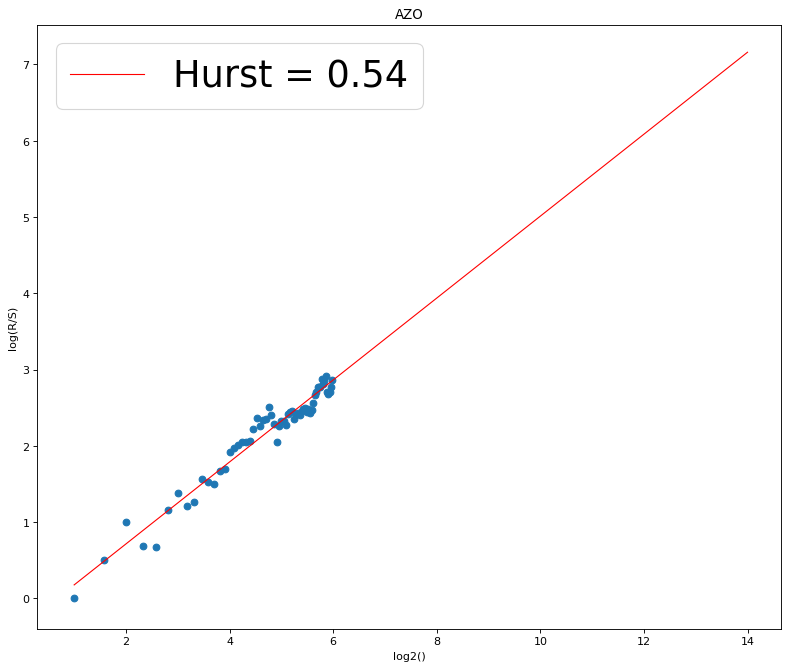

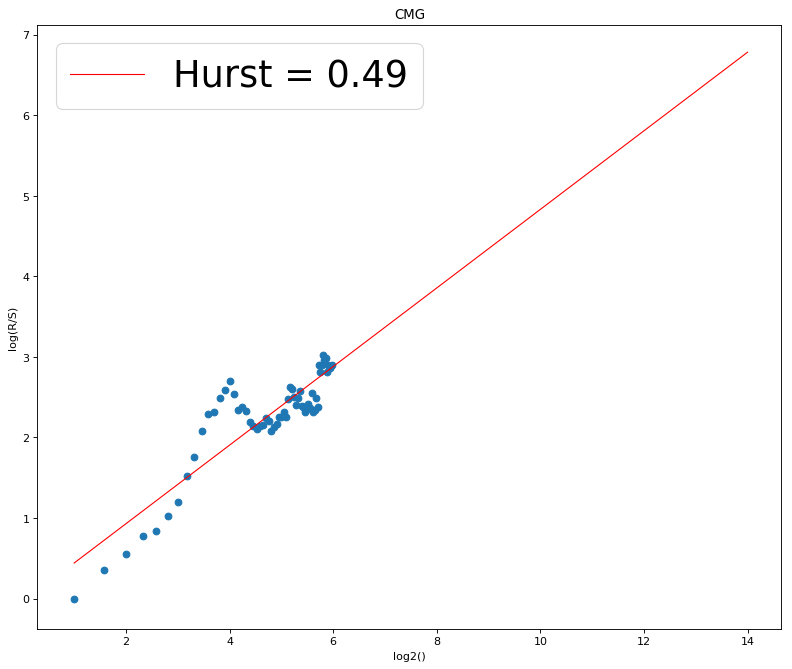

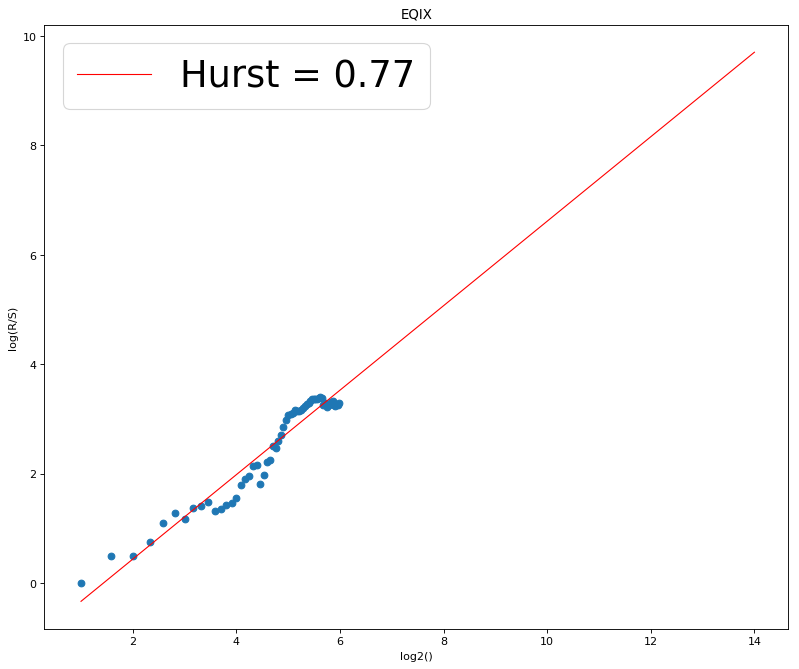

[1197, 1260]


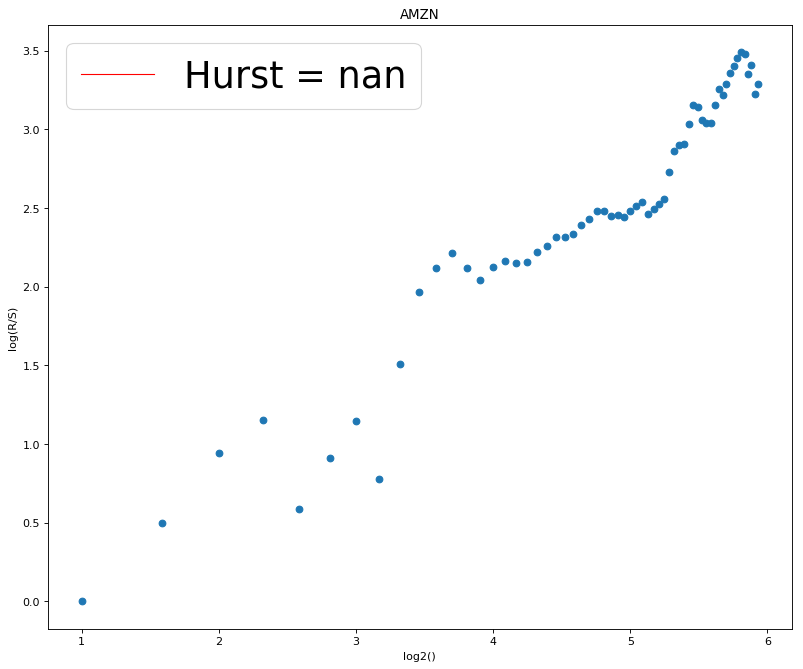

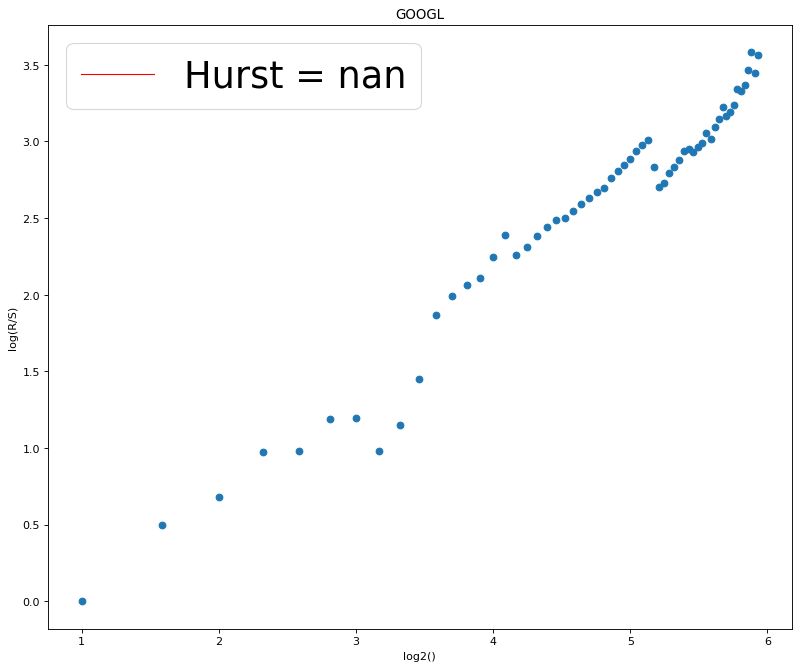

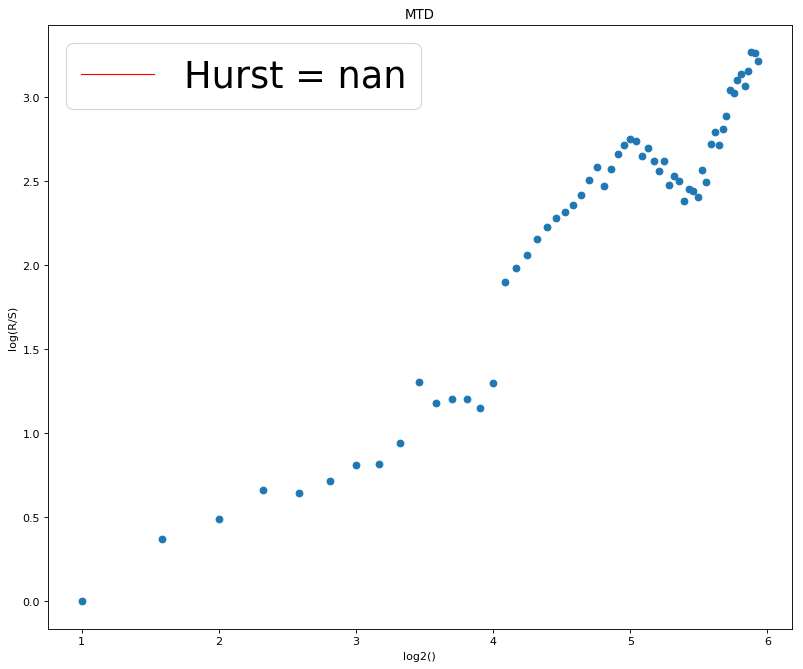

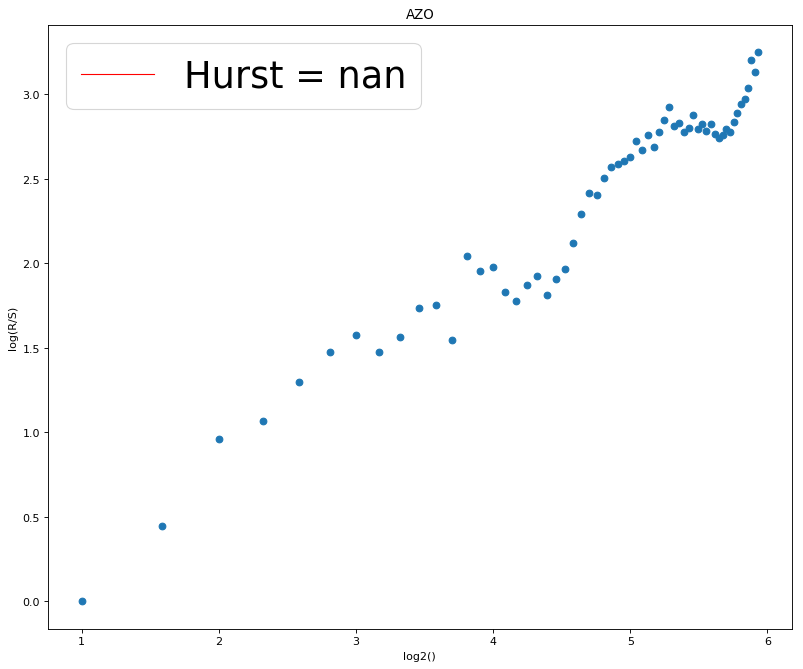

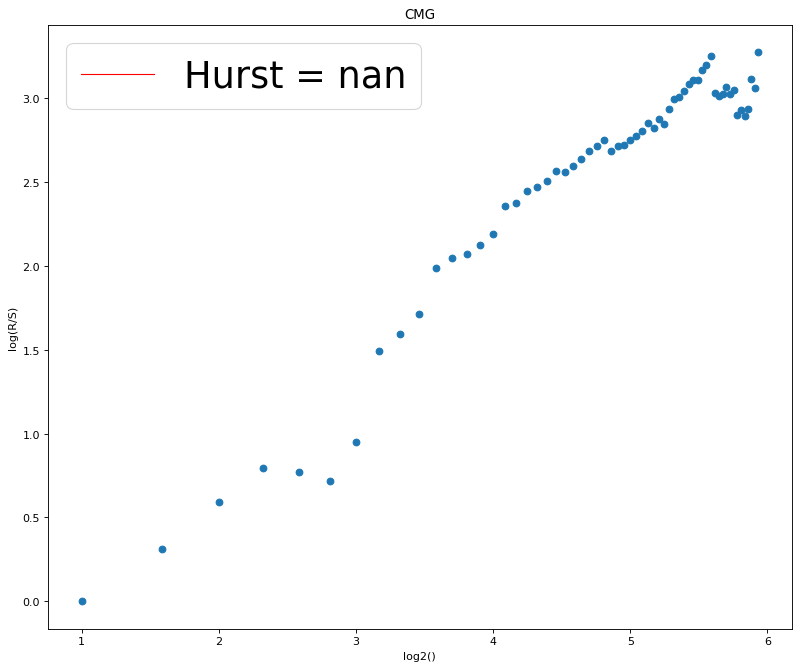

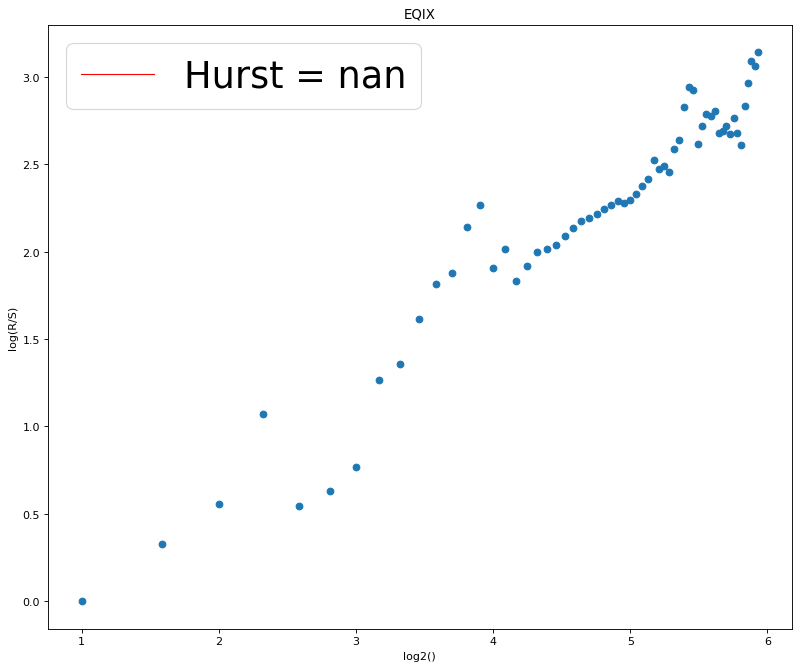

In [140]:
corte = 0.7
datadata2 = log_retorno_ris_usa.shift(-1)
df_final4 = pd.DataFrame()
df_dinicial4 = pd.DataFrame()
df_dfinal4 = pd.DataFrame()
df_hurst2 = pd.DataFrame()
a = 0
for i in range(63,1261,63):
    print([a,i])
    for name in ['AMZN', 'GOOGL', 'MTD', 'AZO', 'CMG', 'EQIX']:
        agua2 = pd.DataFrame([Hurst(datadata2[name].iloc[a:i], name)], columns=[name], index= [a])
        df_hurst2 = df_hurst2.append(agua2)
    a = i

In [141]:
df_hurst2

,AMZN,AZO,CMG,EQIX,GOOGL,MTD
0,0.504654,NaN,NaN,NaN,NaN,NaN
0,NaN,NaN,NaN,NaN,0.689944,NaN
0,NaN,NaN,NaN,NaN,NaN,0.595221
0,NaN,0.503765,NaN,NaN,NaN,NaN
0,NaN,NaN,0.464060,NaN,NaN,NaN
0,NaN,NaN,NaN,0.437427,NaN,NaN
63,0.606144,NaN,NaN,NaN,NaN,NaN
63,NaN,NaN,NaN,NaN,0.540444,NaN
63,NaN,NaN,NaN,NaN,NaN,0.659252
63,NaN,0.465016,NaN,NaN,NaN,NaN


In [142]:
df_hurst2 = df_hurst2.groupby(df_hurst2.index).first().reset_index()
df_hurst2

,index,AMZN,AZO,CMG,EQIX,GOOGL,MTD
0,0,0.504654,0.503765,0.464060,0.437427,0.689944,0.595221
1,63,0.606144,0.465016,0.556960,0.659739,0.540444,0.659252
2,126,0.591177,0.469968,0.600312,0.637527,0.570556,0.589263
3,189,0.633991,0.551065,0.587621,0.380535,0.424991,0.528514
4,252,0.714569,0.481215,0.676628,0.623761,0.588763,0.471165
5,315,0.522729,0.448752,0.600123,0.486525,0.459546,0.413680
6,378,0.562362,0.683235,0.582914,0.582584,0.673962,0.717707
7,441,0.754127,0.625238,0.568470,0.506952,0.593110,0.638518
8,504,0.559772,0.464921,0.555688,0.514214,0.544398,0.651170
9,567,0.674723,0.492395,0.731210,0.715211,0.694516,0.418683


In [146]:
df_teste2 = df_hurst2.copy() #[df_hurst > 0.6] 
df_teste2 = df_teste2.set_index('index')
df_teste2

,AMZN,AZO,CMG,EQIX,GOOGL,MTD
index,,,,,,
0,0.504654,0.503765,0.464060,0.437427,0.689944,0.595221
63,0.606144,0.465016,0.556960,0.659739,0.540444,0.659252
126,0.591177,0.469968,0.600312,0.637527,0.570556,0.589263
189,0.633991,0.551065,0.587621,0.380535,0.424991,0.528514
252,0.714569,0.481215,0.676628,0.623761,0.588763,0.471165
315,0.522729,0.448752,0.600123,0.486525,0.459546,0.413680
378,0.562362,0.683235,0.582914,0.582584,0.673962,0.717707
441,0.754127,0.625238,0.568470,0.506952,0.593110,0.638518
504,0.559772,0.464921,0.555688,0.514214,0.544398,0.651170


In [147]:
df_teste2[df_teste2 >= 0.6] = 1
df_teste2[df_teste2 < 0.6] = 0
df_teste2

,AMZN,AZO,CMG,EQIX,GOOGL,MTD
index,,,,,,
0,0.0,0.0,0.0,0.0,1.0,0.0
63,1.0,0.0,0.0,1.0,0.0,1.0
126,0.0,0.0,1.0,1.0,0.0,0.0
189,1.0,0.0,0.0,0.0,0.0,0.0
252,1.0,0.0,1.0,1.0,0.0,0.0
315,0.0,0.0,1.0,0.0,0.0,0.0
378,0.0,1.0,0.0,0.0,1.0,1.0
441,1.0,1.0,0.0,0.0,0.0,1.0
504,0.0,0.0,0.0,0.0,0.0,1.0


In [148]:
df_soma_ris_ret = pd.DataFrame()
v_entrada2 = log_retorno_ris_usa
for i in range(63,1261,63):
    valores2 = pd.DataFrame([v_entrada2.iloc[:i].sum().values], columns=v_entrada2.columns.values)
    df_soma_ris_ret = df_soma_ris_ret.append(valores2)
df_soma_ris_ret

,AMZN,GOOGL,MTD,AZO,CMG,EQIX
0,-0.006857,0.104038,0.010167,0.073521,0.136019,0.009783
0,0.121327,0.128051,0.032695,0.105951,0.240454,-0.192266
0,0.307283,0.264095,0.112650,0.147945,0.520315,-0.296964
0,0.320946,0.404943,0.143363,0.325592,0.538058,-0.164897
0,0.109422,0.292472,0.089228,0.328433,0.459283,-0.142132
0,0.190117,0.385463,0.162302,0.309730,0.736261,-0.043298
0,0.124366,0.338979,0.175667,0.383130,0.701963,-0.022275
0,0.346862,0.297510,0.320946,0.462894,0.703338,-0.011030
0,0.502238,0.328209,0.385046,0.564818,0.684111,0.181441
0,0.693338,0.522979,0.412659,0.608966,0.841795,0.242802


In [153]:
xxx2 = df_teste2.values * df_soma_ris_ret.values
xxx2 = pd.DataFrame(xxx2)
xxx2

,0,1,2,3,4,5
0,-0.000000,0.000000,0.000000,0.000000,0.136019,0.000000
1,0.121327,0.000000,0.000000,0.105951,0.000000,-0.192266
2,0.000000,0.000000,0.112650,0.147945,0.000000,-0.000000
3,0.320946,0.000000,0.000000,0.000000,0.000000,-0.000000
4,0.109422,0.000000,0.089228,0.328433,0.000000,-0.000000
5,0.000000,0.000000,0.162302,0.000000,0.000000,-0.000000
6,0.000000,0.338979,0.000000,0.000000,0.701963,-0.022275
7,0.346862,0.297510,0.000000,0.000000,0.000000,-0.011030
8,0.000000,0.000000,0.000000,0.000000,0.000000,0.181441
9,0.693338,0.000000,0.412659,0.608966,0.841795,0.000000


In [154]:
xxx2[xxx2 > 0] = 1
xxx2[xxx2 <= 0] = 0
xxx2

,0,1,2,3,4,5
0,0.0,0.0,0.0,0.0,1.0,0.0
1,1.0,0.0,0.0,1.0,0.0,0.0
2,0.0,0.0,1.0,1.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.0,1.0,1.0,0.0,0.0
5,0.0,0.0,1.0,0.0,0.0,0.0
6,0.0,1.0,0.0,0.0,1.0,0.0
7,1.0,1.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,1.0
9,1.0,0.0,1.0,1.0,1.0,0.0


### Aplicando o Montante

In [206]:
montante = np.zeros(20)
p0 = 100000
acumular = 63
for j in range(20):
    montante[j] = p0
    # acoes que entram
    a = ris_usa.iloc[acumular].values * xxx2.iloc[j].values
    # pesos
    b = xxx2.iloc[j].values / xxx2.iloc[j].values.sum()
    # dinheiro aplicado em cada acao
    c = b * p0
    # numero de acoes compradas
    compradas = np.zeros(c.shape[0])
    for i in range(c.shape[0]):
        if c[i] > 0.1:
            compradas[i] = (b[i] * p0) / a[i]
    if acumular + 63 > 1258:
        acumular = 1258 - 63
    # valorizacao
    valorizacao = (ris_usa.iloc[acumular+63].values * xxx2.iloc[j].values) * compradas
    # novao p0
    p0 = valorizacao.sum()
    p0
    acumular += 63
montante

array([ 100000.        ,  109656.49577038,  119970.36560274,
        133502.40026655,  112041.83485667,  115555.00616629,
        123502.69287321,  123720.18695668,  133179.69167389,
        143518.70900284,  149210.45121301,  139873.71262481,
        165278.009631  ,  181258.40169642,  181293.19766954,
        190830.48227591,  222114.22130861,  199287.16937672,
        211562.0177529 ,  258522.16229043])

In [207]:
df_teste2['Montante'] = montante
df_teste2

,AMZN,AZO,CMG,EQIX,GOOGL,MTD,Montante
index,,,,,,,
0,0.0,0.0,0.0,0.0,1.0,0.0,100000.000000
63,1.0,0.0,0.0,1.0,0.0,1.0,109656.495770
126,0.0,0.0,1.0,1.0,0.0,0.0,119970.365603
189,1.0,0.0,0.0,0.0,0.0,0.0,133502.400267
252,1.0,0.0,1.0,1.0,0.0,0.0,112041.834857
315,0.0,0.0,1.0,0.0,0.0,0.0,115555.006166
378,0.0,1.0,0.0,0.0,1.0,1.0,123502.692873
441,1.0,1.0,0.0,0.0,0.0,1.0,123720.186957
504,0.0,0.0,0.0,0.0,0.0,1.0,133179.691674


In [288]:
df_teste2

,AMZN,AZO,CMG,EQIX,GOOGL,MTD,Montante
index,,,,,,,
0,0.00,0.00,0.00,0.00,1.00,0.00,100000.00
63,1.00,0.00,0.00,1.00,0.00,1.00,109656.50
126,0.00,0.00,1.00,1.00,0.00,0.00,119970.37
189,1.00,0.00,0.00,0.00,0.00,0.00,133502.40
252,1.00,0.00,1.00,1.00,0.00,0.00,112041.83
315,0.00,0.00,1.00,0.00,0.00,0.00,115555.01
378,0.00,1.00,0.00,0.00,1.00,1.00,123502.69
441,1.00,1.00,0.00,0.00,0.00,1.00,123720.19
504,0.00,0.00,0.00,0.00,0.00,1.00,133179.69


In [124]:
df_teste.values

array([[  0.,   1.,   0.,   0.,   0.,   0.],
       [  1.,   0.,   0.,   0.,   0.,   1.],
       [  0.,   0.,   0.,   0.,   1.,   0.],
       [  0.,   0.,   1.,   1.,   0.,   1.],
       [  0.,   0.,   1.,   1.,   1.,   1.],
       [  0.,   0.,   0.,   1.,   1.,   1.],
       [  1.,   1.,   1.,   0.,   1.,   1.],
       [  1.,   1.,   0.,   1.,   0.,   1.],
       [  1.,   0.,   0.,   1.,   0.,   0.],
       [  0.,   1.,   1.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   1.,   0.],
       [  0.,   1.,   0.,   0.,   1.,   0.],
       [  1.,   1.,   0.,   0.,   1.,   0.],
       [  0.,   1.,   0.,   0.,   1.,   0.],
       [  0.,   1.,   0.,   0.,   0.,   0.],
       [  1.,   0.,   0.,   0.,   0.,   0.],
       [  0.,   1.,   1.,   0.,   0.,   0.],
       [  0.,   1.,   0.,   1.,   1.,   0.],
       [  0.,   1.,   0.,   0.,   0.,   0.],
       [ nan,  nan,  nan,  nan,  nan,  nan]])

In [113]:
v_entrada.iloc[:63].sum()

NVDA    0.117334
NFLX    0.178845
ALGN    0.086298
EA      0.219799
STZ     0.426693
AVGO   -0.041920
dtype: float64

In [118]:
pd.DataFrame([v_entrada.iloc[:i].sum().values])

,0,1,2,3,4,5
0,0.117334,0.178845,0.086298,0.219799,0.426693,-0.04192


In [136]:
xxx.ndim

2

In [ ]:
df_montante = pd.DataFrame()
p0 =  100000
df_montante = df_montante.append([p0], ignore_index=True)
for j in range(19):
    # numero de acoes compradas
    p0 = df_teste.iloc[j] * p0 / ris_usa.loc[df_final['Data Fim'].iloc[j]]
    print(p0)
    # valorizacao das acoes
    p0 = (p0 * ris_usa.loc[df_final['Data Fim'].iloc[j+1]]).sum()
    print(p0)
    df_montante = df_montante.append([p0], ignore_index=True)

In [57]:
df_teste.shape

(20, 6)

In [62]:
j = 0
df_teste.iloc[j]

ALGN    0.0
AVGO    1.0
EA      0.0
NFLX    0.0
NVDA    0.0
STZ     0.0
Name: 0, dtype: float64

In [104]:
df_final['Data Fim'].iloc[j]

'2017-11-07'

In [105]:
agua = pd.DataFrame([hurst(log_retorno_ret_usa.shift(-1)['NVDA'].iloc[0:63])], columns=['Teste'], index= [56])

In [96]:
df_hurst = pd.DataFrame()

In [107]:
df_hurst = df_hurst.append(agua)
df_hurst

,Teste
0,0.573054
0,0.573054
0,0.573054
0,0.573054
0,0.573054
0,0.573054
0,0.573054
56,0.573054
56,0.573054


In [873]:
a = 0
k = 1259
zeros = np.zeros([19,6])
for name in ['NVDA', 'NFLX', 'ALGN', 'EA', 'STZ', 'AVGO']:
    hurst1 = hurst(ret_usa[name].iloc[a:k])
    print(hurst1)

KeyboardInterrupt: 

In [935]:

zeros = np.zeros([60,6])
linha = 0
a = 0
for k in range(21,1261,21):
    print([a,k])
    j = 0
    for name in ['NVDA', 'NFLX', 'ALGN', 'EA', 'STZ', 'AVGO']:
        zeros[linha][j] = hurst(log_retorno_ret_usa.shift(-1)[name].iloc[a:k])
        j += 1
    a = k
    linha += 1
    # name = input('digite algo')
zeros[0]

[0, 21]
[21, 42]
[42, 63]
[63, 84]
[84, 105]
[105, 126]
[126, 147]
[147, 168]
[168, 189]
[189, 210]
[210, 231]
[231, 252]
[252, 273]
[273, 294]
[294, 315]
[315, 336]
[336, 357]
[357, 378]
[378, 399]
[399, 420]
[420, 441]
[441, 462]
[462, 483]
[483, 504]
[504, 525]
[525, 546]
[546, 567]
[567, 588]
[588, 609]
[609, 630]
[630, 651]
[651, 672]
[672, 693]
[693, 714]
[714, 735]
[735, 756]
[756, 777]
[777, 798]
[798, 819]
[819, 840]
[840, 861]
[861, 882]
[882, 903]
[903, 924]
[924, 945]
[945, 966]
[966, 987]
[987, 1008]
[1008, 1029]
[1029, 1050]
[1050, 1071]
[1071, 1092]
[1092, 1113]
[1113, 1134]
[1134, 1155]
[1155, 1176]
[1176, 1197]
[1197, 1218]
[1218, 1239]
[1239, 1260]


array([ 0.55994773,  0.61311049,  0.66189659,  0.4368171 ,  0.59844024,
        0.72030025])

In [936]:
for i in range(60):
    print(zeros[i])

[ 0.55994773  0.61311049  0.66189659  0.4368171   0.59844024  0.72030025]
[ 0.61077076  0.63848235  0.67808886  0.64391763  0.71916513  0.5529307 ]
[ 0.72787074  0.6850228   0.74750434  0.65937637  0.56069641  0.69401523]
[ 0.53550898  0.70821408  0.6447391   0.50981088  0.60738352  0.6007981 ]
[ 0.72106318  0.69706691  0.59438154  0.53306574  0.63705062  0.67494947]
[ 0.75559739  0.74211869  0.72797323  0.48813809  0.89674287  0.51774878]
[ 0.66974518  0.35577578  0.58746708  0.49703117  0.64992239  0.51861296]
[ 0.81336177  0.582199    0.63026611  0.47077004  0.78059763  0.82468295]
[ 0.85457247  0.70004171  0.69126407  0.46767431  0.59210051  0.78851637]
[ 0.71027606  0.54581881  0.72804231  0.63756874  0.47137756  0.53844385]
[ 0.6126007   0.67205465  0.60877647  0.79678522  0.58467464  0.73838381]
[ 0.53565567  0.60710779  0.58214175  0.64487698  0.66516333  0.60349341]
[ 0.89516703  0.6063724   0.47882691  0.63107814  0.56439142  0.43216648]
[ 0.47280834  0.59736259  0.60401179  

In [925]:
for i in range(60):
    print(zeros[i])

[ 0.80005118  0.77852842  0.99601362  0.89066206  0.9286289   1.        ]
[ 0.77573808  0.84660241  0.84037485  1.          0.87672988  0.84874131]
[ 1.          1.          0.86322849  0.87586408  0.89105513  0.92272248]
[ 0.85634045  0.95961889  0.85336723  0.99766383  0.87496969  0.89409965]
[ 0.92513534  0.77633198  0.9215017   0.81187379  0.81414556  0.64453979]
[ 1.          1.          1.          1.          0.92526483  0.99453874]
[ 0.84880396  1.          0.82002843  0.9811908   0.88429444  0.91132909]
[ 0.93184671  0.85261799  0.84649987  0.9015882   0.92892074  1.        ]
[ 0.96876182  0.76592331  1.          0.76101624  0.86666237  0.9449716 ]
[ 0.78208684  0.96451723  0.93684076  1.          0.96819476  0.87076507]
[ 0.95618173  0.94323434  0.92629735  0.88598079  0.66695564  0.99208192]
[ 0.97885195  1.          0.96120963  0.96197656  0.99445045  0.90006588]
[ 0.90002182  1.          0.982986    0.92925046  0.94359874  0.99451546]
[ 0.6793619   1.          0.82656871  

In [929]:
(zeros<.85).sum()

91

In [941]:
(zeros>.7).sum()

/Users/caiosalgado/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.


89

In [939]:
zeros.size

360

In [943]:
(zeros<.5).sum()

/Users/caiosalgado/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in less
  """Entry point for launching an IPython kernel.


38

In [934]:
log_retorno_ret_usa.shift(-1)['NVDA']

2013-02-08    0.011254
2013-02-11   -0.006415
2013-02-12   -0.004839
2013-02-13    0.028687
2013-02-14    0.000079
2013-02-15   -0.013921
2013-02-19   -0.014037
2013-02-20   -0.007296
2013-02-21    0.018541
2013-02-22   -0.017728
2013-02-25    0.005675
2013-02-26    0.018423
2013-02-27    0.004751
2013-02-28    0.003942
2013-03-01   -0.004337
2013-03-04    0.011393
2013-03-05   -0.000782
2013-03-06   -0.002348
2013-03-07    0.004691
2013-03-08   -0.009798
2013-03-11    0.003538
2013-03-12    0.000000
2013-03-13    0.000785
2013-03-14   -0.008665
2013-03-15   -0.007146
2013-03-18   -0.006395
2013-03-19    0.011957
2013-03-20   -0.015975
2013-03-21    0.004819
2013-03-22   -0.005625
                ...   
2017-12-26   -0.001368
2017-12-27    0.001166
2017-12-28   -0.019955
2017-12-29    0.029785
2018-01-02    0.063739
2018-01-03    0.005257
2018-01-04    0.008438
2018-01-05    0.030181
2018-01-08   -0.000270
2018-01-09    0.007809
2018-01-10    0.001787
2018-01-11   -0.004921
2018-01-12 

In [805]:
a = 0
i = 1260
for name in ['NVDA', 'NFLX', 'ALGN', 'EA', 'STZ', 'AVGO']:
    zeros[linha][j] = hurst(ret_usa[name].iloc[a:i])
    j += 1
for i in range(len(zeros)):
    print(zeros[i])

IndexError: index 6 is out of bounds for axis 0 with size 6

In [806]:
dat1

,Risco,Retorno,NVDA,NFLX,ALGN,EA,STZ,AVGO
0,0.204527,0.441738,0.266172,0.007161,0.218663,0.258402,0.172028,0.077574
1,0.222273,0.419252,0.069379,0.266404,0.059237,0.030944,0.240073,0.333962
2,0.198365,0.402207,0.001336,0.173335,0.275006,0.207290,0.244256,0.098776


In [853]:

ret_usa['NVDA'].iloc[21:42].values.std()

0.1869034576842577

In [867]:
serie = ret_usa['NVDA'].iloc[21:42].values

tamanhoDados = serie.shape[0]
# variavel logTamanho
logTamanho = tamanhoDados - 1
# vetor de maxima
max_ = np.zeros(logTamanho)
# vetor de minima
min_ = np.zeros(logTamanho)
# vetor de media
media_ = np.zeros(logTamanho)
# vetor de amplitude
range_ = np.zeros(logTamanho)
# vetor de desvio padrao
sdesvio_ = np.zeros(logTamanho)
# vetor do eixo x
eixo_x = np.zeros(logTamanho)
# vetor do eixo y
eixo_y = np.zeros(logTamanho)
# matrix para calcular o Y
Y_calculo = np.zeros((1200-1,1200))

# preenchendo médias
for i in np.arange(np.size(media_)):
    ch1 = 2+i
    media_[i] = serie[:ch1].sum() / ch1
# preenchendo desvios
for i in np.arange(np.size(sdesvio_)):
    ch1 = i + 2
    sdesvio_[i] = serie[:ch1].std()
# preenchendo o range
yAcumulado = 0
for i in np.arange(np.size(max_)):
    ch1 = i + 2
    for j in range(ch1):
        Y_calculo[i][j] = serie[j] - serie[:ch1].mean() + yAcumulado
        yAcumulado = Y_calculo[i][j]
    max_[i] = Y_calculo[i].max()
    min_[i] = Y_calculo[i].min()
    range_[i] = max_[i] - min_[i]

In [858]:
sdesvio_

array([ 0.        ,  0.00471405,  0.0449305 ,  0.0781281 ,  0.10699169,
        0.09955001,  0.11905225,  0.12013367,  0.12757743,  0.12390345,
        0.12044766,  0.13341664,  0.13756075,  0.15393577,  0.18314414,
        0.19059827,  0.18575349,  0.18185317,  0.17907501,  0.18690346])

In [861]:
ret_usa['NVDA'].iloc[21:42].values

array([ 12.74 ,  12.74 ,  12.75 ,  12.64 ,  12.55 ,  12.47 ,  12.62 ,
        12.42 ,  12.48 ,  12.41 ,  12.5  ,  12.65 ,  12.83 ,  12.41 ,
        12.275,  12.126,  12.245,  12.46 ,  12.43 ,  12.63 ,  12.83 ])

In [776]:
x = 'NVDA'
log_retorno_ret_usa[x].iloc[0:63]

2013-02-08         NaN
2013-02-11    0.011254
2013-02-12   -0.006415
2013-02-13   -0.004839
2013-02-14    0.028687
2013-02-15    0.000079
2013-02-19   -0.013921
2013-02-20   -0.014037
2013-02-21   -0.007296
2013-02-22    0.018541
2013-02-25   -0.017728
2013-02-26    0.005675
2013-02-27    0.018423
2013-02-28    0.004751
2013-03-01    0.003942
2013-03-04   -0.004337
2013-03-05    0.011393
2013-03-06   -0.000782
2013-03-07   -0.002348
2013-03-08    0.004691
2013-03-11   -0.009798
2013-03-12    0.003538
2013-03-13    0.000000
2013-03-14    0.000785
2013-03-15   -0.008665
2013-03-18   -0.007146
2013-03-19   -0.006395
2013-03-20    0.011957
2013-03-21   -0.015975
2013-03-22    0.004819
                ...   
2013-03-28    0.014129
2013-04-01   -0.033284
2013-04-02   -0.010938
2013-04-03   -0.012213
2013-04-04    0.009766
2013-04-05    0.017406
2013-04-08   -0.002411
2013-04-09    0.015962
2013-04-10    0.015711
2013-04-11   -0.004688
2013-04-12    0.024750
2013-04-15   -0.020842
2013-04-16 

In [777]:
log_retorno_ret_usa.iloc[0:63]

,NVDA,NFLX,ALGN,EA,STZ,AVGO
2013-02-08,NaN,NaN,NaN,NaN,NaN,NaN
2013-02-11,0.011254,-0.017166,0.009124,0.002300,-0.016781,0.002262
2013-02-12,-0.006415,0.000338,-0.000303,0.007439,0.005413,-0.007372
2013-02-13,-0.004839,0.045688,-0.008210,-0.021320,0.012309,0.000853
2013-02-14,0.028687,0.006055,-0.005818,-0.001166,0.316513,0.013275
2013-02-15,0.000079,0.011206,0.005208,-0.010551,-0.008263,-0.014129
2013-02-19,-0.013921,0.035958,-0.003980,0.035599,-0.002538,0.011459
2013-02-20,-0.014037,-0.048659,-0.027050,-0.005989,-0.034794,-0.024925
2013-02-21,-0.007296,0.000161,-0.010136,0.009112,0.027373,-0.029268
2013-02-22,0.018541,-0.039731,0.014853,0.009591,0.023011,0.012397


(array([   1.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    1.,    1.,    0.,    0.,    0.,
           1.,    4.,   16.,   14.,   24.,   53.,   80.,  124.,  197.,
         246.,  196.,  114.,   78.,   51.,   19.,   17.,    8.,    3.,
           3.,    2.,    1.,    2.,    0.,    0.,    0.,    0.,    0.,
           1.,    0.,    0.,    0.,    1.]),
 array([-0.13018355, -0.12541963, -0.12065571, -0.11589179, -0.11112787,
        -0.10636395, -0.10160004, -0.09683612, -0.0920722 , -0.08730828,
        -0.08254436, -0.07778044, -0.07301652, -0.0682526 , -0.06348868,
        -0.05872476, -0.05396085, -0.04919693, -0.04443301, -0.03966909,
        -0.03490517, -0.03014125, -0.02537733, -0.02061341, -0.01584949,
        -0.01108558, -0.00632166, -0.00155774,  0.00320618,  0.0079701 ,
         0.01273402,  0.01749794,  0.02226186,  0.02702578,  0.03178969,
         0.03655361,  0.04131753,  0.04608145,  0.05084537,  0.05560929,
         0.06037

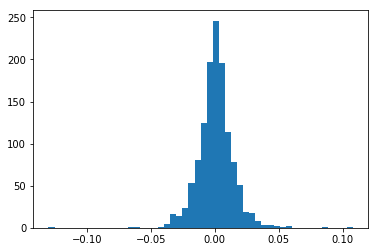

In [18]:
plt.hist(np.log(dados[dados['Name'] == name]['close']/dados[dados['Name'] == name]['close'].shift(1)).values[1:],50)

In [ ]:
np.log(dados[dados['Name'] == name]['close']/dados[dados['Name'] == name]['close'].shift(1)).values[1:]

In [ ]:
h = np.log(dados[dados['Name'] == name]['close']/dados[dados['Name'] == name]['close'].shift(1)).values[1:]
h.sort()
hmean = np.mean(h)
hstd = np.std(h)
pdf = stats.norm.pdf(h, hmean, hstd)
plt.plot(h, pdf) # including h here is crucial
plt.hist(np.log(dados[dados['Name'] == name]['close']/dados[dados['Name'] == name]['close'].shift(1)).values[1:],100)

In [ ]:
import pylab as pl

h = sorted(np.log(dados[dados['Name'] == name]['close']/dados[dados['Name'] == name]['close'].shift(1)).values[1:])  #sorted

fit = stats.norm.pdf(h, np.mean(h), np.std(h))  #this is a fitting indeed

pl.plot(h,fit,'-o')

pl.hist(h,100,normed=True)      #use this to draw histogram of your data

pl.show()                   #use may also need add this 

In [ ]:
f1 = lambda a,x,s,p: a * np.exp((-1/(2*(s**2)))*((x-p)**2))

In [ ]:
mi = min(np.log(dados[dados['Name'] == name]['close']/dados[dados['Name'] == name]['close'].shift(1)).values[1:])

In [ ]:
ma = max(np.log(dados[dados['Name'] == name]['close']/dados[dados['Name'] == name]['close'].shift(1)).values[1:])

In [ ]:
m = np.log(dados[dados['Name'] == name]['close']/dados[dados['Name'] == name]['close'].shift(1)).values[1:].mean()

In [ ]:
s = np.log(dados[dados['Name'] == name]['close']/dados[dados['Name'] == name]['close'].shift(1)).values[1:].std()

In [ ]:
x = np.linspace(mi, ma, 100)
plt.plot(x, f1(1,x,s,m))

In [ ]:
import numpy as np
from scipy.stats import norm
from matplotlib import pyplot as plt

from astroML.plotting import setup_text_plots
setup_text_plots(fontsize=8, usetex=True)

In [37]:
name = 'NVDA'
name

'NVDA'

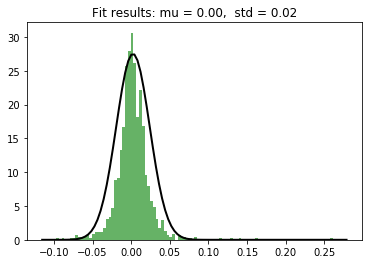

In [38]:
import numpy as np
from scipy.stats import norm

data = norm.rvs(10.0, 2.5, size=500)
data = np.log(dados[dados['Name'] == name]['close']/dados[dados['Name'] == name]['close'].shift(1)).values[1:]

mu, std = norm.fit(data)
mu, std = (data.mean(), data.std())

plt.hist(data, bins=100, density=True, alpha=0.6, color='g')

xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, 1.5*p, 'k', linewidth=2)
title = "Fit results: mu = %.2f,  std = %.2f" % (mu, std)
plt.title(title)

plt.show()

In [ ]:
!pip install latex

array([  5.97338993e-02,   5.48756397e-01,   9.53741080e-01,
         3.80350810e-01,   5.78910903e-01,   7.74832229e-01,
         9.68568571e-01,   3.25785544e-01,   6.28002218e-01,
         6.29633281e-01,   8.24815995e-01,   1.23185503e-01,
         8.55077970e-01,   5.75298434e-01,   4.17833657e-01,
         8.46687942e-01,   2.29277183e-01,   3.60846236e-01,
         2.58088060e-01,   6.25546519e-01,   4.93188466e-01,
         5.15150542e-01,   9.44019257e-01,   1.97841727e-01,
         7.84497958e-01,   1.20281520e-01,   9.32581394e-01,
         9.41455800e-01,   3.92620721e-01,   4.65289278e-01,
         7.76728306e-01,   6.17465479e-01,   5.85558545e-01,
         3.00619320e-01,   2.41879444e-01,   9.11378859e-01,
         2.05734565e-01,   4.51636299e-01,   2.31569245e-01,
         7.70886730e-01,   7.16391723e-01,   3.21174705e-01,
         6.77186489e-01,   2.32002800e-01,   8.70481122e-01,
         4.32217362e-01,   7.60215804e-01,   8.46178636e-01,
         2.31185714e-01,

In [26]:
from scipy.ndimage.interpolation import shift
aleatorios2 = shift(aleatorios, 1, cval=np.NaN)

(array([   1.,    0.,    1.,    0.,    1.,    1.,    1.,    3.,    4.,
           4.,    7.,    5.,    8.,   10.,    4.,   16.,   15.,   18.,
          28.,   34.,   43.,   65.,   79.,  110.,  120.,  107.,   70.,
          60.,   44.,   29.,   24.,   19.,   20.,    5.,    7.,    8.,
           6.,    5.,    2.,    3.,    5.,    3.,    1.,    1.,    0.,
           1.,    0.,    0.,    0.,    1.]),
 array([-6.56493127, -6.29454813, -6.02416499, -5.75378186, -5.48339872,
        -5.21301558, -4.94263244, -4.6722493 , -4.40186616, -4.13148302,
        -3.86109988, -3.59071674, -3.3203336 , -3.04995046, -2.77956732,
        -2.50918418, -2.23880104, -1.9684179 , -1.69803476, -1.42765162,
        -1.15726848, -0.88688534, -0.6165022 , -0.34611906, -0.07573592,
         0.19464722,  0.46503036,  0.7354135 ,  1.00579664,  1.27617978,
         1.54656292,  1.81694606,  2.0873292 ,  2.35771234,  2.62809548,
         2.89847862,  3.16886175,  3.43924489,  3.70962803,  3.98001117,
         4.25039

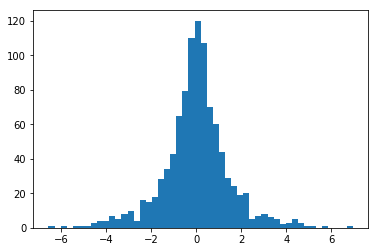

In [27]:
plt.hist(np.log(aleatorios/aleatorios2)[1:],50)

In [90]:
np.random.seed(1)
aleatorios = np.random.rand(10)
aleatorios

array([  4.17022005e-01,   7.20324493e-01,   1.14374817e-04,
         3.02332573e-01,   1.46755891e-01,   9.23385948e-02,
         1.86260211e-01,   3.45560727e-01,   3.96767474e-01,
         5.38816734e-01])

In [384]:
log_retorno_ret_usa.mean()

NVDA    0.002319
NFLX    0.001849
ALGN    0.001565
EA      0.001556
STZ     0.001515
AVGO    0.001514
dtype: float64

In [460]:
yAcumulado

4.2655856624662647e-10

In [462]:
Y_calculo[:3]

array([[  9.83964994e-02,  -1.38777878e-17,   0.00000000e+00, ...,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00],
       [  1.53876262e-01,   1.10959526e-01,  -5.55111512e-17, ...,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00],
       [  1.13755538e-01,   3.07180773e-02,  -1.20362173e-01, ...,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00]])

In [470]:
pd.DataFrame(Y_calculo).head(7000)

,0,1,2,3,4,5,6,7,8,9,...,9990,9991,9992,9993,9994,9995,9996,9997,9998,9999
0,0.098396,-1.387779e-17,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.153876,1.109595e-01,-5.551115e-17,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.113756,3.071808e-02,-1.203622e-01,-1.387779e-17,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.117117,3.744184e-02,-1.102765e-01,1.344753e-02,1.387779e-16,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.096404,-3.985159e-03,-1.724170e-01,-6.940647e-02,-1.035675e-01,3.608225e-16,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.115197,3.360146e-02,-1.160371e-01,5.766762e-03,-9.600963e-03,1.127599e-01,4.857226e-16,0.000000e+00,0.000000e+00,0.000000e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.126628,5.646275e-02,-8.174516e-02,5.148935e-02,4.755227e-02,1.813437e-01,8.001453e-02,6.106227e-16,0.000000e+00,0.000000e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.123573,5.035388e-02,-9.090846e-02,3.927161e-02,3.228010e-02,1.630171e-01,5.863349e-02,-2.443548e-02,8.881784e-16,0.000000e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.127856,5.891856e-02,-7.806144e-02,5.640097e-02,5.369180e-02,1.887112e-01,8.860987e-02,9.823244e-03,3.854106e-02,1.165734e-15,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.122456,4.811936e-02,-9.426025e-02,3.480256e-02,2.669378e-02,1.563135e-01,5.081265e-02,-3.337358e-02,-1.005537e-02,-5.399603e-02,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
serie1 = np.array([0,12,10,8,6,4,2,4,6,8,6,4,2,1,2,4,6,8,6,8,10,8,6,2,4,6,8,10,10,12,10,8,4], dtype="float")
hurst(serie1)

In [842]:
ris_usa.isnull().any().any()

False

In [843]:
ret_usa.isnull().any().any()

False

In [904]:
serie1 = np.array([[0,12,10,8,6,4,2,4,6,8,6,4,2,1,2,4,6,8,6,8,10,8,6,2,4,6,8,10,10,12,10,8,4],
                   [0,12,10,8,6,4,2,4,6,8,6,4,2,1,2,4,6,8,6,8,10,8,6,2,4,6,8,10,10,12,10,8,4]],dtype="float")

In [900]:
serie1[serie1 == 0] = 0.1
serie1

array([[  0.1,  12. ,  10. ,   8. ,   6. ,   4. ,   2. ,   4. ,   6. ,
          8. ,   6. ,   4. ,   2. ,   1. ,   2. ,   4. ,   6. ,   8. ,
          6. ,   8. ,  10. ,   8. ,   6. ,   2. ,   4. ,   6. ,   8. ,
         10. ,  10. ,  12. ,  10. ,   8. ,   4. ],
       [  0.1,  12. ,  10. ,   8. ,   6. ,   4. ,   2. ,   4. ,   6. ,
          8. ,   6. ,   4. ,   2. ,   1. ,   2. ,   4. ,   6. ,   8. ,
          6. ,   8. ,  10. ,   8. ,   6. ,   2. ,   4. ,   6. ,   8. ,
         10. ,  10. ,  12. ,  10. ,   8. ,   4. ]])

In [906]:
np.maximum(serie1, 0.1, serie1)
serie1

array([[  0.1,  12. ,  10. ,   8. ,   6. ,   4. ,   2. ,   4. ,   6. ,
          8. ,   6. ,   4. ,   2. ,   1. ,   2. ,   4. ,   6. ,   8. ,
          6. ,   8. ,  10. ,   8. ,   6. ,   2. ,   4. ,   6. ,   8. ,
         10. ,  10. ,  12. ,  10. ,   8. ,   4. ],
       [  0.1,  12. ,  10. ,   8. ,   6. ,   4. ,   2. ,   4. ,   6. ,
          8. ,   6. ,   4. ,   2. ,   1. ,   2. ,   4. ,   6. ,   8. ,
          6. ,   8. ,  10. ,   8. ,   6. ,   2. ,   4. ,   6. ,   8. ,
         10. ,  10. ,  12. ,  10. ,   8. ,   4. ]])

In [905]:
serie1

array([[  0.,  12.,  10.,   8.,   6.,   4.,   2.,   4.,   6.,   8.,   6.,
          4.,   2.,   1.,   2.,   4.,   6.,   8.,   6.,   8.,  10.,   8.,
          6.,   2.,   4.,   6.,   8.,  10.,  10.,  12.,  10.,   8.,   4.],
       [  0.,  12.,  10.,   8.,   6.,   4.,   2.,   4.,   6.,   8.,   6.,
          4.,   2.,   1.,   2.,   4.,   6.,   8.,   6.,   8.,  10.,   8.,
          6.,   2.,   4.,   6.,   8.,  10.,  10.,  12.,  10.,   8.,   4.]])

In [218]:
ret_usa

,NVDA,NFLX,ALGN,EA,STZ,AVGO
2013-02-08,12.37,25.85,32.73,17.37,31.85,35.32
2013-02-11,12.51,25.41,33.03,17.41,31.32,35.40
2013-02-12,12.43,25.42,33.02,17.54,31.49,35.14
2013-02-13,12.37,26.61,32.75,17.17,31.88,35.17
2013-02-14,12.73,26.77,32.56,17.15,43.75,35.64
2013-02-15,12.73,27.07,32.73,16.97,43.39,35.14
2013-02-19,12.55,28.06,32.60,17.59,43.28,35.55
2013-02-20,12.38,26.73,31.73,17.48,41.80,34.67
2013-02-21,12.29,26.74,31.41,17.64,42.96,33.67
2013-02-22,12.52,25.69,31.88,17.81,43.96,34.09


In [222]:
j = 0
ris_usa.loc[df_final['Data Fim'].iloc[j]]

AMZN    260.16
GOOGL   436.18
MTD     223.41
AZO     415.33
CMG     367.45
EQIX    221.87
Name: 2013-05-09, dtype: float64

In [223]:
df_final.iloc[j,4:-1]

AMZN       0.01
GOOGL      0.36
MTD        0.02
AZO        0.21
CMG        0.40
EQIX       0.01
Coef_Var   0.42
Name: 0, dtype: object

In [224]:
ris_usa.loc[df_final['Data Fim'].iloc[j+1]]

AMZN    295.74
GOOGL   446.78
MTD     228.50
AZO     429.02
CMG     407.90
EQIX    181.28
Name: 2013-08-08, dtype: float64

In [225]:
ris_usa

,AMZN,GOOGL,MTD,AZO,CMG,EQIX
2013-02-08,261.95,393.08,221.15,385.89,320.72,219.71
2013-02-11,257.21,391.60,219.37,385.23,323.56,218.03
2013-02-12,258.70,390.74,217.99,382.09,322.51,214.53
2013-02-13,269.47,391.82,218.94,379.73,317.01,213.02
2013-02-14,269.24,394.30,217.75,373.61,317.72,226.00
2013-02-15,265.09,396.84,215.14,373.70,314.19,224.53
2013-02-19,269.75,403.83,217.15,375.21,313.05,221.08
2013-02-20,266.41,396.63,214.67,379.96,309.49,215.62
2013-02-21,265.94,398.16,212.80,377.56,308.13,214.01
2013-02-22,265.42,400.25,212.59,385.20,315.51,214.21


In [226]:
df_final['Data Fim']

0     2013-05-09
1     2013-08-08
2     2013-11-06
3     2014-02-07
4     2014-05-09
5     2014-08-08
6     2014-11-06
7     2015-02-09
8     2015-05-11
9     2015-08-10
10    2015-11-06
11    2016-02-09
12    2016-05-10
13    2016-08-09
14    2016-11-07
15    2017-02-08
16    2017-05-10
17    2017-08-09
18    2017-11-07
19    2018-02-07
Name: Data Fim, dtype: object

In [289]:
df_final2['Montante']

,Data Inicio,Data Fim,Risco,Retorno,NVDA,NFLX,ALGN,EA,STZ,AVGO,Montante
0,2013-02-08,2013-05-09,0.20,0.44,0.54,0.00,0.17,0.10,0.04,0.15,100000.00
1,2013-05-10,2013-08-08,0.16,0.45,0.33,0.02,0.16,0.03,0.38,0.08,107683.16
2,2013-08-09,2013-11-06,0.13,0.38,0.46,0.00,0.00,0.07,0.24,0.23,125537.52
3,2013-11-07,2014-02-07,0.18,0.53,0.27,0.15,0.01,0.16,0.31,0.10,145336.46
4,2014-02-10,2014-05-09,0.16,0.36,0.28,0.00,0.06,0.13,0.42,0.12,156826.46
5,2014-05-12,2014-08-08,0.14,0.30,0.15,0.07,0.05,0.05,0.61,0.07,161656.98
6,2014-08-11,2014-11-06,0.17,0.31,0.39,0.02,0.07,0.04,0.47,0.01,174973.55
7,2014-11-07,2015-02-09,0.17,0.58,0.13,0.05,0.22,0.18,0.41,0.01,196820.62
8,2015-02-10,2015-05-11,0.15,0.32,0.13,0.05,0.22,0.18,0.41,0.01,210380.55
9,2015-05-12,2015-08-10,0.13,0.36,0.13,0.00,0.07,0.22,0.50,0.07,235116.73


Text(0.5,1,'EUA - Maiores Retornos')

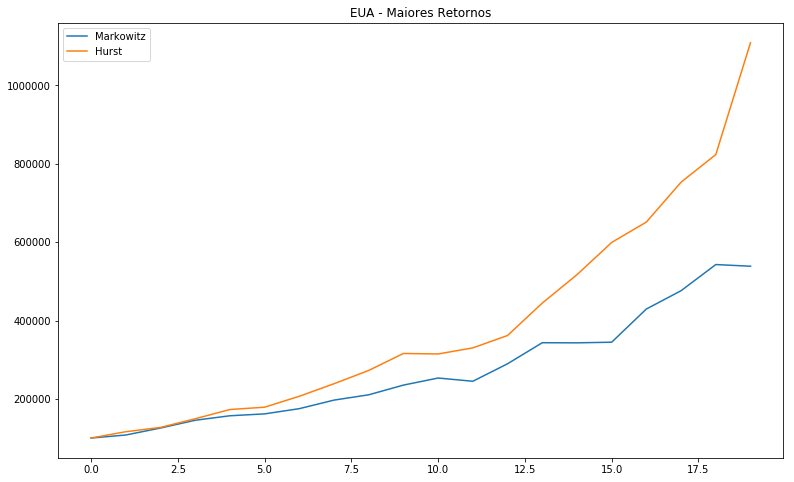

In [297]:
df_final2['Montante'].plot(figsize=(13, 8))
df_teste.reset_index()['Montante'].plot(figsize=(13, 8))
plt.legend(['Markowitz', 'Hurst'])
plt.title('EUA - Maiores Retornos')

Text(0.5,1,'EUA - Maiores Riscos')

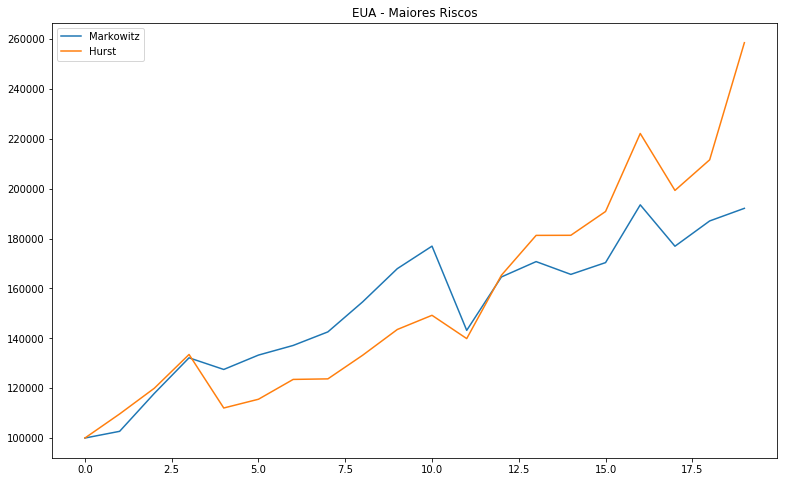

In [298]:
df_final['Montante'].plot(figsize=(13, 8))
df_teste2.reset_index()['Montante'].plot(figsize=(13, 8))
plt.legend(['Markowitz', 'Hurst'])
plt.title('EUA - Maiores Riscos')

In [299]:
df_final2

,Data Inicio,Data Fim,Risco,Retorno,NVDA,NFLX,ALGN,EA,STZ,AVGO,Montante
0,2013-02-08,2013-05-09,0.20,0.44,0.54,0.00,0.17,0.10,0.04,0.15,100000.00
1,2013-05-10,2013-08-08,0.16,0.45,0.33,0.02,0.16,0.03,0.38,0.08,107683.16
2,2013-08-09,2013-11-06,0.13,0.38,0.46,0.00,0.00,0.07,0.24,0.23,125537.52
3,2013-11-07,2014-02-07,0.18,0.53,0.27,0.15,0.01,0.16,0.31,0.10,145336.46
4,2014-02-10,2014-05-09,0.16,0.36,0.28,0.00,0.06,0.13,0.42,0.12,156826.46
5,2014-05-12,2014-08-08,0.14,0.30,0.15,0.07,0.05,0.05,0.61,0.07,161656.98
6,2014-08-11,2014-11-06,0.17,0.31,0.39,0.02,0.07,0.04,0.47,0.01,174973.55
7,2014-11-07,2015-02-09,0.17,0.58,0.13,0.05,0.22,0.18,0.41,0.01,196820.62
8,2015-02-10,2015-05-11,0.15,0.32,0.13,0.05,0.22,0.18,0.41,0.01,210380.55
9,2015-05-12,2015-08-10,0.13,0.36,0.13,0.00,0.07,0.22,0.50,0.07,235116.73


In [300]:
df_final

,Data Inicio,Data Fim,Risco,Retorno,AMZN,GOOGL,MTD,AZO,CMG,EQIX,Montante
0,2013-02-08,2013-05-09,0.14,0.33,0.03,0.39,0.04,0.45,0.05,0.04,100000.00
1,2013-05-10,2013-08-08,0.13,0.14,0.07,0.40,0.02,0.22,0.22,0.07,102690.59
2,2013-08-09,2013-11-06,0.13,0.20,0.05,0.03,0.32,0.44,0.03,0.14,117908.82
3,2013-11-07,2014-02-07,0.16,0.47,0.07,0.12,0.00,0.36,0.21,0.23,132166.49
4,2014-02-10,2014-05-09,0.14,-0.09,0.05,0.05,0.17,0.49,0.04,0.20,127495.51
5,2014-05-12,2014-08-08,0.10,0.26,0.00,0.02,0.37,0.24,0.02,0.35,133259.39
6,2014-08-11,2014-11-06,0.13,0.05,0.04,0.28,0.01,0.46,0.19,0.02,137124.42
7,2014-11-07,2015-02-09,0.15,0.15,0.00,0.24,0.07,0.46,0.11,0.12,142561.70
8,2015-02-10,2015-05-11,0.12,0.32,0.00,0.16,0.27,0.28,0.12,0.16,154574.35
9,2015-05-12,2015-08-10,0.11,0.25,0.01,0.02,0.11,0.43,0.09,0.35,167910.48


In [301]:
df_teste

,ALGN,AVGO,EA,NFLX,NVDA,STZ,Montante
index,,,,,,,
0,0.00,1.00,0.00,0.00,0.00,0.00,100000.00
63,1.00,0.00,0.00,0.00,0.00,1.00,116103.36
126,0.00,0.00,0.00,0.00,1.00,0.00,127089.20
189,0.00,0.00,1.00,1.00,0.00,1.00,149196.72
252,0.00,0.00,1.00,1.00,1.00,1.00,172778.81
315,0.00,0.00,0.00,1.00,1.00,1.00,178694.10
378,1.00,1.00,1.00,0.00,1.00,1.00,206584.02
441,1.00,1.00,0.00,1.00,0.00,1.00,238603.99
504,1.00,0.00,0.00,1.00,0.00,0.00,272558.25


In [302]:
df_teste2

,AMZN,AZO,CMG,EQIX,GOOGL,MTD,Montante
index,,,,,,,
0,0.00,0.00,0.00,0.00,1.00,0.00,100000.00
63,1.00,0.00,0.00,1.00,0.00,1.00,109656.50
126,0.00,0.00,1.00,1.00,0.00,0.00,119970.37
189,1.00,0.00,0.00,0.00,0.00,0.00,133502.40
252,1.00,0.00,1.00,1.00,0.00,0.00,112041.83
315,0.00,0.00,1.00,0.00,0.00,0.00,115555.01
378,0.00,1.00,0.00,0.00,1.00,1.00,123502.69
441,1.00,1.00,0.00,0.00,0.00,1.00,123720.19
504,0.00,0.00,0.00,0.00,0.00,1.00,133179.69


In [305]:
df['Name'].values

array(['AAL', 'AAPL', 'AAP', 'ABBV', 'ABC', 'ABT', 'ACN', 'ADBE', 'ADI',
       'ADM', 'ADP', 'ADSK', 'ADS', 'AEE', 'AEP', 'AES', 'AET', 'AFL',
       'AGN', 'AIG', 'AIV', 'AIZ', 'AJG', 'AKAM', 'ALB', 'ALGN', 'ALK',
       'ALLE', 'ALL', 'ALXN', 'AMAT', 'AMD', 'AME', 'AMGN', 'AMG', 'AMP',
       'AMT', 'AMZN', 'ANDV', 'ANSS', 'ANTM', 'AON', 'AOS', 'APA', 'APC',
       'APD', 'APH', 'APTV', 'ARE', 'ARNC', 'ATVI', 'AVB', 'AVGO', 'AVY',
       'AWK', 'AXP', 'AYI', 'AZO', 'A', 'BAC', 'BAX', 'BA', 'BBT', 'BBY',
       'BDX', 'BEN', 'BF.B', 'BHF', 'BHGE', 'BIIB', 'BK', 'BLK', 'BLL',
       'BMY', 'BRK.B', 'BSX', 'BWA', 'BXP', 'CAG', 'CAH', 'CAT', 'CA',
       'CBG', 'CBOE', 'CBS', 'CB', 'CCI', 'CCL', 'CDNS', 'CELG', 'CERN',
       'CFG', 'CF', 'CHD', 'CHK', 'CHRW', 'CHTR', 'CINF', 'CI', 'CLX',
       'CL', 'CMA', 'CMCSA', 'CME', 'CMG', 'CMI', 'CMS', 'CNC', 'CNP',
       'COF', 'COG', 'COL', 'COO', 'COP', 'COST', 'COTY', 'CPB', 'CRM',
       'CSCO', 'CSRA', 'CSX', 'CTAS', 'CTL', 'CTSH', 'CTXS

In [ ]:



    
    



Monte Carlo - Destaca-se a carteira com o menor risco



No final retirar; Com isso a serie de desvios..

ADD TCC HURST

Em teoria do Mercado Fractal depois da citacao de Cova arrumar 'chamada' e arrumar Peters


Em Hipótese: Depois do verde grifado
    
    o preco de todas as acoes do Ibovespa de 05 de janeiro de 2009 até 30 de novembro de 2017 e o preco de todas as 
    acoes do SP 500 de 08 de fevereiro de 2013 até 7 de fevereiro de 2018. 
    

Em sfotware add
    adicionar Github www.github.com/caiosalgado
    
    
Depois do Grafico- 

    Por hora, Mostra-se que a carteira selecionada dentro das 10 mil simulacoes feitas pelo algoritmo de Monte Carlo 
    sera a de menor variancia